# Preliminaries

Let us examine what we have, i.e., the FMU model and input data. 

In [1]:
from fmpy import dump

In [2]:
dump('AC_Quadcopter_Simulation_v3.fmu')


Model Info

  FMI Version       2.0
  FMI Type          Co-Simulation
  Model Name        AC_Quadcopter_Simulation
  Description       
  Platforms         darwin64, linux64, win64
  Continuous States 0
  Event Indicators  0
  Variables         17
  Generation Tool   Simulink (R2020b)
  Generation Date   2020-12-07T21:03:49Z

Default Experiment

  Step Size         0.02

Variables (input, output)

Name                Causality              Start Value  Unit     Description
Phi_cmd             input                            0           Input Port: Phi_cmd
The_cmd             input                            0           Input Port: The_cmd
Psi_cmd             input                            0           Input Port: Psi_cmd
Alt_cmd             input                            0           Input Port: Alt_cmd
P                   output                                       Output Port: P
Q                   output                                       Output Port: Q
R                   o

At each timestep, the model accepts one input and produced an output vector of four elements. The expected step size is 0.01 seconds.

Example input data is contained in a csv file:  

In [1]:
# read in the raw data
import pandas as pd
data = pd.read_csv("inputs.csv")

In [4]:
data.head()

,time,Phi_cmd,The_cmd,Psi_cmd,Alt_cmd
0,0.00,0.0,0,0,3.048
1,0.02,0.0,0,0,3.048
2,0.04,0.0,0,0,3.048
3,0.06,0.0,0,0,3.048
4,0.08,0.0,0,0,3.048


In [5]:
len(data)

2501

In [61]:
from matplotlib import pyplot as plt

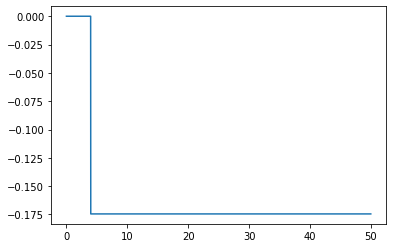

In [7]:
plt.plot(data["time"], data["Phi_cmd"])

The input data is essentially a stair function (Clutch engaged / disengaged?)

Let's check the mean time step

In [8]:
data["time"].diff().mean()

0.02

The mean step should be in good accordance with what the model expects

## Receive loop

Using the MQTT experiment class, a broker will be started and one subscriber will be subscribing to the sample messages arriving from the measurements publisher.

## Model loop

The FMU model is wrapped with a corresponding ModelConductor component, thereafter operating on a 'pull' manner. Whenever a previously unseen datapoint is identified as a result of database poll operation, it is relayed to the corresponding ModelHandler component  

In [9]:
from modelconductor.modelhandler import FMUModelHandler

Within ModelConductor, all data that is to be exchanged from one data source / data consumer to another, is asserted to exists in one of two possible formats: 

i) A Measurement object that denotes a timestamped data structure that is received from a physical asset, best understood as a snapshot of the asset’s state at a given time or

ii) a ModelResponse object that similarly denotes a timestamped data structure that is received from a digital asset, a snapshot of the model’s virtual state at a given time 

A variable (a key) may, but is not required to belong to one or more of the following categories:

1) Input keys: The subset of keys in Measurement object corresponding to the keys that are expected as  inputs by the relevant ModelHandler

2) Target keys: The keys that are expected to be output from a ModelHandler instance onto a ModelResponse object

3) Control keys: A subset of keys in Measurement that is not intended to be used as an input to a ModelHandler, but rather as a validation variable against the ModelHandler output

4) Timestamp key: A key denoting the instant when the relevant Measurement or ModelResponce instance was created.


In [10]:
target_keys = ["P", "Q", "R", "Phi", "The", "Psi",
               "X", "Y", "Z", "RPM1", "RPM2", "RPM3", "RPM4"]
input_keys = ["Phi_cmd", "The_cmd", "Psi_cmd", "Alt_cmd"]
control_keys = ["time"]
timestamp_key = "time"

Now the ModelHandler object can be instantiated:

In [11]:
model=FMUModelHandler(
    fmu_path='AC_Quadcopter_Simulation_v3.fmu',
    start_time=0,
    stop_time=1000,
    step_size=0.02,
    target_keys=target_keys,
    input_keys=input_keys,
    control_keys=control_keys,
    timestamp_key=timestamp_key)

## The experiment
The experiment object will use the model inside its subscriber. The broker will start for listening to new measurements from publishers and the subscriber will be listening for new measurements which comes from the broker.

In [12]:
import asyncio
import nest_asyncio
nest_asyncio.apply()

from modelconductor.experiment_mqtt import MqttExperiment

In [13]:
ex = MqttExperiment()
ex.model = model
headers = ["timestamp"]
if input_keys:
    headers += input_keys
if target_keys:
    headers += target_keys
if control_keys:
    headers += control_keys
ex.logger = ex.initiate_logging(headers=headers,
                                    path=ex.log_path)

## Run
Run the receiving loop. When it succeeded starting run the client on another process with this command:
```bash
python client_mqtt.py
```

In [14]:
ex.run()

running execute_model_loop!
<class 'modelconductor.modelhandler.FMUModelHandler'>
<class 'type'>


[2020-12-08 12:39:11,503] :: INFO - Finished processing state new exit callbacks.
[2020-12-08 12:39:11,504] :: INFO - Finished processing state connected enter callbacks.


[OK] %s
{'time': 0.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423980.3274965}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.999867520712224, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 3912.6310374471605, 'RPM2': 3912.6310374471605, 'RPM3': 3912.6310374471605, 'RPM4': 3912.6310374471605, 'time': 0.0}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.999867520712224, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 3912.6310374471605, 'RPM2': 3912.6310374471605, 'RPM3': 3912.6310374471605, 'RPM4': 3912.6310374471605, 'time': 0.0, 'TIMING_model_response_timestamp': 1607423980.4087026}
{'time': 0.02, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423980.34046

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9858562865769445, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4121.362505878004, 'RPM2': 4121.362505878004, 'RPM3': 4121.362505878004, 'RPM4': 4121.362505878004, 'time': 0.24}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9858562865769445, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4121.362505878004, 'RPM2': 4121.362505878004, 'RPM3': 4121.362505878004, 'RPM4': 4121.362505878004, 'time': 0.24, 'TIMING_model_response_timestamp': 1607423980.7282908}
{'time': 0.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423980.670484}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 0.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423980.9124603}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.974109568018481, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4130.415283607389, 'RPM2': 4130.415283607389, 'RPM3': 4130.415283607389, 'RPM4': 4130.415283607389, 'time': 0.44}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.974109568018481, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4130.415283607389, 'RPM2': 4130.415283607389, 'RPM3': 4130.415283607389, 'RPM4': 4130.415283607389, 'time': 0.44, 'TIMING_model_response_timestamp': 1607423980.9214153}
{'time': 0.46, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423980.937045}
stepping:


{'time': 0.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423981.327968}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9637748440663274, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4126.894100683577, 'RPM2': 4126.894100683577, 'RPM3': 4126.894100683577, 'RPM4': 4126.894100683577, 'time': 0.76}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9637748440663274, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4126.894100683577, 'RPM2': 4126.894100683577, 'RPM3': 4126.894100683577, 'RPM4': 4126.894100683577, 'time': 0.76, 'TIMING_model_response_timestamp': 1607423981.493511}
{'time': 0.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423981.3488996}
stepping:

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.962191263530054, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4123.432468865553, 'RPM2': 4123.432468865553, 'RPM3': 4123.432468865553, 'RPM4': 4123.432468865553, 'time': 1.02}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.962191263530054, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4123.432468865553, 'RPM2': 4123.432468865553, 'RPM3': 4123.432468865553, 'RPM4': 4123.432468865553, 'time': 1.02, 'TIMING_model_response_timestamp': 1607423981.7229795}
{'time': 1.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423981.7339585}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z':

{'time': 1.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423982.1420982}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.965948050807973, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4120.01792728227, 'RPM2': 4120.01792728227, 'RPM3': 4120.01792728227, 'RPM4': 4120.01792728227, 'time': 1.3}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.965948050807973, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4120.01792728227, 'RPM2': 4120.01792728227, 'RPM3': 4120.01792728227, 'RPM4': 4120.01792728227, 'time': 1.3, 'TIMING_model_response_timestamp': 1607423982.1540706}
{'time': 1.32, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423982.158098}
stepping:
[0.0, 0.0, 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9727261846035358, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4117.339266440984, 'RPM2': 4117.339266440984, 'RPM3': 4117.339266440984, 'RPM4': 4117.339266440984, 'time': 1.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9727261846035358, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4117.339266440984, 'RPM2': 4117.339266440984, 'RPM3': 4117.339266440984, 'RPM4': 4117.339266440984, 'time': 1.54, 'TIMING_model_response_timestamp': 1607423982.528095}
{'time': 1.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423982.5500705}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 1.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423982.8921902}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9820055100164344, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4114.875590888721, 'RPM2': 4114.875590888721, 'RPM3': 4114.875590888721, 'RPM4': 4114.875590888721, 'time': 1.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.9820055100164344, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4114.875590888721, 'RPM2': 4114.875590888721, 'RPM3': 4114.875590888721, 'RPM4': 4114.875590888721, 'time': 1.78, 'TIMING_model_response_timestamp': 1607423983.0248356}
{'time': 1.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423982.9121747}
stepping

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.994094110757205, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4112.444610857211, 'RPM2': 4112.444610857211, 'RPM3': 4112.444610857211, 'RPM4': 4112.444610857211, 'time': 2.04}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 2.994094110757205, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4112.444610857211, 'RPM2': 4112.444610857211, 'RPM3': 4112.444610857211, 'RPM4': 4112.444610857211, 'time': 2.04, 'TIMING_model_response_timestamp': 1607423983.2733417}
{'time': 2.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423983.283356}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0064702602039004, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.422333671143, 'RPM2': 4110.422333671143, 'RPM3': 4110.422333671143, 'RPM4': 4110.422333671143, 'time': 2.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0064702602039004, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.422333671143, 'RPM2': 4110.422333671143, 'RPM3': 4110.422333671143, 'RPM4': 4110.422333671143, 'time': 2.28, 'TIMING_model_response_timestamp': 1607423983.957798}
{'time': 2.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423983.6730347}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z':

{'time': 2.58, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423984.0983963}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0227178765886373, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.201352571532, 'RPM2': 4108.201352571532, 'RPM3': 4108.201352571532, 'RPM4': 4108.201352571532, 'time': 2.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0227178765886373, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.201352571532, 'RPM2': 4108.201352571532, 'RPM3': 4108.201352571532, 'RPM4': 4108.201352571532, 'time': 2.58, 'TIMING_model_response_timestamp': 1607423984.1592278}
{'time': 2.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423984.1283438}
stepping

{'time': 2.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423984.4664474}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.034667918085722, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.794938412778, 'RPM2': 4106.794938412778, 'RPM3': 4106.794938412778, 'RPM4': 4106.794938412778, 'time': 2.8}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.034667918085722, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.794938412778, 'RPM2': 4106.794938412778, 'RPM3': 4106.794938412778, 'RPM4': 4106.794938412778, 'time': 2.8, 'TIMING_model_response_timestamp': 1607423985.2758052}
{'time': 2.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423984.4943712}
stepping:
[0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048330668891868, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4105.380103687423, 'RPM2': 4105.380103687423, 'RPM3': 4105.380103687423, 'RPM4': 4105.380103687423, 'time': 3.06}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048330668891868, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4105.380103687423, 'RPM2': 4105.380103687423, 'RPM3': 4105.380103687423, 'RPM4': 4105.380103687423, 'time': 3.06, 'TIMING_model_response_timestamp': 1607423986.2541635}
{'time': 3.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423984.8843334}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z':

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0656345469679374, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.8660709263295, 'RPM2': 4103.8660709263295, 'RPM3': 4103.8660709263295, 'RPM4': 4103.8660709263295, 'time': 3.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0656345469679374, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.8660709263295, 'RPM2': 4103.8660709263295, 'RPM3': 4103.8660709263295, 'RPM4': 4103.8660709263295, 'time': 3.42, 'TIMING_model_response_timestamp': 1607423986.6291666}
{'time': 3.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423985.4788084}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y':

{'time': 3.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423985.85925}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0780189556503506, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.993441491418, 'RPM2': 4102.993441491418, 'RPM3': 4102.993441491418, 'RPM4': 4102.993441491418, 'time': 3.72}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0780189556503506, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.993441491418, 'RPM2': 4102.993441491418, 'RPM3': 4102.993441491418, 'RPM4': 4102.993441491418, 'time': 3.72, 'TIMING_model_response_timestamp': 1607423987.019928}
{'time': 3.74, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423985.8871455}
stepping:


Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0887328513273173, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.435833336539, 'RPM2': 4102.435833336539, 'RPM3': 4102.435833336539, 'RPM4': 4102.435833336539, 'time': 4.04}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0887328513273173, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.435833336539, 'RPM2': 4102.435833336539, 'RPM3': 4102.435833336539, 'RPM4': 4102.435833336539, 'time': 4.04, 'TIMING_model_response_timestamp': 1607423987.3769941}
{'time': 4.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423986.315}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.094911658909512, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.254359324213, 'RPM2': 4102.254359324213, 'RPM3': 4102.254359324213, 'RPM4': 4102.254359324213, 'time': 4.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.094911658909512, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.254359324213, 'RPM2': 4102.254359324213, 'RPM3': 4102.254359324213, 'RPM4': 4102.254359324213, 'time': 4.28, 'TIMING_model_response_timestamp': 1607423987.568483}
{'time': 4.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423986.6012404}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0994382013209894, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.258895074727, 'RPM2': 4102.258895074727, 'RPM3': 4102.258895074727, 'RPM4': 4102.258895074727, 'time': 4.52}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0994382013209894, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.258895074727, 'RPM2': 4102.258895074727, 'RPM3': 4102.258895074727, 'RPM4': 4102.258895074727, 'time': 4.52, 'TIMING_model_response_timestamp': 1607423987.7559798}
{'time': 4.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423986.9197092}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.102479515279365, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.452536773668, 'RPM2': 4102.452536773668, 'RPM3': 4102.452536773668, 'RPM4': 4102.452536773668, 'time': 4.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.102479515279365, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.452536773668, 'RPM2': 4102.452536773668, 'RPM3': 4102.452536773668, 'RPM4': 4102.452536773668, 'time': 4.78, 'TIMING_model_response_timestamp': 1607423987.9479775}
{'time': 4.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423987.2723076}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.103619778214136, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.7835202424585, 'RPM2': 4102.7835202424585, 'RPM3': 4102.7835202424585, 'RPM4': 4102.7835202424585, 'time': 5.02}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.103619778214136, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4102.7835202424585, 'RPM2': 4102.7835202424585, 'RPM3': 4102.7835202424585, 'RPM4': 4102.7835202424585, 'time': 5.02, 'TIMING_model_response_timestamp': 1607423988.12701}
{'time': 5.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423987.667218}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.1031566764045753, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.280536126059, 'RPM2': 4103.280536126059, 'RPM3': 4103.280536126059, 'RPM4': 4103.280536126059, 'time': 5.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.1031566764045753, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.280536126059, 'RPM2': 4103.280536126059, 'RPM3': 4103.280536126059, 'RPM4': 4103.280536126059, 'time': 5.28, 'TIMING_model_response_timestamp': 1607423988.320498}
{'time': 5.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423988.0093281}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z':

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.101083514261828, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.892684296984, 'RPM2': 4103.892684296984, 'RPM3': 4103.892684296984, 'RPM4': 4103.892684296984, 'time': 5.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.101083514261828, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4103.892684296984, 'RPM2': 4103.892684296984, 'RPM3': 4103.892684296984, 'RPM4': 4103.892684296984, 'time': 5.54, 'TIMING_model_response_timestamp': 1607423988.512927}
{'time': 5.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423988.4326527}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0982166219395992, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4104.478266118258, 'RPM2': 4104.478266118258, 'RPM3': 4104.478266118258, 'RPM4': 4104.478266118258, 'time': 5.76}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0982166219395992, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4104.478266118258, 'RPM2': 4104.478266118258, 'RPM3': 4104.478266118258, 'RPM4': 4104.478266118258, 'time': 5.76, 'TIMING_model_response_timestamp': 1607423988.6893003}
{'time': 5.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423988.7202158}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 6.02, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423989.0631766}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.093708353423201, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4105.224098900538, 'RPM2': 4105.224098900538, 'RPM3': 4105.224098900538, 'RPM4': 4105.224098900538, 'time': 6.02}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.093708353423201, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4105.224098900538, 'RPM2': 4105.224098900538, 'RPM3': 4105.224098900538, 'RPM4': 4105.224098900538, 'time': 6.02, 'TIMING_model_response_timestamp': 1607423989.0761447}
{'time': 6.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423989.0920994}
stepping:

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0882148407890355, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.00088577552, 'RPM2': 4106.00088577552, 'RPM3': 4106.00088577552, 'RPM4': 4106.00088577552, 'time': 6.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0882148407890355, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.00088577552, 'RPM2': 4106.00088577552, 'RPM3': 4106.00088577552, 'RPM4': 4106.00088577552, 'time': 6.28, 'TIMING_model_response_timestamp': 1607423989.4544847}
{'time': 6.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423989.467452}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.08775

{'time': 6.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423989.837195}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.080470862242305, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.959609770889, 'RPM2': 4106.959609770889, 'RPM3': 4106.959609770889, 'RPM4': 4106.959609770889, 'time': 6.6}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.080470862242305, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4106.959609770889, 'RPM2': 4106.959609770889, 'RPM3': 4106.959609770889, 'RPM4': 4106.959609770889, 'time': 6.6, 'TIMING_model_response_timestamp': 1607423989.8601303}
{'time': 6.62, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423989.852153}
stepping:
[0.0

{'time': 6.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.0146537}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0747440656623732, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.5984077076055, 'RPM2': 4107.5984077076055, 'RPM3': 4107.5984077076055, 'RPM4': 4107.5984077076055, 'time': 6.82}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0747440656623732, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.5984077076055, 'RPM2': 4107.5984077076055, 'RPM3': 4107.5984077076055, 'RPM4': 4107.5984077076055, 'time': 6.82, 'TIMING_model_response_timestamp': 1607423990.0515559}
{'time': 6.84, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.0296152}

{'time': 7.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.3482807}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0640255455357988, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.670976344627, 'RPM2': 4108.670976344627, 'RPM3': 4108.670976344627, 'RPM4': 4108.670976344627, 'time': 7.22}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0640255455357988, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.670976344627, 'RPM2': 4108.670976344627, 'RPM3': 4108.670976344627, 'RPM4': 4108.670976344627, 'time': 7.22, 'TIMING_model_response_timestamp': 1607423990.427581}
{'time': 7.24, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.3622494}
stepping

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.05872827674451, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.148088539089, 'RPM2': 4109.148088539089, 'RPM3': 4109.148088539089, 'RPM4': 4109.148088539089, 'time': 7.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.05872827674451, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.148088539089, 'RPM2': 4109.148088539089, 'RPM3': 4109.148088539089, 'RPM4': 4109.148088539089, 'time': 7.42, 'TIMING_model_response_timestamp': 1607423990.597126}
{'time': 7.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.5153444}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.053095611729809, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.617489315753, 'RPM2': 4109.617489315753, 'RPM3': 4109.617489315753, 'RPM4': 4109.617489315753, 'time': 7.64}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.053095611729809, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.617489315753, 'RPM2': 4109.617489315753, 'RPM3': 4109.617489315753, 'RPM4': 4109.617489315753, 'time': 7.64, 'TIMING_model_response_timestamp': 1607423990.7906065}
{'time': 7.66, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.6838927}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z':

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0477713959526196, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.022935734231, 'RPM2': 4110.022935734231, 'RPM3': 4110.022935734231, 'RPM4': 4110.022935734231, 'time': 7.86}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0477713959526196, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.022935734231, 'RPM2': 4110.022935734231, 'RPM3': 4110.022935734231, 'RPM4': 4110.022935734231, 'time': 7.86, 'TIMING_model_response_timestamp': 1607423990.9771423}
{'time': 7.88, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423990.8544662}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 8.12, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.0459597}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0420039747401058, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.413970227034, 'RPM2': 4110.413970227034, 'RPM3': 4110.413970227034, 'RPM4': 4110.413970227034, 'time': 8.12}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0420039747401058, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.413970227034, 'RPM2': 4110.413970227034, 'RPM3': 4110.413970227034, 'RPM4': 4110.413970227034, 'time': 8.12, 'TIMING_model_response_timestamp': 1607423991.1705887}
{'time': 8.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.0589187}
steppin

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.037287807630912, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.687209224701, 'RPM2': 4110.687209224701, 'RPM3': 4110.687209224701, 'RPM4': 4110.687209224701, 'time': 8.36}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.037287807630912, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.687209224701, 'RPM2': 4110.687209224701, 'RPM3': 4110.687209224701, 'RPM4': 4110.687209224701, 'time': 8.36, 'TIMING_model_response_timestamp': 1607423991.3542056}
{'time': 8.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.2364135}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, '

{'time': 8.62, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.4150512}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.032926472265357, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.887759795474, 'RPM2': 4110.887759795474, 'RPM3': 4110.887759795474, 'RPM4': 4110.887759795474, 'time': 8.62}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.032926472265357, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.887759795474, 'RPM2': 4110.887759795474, 'RPM3': 4110.887759795474, 'RPM4': 4110.887759795474, 'time': 8.62, 'TIMING_model_response_timestamp': 1607423991.543669}
{'time': 8.64, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.428977}
stepping:
[

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.029405513230359, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.991534110283, 'RPM2': 4110.991534110283, 'RPM3': 4110.991534110283, 'RPM4': 4110.991534110283, 'time': 8.88}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.029405513230359, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.991534110283, 'RPM2': 4110.991534110283, 'RPM3': 4110.991534110283, 'RPM4': 4110.991534110283, 'time': 8.88, 'TIMING_model_response_timestamp': 1607423991.7287045}
{'time': 8.9, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.6161802}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.026591512218814, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4111.001138833791, 'RPM2': 4111.001138833791, 'RPM3': 4111.001138833791, 'RPM4': 4111.001138833791, 'time': 9.16}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.026591512218814, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4111.001138833791, 'RPM2': 4111.001138833791, 'RPM3': 4111.001138833791, 'RPM4': 4111.001138833791, 'time': 9.16, 'TIMING_model_response_timestamp': 1607423991.911451}
{'time': 9.18, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423991.8227174}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

{'time': 9.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.0128496}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024794654869908, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.914202972454, 'RPM2': 4110.914202972454, 'RPM3': 4110.914202972454, 'RPM4': 4110.914202972454, 'time': 9.44}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024794654869908, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.914202972454, 'RPM2': 4110.914202972454, 'RPM3': 4110.914202972454, 'RPM4': 4110.914202972454, 'time': 9.44, 'TIMING_model_response_timestamp': 1607423992.1102111}
{'time': 9.46, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.0258458}
stepping:

{'time': 9.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.200692}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024009264057591, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.757559430994, 'RPM2': 4110.757559430994, 'RPM3': 4110.757559430994, 'RPM4': 4110.757559430994, 'time': 9.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024009264057591, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.757559430994, 'RPM2': 4110.757559430994, 'RPM3': 4110.757559430994, 'RPM4': 4110.757559430994, 'time': 9.7, 'TIMING_model_response_timestamp': 1607423992.2934656}
{'time': 9.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.2136443}
stepping:
[0.

{'time': 10.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.4111245}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.02409195766928, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.500863051015, 'RPM2': 4110.500863051015, 'RPM3': 4110.500863051015, 'RPM4': 4110.500863051015, 'time': 10.0}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.02409195766928, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.500863051015, 'RPM2': 4110.500863051015, 'RPM3': 4110.500863051015, 'RPM4': 4110.500863051015, 'time': 10.0, 'TIMING_model_response_timestamp': 1607423992.4869463}
{'time': 10.02, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.4231179}
stepping:


Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024850951131908, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.248766550831, 'RPM2': 4110.248766550831, 'RPM3': 4110.248766550831, 'RPM4': 4110.248766550831, 'time': 10.24}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.024850951131908, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4110.248766550831, 'RPM2': 4110.248766550831, 'RPM3': 4110.248766550831, 'RPM4': 4110.248766550831, 'time': 10.24, 'TIMING_model_response_timestamp': 1607423992.664944}
{'time': 10.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.5946224}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0260243615292, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.990296743294, 'RPM2': 4109.990296743294, 'RPM3': 4109.990296743294, 'RPM4': 4109.990296743294, 'time': 10.46}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0260243615292, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.990296743294, 'RPM2': 4109.990296743294, 'RPM3': 4109.990296743294, 'RPM4': 4109.990296743294, 'time': 10.46, 'TIMING_model_response_timestamp': 1607423992.847611}
{'time': 10.48, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423992.8217225}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0277534164138675, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.687648729542, 'RPM2': 4109.687648729542, 'RPM3': 4109.687648729542, 'RPM4': 4109.687648729542, 'time': 10.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0277534164138675, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.687648729542, 'RPM2': 4109.687648729542, 'RPM3': 4109.687648729542, 'RPM4': 4109.687648729542, 'time': 10.7, 'TIMING_model_response_timestamp': 1607423993.0354183}
{'time': 10.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.0005114}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 10.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.1740503}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0300612514403227, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.346286226668, 'RPM2': 4109.346286226668, 'RPM3': 4109.346286226668, 'RPM4': 4109.346286226668, 'time': 10.96}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0300612514403227, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4109.346286226668, 'RPM2': 4109.346286226668, 'RPM3': 4109.346286226668, 'RPM4': 4109.346286226668, 'time': 10.96, 'TIMING_model_response_timestamp': 1607423993.2418957}
{'time': 10.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.189007}
step

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.034246245807979, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.819610580288, 'RPM2': 4108.819610580288, 'RPM3': 4108.819610580288, 'RPM4': 4108.819610580288, 'time': 11.36}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.034246245807979, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.819610580288, 'RPM2': 4108.819610580288, 'RPM3': 4108.819610580288, 'RPM4': 4108.819610580288, 'time': 11.36, 'TIMING_model_response_timestamp': 1607423993.5966325}
{'time': 11.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.505869}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0367501466346005, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.541043352788, 'RPM2': 4108.541043352788, 'RPM3': 4108.541043352788, 'RPM4': 4108.541043352788, 'time': 11.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0367501466346005, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.541043352788, 'RPM2': 4108.541043352788, 'RPM3': 4108.541043352788, 'RPM4': 4108.541043352788, 'time': 11.58, 'TIMING_model_response_timestamp': 1607423993.79016}
{'time': 11.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.670938}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.040484496332001, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.163804417433, 'RPM2': 4108.163804417433, 'RPM3': 4108.163804417433, 'RPM4': 4108.163804417433, 'time': 11.9}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.040484496332001, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.163804417433, 'RPM2': 4108.163804417433, 'RPM3': 4108.163804417433, 'RPM4': 4108.163804417433, 'time': 11.9, 'TIMING_model_response_timestamp': 1607423994.1615703}
{'time': 11.92, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423993.9283924}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 12.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.1456091}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.04325897156268, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.909971286945, 'RPM2': 4107.909971286945, 'RPM3': 4107.909971286945, 'RPM4': 4107.909971286945, 'time': 12.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.04325897156268, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.909971286945, 'RPM2': 4107.909971286945, 'RPM3': 4107.909971286945, 'RPM4': 4107.909971286945, 'time': 12.14, 'TIMING_model_response_timestamp': 1607423994.3710241}
{'time': 12.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.1605685}
steppin

{'time': 12.36, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.3241496}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0457153442049667, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.703635030132, 'RPM2': 4107.703635030132, 'RPM3': 4107.703635030132, 'RPM4': 4107.703635030132, 'time': 12.36}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0457153442049667, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.703635030132, 'RPM2': 4107.703635030132, 'RPM3': 4107.703635030132, 'RPM4': 4107.703635030132, 'time': 12.36, 'TIMING_model_response_timestamp': 1607423994.562023}
{'time': 12.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.339109}
stepp

{'time': 12.58, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.5076575}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048039358868839, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.525247941316, 'RPM2': 4107.525247941316, 'RPM3': 4107.525247941316, 'RPM4': 4107.525247941316, 'time': 12.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048039358868839, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.525247941316, 'RPM2': 4107.525247941316, 'RPM3': 4107.525247941316, 'RPM4': 4107.525247941316, 'time': 12.58, 'TIMING_model_response_timestamp': 1607423994.7505229}
{'time': 12.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.5221307}
steppi

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0503754548473587, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.36466203503, 'RPM2': 4107.36466203503, 'RPM3': 4107.36466203503, 'RPM4': 4107.36466203503, 'time': 12.82}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0503754548473587, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.36466203503, 'RPM2': 4107.36466203503, 'RPM3': 4107.36466203503, 'RPM4': 4107.36466203503, 'time': 12.82, 'TIMING_model_response_timestamp': 1607423994.935023}
{'time': 12.84, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.7006538}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0522976470656635, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.249736089844, 'RPM2': 4107.249736089844, 'RPM3': 4107.249736089844, 'RPM4': 4107.249736089844, 'time': 13.04}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0522976470656635, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.249736089844, 'RPM2': 4107.249736089844, 'RPM3': 4107.249736089844, 'RPM4': 4107.249736089844, 'time': 13.04, 'TIMING_model_response_timestamp': 1607423995.1145444}
{'time': 13.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423994.8721917}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.054123292927085, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.159853218065, 'RPM2': 4107.159853218065, 'RPM3': 4107.159853218065, 'RPM4': 4107.159853218065, 'time': 13.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.054123292927085, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.159853218065, 'RPM2': 4107.159853218065, 'RPM3': 4107.159853218065, 'RPM4': 4107.159853218065, 'time': 13.28, 'TIMING_model_response_timestamp': 1607423995.3130124}
{'time': 13.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.0576942}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0556420018758916, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.106353993125, 'RPM2': 4107.106353993125, 'RPM3': 4107.106353993125, 'RPM4': 4107.106353993125, 'time': 13.52}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0556420018758916, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.106353993125, 'RPM2': 4107.106353993125, 'RPM3': 4107.106353993125, 'RPM4': 4107.106353993125, 'time': 13.52, 'TIMING_model_response_timestamp': 1607423995.4940362}
{'time': 13.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.239208}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0567517425652495, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.087971247472, 'RPM2': 4107.087971247472, 'RPM3': 4107.087971247472, 'RPM4': 4107.087971247472, 'time': 13.74}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0567517425652495, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.087971247472, 'RPM2': 4107.087971247472, 'RPM3': 4107.087971247472, 'RPM4': 4107.087971247472, 'time': 13.74, 'TIMING_model_response_timestamp': 1607423995.684041}
{'time': 13.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.4072683}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

{'time': 13.94, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.5394278}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.057522209747168, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.095191315089, 'RPM2': 4107.095191315089, 'RPM3': 4107.095191315089, 'RPM4': 4107.095191315089, 'time': 13.94}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.057522209747168, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.095191315089, 'RPM2': 4107.095191315089, 'RPM3': 4107.095191315089, 'RPM4': 4107.095191315089, 'time': 13.94, 'TIMING_model_response_timestamp': 1607423995.8731174}
{'time': 13.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.5533955}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0580669274372707, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.123483788162, 'RPM2': 4107.123483788162, 'RPM3': 4107.123483788162, 'RPM4': 4107.123483788162, 'time': 14.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0580669274372707, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.123483788162, 'RPM2': 4107.123483788162, 'RPM3': 4107.123483788162, 'RPM4': 4107.123483788162, 'time': 14.14, 'TIMING_model_response_timestamp': 1607423996.0551438}
{'time': 14.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.7169528}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058411901193099, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.1766185143215, 'RPM2': 4107.1766185143215, 'RPM3': 4107.1766185143215, 'RPM4': 4107.1766185143215, 'time': 14.36}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058411901193099, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.1766185143215, 'RPM2': 4107.1766185143215, 'RPM3': 4107.1766185143215, 'RPM4': 4107.1766185143215, 'time': 14.36, 'TIMING_model_response_timestamp': 1607423996.2474756}
{'time': 14.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423995.8830924}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 

{'time': 14.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.1816518}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058399167440838, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.322951186338, 'RPM2': 4107.322951186338, 'RPM3': 4107.322951186338, 'RPM4': 4107.322951186338, 'time': 14.76}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058399167440838, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.322951186338, 'RPM2': 4107.322951186338, 'RPM3': 4107.322951186338, 'RPM4': 4107.322951186338, 'time': 14.76, 'TIMING_model_response_timestamp': 1607423996.632049}
{'time': 14.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.196613}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058111570480104, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.415287113564, 'RPM2': 4107.415287113564, 'RPM3': 4107.415287113564, 'RPM4': 4107.415287113564, 'time': 14.96}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.058111570480104, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.415287113564, 'RPM2': 4107.415287113564, 'RPM3': 4107.415287113564, 'RPM4': 4107.415287113564, 'time': 14.96, 'TIMING_model_response_timestamp': 1607423996.8015585}
{'time': 14.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.3667102}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.057605627722947, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.5277006694205, 'RPM2': 4107.5277006694205, 'RPM3': 4107.5277006694205, 'RPM4': 4107.5277006694205, 'time': 15.18}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.057605627722947, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.5277006694205, 'RPM2': 4107.5277006694205, 'RPM3': 4107.5277006694205, 'RPM4': 4107.5277006694205, 'time': 15.18, 'TIMING_model_response_timestamp': 1607423996.9916928}
{'time': 15.2, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.5616903}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y':

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.056856854931813, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.659503880134, 'RPM2': 4107.659503880134, 'RPM3': 4107.659503880134, 'RPM4': 4107.659503880134, 'time': 15.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.056856854931813, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.659503880134, 'RPM2': 4107.659503880134, 'RPM3': 4107.659503880134, 'RPM4': 4107.659503880134, 'time': 15.42, 'TIMING_model_response_timestamp': 1607423997.177195}
{'time': 15.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.7457082}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 15.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.932207}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.055854814649577, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.808338495656, 'RPM2': 4107.808338495656, 'RPM3': 4107.808338495656, 'RPM4': 4107.808338495656, 'time': 15.68}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.055854814649577, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.808338495656, 'RPM2': 4107.808338495656, 'RPM3': 4107.808338495656, 'RPM4': 4107.808338495656, 'time': 15.68, 'TIMING_model_response_timestamp': 1607423997.3836436}
{'time': 15.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423996.9461699}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0547940376036973, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.94701687547, 'RPM2': 4107.94701687547, 'RPM3': 4107.94701687547, 'RPM4': 4107.94701687547, 'time': 15.92}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0547940376036973, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4107.94701687547, 'RPM2': 4107.94701687547, 'RPM3': 4107.94701687547, 'RPM4': 4107.94701687547, 'time': 15.92, 'TIMING_model_response_timestamp': 1607423997.5548656}
{'time': 15.94, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.1213477}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.

{'time': 16.18, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.2998676}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0535430642228514, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.094241077649, 'RPM2': 4108.094241077649, 'RPM3': 4108.094241077649, 'RPM4': 4108.094241077649, 'time': 16.18}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0535430642228514, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.094241077649, 'RPM2': 4108.094241077649, 'RPM3': 4108.094241077649, 'RPM4': 4108.094241077649, 'time': 16.18, 'TIMING_model_response_timestamp': 1607423997.7468238}
{'time': 16.2, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.3138301}
step

{'time': 16.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.4810557}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.05223241193999, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.234231250515, 'RPM2': 4108.234231250515, 'RPM3': 4108.234231250515, 'RPM4': 4108.234231250515, 'time': 16.44}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.05223241193999, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.234231250515, 'RPM2': 4108.234231250515, 'RPM3': 4108.234231250515, 'RPM4': 4108.234231250515, 'time': 16.44, 'TIMING_model_response_timestamp': 1607423997.9352808}
{'time': 16.46, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.4950147}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0509071934390657, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.36335502596, 'RPM2': 4108.36335502596, 'RPM3': 4108.36335502596, 'RPM4': 4108.36335502596, 'time': 16.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0509071934390657, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.36335502596, 'RPM2': 4108.36335502596, 'RPM3': 4108.36335502596, 'RPM4': 4108.36335502596, 'time': 16.7, 'TIMING_model_response_timestamp': 1607423998.1148}
{'time': 16.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.6944897}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.05080

{'time': 16.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.8834553}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049511391565695, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.48685084817, 'RPM2': 4108.48685084817, 'RPM3': 4108.48685084817, 'RPM4': 4108.48685084817, 'time': 16.98}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049511391565695, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.48685084817, 'RPM2': 4108.48685084817, 'RPM3': 4108.48685084817, 'RPM4': 4108.48685084817, 'time': 16.98, 'TIMING_model_response_timestamp': 1607423998.3112726}
{'time': 17.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423997.900375}
stepping:
[0.0,

{'time': 17.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.0878725}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481930690336982, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.591451857894, 'RPM2': 4108.591451857894, 'RPM3': 4108.591451857894, 'RPM4': 4108.591451857894, 'time': 17.26}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481930690336982, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.591451857894, 'RPM2': 4108.591451857894, 'RPM3': 4108.591451857894, 'RPM4': 4108.591451857894, 'time': 17.26, 'TIMING_model_response_timestamp': 1607423998.5027597}
{'time': 17.28, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.1038296}
ste

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0469913484565923, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.675247401476, 'RPM2': 4108.675247401476, 'RPM3': 4108.675247401476, 'RPM4': 4108.675247401476, 'time': 17.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0469913484565923, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.675247401476, 'RPM2': 4108.675247401476, 'RPM3': 4108.675247401476, 'RPM4': 4108.675247401476, 'time': 17.54, 'TIMING_model_response_timestamp': 1607423998.6823168}
{'time': 17.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.3092787}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0

{'time': 17.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.4957793}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.045937588281551, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.7372378871405, 'RPM2': 4108.7372378871405, 'RPM3': 4108.7372378871405, 'RPM4': 4108.7372378871405, 'time': 17.82}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.045937588281551, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.7372378871405, 'RPM2': 4108.7372378871405, 'RPM3': 4108.7372378871405, 'RPM4': 4108.7372378871405, 'time': 17.82, 'TIMING_model_response_timestamp': 1607423998.8747654}
{'time': 17.84, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.509742

{'time': 18.12, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.7042582}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044998961497585, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.779317944857, 'RPM2': 4108.779317944857, 'RPM3': 4108.779317944857, 'RPM4': 4108.779317944857, 'time': 18.12}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044998961497585, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.779317944857, 'RPM2': 4108.779317944857, 'RPM3': 4108.779317944857, 'RPM4': 4108.779317944857, 'time': 18.12, 'TIMING_model_response_timestamp': 1607423999.0692449}
{'time': 18.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.7172198}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044316242174915, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.796589357473, 'RPM2': 4108.796589357473, 'RPM3': 4108.796589357473, 'RPM4': 4108.796589357473, 'time': 18.4}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044316242174915, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.796589357473, 'RPM2': 4108.796589357473, 'RPM3': 4108.796589357473, 'RPM4': 4108.796589357473, 'time': 18.4, 'TIMING_model_response_timestamp': 1607423999.2524514}
{'time': 18.42, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423998.9146922}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0437994778847717, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.793122297071, 'RPM2': 4108.793122297071, 'RPM3': 4108.793122297071, 'RPM4': 4108.793122297071, 'time': 18.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0437994778847717, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.793122297071, 'RPM2': 4108.793122297071, 'RPM3': 4108.793122297071, 'RPM4': 4108.793122297071, 'time': 18.7, 'TIMING_model_response_timestamp': 1607423999.4403014}
{'time': 18.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.117152}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.043516351652118, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.771463633269, 'RPM2': 4108.771463633269, 'RPM3': 4108.771463633269, 'RPM4': 4108.771463633269, 'time': 18.98}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.043516351652118, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.771463633269, 'RPM2': 4108.771463633269, 'RPM3': 4108.771463633269, 'RPM4': 4108.771463633269, 'time': 18.98, 'TIMING_model_response_timestamp': 1607423999.631112}
{'time': 19.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.3152535}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 19.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.5034547}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.043417433796651, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.734490274176, 'RPM2': 4108.734490274176, 'RPM3': 4108.734490274176, 'RPM4': 4108.734490274176, 'time': 19.26}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.043417433796651, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.734490274176, 'RPM2': 4108.734490274176, 'RPM3': 4108.734490274176, 'RPM4': 4108.734490274176, 'time': 19.26, 'TIMING_model_response_timestamp': 1607423999.8241153}
{'time': 19.28, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.5174217}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0434889597664054, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.6849365904645, 'RPM2': 4108.6849365904645, 'RPM3': 4108.6849365904645, 'RPM4': 4108.6849365904645, 'time': 19.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0434889597664054, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.6849365904645, 'RPM2': 4108.6849365904645, 'RPM3': 4108.6849365904645, 'RPM4': 4108.6849365904645, 'time': 19.54, 'TIMING_model_response_timestamp': 1607424000.0096512}
{'time': 19.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.7303586}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0436919082003673, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.630209465928, 'RPM2': 4108.630209465928, 'RPM3': 4108.630209465928, 'RPM4': 4108.630209465928, 'time': 19.8}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0436919082003673, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.630209465928, 'RPM2': 4108.630209465928, 'RPM3': 4108.630209465928, 'RPM4': 4108.630209465928, 'time': 19.8, 'TIMING_model_response_timestamp': 1607424000.1911323}
{'time': 19.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607423999.9288268}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 20.1, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.1312907}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044065842022391, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.559837238239, 'RPM2': 4108.559837238239, 'RPM3': 4108.559837238239, 'RPM4': 4108.559837238239, 'time': 20.1}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044065842022391, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.559837238239, 'RPM2': 4108.559837238239, 'RPM3': 4108.559837238239, 'RPM4': 4108.559837238239, 'time': 20.1, 'TIMING_model_response_timestamp': 1607424000.3876042}
{'time': 20.12, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.1442556}
stepping

{'time': 20.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.3427248}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044524522739996, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.490220308685, 'RPM2': 4108.490220308685, 'RPM3': 4108.490220308685, 'RPM4': 4108.490220308685, 'time': 20.38}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.044524522739996, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.490220308685, 'RPM2': 4108.490220308685, 'RPM3': 4108.490220308685, 'RPM4': 4108.490220308685, 'time': 20.38, 'TIMING_model_response_timestamp': 1607424000.5800884}
{'time': 20.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.3576863}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0450625106498252, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.41967011888, 'RPM2': 4108.41967011888, 'RPM3': 4108.41967011888, 'RPM4': 4108.41967011888, 'time': 20.66}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0450625106498252, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.41967011888, 'RPM2': 4108.41967011888, 'RPM3': 4108.41967011888, 'RPM4': 4108.41967011888, 'time': 20.66, 'TIMING_model_response_timestamp': 1607424000.752222}
{'time': 20.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.5621371}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0456534595642544, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.350755217425, 'RPM2': 4108.350755217425, 'RPM3': 4108.350755217425, 'RPM4': 4108.350755217425, 'time': 20.94}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0456534595642544, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.350755217425, 'RPM2': 4108.350755217425, 'RPM3': 4108.350755217425, 'RPM4': 4108.350755217425, 'time': 20.94, 'TIMING_model_response_timestamp': 1607424000.9440422}
{'time': 20.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.7711692}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

{'time': 21.24, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.9789834}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0463161696714725, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281305236164, 'RPM2': 4108.281305236164, 'RPM3': 4108.281305236164, 'RPM4': 4108.281305236164, 'time': 21.24}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0463161696714725, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281305236164, 'RPM2': 4108.281305236164, 'RPM3': 4108.281305236164, 'RPM4': 4108.281305236164, 'time': 21.24, 'TIMING_model_response_timestamp': 1607424001.1370187}
{'time': 21.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424000.992941}
step

{'time': 21.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.1914718}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0469803677552183, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2186794971285, 'RPM2': 4108.2186794971285, 'RPM3': 4108.2186794971285, 'RPM4': 4108.2186794971285, 'time': 21.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0469803677552183, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2186794971285, 'RPM2': 4108.2186794971285, 'RPM3': 4108.2186794971285, 'RPM4': 4108.2186794971285, 'time': 21.54, 'TIMING_model_response_timestamp': 1607424001.3257449}
{'time': 21.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.2074

{'time': 21.84, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.3951142}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0476191918504187, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.164714622074, 'RPM2': 4108.164714622074, 'RPM3': 4108.164714622074, 'RPM4': 4108.164714622074, 'time': 21.84}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0476191918504187, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.164714622074, 'RPM2': 4108.164714622074, 'RPM3': 4108.164714622074, 'RPM4': 4108.164714622074, 'time': 21.84, 'TIMING_model_response_timestamp': 1607424001.5177526}
{'time': 21.86, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.4070826}
ste

[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481720449707184, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.1233203830525, 'RPM2': 4108.1233203830525, 'RPM3': 4108.1233203830525, 'RPM4': 4108.1233203830525, 'time': 22.12}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481720449707184, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.1233203830525, 'RPM2': 4108.1233203830525, 'RPM3': 4108.1233203830525, 'RPM4': 4108.1233203830525, 'time': 22.12, 'TIMING_model_response_timestamp': 1607424001.6968498}
{'time': 22.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.6020699}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0

{'time': 22.42, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.795065}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0486999081719968, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.089330997228, 'RPM2': 4108.089330997228, 'RPM3': 4108.089330997228, 'RPM4': 4108.089330997228, 'time': 22.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0486999081719968, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.089330997228, 'RPM2': 4108.089330997228, 'RPM3': 4108.089330997228, 'RPM4': 4108.089330997228, 'time': 22.42, 'TIMING_model_response_timestamp': 1607424001.895797}
{'time': 22.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424001.8080673}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049119808350439, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.067534458933, 'RPM2': 4108.067534458933, 'RPM3': 4108.067534458933, 'RPM4': 4108.067534458933, 'time': 22.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049119808350439, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.067534458933, 'RPM2': 4108.067534458933, 'RPM3': 4108.067534458933, 'RPM4': 4108.067534458933, 'time': 22.7, 'TIMING_model_response_timestamp': 1607424002.0693681}
{'time': 22.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.0005164}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0494610176635937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.055195209082, 'RPM2': 4108.055195209082, 'RPM3': 4108.055195209082, 'RPM4': 4108.055195209082, 'time': 22.98}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0494610176635937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.055195209082, 'RPM2': 4108.055195209082, 'RPM3': 4108.055195209082, 'RPM4': 4108.055195209082, 'time': 22.98, 'TIMING_model_response_timestamp': 1607424002.2548354}
{'time': 23.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.1959932}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

{'time': 23.28, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.3865168}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049734078583891, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.051951094787, 'RPM2': 4108.051951094787, 'RPM3': 4108.051951094787, 'RPM4': 4108.051951094787, 'time': 23.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049734078583891, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.051951094787, 'RPM2': 4108.051951094787, 'RPM3': 4108.051951094787, 'RPM4': 4108.051951094787, 'time': 23.28, 'TIMING_model_response_timestamp': 1607424002.4523056}
{'time': 23.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.4034374}
steppi

{'time': 23.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.5809624}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049892184858242, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.05680986847, 'RPM2': 4108.05680986847, 'RPM3': 4108.05680986847, 'RPM4': 4108.05680986847, 'time': 23.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049892184858242, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.05680986847, 'RPM2': 4108.05680986847, 'RPM3': 4108.05680986847, 'RPM4': 4108.05680986847, 'time': 23.54, 'TIMING_model_response_timestamp': 1607424002.6388063}
{'time': 23.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.600908}
stepping:
[0.0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499746868546427, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.0669270166445, 'RPM2': 4108.0669270166445, 'RPM3': 4108.0669270166445, 'RPM4': 4108.0669270166445, 'time': 23.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499746868546427, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.0669270166445, 'RPM2': 4108.0669270166445, 'RPM3': 4108.0669270166445, 'RPM4': 4108.0669270166445, 'time': 23.78, 'TIMING_model_response_timestamp': 1607424002.8145778}
{'time': 23.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.7866547}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y

{'time': 24.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424002.9946413}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499965741172694, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.086080945772, 'RPM2': 4108.086080945772, 'RPM3': 4108.086080945772, 'RPM4': 4108.086080945772, 'time': 24.08}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499965741172694, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.086080945772, 'RPM2': 4108.086080945772, 'RPM3': 4108.086080945772, 'RPM4': 4108.086080945772, 'time': 24.08, 'TIMING_model_response_timestamp': 1607424003.0185428}
{'time': 24.1, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.0066113}
step

{'time': 24.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.1962132}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499359702569744, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.111056667032, 'RPM2': 4108.111056667032, 'RPM3': 4108.111056667032, 'RPM4': 4108.111056667032, 'time': 24.38}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0499359702569744, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.111056667032, 'RPM2': 4108.111056667032, 'RPM3': 4108.111056667032, 'RPM4': 4108.111056667032, 'time': 24.38, 'TIMING_model_response_timestamp': 1607424003.217191}
{'time': 24.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.2132056}
stepp

{'time': 24.66, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.391721}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0498143753616094, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.138220836401, 'RPM2': 4108.138220836401, 'RPM3': 4108.138220836401, 'RPM4': 4108.138220836401, 'time': 24.66}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0498143753616094, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.138220836401, 'RPM2': 4108.138220836401, 'RPM3': 4108.138220836401, 'RPM4': 4108.138220836401, 'time': 24.66, 'TIMING_model_response_timestamp': 1607424003.4026606}
{'time': 24.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.4076467}
step

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0496542810899876, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.165610944553, 'RPM2': 4108.165610944553, 'RPM3': 4108.165610944553, 'RPM4': 4108.165610944553, 'time': 24.92}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0496542810899876, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.165610944553, 'RPM2': 4108.165610944553, 'RPM3': 4108.165610944553, 'RPM4': 4108.165610944553, 'time': 24.92, 'TIMING_model_response_timestamp': 1607424003.588731}
{'time': 24.94, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.592721}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 25.2, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.770279}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049441420715625, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.196249600607, 'RPM2': 4108.196249600607, 'RPM3': 4108.196249600607, 'RPM4': 4108.196249600607, 'time': 25.2}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.049441420715625, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.196249600607, 'RPM2': 4108.196249600607, 'RPM3': 4108.196249600607, 'RPM4': 4108.196249600607, 'time': 25.2, 'TIMING_model_response_timestamp': 1607424003.784209}
{'time': 25.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.7822423}
stepping:


{'time': 25.48, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.957142}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0491977833854773, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.226910649519, 'RPM2': 4108.226910649519, 'RPM3': 4108.226910649519, 'RPM4': 4108.226910649519, 'time': 25.48}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0491977833854773, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.226910649519, 'RPM2': 4108.226910649519, 'RPM3': 4108.226910649519, 'RPM4': 4108.226910649519, 'time': 25.48, 'TIMING_model_response_timestamp': 1607424003.9681132}
{'time': 25.5, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424003.972102}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0489540043902954, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.254455032217, 'RPM2': 4108.254455032217, 'RPM3': 4108.254455032217, 'RPM4': 4108.254455032217, 'time': 25.74}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0489540043902954, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.254455032217, 'RPM2': 4108.254455032217, 'RPM3': 4108.254455032217, 'RPM4': 4108.254455032217, 'time': 25.74, 'TIMING_model_response_timestamp': 1607424004.1526196}
{'time': 25.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.1556118}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0487024404790937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280326618931, 'RPM2': 4108.280326618931, 'RPM3': 4108.280326618931, 'RPM4': 4108.280326618931, 'time': 26.0}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0487024404790937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280326618931, 'RPM2': 4108.280326618931, 'RPM3': 4108.280326618931, 'RPM4': 4108.280326618931, 'time': 26.0, 'TIMING_model_response_timestamp': 1607424004.3301435}
{'time': 26.02, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.3321383}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0484323677831475, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.305584138151, 'RPM2': 4108.305584138151, 'RPM3': 4108.305584138151, 'RPM4': 4108.305584138151, 'time': 26.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0484323677831475, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.305584138151, 'RPM2': 4108.305584138151, 'RPM3': 4108.305584138151, 'RPM4': 4108.305584138151, 'time': 26.28, 'TIMING_model_response_timestamp': 1607424004.522141}
{'time': 26.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.5261295}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 26.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.7086408}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048172365976593, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.327521849618, 'RPM2': 4108.327521849618, 'RPM3': 4108.327521849618, 'RPM4': 4108.327521849618, 'time': 26.56}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048172365976593, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.327521849618, 'RPM2': 4108.327521849618, 'RPM3': 4108.327521849618, 'RPM4': 4108.327521849618, 'time': 26.56, 'TIMING_model_response_timestamp': 1607424004.7216065}
{'time': 26.58, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.722603}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479637781063627, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.343329139393, 'RPM2': 4108.343329139393, 'RPM3': 4108.343329139393, 'RPM4': 4108.343329139393, 'time': 26.8}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479637781063627, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.343329139393, 'RPM2': 4108.343329139393, 'RPM3': 4108.343329139393, 'RPM4': 4108.343329139393, 'time': 26.8, 'TIMING_model_response_timestamp': 1607424004.904091}
{'time': 26.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424004.9060867}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 27.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.0736432}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0477580050390474, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.357101279602, 'RPM2': 4108.357101279602, 'RPM3': 4108.357101279602, 'RPM4': 4108.357101279602, 'time': 27.06}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0477580050390474, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.357101279602, 'RPM2': 4108.357101279602, 'RPM3': 4108.357101279602, 'RPM4': 4108.357101279602, 'time': 27.06, 'TIMING_model_response_timestamp': 1607424005.0925925}
{'time': 27.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.0876052}
ste

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047564815750421, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.367909639959, 'RPM2': 4108.367909639959, 'RPM3': 4108.367909639959, 'RPM4': 4108.367909639959, 'time': 27.34}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047564815750421, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.367909639959, 'RPM2': 4108.367909639959, 'RPM3': 4108.367909639959, 'RPM4': 4108.367909639959, 'time': 27.34, 'TIMING_model_response_timestamp': 1607424005.279095}
{'time': 27.36, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.282085}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 27.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.4526289}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047415261441394, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.374218958817, 'RPM2': 4108.374218958817, 'RPM3': 4108.374218958817, 'RPM4': 4108.374218958817, 'time': 27.6}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047415261441394, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.374218958817, 'RPM2': 4108.374218958817, 'RPM3': 4108.374218958817, 'RPM4': 4108.374218958817, 'time': 27.6, 'TIMING_model_response_timestamp': 1607424005.4655933}
{'time': 27.62, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.466591}
stepping:

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047296553977191, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.377061169545, 'RPM2': 4108.377061169545, 'RPM3': 4108.377061169545, 'RPM4': 4108.377061169545, 'time': 27.86}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047296553977191, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.377061169545, 'RPM2': 4108.377061169545, 'RPM3': 4108.377061169545, 'RPM4': 4108.377061169545, 'time': 27.86, 'TIMING_model_response_timestamp': 1607424005.6441164}
{'time': 27.88, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.6451137}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047204248714302, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.376494047062, 'RPM2': 4108.376494047062, 'RPM3': 4108.376494047062, 'RPM4': 4108.376494047062, 'time': 28.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047204248714302, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.376494047062, 'RPM2': 4108.376494047062, 'RPM3': 4108.376494047062, 'RPM4': 4108.376494047062, 'time': 28.14, 'TIMING_model_response_timestamp': 1607424005.8306165}
{'time': 28.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424005.8346055}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 28.42, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.0161211}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047148573014493, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.372530311092, 'RPM2': 4108.372530311092, 'RPM3': 4108.372530311092, 'RPM4': 4108.372530311092, 'time': 28.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047148573014493, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.372530311092, 'RPM2': 4108.372530311092, 'RPM3': 4108.372530311092, 'RPM4': 4108.372530311092, 'time': 28.42, 'TIMING_model_response_timestamp': 1607424006.0280726}
{'time': 28.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.0310965}
stepp

{'time': 28.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.2036364}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047128056554274, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.365627333076, 'RPM2': 4108.365627333076, 'RPM3': 4108.365627333076, 'RPM4': 4108.365627333076, 'time': 28.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047128056554274, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.365627333076, 'RPM2': 4108.365627333076, 'RPM3': 4108.365627333076, 'RPM4': 4108.365627333076, 'time': 28.7, 'TIMING_model_response_timestamp': 1607424006.21763}
{'time': 28.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.21763}
stepping:
[0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0471382563721456, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.357037675694, 'RPM2': 4108.357037675694, 'RPM3': 4108.357037675694, 'RPM4': 4108.357037675694, 'time': 28.96}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0471382563721456, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.357037675694, 'RPM2': 4108.357037675694, 'RPM3': 4108.357037675694, 'RPM4': 4108.357037675694, 'time': 28.96, 'TIMING_model_response_timestamp': 1607424006.4005277}
{'time': 28.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.3945434}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047177496156879, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.345961225735, 'RPM2': 4108.345961225735, 'RPM3': 4108.345961225735, 'RPM4': 4108.345961225735, 'time': 29.24}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047177496156879, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.345961225735, 'RPM2': 4108.345961225735, 'RPM3': 4108.345961225735, 'RPM4': 4108.345961225735, 'time': 29.24, 'TIMING_model_response_timestamp': 1607424006.5841427}
{'time': 29.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.586138}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 29.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.7731483}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0472474467275963, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.332622767324, 'RPM2': 4108.332622767324, 'RPM3': 4108.332622767324, 'RPM4': 4108.332622767324, 'time': 29.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0472474467275963, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.332622767324, 'RPM2': 4108.332622767324, 'RPM3': 4108.332622767324, 'RPM4': 4108.332622767324, 'time': 29.54, 'TIMING_model_response_timestamp': 1607424006.7851458}
{'time': 29.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.789104}
step

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0473204552616506, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.321309994863, 'RPM2': 4108.321309994863, 'RPM3': 4108.321309994863, 'RPM4': 4108.321309994863, 'time': 29.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0473204552616506, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.321309994863, 'RPM2': 4108.321309994863, 'RPM3': 4108.321309994863, 'RPM4': 4108.321309994863, 'time': 29.78, 'TIMING_model_response_timestamp': 1607424006.9596498}
{'time': 29.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424006.9616842}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

{'time': 30.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.1499364}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0474279374403093, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.306921110743, 'RPM2': 4108.306921110743, 'RPM3': 4108.306921110743, 'RPM4': 4108.306921110743, 'time': 30.08}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0474279374403093, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.306921110743, 'RPM2': 4108.306921110743, 'RPM3': 4108.306921110743, 'RPM4': 4108.306921110743, 'time': 30.08, 'TIMING_model_response_timestamp': 1607424007.160874}
{'time': 30.1, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.16287}
steppin

{'time': 30.32, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.3204474}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047523048792251, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.295593011802, 'RPM2': 4108.295593011802, 'RPM3': 4108.295593011802, 'RPM4': 4108.295593011802, 'time': 30.32}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047523048792251, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.295593011802, 'RPM2': 4108.295593011802, 'RPM3': 4108.295593011802, 'RPM4': 4108.295593011802, 'time': 30.32, 'TIMING_model_response_timestamp': 1607424007.3404238}
{'time': 30.34, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.3443854}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0476313370998547, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.283856850436, 'RPM2': 4108.283856850436, 'RPM3': 4108.283856850436, 'RPM4': 4108.283856850436, 'time': 30.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0476313370998547, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.283856850436, 'RPM2': 4108.283856850436, 'RPM3': 4108.283856850436, 'RPM4': 4108.283856850436, 'time': 30.58, 'TIMING_model_response_timestamp': 1607424007.5249326}
{'time': 30.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.5268948}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

{'time': 30.84, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.6961548}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047741405140534, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2729786878135, 'RPM2': 4108.2729786878135, 'RPM3': 4108.2729786878135, 'RPM4': 4108.2729786878135, 'time': 30.84}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047741405140534, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2729786878135, 'RPM2': 4108.2729786878135, 'RPM3': 4108.2729786878135, 'RPM4': 4108.2729786878135, 'time': 30.84, 'TIMING_model_response_timestamp': 1607424007.7161024}
{'time': 30.86, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.709119

{'time': 31.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.8996532}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047866055188916, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.261825193447, 'RPM2': 4108.261825193447, 'RPM3': 4108.261825193447, 'RPM4': 4108.261825193447, 'time': 31.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047866055188916, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.261825193447, 'RPM2': 4108.261825193447, 'RPM3': 4108.261825193447, 'RPM4': 4108.261825193447, 'time': 31.14, 'TIMING_model_response_timestamp': 1607424007.912582}
{'time': 31.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424007.9145753}
steppi

{'time': 31.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.0826745}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479608893038566, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2541744836335, 'RPM2': 4108.2541744836335, 'RPM3': 4108.2541744836335, 'RPM4': 4108.2541744836335, 'time': 31.38}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479608893038566, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2541744836335, 'RPM2': 4108.2541744836335, 'RPM3': 4108.2541744836335, 'RPM4': 4108.2541744836335, 'time': 31.38, 'TIMING_model_response_timestamp': 1607424008.092719}
{'time': 31.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.098667

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480560722847194, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.24729851396, 'RPM2': 4108.24729851396, 'RPM3': 4108.24729851396, 'RPM4': 4108.24729851396, 'time': 31.64}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480560722847194, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.24729851396, 'RPM2': 4108.24729851396, 'RPM3': 4108.24729851396, 'RPM4': 4108.24729851396, 'time': 31.64, 'TIMING_model_response_timestamp': 1607424008.276227}
{'time': 31.66, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.2791853}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481412465056548, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.241969709469, 'RPM2': 4108.241969709469, 'RPM3': 4108.241969709469, 'RPM4': 4108.241969709469, 'time': 31.9}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481412465056548, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.241969709469, 'RPM2': 4108.241969709469, 'RPM3': 4108.241969709469, 'RPM4': 4108.241969709469, 'time': 31.9, 'TIMING_model_response_timestamp': 1607424008.4627247}
{'time': 31.92, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.4637244}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048214691677436, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.238215376938, 'RPM2': 4108.238215376938, 'RPM3': 4108.238215376938, 'RPM4': 4108.238215376938, 'time': 32.16, 'TIMING_model_response_timestamp': 1607424008.6442363}
{'time': 32.18, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.6482332}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0482198173534907, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.237991450715, 'RPM2': 4108.237991450715, 'RPM3': 4108.237991450715, 'RPM4': 4108.237991450715, 'time': 32.18}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0482198173534907,

{'time': 32.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.8257205}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0482792889649977, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.23590563493, 'RPM2': 4108.23590563493, 'RPM3': 4108.23590563493, 'RPM4': 4108.23590563493, 'time': 32.44}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0482792889649977, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.23590563493, 'RPM2': 4108.23590563493, 'RPM3': 4108.23590563493, 'RPM4': 4108.23590563493, 'time': 32.44, 'TIMING_model_response_timestamp': 1607424008.8386905}
{'time': 32.46, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424008.8417134}
stepping:
[

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483220421099855, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.235292856802, 'RPM2': 4108.235292856802, 'RPM3': 4108.235292856802, 'RPM4': 4108.235292856802, 'time': 32.68}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483220421099855, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.235292856802, 'RPM2': 4108.235292856802, 'RPM3': 4108.235292856802, 'RPM4': 4108.235292856802, 'time': 32.68, 'TIMING_model_response_timestamp': 1607424009.0192115}
{'time': 32.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.0112305}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

{'time': 32.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.2012408}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483569616873045, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.236052612512, 'RPM2': 4108.236052612512, 'RPM3': 4108.236052612512, 'RPM4': 4108.236052612512, 'time': 32.96}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483569616873045, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.236052612512, 'RPM2': 4108.236052612512, 'RPM3': 4108.236052612512, 'RPM4': 4108.236052612512, 'time': 32.96, 'TIMING_model_response_timestamp': 1607424009.2132094}
{'time': 32.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.2182264}
ste

{'time': 33.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.384753}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483752034101603, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.238033039822, 'RPM2': 4108.238033039822, 'RPM3': 4108.238033039822, 'RPM4': 4108.238033039822, 'time': 33.22}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483752034101603, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.238033039822, 'RPM2': 4108.238033039822, 'RPM3': 4108.238033039822, 'RPM4': 4108.238033039822, 'time': 33.22, 'TIMING_model_response_timestamp': 1607424009.404696}
{'time': 33.24, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.4076874}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483804306050093, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.241070329899, 'RPM2': 4108.241070329899, 'RPM3': 4108.241070329899, 'RPM4': 4108.241070329899, 'time': 33.48}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483804306050093, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.241070329899, 'RPM2': 4108.241070329899, 'RPM3': 4108.241070329899, 'RPM4': 4108.241070329899, 'time': 33.48, 'TIMING_model_response_timestamp': 1607424009.5832245}
{'time': 33.5, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.5822268}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483726310512194, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.245311138826, 'RPM2': 4108.245311138826, 'RPM3': 4108.245311138826, 'RPM4': 4108.245311138826, 'time': 33.76, 'TIMING_model_response_timestamp': 1607424009.7710779}
{'time': 33.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.7721117}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483715796339697, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.245646361162, 'RPM2': 4108.245646361162, 'RPM3': 4108.245646361162, 'RPM4': 4108.245646361162, 'time': 33.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0483715

{'time': 34.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.95163}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048352454705644, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.250319515889, 'RPM2': 4108.250319515889, 'RPM3': 4108.250319515889, 'RPM4': 4108.250319515889, 'time': 34.04}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048352454705644, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.250319515889, 'RPM2': 4108.250319515889, 'RPM3': 4108.250319515889, 'RPM4': 4108.250319515889, 'time': 34.04, 'TIMING_model_response_timestamp': 1607424009.964614}
{'time': 34.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424009.964614}
stepping:

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048324266837591, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.255440607439, 'RPM2': 4108.255440607439, 'RPM3': 4108.255440607439, 'RPM4': 4108.255440607439, 'time': 34.3}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048324266837591, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.255440607439, 'RPM2': 4108.255440607439, 'RPM3': 4108.255440607439, 'RPM4': 4108.255440607439, 'time': 34.3, 'TIMING_model_response_timestamp': 1607424010.154053}
{'time': 34.32, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.154053}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 

{'time': 34.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.3345697}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048288664681768, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.260814648961, 'RPM2': 4108.260814648961, 'RPM3': 4108.260814648961, 'RPM4': 4108.260814648961, 'time': 34.56}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048288664681768, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.260814648961, 'RPM2': 4108.260814648961, 'RPM3': 4108.260814648961, 'RPM4': 4108.260814648961, 'time': 34.56, 'TIMING_model_response_timestamp': 1607424010.3540335}
{'time': 34.58, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.3485339}
stepp

{'time': 34.86, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.5335884}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048240634577519, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.267087895021, 'RPM2': 4108.267087895021, 'RPM3': 4108.267087895021, 'RPM4': 4108.267087895021, 'time': 34.86}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048240634577519, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.267087895021, 'RPM2': 4108.267087895021, 'RPM3': 4108.267087895021, 'RPM4': 4108.267087895021, 'time': 34.86, 'TIMING_model_response_timestamp': 1607424010.5455525}
{'time': 34.88, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.5465512}
stepp

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481949671489286, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272394778144, 'RPM2': 4108.272394778144, 'RPM3': 4108.272394778144, 'RPM4': 4108.272394778144, 'time': 35.12}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0481949671489286, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272394778144, 'RPM2': 4108.272394778144, 'RPM3': 4108.272394778144, 'RPM4': 4108.272394778144, 'time': 35.12, 'TIMING_model_response_timestamp': 1607424010.7301188}
{'time': 35.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.7311149}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0

{'time': 35.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.9062214}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048143649859437, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.277793518292, 'RPM2': 4108.277793518292, 'RPM3': 4108.277793518292, 'RPM4': 4108.277793518292, 'time': 35.4}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048143649859437, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.277793518292, 'RPM2': 4108.277793518292, 'RPM3': 4108.277793518292, 'RPM4': 4108.277793518292, 'time': 35.4, 'TIMING_model_response_timestamp': 1607424010.918191}
{'time': 35.42, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424010.919215}
stepping:


{'time': 35.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.095752}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048092083239766, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.282708906, 'RPM2': 4108.282708906, 'RPM3': 4108.282708906, 'RPM4': 4108.282708906, 'time': 35.68}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048092083239766, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.282708906, 'RPM2': 4108.282708906, 'RPM3': 4108.282708906, 'RPM4': 4108.282708906, 'time': 35.68, 'TIMING_model_response_timestamp': 1607424011.106721}
{'time': 35.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.1087162}
stepping:
[0.0, 0.0, 0.0, 3.048]

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048045585940227, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.286728298675, 'RPM2': 4108.286728298675, 'RPM3': 4108.286728298675, 'RPM4': 4108.286728298675, 'time': 35.94}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048045585940227, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.286728298675, 'RPM2': 4108.286728298675, 'RPM3': 4108.286728298675, 'RPM4': 4108.286728298675, 'time': 35.94, 'TIMING_model_response_timestamp': 1607424011.2853703}
{'time': 35.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.2883625}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480017560553763, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.290144126296, 'RPM2': 4108.290144126296, 'RPM3': 4108.290144126296, 'RPM4': 4108.290144126296, 'time': 36.2}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480017560553763, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.290144126296, 'RPM2': 4108.290144126296, 'RPM3': 4108.290144126296, 'RPM4': 4108.290144126296, 'time': 36.2, 'TIMING_model_response_timestamp': 1607424011.4792762}
{'time': 36.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.4792762}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 36.48, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.659793}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479587969260766, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.293089351423, 'RPM2': 4108.293089351423, 'RPM3': 4108.293089351423, 'RPM4': 4108.293089351423, 'time': 36.48}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479587969260766, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.293089351423, 'RPM2': 4108.293089351423, 'RPM3': 4108.293089351423, 'RPM4': 4108.293089351423, 'time': 36.48, 'TIMING_model_response_timestamp': 1607424011.6767771}
{'time': 36.5, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.672797}
steppi

{'time': 36.74, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.8452978}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479237855769705, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.295115501357, 'RPM2': 4108.295115501357, 'RPM3': 4108.295115501357, 'RPM4': 4108.295115501357, 'time': 36.74}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479237855769705, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.295115501357, 'RPM2': 4108.295115501357, 'RPM3': 4108.295115501357, 'RPM4': 4108.295115501357, 'time': 36.74, 'TIMING_model_response_timestamp': 1607424011.8612547}
{'time': 36.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424011.8612547}
ste

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047878777973751, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.296948726828, 'RPM2': 4108.296948726828, 'RPM3': 4108.296948726828, 'RPM4': 4108.296948726828, 'time': 37.16}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047878777973751, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.296948726828, 'RPM2': 4108.296948726828, 'RPM3': 4108.296948726828, 'RPM4': 4108.296948726828, 'time': 37.16, 'TIMING_model_response_timestamp': 1607424012.2310545}
{'time': 37.18, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.1981156}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047857346750763, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.29722756894, 'RPM2': 4108.29722756894, 'RPM3': 4108.29722756894, 'RPM4': 4108.29722756894, 'time': 37.44}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047857346750763, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.29722756894, 'RPM2': 4108.29722756894, 'RPM3': 4108.29722756894, 'RPM4': 4108.29722756894, 'time': 37.44, 'TIMING_model_response_timestamp': 1607424012.410546}
{'time': 37.46, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.391598}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478

{'time': 37.74, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.5850782}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478421763240444, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.296765191396, 'RPM2': 4108.296765191396, 'RPM3': 4108.296765191396, 'RPM4': 4108.296765191396, 'time': 37.74}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478421763240444, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.296765191396, 'RPM2': 4108.296765191396, 'RPM3': 4108.296765191396, 'RPM4': 4108.296765191396, 'time': 37.74, 'TIMING_model_response_timestamp': 1607424012.612035}
{'time': 37.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.5990434}
step

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478351206942285, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.29570732953, 'RPM2': 4108.29570732953, 'RPM3': 4108.29570732953, 'RPM4': 4108.29570732953, 'time': 38.02}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478351206942285, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.29570732953, 'RPM2': 4108.29570732953, 'RPM3': 4108.29570732953, 'RPM4': 4108.29570732953, 'time': 38.02, 'TIMING_model_response_timestamp': 1607424012.7951717}
{'time': 38.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.796208}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0

stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478343647143937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2942670288285, 'RPM2': 4108.2942670288285, 'RPM3': 4108.2942670288285, 'RPM4': 4108.2942670288285, 'time': 38.28}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478343647143937, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2942670288285, 'RPM2': 4108.2942670288285, 'RPM3': 4108.2942670288285, 'RPM4': 4108.2942670288285, 'time': 38.28, 'TIMING_model_response_timestamp': 1607424012.9876554}
{'time': 38.3, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424012.9826674}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047838213970818, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.292618795788, 'RPM2': 4108.292618795788, 'RPM3': 4108.292618795788, 'RPM4': 4108.292618795788, 'time': 38.52}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047838213970818, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.292618795788, 'RPM2': 4108.292618795788, 'RPM3': 4108.292618795788, 'RPM4': 4108.292618795788, 'time': 38.52, 'TIMING_model_response_timestamp': 1607424013.159408}
{'time': 38.54, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424013.1623988}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478476013666578, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2904015481445, 'RPM2': 4108.2904015481445, 'RPM3': 4108.2904015481445, 'RPM4': 4108.2904015481445, 'time': 38.8}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478476013666578, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.2904015481445, 'RPM2': 4108.2904015481445, 'RPM3': 4108.2904015481445, 'RPM4': 4108.2904015481445, 'time': 38.8, 'TIMING_model_response_timestamp': 1607424013.3489003}
{'time': 38.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424013.3528898}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y'

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478603502452115, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.288148827238, 'RPM2': 4108.288148827238, 'RPM3': 4108.288148827238, 'RPM4': 4108.288148827238, 'time': 39.06}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478603502452115, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.288148827238, 'RPM2': 4108.288148827238, 'RPM3': 4108.288148827238, 'RPM4': 4108.288148827238, 'time': 39.06, 'TIMING_model_response_timestamp': 1607424013.5344024}
{'time': 39.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424013.5334065}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047878914065025, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.285430747911, 'RPM2': 4108.285430747911, 'RPM3': 4108.285430747911, 'RPM4': 4108.285430747911, 'time': 39.36}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047878914065025, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.285430747911, 'RPM2': 4108.285430747911, 'RPM3': 4108.285430747911, 'RPM4': 4108.285430747911, 'time': 39.36, 'TIMING_model_response_timestamp': 1607424013.7249293}
{'time': 39.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424013.7259204}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478974836409405, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.28306255538, 'RPM2': 4108.28306255538, 'RPM3': 4108.28306255538, 'RPM4': 4108.28306255538, 'time': 39.62}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0478974836409405, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.28306255538, 'RPM2': 4108.28306255538, 'RPM3': 4108.28306255538, 'RPM4': 4108.28306255538, 'time': 39.62, 'TIMING_model_response_timestamp': 1607424013.908403}
{'time': 39.64, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424013.9103978}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047917554873118, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280759515421, 'RPM2': 4108.280759515421, 'RPM3': 4108.280759515421, 'RPM4': 4108.280759515421, 'time': 39.88}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047917554873118, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280759515421, 'RPM2': 4108.280759515421, 'RPM3': 4108.280759515421, 'RPM4': 4108.280759515421, 'time': 39.88, 'TIMING_model_response_timestamp': 1607424014.0998898}
{'time': 39.9, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424014.1008885}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479383856983633, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278586064295, 'RPM2': 4108.278586064295, 'RPM3': 4108.278586064295, 'RPM4': 4108.278586064295, 'time': 40.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479383856983633, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278586064295, 'RPM2': 4108.278586064295, 'RPM3': 4108.278586064295, 'RPM4': 4108.278586064295, 'time': 40.14, 'TIMING_model_response_timestamp': 1607424014.286902}
{'time': 40.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424014.2898939}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047960866174045, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.276453060238, 'RPM2': 4108.276453060238, 'RPM3': 4108.276453060238, 'RPM4': 4108.276453060238, 'time': 40.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047960866174045, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.276453060238, 'RPM2': 4108.276453060238, 'RPM3': 4108.276453060238, 'RPM4': 4108.276453060238, 'time': 40.42, 'TIMING_model_response_timestamp': 1607424014.480953}
{'time': 40.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424014.4859486}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047979583543422, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.274837010461, 'RPM2': 4108.274837010461, 'RPM3': 4108.274837010461, 'RPM4': 4108.274837010461, 'time': 40.66}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047979583543422, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.274837010461, 'RPM2': 4108.274837010461, 'RPM3': 4108.274837010461, 'RPM4': 4108.274837010461, 'time': 40.66, 'TIMING_model_response_timestamp': 1607424014.6630766}
{'time': 40.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424014.6630766}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047998741852722, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27333949776, 'RPM2': 4108.27333949776, 'RPM3': 4108.27333949776, 'RPM4': 4108.27333949776, 'time': 40.92}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047998741852722, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27333949776, 'RPM2': 4108.27333949776, 'RPM3': 4108.27333949776, 'RPM4': 4108.27333949776, 'time': 40.92, 'TIMING_model_response_timestamp': 1607424014.8485804}
{'time': 40.94, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424014.841599}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048

{'time': 41.2, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.0301218}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048017536201013, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272046206849, 'RPM2': 4108.272046206849, 'RPM3': 4108.272046206849, 'RPM4': 4108.272046206849, 'time': 41.2}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048017536201013, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272046206849, 'RPM2': 4108.272046206849, 'RPM3': 4108.272046206849, 'RPM4': 4108.272046206849, 'time': 41.2, 'TIMING_model_response_timestamp': 1607424015.0420952}
{'time': 41.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.0420952}
stepping

{'time': 41.48, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.227684}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048033954548868, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.271098107545, 'RPM2': 4108.271098107545, 'RPM3': 4108.271098107545, 'RPM4': 4108.271098107545, 'time': 41.48}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048033954548868, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.271098107545, 'RPM2': 4108.271098107545, 'RPM3': 4108.271098107545, 'RPM4': 4108.271098107545, 'time': 41.48, 'TIMING_model_response_timestamp': 1607424015.2386193}
{'time': 41.5, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.2406454}
steppin

{'time': 41.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.4041777}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048045863630507, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270561323272, 'RPM2': 4108.270561323272, 'RPM3': 4108.270561323272, 'RPM4': 4108.270561323272, 'time': 41.72}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048045863630507, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270561323272, 'RPM2': 4108.270561323272, 'RPM3': 4108.270561323272, 'RPM4': 4108.270561323272, 'time': 41.72, 'TIMING_model_response_timestamp': 1607424015.419136}
{'time': 41.74, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.4181395}
steppi

{'time': 42.0, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.5996537}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048057025413261, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270247702345, 'RPM2': 4108.270247702345, 'RPM3': 4108.270247702345, 'RPM4': 4108.270247702345, 'time': 42.0}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048057025413261, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270247702345, 'RPM2': 4108.270247702345, 'RPM3': 4108.270247702345, 'RPM4': 4108.270247702345, 'time': 42.0, 'TIMING_model_response_timestamp': 1607424015.6106262}
{'time': 42.02, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.6126468}
stepping

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480646590667773, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270240694491, 'RPM2': 4108.270240694491, 'RPM3': 4108.270240694491, 'RPM4': 4108.270240694491, 'time': 42.26}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480646590667773, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270240694491, 'RPM2': 4108.270240694491, 'RPM3': 4108.270240694491, 'RPM4': 4108.270240694491, 'time': 42.26, 'TIMING_model_response_timestamp': 1607424015.7872932}
{'time': 42.28, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.7902837}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048069935477799, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270511475933, 'RPM2': 4108.270511475933, 'RPM3': 4108.270511475933, 'RPM4': 4108.270511475933, 'time': 42.54}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048069935477799, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.270511475933, 'RPM2': 4108.270511475933, 'RPM3': 4108.270511475933, 'RPM4': 4108.270511475933, 'time': 42.54, 'TIMING_model_response_timestamp': 1607424015.977782}
{'time': 42.56, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424015.9817722}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480721865056672, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27099012483, 'RPM2': 4108.27099012483, 'RPM3': 4108.27099012483, 'RPM4': 4108.27099012483, 'time': 42.8}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480721865056672, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27099012483, 'RPM2': 4108.27099012483, 'RPM3': 4108.27099012483, 'RPM4': 4108.27099012483, 'time': 42.8, 'TIMING_model_response_timestamp': 1607424016.1662788}
{'time': 42.82, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.1612906}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.04

{'time': 43.1, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.3463888}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048071821761256, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.271769287228, 'RPM2': 4108.271769287228, 'RPM3': 4108.271769287228, 'RPM4': 4108.271769287228, 'time': 43.1}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048071821761256, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.271769287228, 'RPM2': 4108.271769287228, 'RPM3': 4108.271769287228, 'RPM4': 4108.271769287228, 'time': 43.1, 'TIMING_model_response_timestamp': 1607424016.3563614}
{'time': 43.12, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.3614092}
stepping

{'time': 43.38, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.5349138}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480689000108727, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272668693307, 'RPM2': 4108.272668693307, 'RPM3': 4108.272668693307, 'RPM4': 4108.272668693307, 'time': 43.38}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480689000108727, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.272668693307, 'RPM2': 4108.272668693307, 'RPM3': 4108.272668693307, 'RPM4': 4108.272668693307, 'time': 43.38, 'TIMING_model_response_timestamp': 1607424016.5538332}
{'time': 43.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.5578232}
step

{'time': 43.62, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.7189991}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480646704179475, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27353536499, 'RPM2': 4108.27353536499, 'RPM3': 4108.27353536499, 'RPM4': 4108.27353536499, 'time': 43.62}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480646704179475, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.27353536499, 'RPM2': 4108.27353536499, 'RPM3': 4108.27353536499, 'RPM4': 4108.27353536499, 'time': 43.62, 'TIMING_model_response_timestamp': 1607424016.731929}
{'time': 43.64, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.731929}
stepping:
[0.

{'time': 43.9, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.9074883}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480580567874243, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.274616685291, 'RPM2': 4108.274616685291, 'RPM3': 4108.274616685291, 'RPM4': 4108.274616685291, 'time': 43.9}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480580567874243, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.274616685291, 'RPM2': 4108.274616685291, 'RPM3': 4108.274616685291, 'RPM4': 4108.274616685291, 'time': 43.9, 'TIMING_model_response_timestamp': 1607424016.9184296}
{'time': 43.92, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424016.9214218}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048051239618071, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.275571049247, 'RPM2': 4108.275571049247, 'RPM3': 4108.275571049247, 'RPM4': 4108.275571049247, 'time': 44.14}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048051239618071, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.275571049247, 'RPM2': 4108.275571049247, 'RPM3': 4108.275571049247, 'RPM4': 4108.275571049247, 'time': 44.14, 'TIMING_model_response_timestamp': 1607424017.0964613}
{'time': 44.16, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.0994532}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480423141985526, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.276678991812, 'RPM2': 4108.276678991812, 'RPM3': 4108.276678991812, 'RPM4': 4108.276678991812, 'time': 44.42}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480423141985526, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.276678991812, 'RPM2': 4108.276678991812, 'RPM3': 4108.276678991812, 'RPM4': 4108.276678991812, 'time': 44.42, 'TIMING_model_response_timestamp': 1607424017.288968}
{'time': 44.44, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.283982}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 44.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.4814887}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480327358656734, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.277744414519, 'RPM2': 4108.277744414519, 'RPM3': 4108.277744414519, 'RPM4': 4108.277744414519, 'time': 44.7}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480327358656734, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.277744414519, 'RPM2': 4108.277744414519, 'RPM3': 4108.277744414519, 'RPM4': 4108.277744414519, 'time': 44.7, 'TIMING_model_response_timestamp': 1607424017.4924235}
{'time': 44.72, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.495416}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048023605384494, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278666296423, 'RPM2': 4108.278666296423, 'RPM3': 4108.278666296423, 'RPM4': 4108.278666296423, 'time': 44.96}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048023605384494, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278666296423, 'RPM2': 4108.278666296423, 'RPM3': 4108.278666296423, 'RPM4': 4108.278666296423, 'time': 44.96, 'TIMING_model_response_timestamp': 1607424017.667992}
{'time': 44.98, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.6699867}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 45.24, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.8454838}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480138673029624, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279560197214, 'RPM2': 4108.279560197214, 'RPM3': 4108.279560197214, 'RPM4': 4108.279560197214, 'time': 45.24}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0480138673029624, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279560197214, 'RPM2': 4108.279560197214, 'RPM3': 4108.279560197214, 'RPM4': 4108.279560197214, 'time': 45.24, 'TIMING_model_response_timestamp': 1607424017.8564909}
{'time': 45.26, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424017.8614578}
ste

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048005197791752, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280279738327, 'RPM2': 4108.280279738327, 'RPM3': 4108.280279738327, 'RPM4': 4108.280279738327, 'time': 45.5}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.048005197791752, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280279738327, 'RPM2': 4108.280279738327, 'RPM3': 4108.280279738327, 'RPM4': 4108.280279738327, 'time': 45.5, 'TIMING_model_response_timestamp': 1607424018.0344748}
{'time': 45.52, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.0354724}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479965358412393, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280920816344, 'RPM2': 4108.280920816344, 'RPM3': 4108.280920816344, 'RPM4': 4108.280920816344, 'time': 45.78}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479965358412393, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280920816344, 'RPM2': 4108.280920816344, 'RPM3': 4108.280920816344, 'RPM4': 4108.280920816344, 'time': 45.78, 'TIMING_model_response_timestamp': 1607424018.221484}
{'time': 45.8, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.2235146}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 46.06, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.40744}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479888065129606, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281413872952, 'RPM2': 4108.281413872952, 'RPM3': 4108.281413872952, 'RPM4': 4108.281413872952, 'time': 46.06}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479888065129606, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281413872952, 'RPM2': 4108.281413872952, 'RPM3': 4108.281413872952, 'RPM4': 4108.281413872952, 'time': 46.06, 'TIMING_model_response_timestamp': 1607424018.4194481}
{'time': 46.08, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.4194481}
stepp

{'time': 46.32, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.5954578}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047982626574821, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281736033093, 'RPM2': 4108.281736033093, 'RPM3': 4108.281736033093, 'RPM4': 4108.281736033093, 'time': 46.32}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047982626574821, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281736033093, 'RPM2': 4108.281736033093, 'RPM3': 4108.281736033093, 'RPM4': 4108.281736033093, 'time': 46.32, 'TIMING_model_response_timestamp': 1607424018.607424}
{'time': 46.34, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.6114142}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479775145872536, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281929089448, 'RPM2': 4108.281929089448, 'RPM3': 4108.281929089448, 'RPM4': 4108.281929089448, 'time': 46.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479775145872536, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281929089448, 'RPM2': 4108.281929089448, 'RPM3': 4108.281929089448, 'RPM4': 4108.281929089448, 'time': 46.58, 'TIMING_model_response_timestamp': 1607424018.7909331}
{'time': 46.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.786944}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

{'time': 46.88, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.970453}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479730227973727, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281998623127, 'RPM2': 4108.281998623127, 'RPM3': 4108.281998623127, 'RPM4': 4108.281998623127, 'time': 46.88}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479730227973727, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281998623127, 'RPM2': 4108.281998623127, 'RPM3': 4108.281998623127, 'RPM4': 4108.281998623127, 'time': 46.88, 'TIMING_model_response_timestamp': 1607424018.9834223}
{'time': 46.9, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424018.9844155}
stepp

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479705345895938, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281944747893, 'RPM2': 4108.281944747893, 'RPM3': 4108.281944747893, 'RPM4': 4108.281944747893, 'time': 47.12}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479705345895938, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281944747893, 'RPM2': 4108.281944747893, 'RPM3': 4108.281944747893, 'RPM4': 4108.281944747893, 'time': 47.12, 'TIMING_model_response_timestamp': 1607424019.1629715}
{'time': 47.14, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.1659594}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047968930755814, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281787992618, 'RPM2': 4108.281787992618, 'RPM3': 4108.281787992618, 'RPM4': 4108.281787992618, 'time': 47.38}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047968930755814, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281787992618, 'RPM2': 4108.281787992618, 'RPM3': 4108.281787992618, 'RPM4': 4108.281787992618, 'time': 47.38, 'TIMING_model_response_timestamp': 1607424019.3474483}
{'time': 47.4, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.3464794}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

{'time': 47.68, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.5359426}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047968424743097, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281497589161, 'RPM2': 4108.281497589161, 'RPM3': 4108.281497589161, 'RPM4': 4108.281497589161, 'time': 47.68}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047968424743097, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281497589161, 'RPM2': 4108.281497589161, 'RPM3': 4108.281497589161, 'RPM4': 4108.281497589161, 'time': 47.68, 'TIMING_model_response_timestamp': 1607424019.5459528}
{'time': 47.7, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.547946}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479690599434073, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281168319072, 'RPM2': 4108.281168319072, 'RPM3': 4108.281168319072, 'RPM4': 4108.281168319072, 'time': 47.94}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479690599434073, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.281168319072, 'RPM2': 4108.281168319072, 'RPM3': 4108.281168319072, 'RPM4': 4108.281168319072, 'time': 47.94, 'TIMING_model_response_timestamp': 1607424019.728207}
{'time': 47.96, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.730202}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, '

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479705817527827, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280784045777, 'RPM2': 4108.280784045777, 'RPM3': 4108.280784045777, 'RPM4': 4108.280784045777, 'time': 48.2}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479705817527827, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280784045777, 'RPM2': 4108.280784045777, 'RPM3': 4108.280784045777, 'RPM4': 4108.280784045777, 'time': 48.2, 'TIMING_model_response_timestamp': 1607424019.911682}
{'time': 48.22, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424019.9137046}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047973070020517, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280327618895, 'RPM2': 4108.280327618895, 'RPM3': 4108.280327618895, 'RPM4': 4108.280327618895, 'time': 48.48}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047973070020517, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.280327618895, 'RPM2': 4108.280327618895, 'RPM3': 4108.280327618895, 'RPM4': 4108.280327618895, 'time': 48.48, 'TIMING_model_response_timestamp': 1607424020.103169}
{'time': 48.5, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.0991797}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 48.76, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.2886813}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047976272609403, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279846764323, 'RPM2': 4108.279846764323, 'RPM3': 4108.279846764323, 'RPM4': 4108.279846764323, 'time': 48.76}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047976272609403, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279846764323, 'RPM2': 4108.279846764323, 'RPM3': 4108.279846764323, 'RPM4': 4108.279846764323, 'time': 48.76, 'TIMING_model_response_timestamp': 1607424020.299643}
{'time': 48.78, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.3016386}
steppi

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047979729198404, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279395189668, 'RPM2': 4108.279395189668, 'RPM3': 4108.279395189668, 'RPM4': 4108.279395189668, 'time': 49.02}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047979729198404, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.279395189668, 'RPM2': 4108.279395189668, 'RPM3': 4108.279395189668, 'RPM4': 4108.279395189668, 'time': 49.02, 'TIMING_model_response_timestamp': 1607424020.475174}
{'time': 49.04, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.476203}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z'

{'time': 49.32, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.6617072}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047984100706329, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278886958496, 'RPM2': 4108.278886958496, 'RPM3': 4108.278886958496, 'RPM4': 4108.278886958496, 'time': 49.32}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047984100706329, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278886958496, 'RPM2': 4108.278886958496, 'RPM3': 4108.278886958496, 'RPM4': 4108.278886958496, 'time': 49.32, 'TIMING_model_response_timestamp': 1607424020.67929}
{'time': 49.34, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.6752992}
steppin

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047988060734478, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278471729123, 'RPM2': 4108.278471729123, 'RPM3': 4108.278471729123, 'RPM4': 4108.278471729123, 'time': 49.58}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.047988060734478, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278471729123, 'RPM2': 4108.278471729123, 'RPM3': 4108.278471729123, 'RPM4': 4108.278471729123, 'time': 49.58, 'TIMING_model_response_timestamp': 1607424020.8458445}
{'time': 49.6, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424020.8478668}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z

Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479923420458808, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278063507351, 'RPM2': 4108.278063507351, 'RPM3': 4108.278063507351, 'RPM4': 4108.278063507351, 'time': 49.86}
result: 
{'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0, 'Z': 3.0479923420458808, 'Phi': 0.0, 'The': 0.0, 'Psi': 0.0, 'RPM1': 4108.278063507351, 'RPM2': 4108.278063507351, 'RPM3': 4108.278063507351, 'RPM4': 4108.278063507351, 'time': 49.86, 'TIMING_model_response_timestamp': 1607424021.0354443}
{'time': 49.88, 'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424021.0374413}
stepping:
[0.0, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.0, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0, 'Q': 0.0, 'R': 0.0, 'X': 0.0, 'Y': 0.0,

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.1525629248378178, 'Q': -3.889623886941399e-17, 'R': 5.392885485935823e-37, 'X': 4.414940179544597e-20, 'Y': 9.623356640099472e-05, 'Z': 3.0479971590621804, 'Phi': -0.008543031635287142, 'The': 1.2988969855349542e-19, 'Psi': 3.978384928025464e-21, 'RPM1': 4125.667701644406, 'RPM2': 4090.8849121283233, 'RPM3': 4090.8849121283233, 'RPM4': 4125.667701644406, 'time': 50.14}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.1525629248378178, 'Q': -3.889623886941399e-17, 'R': 5.392885485935823e-37, 'X': 4.414940179544597e-20, 'Y': 9.623356640099472e-05, 'Z': 3.0479971590621804, 'Phi': -0.008543031635287142, 'The': 1.2988969855349542e-19, 'Psi': 3.978384928025464e-21, 'RPM1': 4125.667701644406, 'RPM2': 4090.8849121283233, 'RPM3': 4090.8849121283233, 'RPM4': 4125.667701644406, 'time': 50.14, 'TIMING_model_response_timestamp': 1607424021.226901}

{'time': 50.42, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424021.405461}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.2827078400073235, 'Q': -1.0992610944762136e-19, 'R': 8.459166268747572e-36, 'X': 4.0586057788256486e-19, 'Y': 0.012412474792014837, 'Z': 3.0477858357086762, 'Phi': -0.08199280603722765, 'The': 3.628711464173187e-18, 'Psi': -2.700234633620087e-19, 'RPM1': 4104.400363399457, 'RPM2': 4112.94074144511, 'RPM3': 4112.94074144511, 'RPM4': 4104.400363399457, 'time': 50.42}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.2827078400073235, 'Q': -1.0992610944762136e-19, 'R': 8.459166268747572e-36, 'X': 4.0586057788256486e-19, 'Y': 0.012412474792014837, 'Z': 3.0477858357086762, 'Phi': -0.08199280603722765, 'The': 3.628711464173187e-18, 'Psi': -2.70023463362008

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.16622871636195052, 'Q': -3.7687130893721943e-16, 'R': 1.3513150737183913e-35, 'X': 1.853620716137402e-18, 'Y': 0.07794493942410191, 'Z': 3.0453620235670287, 'Phi': -0.14033780082731442, 'The': -1.7762509620821516e-17, 'Psi': 2.6063512349337533e-18, 'RPM1': 4107.072598997267, 'RPM2': 4116.5606183415, 'RPM3': 4116.5606183415, 'RPM4': 4107.072598997267, 'time': 50.68}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.16622871636195052, 'Q': -3.7687130893721943e-16, 'R': 1.3513150737183913e-35, 'X': 1.853620716137402e-18, 'Y': 0.07794493942410191, 'Z': 3.0453620235670287, 'Phi': -0.14033780082731442, 'The': -1.7762509620821516e-17, 'Psi': 2.6063512349337533e-18, 'RPM1': 4107.072598997267, 'RPM2': 4116.5606183415, 'RPM3': 4116.5606183415, 'RPM4': 4107.072598997267, 'time': 50.68, 'TIMING_model_response_timestamp': 1607424021.598943}
{'time'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.09273372059788637, 'Q': -2.2115355674132812e-16, 'R': -2.3926271212634968e-35, 'X': -1.7391326582974875e-17, 'Y': 0.2515918246508158, 'Z': 3.0368834564685097, 'Phi': -0.17524887527423838, 'The': -1.0403537081157291e-16, 'Psi': 1.6293036012968515e-17, 'RPM1': 4117.020411610275, 'RPM2': 4121.443166468959, 'RPM3': 4121.443166468959, 'RPM4': 4117.020411610275, 'time': 50.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.09273372059788637, 'Q': -2.2115355674132812e-16, 'R': -2.3926271212634968e-35, 'X': -1.7391326582974875e-17, 'Y': 0.2515918246508158, 'Z': 3.0368834564685097, 'Phi': -0.17524887527423838, 'The': -1.0403537081157291e-16, 'Psi': 1.6293036012968515e-17, 'RPM1': 4117.020411610275, 'RPM2': 4121.443166468959, 'RPM3': 4121.443166468959, 'RPM4': 4117.020411610275, 'time': 50.96, 'TIMING_model_response_timestamp': 1607424021.784

{'time': 51.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424021.9669917}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.05143126598298983, 'Q': -1.561096902919228e-16, 'R': -6.712560423165673e-35, 'X': -1.1963653776388427e-16, 'Y': 0.5591513994408367, 'Z': 3.020853255507498, 'Phi': -0.19508697970521163, 'The': -1.801881538403432e-16, 'Psi': 3.0598072789705244e-17, 'RPM1': 4127.51056571991, 'RPM2': 4130.5583261165975, 'RPM3': 4130.5583261165975, 'RPM4': 4127.51056571991, 'time': 51.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.05143126598298983, 'Q': -1.561096902919228e-16, 'R': -6.712560423165673e-35, 'X': -1.1963653776388427e-16, 'Y': 0.5591513994408367, 'Z': 3.020853255507498, 'Phi': -0.19508697970521163, 'The': -1.801881538403432e-16, 'Psi': 3.059807278970

{'time': 51.54, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424022.1669335}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02103671475307439, 'Q': -1.4318592088313487e-16, 'R': -5.686576263963906e-35, 'X': -3.8374615899144806e-16, 'Y': 1.0553931213464391, 'Z': 2.996155697133812, 'Phi': -0.20562252294953792, 'The': -2.1655553484927486e-16, 'Psi': 3.7987505008380225e-17, 'RPM1': 4139.136119150848, 'RPM2': 4141.087867688623, 'RPM3': 4141.087867688623, 'RPM4': 4139.136119150848, 'time': 51.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02103671475307439, 'Q': -1.4318592088313487e-16, 'R': -5.686576263963906e-35, 'X': -3.8374615899144806e-16, 'Y': 1.0553931213464391, 'Z': 2.996155697133812, 'Phi': -0.20562252294953792, 'The': -2.1655553484927486e-16, 'Psi': 3.79875050

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0055105293529413525, 'Q': -7.826029171415539e-17, 'R': -5.974571817424051e-35, 'X': -7.375333215778069e-16, 'Y': 1.583554513311878, 'Z': 2.97256747960423, 'Phi': -0.2086736978187085, 'The': -2.5869733415055086e-16, 'Psi': 4.685511097737901e-17, 'RPM1': 4147.653210114549, 'RPM2': 4148.914295772989, 'RPM3': 4148.914295772989, 'RPM4': 4147.653210114549, 'time': 51.78}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0055105293529413525, 'Q': -7.826029171415539e-17, 'R': -5.974571817424051e-35, 'X': -7.375333215778069e-16, 'Y': 1.583554513311878, 'Z': 2.97256747960423, 'Phi': -0.2086736978187085, 'The': -2.5869733415055086e-16, 'Psi': 4.685511097737901e-17, 'RPM1': 4147.653210114549, 'RPM2': 4148.914295772989, 'RPM3': 4148.914295772989, 'RPM4': 4147.653210114549, 'time': 51.78, 'TIMING_model_response_timestamp': 1607424022.3521}
{'time': 

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0055565045040366235, 'Q': -2.6317591399224396e-17, 'R': -5.96330441326341e-35, 'X': -1.343199773057938e-15, 'Y': 2.350456366968056, 'Z': 2.943362779432035, 'Phi': -0.20852195742155916, 'The': -2.9524982970585635e-16, 'Psi': 5.460494489975391e-17, 'RPM1': 4155.897573943947, 'RPM2': 4156.610395775019, 'RPM3': 4156.610395775019, 'RPM4': 4155.897573943947, 'time': 52.06}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0055565045040366235, 'Q': -2.6317591399224396e-17, 'R': -5.96330441326341e-35, 'X': -1.343199773057938e-15, 'Y': 2.350456366968056, 'Z': 2.943362779432035, 'Phi': -0.20852195742155916, 'The': -2.9524982970585635e-16, 'Psi': 5.460494489975391e-17, 'RPM1': 4155.897573943947, 'RPM2': 4156.610395775019, 'RPM3': 4156.610395775019, 'RPM4': 4155.897573943947, 'time': 52.06, 'TIMING_model_response_timestamp': 1607424022.5406537}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.011508228956872849, 'Q': -2.470762283324417e-16, 'R': -6.024053475321411e-35, 'X': -2.183220927597309e-15, 'Y': 3.2801518762100836, 'Z': 2.9151417245453475, 'Phi': -0.2060368056993351, 'The': -3.1885690343275484e-16, 'Psi': 5.955988958919725e-17, 'RPM1': 4161.986350214415, 'RPM2': 4162.338034310157, 'RPM3': 4162.338034310157, 'RPM4': 4161.986350214415, 'time': 52.34}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.011508228956872849, 'Q': -2.470762283324417e-16, 'R': -6.024053475321411e-35, 'X': -2.183220927597309e-15, 'Y': 3.2801518762100836, 'Z': 2.9151417245453475, 'Phi': -0.2060368056993351, 'The': -3.1885690343275484e-16, 'Psi': 5.955988958919725e-17, 'RPM1': 4161.986350214415, 'RPM2': 4162.338034310157, 'RPM3': 4162.338034310157, 'RPM4': 4161.986350214415, 'time': 52.34, 'TIMING_model_response_timestamp': 1607424022.7364185}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.014108138952174302, 'Q': -5.327520110470137e-16, 'R': -8.112021237907463e-35, 'X': -3.2856299242308465e-15, 'Y': 4.371258634097404, 'Z': 2.8904815152685925, 'Phi': -0.20238868734920581, 'The': -4.242410857199944e-16, 'Psi': 8.13678847624769e-17, 'RPM1': 4165.878919360499, 'RPM2': 4165.998703667401, 'RPM3': 4165.998703667401, 'RPM4': 4165.878919360499, 'time': 52.62}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.014108138952174302, 'Q': -5.327520110470137e-16, 'R': -8.112021237907463e-35, 'X': -3.2856299242308465e-15, 'Y': 4.371258634097404, 'Z': 2.8904815152685925, 'Phi': -0.20238868734920581, 'The': -4.242410857199944e-16, 'Psi': 8.13678847624769e-17, 'RPM1': 4165.878919360499, 'RPM2': 4165.998703667401, 'RPM3': 4165.998703667401, 'RPM4': 4165.878919360499, 'time': 52.62, 'TIMING_model_response_timestamp': 1607424022.92591}
{'time':

{'time': 52.9, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424023.1134074}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.014602270964460977, 'Q': -9.872415203607169e-16, 'R': -6.672043470606737e-35, 'X': -4.736997679254356e-15, 'Y': 5.621294323483082, 'Z': 2.8713647672166895, 'Phi': -0.19833161003515146, 'The': -6.358437290349077e-16, 'Psi': 1.242981205820436e-16, 'RPM1': 4167.738004260173, 'RPM2': 4167.716784389225, 'RPM3': 4167.716784389225, 'RPM4': 4167.738004260173, 'time': 52.9}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.014602270964460977, 'Q': -9.872415203607169e-16, 'R': -6.672043470606737e-35, 'X': -4.736997679254356e-15, 'Y': 5.621294323483082, 'Z': 2.8713647672166895, 'Phi': -0.19833161003515146, 'The': -6.358437290349077e-16, 'Psi': 1.242981205820436e-

{'time': 53.16, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424023.296463}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.01393674510000692, 'Q': -8.184110154915027e-16, 'R': -2.6401057221647067e-35, 'X': -6.539217748429306e-15, 'Y': 6.921747017672443, 'Z': 2.859729937006427, 'Phi': -0.19460424874571502, 'The': -8.439010233153853e-16, 'Psi': 1.6572162242488963e-16, 'RPM1': 4167.882018809777, 'RPM2': 4167.785648771652, 'RPM3': 4167.785648771652, 'RPM4': 4167.882018809777, 'time': 53.16}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.01393674510000692, 'Q': -8.184110154915027e-16, 'R': -2.6401057221647067e-35, 'X': -6.539217748429306e-15, 'Y': 6.921747017672443, 'Z': 2.859729937006427, 'Phi': -0.19460424874571502, 'The': -8.439010233153853e-16, 'Psi': 1.6572162242488963e

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.012676200355836829, 'Q': -4.1588255442668597e-16, 'R': -1.2361273990464994e-35, 'X': -8.923911041896187e-15, 'Y': 8.35419325955692, 'Z': 2.854543672627526, 'Phi': -0.19113563569806324, 'The': -9.648013144420787e-16, 'Psi': 1.8937203759557125e-16, 'RPM1': 4166.764178689593, 'RPM2': 4166.628895367583, 'RPM3': 4166.628895367583, 'RPM4': 4166.764178689593, 'time': 53.42}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.012676200355836829, 'Q': -4.1588255442668597e-16, 'R': -1.2361273990464994e-35, 'X': -8.923911041896187e-15, 'Y': 8.35419325955692, 'Z': 2.854543672627526, 'Phi': -0.19113563569806324, 'The': -9.648013144420787e-16, 'Psi': 1.8937203759557125e-16, 'RPM1': 4166.764178689593, 'RPM2': 4166.628895367583, 'RPM3': 4166.628895367583, 'RPM4': 4166.764178689593, 'time': 53.42, 'TIMING_model_response_timestamp': 1607424023.4949007}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.011138580809489061, 'Q': 3.243132962349752e-16, 'R': 1.9922176008921126e-17, 'X': -1.1977200693643591e-14, 'Y': 9.916246532284628, 'Z': 2.8558999839677237, 'Phi': -0.1880363228605663, 'The': -9.819391963170497e-16, 'Psi': 1.9700288635317267e-16, 'RPM1': 4164.645987840959, 'RPM2': 4164.495790279944, 'RPM3': 4164.495790279944, 'RPM4': 4164.645987840959, 'time': 53.68}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.011138580809489061, 'Q': 3.243132962349752e-16, 'R': 1.9922176008921126e-17, 'X': -1.1977200693643591e-14, 'Y': 9.916246532284628, 'Z': 2.8558999839677237, 'Phi': -0.1880363228605663, 'The': -9.819391963170497e-16, 'Psi': 1.9700288635317267e-16, 'RPM1': 4164.645987840959, 'RPM2': 4164.495790279944, 'RPM3': 4164.495790279944, 'RPM4': 4164.645987840959, 'time': 53.68, 'TIMING_model_response_timestamp': 1607424023.6764138}
{'time

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.009408213569339463, 'Q': 3.893052977419032e-16, 'R': 1.9922176008921126e-17, 'X': -1.601958339391112e-14, 'Y': 11.740881477337496, 'Z': 2.8643507623661155, 'Phi': -0.1851600483306634, 'The': -8.76862783510855e-16, 'Psi': 1.8284826485150657e-16, 'RPM1': 4161.533371816472, 'RPM2': 4161.383968448965, 'RPM3': 4161.383968448965, 'RPM4': 4161.533371816472, 'time': 53.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.009408213569339463, 'Q': 3.893052977419032e-16, 'R': 1.9922176008921126e-17, 'X': -1.601958339391112e-14, 'Y': 11.740881477337496, 'Z': 2.8643507623661155, 'Phi': -0.1851600483306634, 'The': -8.76862783510855e-16, 'Psi': 1.8284826485150657e-16, 'RPM1': 4161.533371816472, 'RPM2': 4161.383968448965, 'RPM3': 4161.383968448965, 'RPM4': 4161.533371816472, 'time': 53.96, 'TIMING_model_response_timestamp': 1607424023.862947}
{'time': 

{'time': 54.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424024.0560713}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.007752235335771531, 'Q': 5.711369180695302e-16, 'R': 1.9922176008921126e-17, 'X': -2.076562998848879e-14, 'Y': 13.71082949618058, 'Z': 2.879331395900356, 'Phi': -0.1827605603986506, 'The': -7.442857410761713e-16, 'Psi': 1.6386275235637506e-16, 'RPM1': 4157.838589236009, 'RPM2': 4157.700102162068, 'RPM3': 4157.700102162068, 'RPM4': 4157.838589236009, 'time': 54.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.007752235335771531, 'Q': 5.711369180695302e-16, 'R': 1.9922176008921126e-17, 'X': -2.076562998848879e-14, 'Y': 13.71082949618058, 'Z': 2.879331395900356, 'Phi': -0.1827605603986506, 'The': -7.442857410761713e-16, 'Psi': 1.6386275235637506e-16

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00635617020637658, 'Q': 7.140180030272534e-16, 'R': 1.9922176008921126e-17, 'X': -2.5708825511420395e-14, 'Y': 15.668326162176879, 'Z': 2.89819987372317, 'Phi': -0.18092990036174234, 'The': -5.790324588926155e-16, 'Psi': 1.3875331375253277e-16, 'RPM1': 4154.109848994174, 'RPM2': 4153.986106396192, 'RPM3': 4153.986106396192, 'RPM4': 4154.109848994174, 'time': 54.5}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00635617020637658, 'Q': 7.140180030272534e-16, 'R': 1.9922176008921126e-17, 'X': -2.5708825511420395e-14, 'Y': 15.668326162176879, 'Z': 2.89819987372317, 'Phi': -0.18092990036174234, 'The': -5.790324588926155e-16, 'Psi': 1.3875331375253277e-16, 'RPM1': 4154.109848994174, 'RPM2': 4153.986106396192, 'RPM3': 4153.986106396192, 'RPM4': 4154.109848994174, 'time': 54.5, 'TIMING_model_response_timestamp': 1607424024.244117}
{'time': 54

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0051288208581551364, 'Q': 8.309140637249049e-16, 'R': 1.9922176008921126e-17, 'X': -3.105157084508179e-14, 'Y': 17.747846811719594, 'Z': 2.9208546542576577, 'Phi': -0.1794406651823889, 'The': -3.6569378860197793e-16, 'Psi': 1.0516682136420373e-16, 'RPM1': 4150.276791683677, 'RPM2': 4150.169490413394, 'RPM3': 4150.169490413394, 'RPM4': 4150.276791683677, 'time': 54.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0051288208581551364, 'Q': 8.309140637249049e-16, 'R': 1.9922176008921126e-17, 'X': -3.105157084508179e-14, 'Y': 17.747846811719594, 'Z': 2.9208546542576577, 'Phi': -0.1794406651823889, 'The': -3.6569378860197793e-16, 'Psi': 1.0516682136420373e-16, 'RPM1': 4150.276791683677, 'RPM2': 4150.169490413394, 'RPM3': 4150.169490413394, 'RPM4': 4150.276791683677, 'time': 54.76, 'TIMING_model_response_timestamp': 1607424024.4319105}
{'

{'time': 55.02, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424024.599457}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0040782225537312955, 'Q': 1.1425799868143147e-15, 'R': 1.9922176008921126e-17, 'X': -3.6647267631316705e-14, 'Y': 19.94817338143654, 'Z': 2.9462529397361243, 'Phi': -0.17824755508283135, 'The': -9.952966934945535e-17, 'Psi': 6.232633572984978e-17, 'RPM1': 4146.491160470825, 'RPM2': 4146.400308169019, 'RPM3': 4146.400308169019, 'RPM4': 4146.491160470825, 'time': 55.02}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0040782225537312955, 'Q': 1.1425799868143147e-15, 'R': 1.9922176008921126e-17, 'X': -3.6647267631316705e-14, 'Y': 19.94817338143654, 'Z': 2.9462529397361243, 'Phi': -0.17824755508283135, 'The': -9.952966934945535e-17, 'Psi': 6.232633572984

{'time': 55.3, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424024.7983866}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0031372521877707058, 'Q': 9.348375581543572e-16, 'R': 1.9922176008921126e-17, 'X': -4.274775445141338e-14, 'Y': 22.451698167967912, 'Z': 2.975452212702734, 'Phi': -0.17724182576459488, 'The': 2.0049367498595927e-16, 'Psi': 1.4097439931210253e-17, 'RPM1': 4142.612195005637, 'RPM2': 4142.537914742038, 'RPM3': 4142.537914742038, 'RPM4': 4142.612195005637, 'time': 55.3}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0031372521877707058, 'Q': 9.348375581543572e-16, 'R': 1.9922176008921126e-17, 'X': -4.274775445141338e-14, 'Y': 22.451698167967912, 'Z': 2.975452212702734, 'Phi': -0.17724182576459488, 'The': 2.0049367498595927e-16, 'Psi': 1.4097439931210253

{'time': 55.58, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424024.9838874}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0023761172522245755, 'Q': 7.790290671366898e-16, 'R': 1.9922176008921126e-17, 'X': -4.8701054602646454e-14, 'Y': 25.09311863278933, 'Z': 3.0053031284102603, 'Phi': -0.1764738941787908, 'The': 4.16070855815582e-16, 'Psi': -1.876700456618604e-17, 'RPM1': 4139.062097716604, 'RPM2': 4139.002563390541, 'RPM3': 4139.002563390541, 'RPM4': 4139.062097716604, 'time': 55.58}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0023761172522245755, 'Q': 7.790290671366898e-16, 'R': 1.9922176008921126e-17, 'X': -4.8701054602646454e-14, 'Y': 25.09311863278933, 'Z': 3.0053031284102603, 'Phi': -0.1764738941787908, 'The': 4.16070855815582e-16, 'Psi': -1.876700456618604e-

{'time': 55.86, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424025.1693952}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.001771860228164528, 'Q': 5.842598192369794e-16, 'R': 1.9922176008921126e-17, 'X': -5.4332648271380896e-14, 'Y': 27.871606231844503, 'Z': 3.034598232549879, 'Phi': -0.17589655453902642, 'The': 6.008641391257404e-16, 'Psi': -4.599841194903164e-17, 'RPM1': 4135.93766260508, 'RPM2': 4135.890790330383, 'RPM3': 4135.890790330383, 'RPM4': 4135.93766260508, 'time': 55.86}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.001771860228164528, 'Q': 5.842598192369794e-16, 'R': 1.9922176008921126e-17, 'X': -5.4332648271380896e-14, 'Y': 27.871606231844503, 'Z': 3.034598232549879, 'Phi': -0.17589655453902642, 'The': 6.008641391257404e-16, 'Psi': -4.599841194903164e-

{'time': 56.14, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424025.359397}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.001300246192549368, 'Q': 6.102393416451297e-16, 'R': 1.9922176008921126e-17, 'X': -5.949786028168281e-14, 'Y': 30.786509117636076, 'Z': 3.0622610515004656, 'Phi': -0.17546927563050976, 'The': 7.727598328873667e-16, 'Psi': -7.084504812661133e-17, 'RPM1': 4133.307165969717, 'RPM2': 4133.270868455032, 'RPM3': 4133.270868455032, 'RPM4': 4133.307165969717, 'time': 56.14}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.001300246192549368, 'Q': 6.102393416451297e-16, 'R': 1.9922176008921126e-17, 'X': -5.949786028168281e-14, 'Y': 30.786509117636076, 'Z': 3.0622610515004656, 'Phi': -0.17546927563050976, 'The': 7.727598328873667e-16, 'Psi': -7.084504812661133e

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.000960721969428087, 'Q': 6.362173656035814e-16, 'R': 1.9922176008921126e-17, 'X': -6.375645620374754e-14, 'Y': 33.61491060868639, 'Z': 3.085684234772371, 'Phi': -0.1751772014242576, 'The': 9.444706463940951e-16, 'Psi': -9.600030652842003e-17, 'RPM1': 4131.343820682823, 'RPM2': 4131.315597942226, 'RPM3': 4131.315597942226, 'RPM4': 4131.343820682823, 'time': 56.4}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.000960721969428087, 'Q': 6.362173656035814e-16, 'R': 1.9922176008921126e-17, 'X': -6.375645620374754e-14, 'Y': 33.61491060868639, 'Z': 3.085684234772371, 'Phi': -0.1751772014242576, 'The': 9.444706463940951e-16, 'Psi': -9.600030652842003e-17, 'RPM1': 4131.343820682823, 'RPM2': 4131.315597942226, 'RPM3': 4131.315597942226, 'RPM4': 4131.343820682823, 'time': 56.4, 'TIMING_model_response_timestamp': 1607424025.55759}
{'time': 56.42, 

{'time': 56.66, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424025.7331192}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0006985383415438739, 'Q': 4.933837094734898e-16, 'R': 1.9922176008921126e-17, 'X': -6.738216630053215e-14, 'Y': 36.5601956629354, 'Z': 3.1063177108067457, 'Phi': -0.17496300316309973, 'The': 1.0881860849020327e-15, 'Psi': -1.1616065062840645e-16, 'RPM1': 4129.857551967191, 'RPM2': 4129.8359019779855, 'RPM3': 4129.8359019779855, 'RPM4': 4129.857551967191, 'time': 56.66}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0006985383415438739, 'Q': 4.933837094734898e-16, 'R': 1.9922176008921126e-17, 'X': -6.738216630053215e-14, 'Y': 36.5601956629354, 'Z': 3.1063177108067457, 'Phi': -0.17496300316309973, 'The': 1.0881860849020327e-15, 'Psi': -1.161606506284

{'time': 56.92, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424025.9141107}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0004987787350509369, 'Q': 4.284614106258302e-16, 'R': 1.9922176008921126e-17, 'X': -7.027742608878932e-14, 'Y': 39.62213798719524, 'Z': 3.1237124373568337, 'Phi': -0.1748085575048919, 'The': 1.2030073229215855e-15, 'Psi': -1.3118843262092185e-16, 'RPM1': 4128.846989317158, 'RPM2': 4128.830607126587, 'RPM3': 4128.830607126587, 'RPM4': 4128.846989317158, 'time': 56.92}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.0004987787350509369, 'Q': 4.284614106258302e-16, 'R': 1.9922176008921126e-17, 'X': -7.027742608878932e-14, 'Y': 39.62213798719524, 'Z': 3.1237124373568337, 'Phi': -0.1748085575048919, 'The': 1.2030073229215855e-15, 'Psi': -1.31188432620921

{'time': 57.18, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424026.1097038}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00034866505506609536, 'Q': 3.11596589512767e-16, 'R': 1.9922176008921126e-17, 'X': -7.23646100784271e-14, 'Y': 42.800577872985365, 'Z': 3.137563933331318, 'Phi': -0.17469934147085533, 'The': 1.2935351546502838e-15, 'Psi': -1.4191169607779274e-16, 'RPM1': 4128.296401468083, 'RPM2': 4128.284180686671, 'RPM3': 4128.284180686671, 'RPM4': 4128.296401468083, 'time': 57.18}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00034866505506609536, 'Q': 3.11596589512767e-16, 'R': 1.9922176008921126e-17, 'X': -7.23646100784271e-14, 'Y': 42.800577872985365, 'Z': 3.137563933331318, 'Phi': -0.17469934147085533, 'The': 1.2935351546502838e-15, 'Psi': -1.41911696077792

{'time': 57.42, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424026.2937107}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00024486994037575593, 'Q': 2.3368710070409503e-16, 'R': 1.9922176008921126e-17, 'X': -7.351928024467542e-14, 'Y': 45.837832053478905, 'Z': 3.1470616223730667, 'Phi': -0.1746287057866444, 'The': 1.3790089165879225e-15, 'Psi': -1.5213946332060178e-16, 'RPM1': 4128.172286201706, 'RPM2': 4128.16308695317, 'RPM3': 4128.16308695317, 'RPM4': 4128.172286201706, 'time': 57.42}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00024486994037575593, 'Q': 2.3368710070409503e-16, 'R': 1.9922176008921126e-17, 'X': -7.351928024467542e-14, 'Y': 45.837832053478905, 'Z': 3.1470616223730667, 'Phi': -0.1746287057866444, 'The': 1.3790089165879225e-15, 'Psi': -1.5213946332

{'time': 57.68, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424026.4788475}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00016177899270959333, 'Q': 3.3756956267547684e-16, 'R': 1.9922176008921126e-17, 'X': -7.387995923308363e-14, 'Y': 49.24005464121408, 'Z': 3.1537561671095395, 'Phi': -0.1745764227227571, 'The': 1.4393600833215272e-15, 'Psi': -1.5752540833152944e-16, 'RPM1': 4128.418254388382, 'RPM2': 4128.411599421041, 'RPM3': 4128.411599421041, 'RPM4': 4128.418254388382, 'time': 57.68}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.00016177899270959333, 'Q': 3.3756956267547684e-16, 'R': 1.9922176008921126e-17, 'X': -7.387995923308363e-14, 'Y': 49.24005464121408, 'Z': 3.1537561671095395, 'Phi': -0.1745764227227571, 'The': 1.4393600833215272e-15, 'Psi': -1.5752540833

{'time': 57.96, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424026.6735196}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.83998583533376e-05, 'Q': -2.597489465471187e-16, 'R': 9.961088004460563e-18, 'X': -7.318358115566865e-14, 'Y': 53.03407084386818, 'Z': 3.156883744125635, 'Phi': -0.1745405427646493, 'The': 1.4624157973646796e-15, 'Psi': -1.5681279715877513e-16, 'RPM1': 4129.073743318815, 'RPM2': 4129.069146354679, 'RPM3': 4129.069146354679, 'RPM4': 4129.073743318815, 'time': 57.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.83998583533376e-05, 'Q': -2.597489465471187e-16, 'R': 9.961088004460563e-18, 'X': -7.318358115566865e-14, 'Y': 53.03407084386818, 'Z': 3.156883744125635, 'Phi': -0.1745405427646493, 'The': 1.4624157973646796e-15, 'Psi': -1.5681279715877513e-

{'time': 58.22, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424026.8601823}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.768031077725184e-05, 'Q': -4.675120510395959e-16, 'R': 9.961088004460563e-18, 'X': -7.152249584358976e-14, 'Y': 56.67789096231038, 'Z': 3.156207769764993, 'Phi': -0.17452057490783685, 'The': 1.3652820942978595e-15, 'Psi': -1.3705601219923577e-16, 'RPM1': 4129.989194021097, 'RPM2': 4129.986009434282, 'RPM3': 4129.986009434282, 'RPM4': 4129.989194021097, 'time': 58.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.768031077725184e-05, 'Q': -4.675120510395959e-16, 'R': 9.961088004460563e-18, 'X': -7.152249584358976e-14, 'Y': 56.67789096231038, 'Z': 3.156207769764993, 'Phi': -0.17452057490783685, 'The': 1.3652820942978595e-15, 'Psi': -1.37056012199235

{'time': 58.48, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424027.0454748}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.981991471705084e-05, 'Q': -4.675119448814277e-16, 'R': 9.961088004460563e-18, 'X': -6.894374971585041e-14, 'Y': 60.43808038456733, 'Z': 3.1523837587275056, 'Phi': -0.17450943739278865, 'The': 1.2593244070625669e-15, 'Psi': -1.157450623779419e-16, 'RPM1': 4131.1420298673975, 'RPM2': 4131.139885247372, 'RPM3': 4131.139885247372, 'RPM4': 4131.1420298673975, 'time': 58.48}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.981991471705084e-05, 'Q': -4.675119448814277e-16, 'R': 9.961088004460563e-18, 'X': -6.894374971585041e-14, 'Y': 60.43808038456733, 'Z': 3.1523837587275056, 'Phi': -0.17450943739278865, 'The': 1.2593244070625669e-15, 'Psi': -1.15745062377

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2508576147359965e-05, 'Q': -4.675119396351844e-16, 'R': 9.961088004460563e-18, 'X': -6.581100277308382e-14, 'Y': 64.01236008305243, 'Z': 3.146377538758462, 'Phi': -0.17450449497241227, 'The': 1.1556347095474573e-15, 'Psi': -9.503704683113593e-17, 'RPM1': 4132.366250197136, 'RPM2': 4132.364809354049, 'RPM3': 4132.364809354049, 'RPM4': 4132.366250197136, 'time': 58.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2508576147359965e-05, 'Q': -4.675119396351844e-16, 'R': 9.961088004460563e-18, 'X': -6.581100277308382e-14, 'Y': 64.01236008305243, 'Z': 3.146377538758462, 'Phi': -0.17450449497241227, 'The': 1.1556347095474573e-15, 'Psi': -9.503704683113593e-17, 'RPM1': 4132.366250197136, 'RPM2': 4132.364809354049, 'RPM3': 4132.364809354049, 'RPM4': 4132.366250197136, 'time': 58.72, 'TIMING_model_response_timestamp': 1607424027.2449424}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5509200567881253e-07, 'Q': -5.1945273022285655e-16, 'R': 7.470816003345422e-18, 'X': -6.132708696319065e-14, 'Y': 68.30781017366716, 'Z': 3.136822538252517, 'Phi': -0.17450294838421399, 'The': 1.0203827825916604e-15, 'Psi': -6.861335284645334e-17, 'RPM1': 4133.925651854053, 'RPM2': 4133.924795805443, 'RPM3': 4133.924795805443, 'RPM4': 4133.925651854053, 'time': 59.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5509200567881253e-07, 'Q': -5.1945273022285655e-16, 'R': 7.470816003345422e-18, 'X': -6.132708696319065e-14, 'Y': 68.30781017366716, 'Z': 3.136822538252517, 'Phi': -0.17450294838421399, 'The': 1.0203827825916604e-15, 'Psi': -6.861335284645334e-17, 'RPM1': 4133.925651854053, 'RPM2': 4133.924795805443, 'RPM3': 4133.924795805443, 'RPM4': 4133.925651854053, 'time': 59.0, 'TIMING_model_response_timestamp': 1607424027.4309862}
{'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.315785382114617e-06, 'Q': -6.233343572721948e-16, 'R': 7.470816003345422e-18, 'X': -5.645179212752484e-14, 'Y': 72.4175025601951, 'Z': 3.1259738271609763, 'Phi': -0.1745040306554082, 'The': 8.805521718923084e-16, 'Psi': -4.198933765564818e-17, 'RPM1': 4135.441117980312, 'RPM2': 4135.440634169773, 'RPM3': 4135.440634169773, 'RPM4': 4135.441117980312, 'time': 59.26}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.315785382114617e-06, 'Q': -6.233343572721948e-16, 'R': 7.470816003345422e-18, 'X': -5.645179212752484e-14, 'Y': 72.4175025601951, 'Z': 3.1259738271609763, 'Phi': -0.1745040306554082, 'The': 8.805521718923084e-16, 'Psi': -4.198933765564818e-17, 'RPM1': 4135.441117980312, 'RPM2': 4135.440634169773, 'RPM3': 4135.440634169773, 'RPM4': 4135.441117980312, 'time': 59.26, 'TIMING_model_response_timestamp': 1607424027.6149993}
{'time':

{'time': 59.52, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424027.7935982}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.101122963354237e-05, 'Q': -9.349791967146566e-16, 'R': 7.470816003345422e-18, 'X': -5.099383146690801e-14, 'Y': 76.64385945210728, 'Z': 3.113717782033322, 'Phi': -0.17450647073234618, 'The': 6.630985114282627e-16, 'Psi': -1.6802290940258114e-18, 'RPM1': 4136.966623092634, 'RPM2': 4136.966391146904, 'RPM3': 4136.966391146904, 'RPM4': 4136.966623092634, 'time': 59.52}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.101122963354237e-05, 'Q': -9.349791967146566e-16, 'R': 7.470816003345422e-18, 'X': -5.099383146690801e-14, 'Y': 76.64385945210728, 'Z': 3.113717782033322, 'Phi': -0.17450647073234618, 'The': 6.630985114282627e-16, 'Psi': -1.68022909402581

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2530522434680906e-05, 'Q': -1.220653647059011e-15, 'R': 7.470816003345422e-18, 'X': -4.5097622333454146e-14, 'Y': 80.98696832451998, 'Z': 3.100541355751542, 'Phi': -0.17450956875939078, 'The': 3.910402738704485e-16, 'Psi': 4.8256379768377926e-17, 'RPM1': 4138.4533152072045, 'RPM2': 4138.45324773777, 'RPM3': 4138.45324773777, 'RPM4': 4138.4533152072045, 'time': 59.78}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2530522434680906e-05, 'Q': -1.220653647059011e-15, 'R': 7.470816003345422e-18, 'X': -4.5097622333454146e-14, 'Y': 80.98696832451998, 'Z': 3.100541355751542, 'Phi': -0.17450956875939078, 'The': 3.910402738704485e-16, 'Psi': 4.8256379768377926e-17, 'RPM1': 4138.4533152072045, 'RPM2': 4138.45324773777, 'RPM3': 4138.45324773777, 'RPM4': 4138.4533152072045, 'time': 59.78, 'TIMING_model_response_timestamp': 1607424027.989076}
{'t

{'time': 60.04, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424028.1805613}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2658110123615926e-05, 'Q': -1.1687128760542547e-15, 'R': 7.470816003345422e-18, 'X': -3.8946169340948084e-14, 'Y': 85.44691496764476, 'Z': 3.0869193032110394, 'Phi': -0.17451286664299037, 'The': 1.1437851517430135e-16, 'Psi': 9.900548420339081e-17, 'RPM1': 4139.858020805086, 'RPM2': 4139.858055520023, 'RPM3': 4139.858055520023, 'RPM4': 4139.858020805086, 'time': 60.04}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2658110123615926e-05, 'Q': -1.1687128760542547e-15, 'R': 7.470816003345422e-18, 'X': -3.8946169340948084e-14, 'Y': 85.44691496764476, 'Z': 3.0869193032110394, 'Phi': -0.17451286664299037, 'The': 1.1437851517430135e-16, 'Psi': 9.9005484

{'time': 60.2, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424028.346378}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2292720238372639e-05, 'Q': -1.272594493420663e-15, 'R': 7.470816003345422e-18, 'X': -3.511759318835266e-14, 'Y': 88.24960624017298, 'Z': 3.0785109248402978, 'Phi': -0.1745148662053097, 'The': -8.094905268018272e-17, 'Psi': 1.3465693687516577e-16, 'RPM1': 4140.6655139512, 'RPM2': 4140.665588964802, 'RPM3': 4140.665588964802, 'RPM4': 4140.6655139512, 'time': 60.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2292720238372639e-05, 'Q': -1.272594493420663e-15, 'R': 7.470816003345422e-18, 'X': -3.511759318835266e-14, 'Y': 88.24960624017298, 'Z': 3.0785109248402978, 'Phi': -0.1745148662053097, 'The': -8.094905268018272e-17, 'Psi': 1.3465693687516577e-1

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1448806946940146e-05, 'Q': -1.3245353042514541e-15, 'R': 7.470816003345422e-18, 'X': -2.990701166276853e-14, 'Y': 92.17563555587496, 'Z': 3.0671312604205285, 'Phi': -0.17451748348575508, 'The': -3.6942561469909095e-16, 'Psi': 1.8718709963769164e-16, 'RPM1': 4141.689068022666, 'RPM2': 4141.689177908372, 'RPM3': 4141.689177908372, 'RPM4': 4141.689068022666, 'time': 60.42}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1448806946940146e-05, 'Q': -1.3245353042514541e-15, 'R': 7.470816003345422e-18, 'X': -2.990701166276853e-14, 'Y': 92.17563555587496, 'Z': 3.0671312604205285, 'Phi': -0.17451748348575508, 'The': -3.6942561469909095e-16, 'Psi': 1.8718709963769164e-16, 'RPM1': 4141.689068022666, 'RPM2': 4141.689177908372, 'RPM3': 4141.689177908372, 'RPM4': 4141.689068022666, 'time': 60.42, 'TIMING_model_response_timestamp': 1607424028.55110

{'time': 60.66, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424028.697716}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0270817595176084e-05, 'Q': -1.181698084971996e-15, 'R': 7.470816003345422e-18, 'X': -2.4441807223128355e-14, 'Y': 96.55413742491561, 'Z': 3.0552060552770133, 'Phi': -0.17452009340895688, 'The': -6.402295978075383e-16, 'Psi': 2.3675384992827006e-16, 'RPM1': 4142.674728204748, 'RPM2': 4142.674856426542, 'RPM3': 4142.674856426542, 'RPM4': 4142.674728204748, 'time': 60.66}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0270817595176084e-05, 'Q': -1.181698084971996e-15, 'R': 7.470816003345422e-18, 'X': -2.4441807223128355e-14, 'Y': 96.55413742491561, 'Z': 3.0552060552770133, 'Phi': -0.17452009340895688, 'The': -6.402295978075383e-16, 'Psi': 2.367538499

{'time': 60.9, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424028.882224}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.985933353407816e-06, 'Q': -1.0388608931975867e-15, 'R': 7.470816003345422e-18, 'X': -1.9364301852473356e-14, 'Y': 101.03240231023261, 'Z': 3.044051569568979, 'Phi': -0.17452240507795852, 'The': -9.08987388971474e-16, 'Psi': 2.859605122053507e-16, 'RPM1': 4143.509078588826, 'RPM2': 4143.509211261379, 'RPM3': 4143.509211261379, 'RPM4': 4143.509078588826, 'time': 60.9}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.985933353407816e-06, 'Q': -1.0388608931975867e-15, 'R': 7.470816003345422e-18, 'X': -1.9364301852473356e-14, 'Y': 101.03240231023261, 'Z': 3.044051569568979, 'Phi': -0.17452240507795852, 'The': -9.08987388971474e-16, 'Psi': 2.85960512205350

{'time': 61.12, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424029.048776}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.808847060325033e-06, 'Q': -1.2596093282301283e-15, 'R': 7.470816003345422e-18, 'X': -1.5184612157357702e-14, 'Y': 105.2251530543633, 'Z': 3.034698818605417, 'Phi': -0.17452425187610085, 'The': -1.1711204068569574e-15, 'Psi': 3.3384798653147357e-16, 'RPM1': 4144.132398343226, 'RPM2': 4144.132527226509, 'RPM3': 4144.132527226509, 'RPM4': 4144.132398343226, 'time': 61.12}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.808847060325033e-06, 'Q': -1.2596093282301283e-15, 'R': 7.470816003345422e-18, 'X': -1.5184612157357702e-14, 'Y': 105.2251530543633, 'Z': 3.034698818605417, 'Phi': -0.17452425187610085, 'The': -1.1711204068569574e-15, 'Psi': 3.338479865

{'time': 61.3, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424029.2949324}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.885970437327604e-06, 'Q': -1.3375205383310766e-15, 'R': 7.470816003345422e-18, 'X': -1.2194228785657555e-14, 'Y': 108.71798177871965, 'Z': 3.027771755672035, 'Phi': -0.17452557367894123, 'The': -1.4041469615305141e-15, 'Psi': 3.7630042687732284e-16, 'RPM1': 4144.538732461643, 'RPM2': 4144.538854714108, 'RPM3': 4144.538854714108, 'RPM4': 4144.538732461643, 'time': 61.3}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.885970437327604e-06, 'Q': -1.3375205383310766e-15, 'R': 7.470816003345422e-18, 'X': -1.2194228785657555e-14, 'Y': 108.71798177871965, 'Z': 3.027771755672035, 'Phi': -0.17452557367894123, 'The': -1.4041469615305141e-15, 'Psi': 3.76300426

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.112489625522031e-06, 'Q': -1.5842393723498729e-15, 'R': 7.470816003345422e-18, 'X': -9.92661360631785e-15, 'Y': 111.86987243728427, 'Z': 3.0222176601069846, 'Phi': -0.17452661289912424, 'The': -1.624282707631729e-15, 'Psi': 4.163285241291566e-16, 'RPM1': 4144.821118071823, 'RPM2': 4144.821232777794, 'RPM3': 4144.821232777794, 'RPM4': 4144.821118071823, 'time': 61.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.112489625522031e-06, 'Q': -1.5842393723498729e-15, 'R': 7.470816003345422e-18, 'X': -9.92661360631785e-15, 'Y': 111.86987243728427, 'Z': 3.0222176601069846, 'Phi': -0.17452661289912424, 'The': -1.624282707631729e-15, 'Psi': 4.163285241291566e-16, 'RPM1': 4144.821118071823, 'RPM2': 4144.821232777794, 'RPM3': 4144.821232777794, 'RPM4': 4144.821118071823, 'time': 61.46, 'TIMING_model_response_timestamp': 1607424029.5213876}
{'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.305268761154294e-06, 'Q': 1.3114605253476797e-15, 'R': -6.889752536418557e-17, 'X': -7.88293315077872e-15, 'Y': 115.46880587017377, 'Z': 3.0166923928604303, 'Phi': -0.17452763944480715, 'The': -1.6181093850099547e-15, 'Psi': 4.1250057518696604e-16, 'RPM1': 4145.050995553422, 'RPM2': 4145.051100702976, 'RPM3': 4145.051100702976, 'RPM4': 4145.050995553422, 'time': 61.64}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.305268761154294e-06, 'Q': 1.3114605253476797e-15, 'R': -6.889752536418557e-17, 'X': -7.88293315077872e-15, 'Y': 115.46880587017377, 'Z': 3.0166923928604303, 'Phi': -0.17452763944480715, 'The': -1.6181093850099547e-15, 'Psi': 4.1250057518696604e-16, 'RPM1': 4145.050995553422, 'RPM2': 4145.051100702976, 'RPM3': 4145.051100702976, 'RPM4': 4145.050995553422, 'time': 61.64, 'TIMING_model_response_timestamp': 1607424029.7110124

{'time': 61.84, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424029.7392216}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.493251136468385e-06, 'Q': 1.2984753870398657e-15, 'R': -6.889752536418557e-17, 'X': -6.235587591607567e-15, 'Y': 119.53351541628584, 'Z': 3.011491673535714, 'Phi': -0.17452861777551312, 'The': -1.3582303226641483e-15, 'Psi': 3.5268610267560737e-16, 'RPM1': 4145.200027150244, 'RPM2': 4145.200121113564, 'RPM3': 4145.200121113564, 'RPM4': 4145.200027150244, 'time': 61.84}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.493251136468385e-06, 'Q': 1.2984753870398657e-15, 'R': -6.889752536418557e-17, 'X': -6.235587591607567e-15, 'Y': 119.53351541628584, 'Z': 3.011491673535714, 'Phi': -0.17452861777551312, 'The': -1.3582303226641483e-15, 'Psi': 3.52686102

{'time': 62.08, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424029.9344296}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.6394897668762547e-06, 'Q': 1.1426530397171665e-15, 'R': -6.889752536418557e-17, 'X': -4.986616820357188e-15, 'Y': 124.50273268296354, 'Z': 3.006591277603388, 'Phi': -0.1745295910870487, 'The': -1.048191388691428e-15, 'Psi': 2.812286117183173e-16, 'RPM1': 4145.237720728211, 'RPM2': 4145.237801328881, 'RPM3': 4145.237801328881, 'RPM4': 4145.237720728211, 'time': 62.08}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.6394897668762547e-06, 'Q': 1.1426530397171665e-15, 'R': -6.889752536418557e-17, 'X': -4.986616820357188e-15, 'Y': 124.50273268296354, 'Z': 3.006591277603388, 'Phi': -0.1745295910870487, 'The': -1.048191388691428e-15, 'Psi': 2.81228611718

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.969217015925953e-06, 'Q': 1.0517566854063562e-15, 'R': -6.889752536418557e-17, 'X': -4.395889723541389e-15, 'Y': 129.14560089486505, 'Z': 3.0033915649350216, 'Phi': -0.17453031613241465, 'The': -8.188599668904855e-16, 'Psi': 2.2540071886300037e-16, 'RPM1': 4145.1461904013695, 'RPM2': 4145.146259379869, 'RPM3': 4145.146259379869, 'RPM4': 4145.1461904013695, 'time': 62.3}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.969217015925953e-06, 'Q': 1.0517566854063562e-15, 'R': -6.889752536418557e-17, 'X': -4.395889723541389e-15, 'Y': 129.14560089486505, 'Z': 3.0033915649350216, 'Phi': -0.17453031613241465, 'The': -8.188599668904855e-16, 'Psi': 2.2540071886300037e-16, 'RPM1': 4145.1461904013695, 'RPM2': 4145.146259379869, 'RPM3': 4145.146259379869, 'RPM4': 4145.1461904013695, 'time': 62.3, 'TIMING_model_response_timestamp': 1607424030.27355

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3520507224092152e-06, 'Q': 1.1945939447701488e-15, 'R': -6.889752536418557e-17, 'X': -4.2139698835495894e-15, 'Y': 134.30627389384344, 'Z': 3.0012855509585394, 'Phi': -0.17453095241152053, 'The': -5.603564829229959e-16, 'Psi': 1.6302970035357467e-16, 'RPM1': 4144.921893812709, 'RPM2': 4144.921951183042, 'RPM3': 4144.921951183042, 'RPM4': 4144.921893812709, 'time': 62.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3520507224092152e-06, 'Q': 1.1945939447701488e-15, 'R': -6.889752536418557e-17, 'X': -4.2139698835495894e-15, 'Y': 134.30627389384344, 'Z': 3.0012855509585394, 'Phi': -0.17453095241152053, 'The': -5.603564829229959e-16, 'Psi': 1.6302970035357467e-16, 'RPM1': 4144.921893812709, 'RPM2': 4144.921951183042, 'RPM3': 4144.921951183042, 'RPM4': 4144.921893812709, 'time': 62.54, 'TIMING_model_response_timestamp': 1607424030.456

{'time': 62.82, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424030.4725}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.766716347364338e-06, 'Q': 1.3893720051053987e-15, 'R': -6.889752536418557e-17, 'X': -4.407017591865345e-15, 'Y': 140.45329223775906, 'Z': 3.0005726476695718, 'Phi': -0.1745315258734434, 'The': -2.0118080198535903e-16, 'Psi': 8.010905484166914e-17, 'RPM1': 4144.517328069438, 'RPM2': 4144.517373561234, 'RPM3': 4144.517373561234, 'RPM4': 4144.517328069438, 'time': 62.82}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.766716347364338e-06, 'Q': 1.3893720051053987e-15, 'R': -6.889752536418557e-17, 'X': -4.407017591865345e-15, 'Y': 140.45329223775906, 'Z': 3.0005726476695718, 'Phi': -0.1745315258734434, 'The': -2.0118080198535903e-16, 'Psi': 8.010905484166

{'time': 63.06, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424030.6380572}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3653109604044051e-06, 'Q': 9.868307870711734e-16, 'R': -6.889752536418557e-17, 'X': -4.714455888810356e-15, 'Y': 145.83034625942904, 'Z': 3.0013485515057714, 'Phi': -0.17453190001367969, 'The': 9.082700928214105e-17, 'Psi': 1.183007760755017e-17, 'RPM1': 4144.068671837436, 'RPM2': 4144.068708628761, 'RPM3': 4144.068708628761, 'RPM4': 4144.068671837436, 'time': 63.06}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3653109604044051e-06, 'Q': 9.868307870711734e-16, 'R': -6.889752536418557e-17, 'X': -4.714455888810356e-15, 'Y': 145.83034625942904, 'Z': 3.0013485515057714, 'Phi': -0.17453190001367969, 'The': 9.082700928214105e-17, 'Psi': 1.18300776075

{'time': 63.28, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424030.7969189}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0667558503473515e-06, 'Q': 5.583191624915882e-16, 'R': -6.889752536418557e-17, 'X': -4.9612017004618054e-15, 'Y': 150.84701723998543, 'Z': 3.003075428417032, 'Phi': -0.17453216642018154, 'The': 2.390828777570513e-16, 'Psi': -2.970257555360513e-17, 'RPM1': 4143.591980858398, 'RPM2': 4143.592010833976, 'RPM3': 4143.592010833976, 'RPM4': 4143.591980858398, 'time': 63.28}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0667558503473515e-06, 'Q': 5.583191624915882e-16, 'R': -6.889752536418557e-17, 'X': -4.9612017004618054e-15, 'Y': 150.84701723998543, 'Z': 3.003075428417032, 'Phi': -0.17453216642018154, 'The': 2.390828777570513e-16, 'Psi': -2.970257555

{'time': 63.5, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424030.9634566}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.246636231003425e-07, 'Q': 4.154819616555134e-16, 'R': -6.889752536418557e-17, 'X': -5.092496686029262e-15, 'Y': 155.94756011191026, 'Z': 3.0056615623121723, 'Phi': -0.17453237352500714, 'The': 3.508931436325288e-16, 'Psi': -6.480894877870399e-17, 'RPM1': 4143.0681765900845, 'RPM2': 4143.068200779729, 'RPM3': 4143.068200779729, 'RPM4': 4143.0681765900845, 'time': 63.5}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.246636231003425e-07, 'Q': 4.154819616555134e-16, 'R': -6.889752536418557e-17, 'X': -5.092496686029262e-15, 'Y': 155.94756011191026, 'Z': 3.0056615623121723, 'Phi': -0.17453237352500714, 'The': 3.508931436325288e-16, 'Psi': -6.48089487787

{'time': 63.72, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424031.1339993}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.302184110619523e-07, 'Q': 2.336891525326123e-16, 'R': -6.889752536418557e-17, 'X': -5.053353664879457e-15, 'Y': 161.13195381285297, 'Z': 3.0089869235615834, 'Phi': -0.1745325327641277, 'The': 4.265135693827449e-16, 'Psi': -9.353411557367545e-17, 'RPM1': 4142.51220211037, 'RPM2': 4142.512221446139, 'RPM3': 4142.512221446139, 'RPM4': 4142.51220211037, 'time': 63.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.302184110619523e-07, 'Q': 2.336891525326123e-16, 'R': -6.889752536418557e-17, 'X': -5.053353664879457e-15, 'Y': 161.13195381285297, 'Z': 3.0089869235615834, 'Phi': -0.1745325327641277, 'The': 4.265135693827449e-16, 'Psi': -9.353411557367545

{'time': 63.96, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424031.3304756}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.631877322471345e-07, 'Q': 4.933931872973019e-16, 'R': -6.889752536418557e-17, 'X': -4.772151049857104e-15, 'Y': 166.88326122843955, 'Z': 3.0133078444084695, 'Phi': -0.1745326631207927, 'The': 4.749113115264752e-16, 'Psi': -1.188584180777955e-16, 'RPM1': 4141.886073638192, 'RPM2': 4141.88608861713, 'RPM3': 4141.88608861713, 'RPM4': 4141.886073638192, 'time': 63.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.631877322471345e-07, 'Q': 4.933931872973019e-16, 'R': -6.889752536418557e-17, 'X': -4.772151049857104e-15, 'Y': 166.88326122843955, 'Z': 3.0133078444084695, 'Phi': -0.1745326631207927, 'The': 4.749113115264752e-16, 'Psi': -1.188584180777955

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.736540640707154e-07, 'Q': 5.453339972027433e-16, 'R': -6.889752536418557e-17, 'X': -4.4294406679140336e-15, 'Y': 170.7728751192366, 'Z': 3.0165087211019954, 'Phi': -0.17453272985718404, 'The': 5.598201069877662e-16, 'Psi': -1.450237701618152e-16, 'RPM1': 4141.465911064259, 'RPM2': 4141.465923616319, 'RPM3': 4141.465923616319, 'RPM4': 4141.465911064259, 'time': 64.12}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.736540640707154e-07, 'Q': 5.453339972027433e-16, 'R': -6.889752536418557e-17, 'X': -4.4294406679140336e-15, 'Y': 170.7728751192366, 'Z': 3.0165087211019954, 'Phi': -0.17453272985718404, 'The': 5.598201069877662e-16, 'Psi': -1.450237701618152e-16, 'RPM1': 4141.465911064259, 'RPM2': 4141.465923616319, 'RPM3': 4141.465923616319, 'RPM4': 4141.465911064259, 'time': 64.12, 'TIMING_model_response_timestamp': 1607424031.7959945}
{'

{'time': 64.32, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424031.5977583}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.821761856684751e-07, 'Q': 4.2846718970189454e-16, 'R': -6.889752536418557e-17, 'X': -3.7926401527986e-15, 'Y': 175.69721179012873, 'Z': 3.0207805683527496, 'Phi': -0.17453279509185218, 'The': 6.478292131239207e-16, 'Psi': -1.745342112346534e-16, 'RPM1': 4140.9464318156015, 'RPM2': 4140.946441802034, 'RPM3': 4140.946441802034, 'RPM4': 4140.9464318156015, 'time': 64.32}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.821761856684751e-07, 'Q': 4.2846718970189454e-16, 'R': -6.889752536418557e-17, 'X': -3.7926401527986e-15, 'Y': 175.69721179012873, 'Z': 3.0207805683527496, 'Phi': -0.17453279509185218, 'The': 6.478292131239207e-16, 'Psi': -1.74534211234

{'time': 64.5, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424031.747186}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1620958047272254e-07, 'Q': 3.8951158846683794e-16, 'R': -6.889752536418557e-17, 'X': -2.9930642052251853e-15, 'Y': 180.18830480532745, 'Z': 3.024806727949729, 'Phi': -0.17453283973542547, 'The': 7.248250963841719e-16, 'Psi': -2.0070352271271853e-16, 'RPM1': 4140.491297665357, 'RPM2': 4140.491305731695, 'RPM3': 4140.491305731695, 'RPM4': 4140.491297665357, 'time': 64.5}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1620958047272254e-07, 'Q': 3.8951158846683794e-16, 'R': -6.889752536418557e-17, 'X': -2.9930642052251853e-15, 'Y': 180.18830480532745, 'Z': 3.024806727949729, 'Phi': -0.17453283973542547, 'The': 7.248250963841719e-16, 'Psi': -2.007035227

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6846269467848942e-07, 'Q': 3.765263890403606e-16, 'R': -6.889752536418557e-17, 'X': -2.0800762082496016e-15, 'Y': 184.2274522355834, 'Z': 3.0284711348582833, 'Phi': -0.1745328703842493, 'The': 7.936211011969106e-16, 'Psi': -2.24027770314385e-16, 'RPM1': 4140.101661873632, 'RPM2': 4140.101668501634, 'RPM3': 4140.101668501634, 'RPM4': 4140.101661873632, 'time': 64.66}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6846269467848942e-07, 'Q': 3.765263890403606e-16, 'R': -6.889752536418557e-17, 'X': -2.0800762082496016e-15, 'Y': 184.2274522355834, 'Z': 3.0284711348582833, 'Phi': -0.1745328703842493, 'The': 7.936211011969106e-16, 'Psi': -2.24027770314385e-16, 'RPM1': 4140.101661873632, 'RPM2': 4140.101668501634, 'RPM3': 4140.101668501634, 'RPM4': 4140.101661873632, 'time': 64.66, 'TIMING_model_response_timestamp': 1607424032.3821182}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2500944285277196e-07, 'Q': 6.622008196819561e-16, 'R': -6.889752536418557e-17, 'X': -8.020517281363561e-16, 'Y': 188.82443016011692, 'Z': 3.032628705164823, 'Phi': -0.17453289664762123, 'The': 8.738139652409015e-16, 'Psi': -2.5076080106932044e-16, 'RPM1': 4139.685037405474, 'RPM2': 4139.685042676938, 'RPM3': 4139.685042676938, 'RPM4': 4139.685037405474, 'time': 64.84}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2500944285277196e-07, 'Q': 6.622008196819561e-16, 'R': -6.889752536418557e-17, 'X': -8.020517281363561e-16, 'Y': 188.82443016011692, 'Z': 3.032628705164823, 'Phi': -0.17453289664762123, 'The': 8.738139652409015e-16, 'Psi': -2.5076080106932044e-16, 'RPM1': 4139.685037405474, 'RPM2': 4139.685042676938, 'RPM3': 4139.685042676938, 'RPM4': 4139.685037405474, 'time': 64.84, 'TIMING_model_response_timestamp': 1607424032.5715096}


{'time': 65.02, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424032.3093216}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.060580983387557e-08, 'Q': -1.4288165994304433e-16, 'R': -2.4072629344113036e-17, 'X': 7.667144381901817e-16, 'Y': 193.4774482640022, 'Z': 3.036761979940923, 'Phi': -0.17453291593010503, 'The': 8.958328618499475e-16, 'Psi': -2.626845551529144e-16, 'RPM1': 4139.295992722194, 'RPM2': 4139.295996875539, 'RPM3': 4139.295996875539, 'RPM4': 4139.295992722194, 'time': 65.02}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.060580983387557e-08, 'Q': -1.4288165994304433e-16, 'R': -2.4072629344113036e-17, 'X': 7.667144381901817e-16, 'Y': 193.4774482640022, 'Z': 3.036761979940923, 'Phi': -0.17453291593010503, 'The': 8.958328618499475e-16, 'Psi': -2.62684555152

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.631027329446808e-08, 'Q': -1.1691125713689667e-16, 'R': -2.4072629344113036e-17, 'X': 2.41229122097608e-15, 'Y': 197.66050190844547, 'Z': 3.0403672320849084, 'Phi': -0.17453292841195303, 'The': 8.662563168523054e-16, 'Psi': -2.613804505228373e-16, 'RPM1': 4138.976647539036, 'RPM2': 4138.9766508696575, 'RPM3': 4138.9766508696575, 'RPM4': 4138.976647539036, 'time': 65.18}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.631027329446808e-08, 'Q': -1.1691125713689667e-16, 'R': -2.4072629344113036e-17, 'X': 2.41229122097608e-15, 'Y': 197.66050190844547, 'Z': 3.0403672320849084, 'Phi': -0.17453292841195303, 'The': 8.662563168523054e-16, 'Psi': -2.613804505228373e-16, 'RPM1': 4138.976647539036, 'RPM2': 4138.9766508696575, 'RPM3': 4138.9766508696575, 'RPM4': 4138.976647539036, 'time': 65.18, 'TIMING_model_response_timestamp': 1607424032.95218

{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.6915378813500556e-08, 'Q': -1.5586686086046692e-16, 'R': -2.4072629344113036e-17, 'X': 4.28719189602062e-15, 'Y': 201.8878190621683, 'Z': 3.043867315388578, 'Phi': -0.1745329374105401, 'The': 8.412834255910282e-16, 'Psi': -2.6088809394126237e-16, 'RPM1': 4138.684727881291, 'RPM2': 4138.6847305269785, 'RPM3': 4138.6847305269785, 'RPM4': 4138.684727881291, 'time': 65.34, 'TIMING_model_response_timestamp': 1607424033.1374664}
{'time': 65.36, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424032.7026331}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.4792744000819485e-08, 'Q': -2.078076660503861e-16, 'R': -2.4072629344113036e-17, 'X': 4.5373752406847136e-15, 'Y': 202.419345666902, 'Z': 3.0442956299005246, 'Phi': -0.17453293832751815, 'T

{'time': 65.54, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424033.007471}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.8306718975349587e-08, 'Q': 2.5925957538276798e-17, 'R': -2.4072629344113036e-17, 'X': 6.944126667679206e-15, 'Y': 207.2342016168591, 'Z': 3.0480409271902844, 'Phi': -0.17453294483887122, 'The': 8.351955878552154e-16, 'Psi': -2.6470344153813846e-16, 'RPM1': 4138.361316811852, 'RPM2': 4138.361318765227, 'RPM3': 4138.361318765227, 'RPM4': 4138.361316811852, 'time': 65.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.8306718975349587e-08, 'Q': 2.5925957538276798e-17, 'R': -2.4072629344113036e-17, 'X': 6.944126667679206e-15, 'Y': 207.2342016168591, 'Z': 3.0480409271902844, 'Phi': -0.17453294483887122, 'The': 8.351955878552154e-16, 'Psi': -2.647034415

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4699960171961085e-08, 'Q': -1.6621502115744993e-15, 'R': -1.2783396272391058e-16, 'X': 9.945212072355062e-15, 'Y': 212.64972539982978, 'Z': 3.051933885498657, 'Phi': -0.17453294906614897, 'The': 7.290775709241495e-16, 'Psi': -2.585258353221529e-16, 'RPM1': 4138.086580955004, 'RPM2': 4138.086582367054, 'RPM3': 4138.086582367054, 'RPM4': 4138.086580955003, 'time': 65.74}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4699960171961085e-08, 'Q': -1.6621502115744993e-15, 'R': -1.2783396272391058e-16, 'X': 9.945212072355062e-15, 'Y': 212.64972539982978, 'Z': 3.051933885498657, 'Phi': -0.17453294906614897, 'The': 7.290775709241495e-16, 'Psi': -2.585258353221529e-16, 'RPM1': 4138.086580955004, 'RPM2': 4138.086582367054, 'RPM3': 4138.086582367054, 'RPM4': 4138.086580955003, 'time': 65.74, 'TIMING_model_response_timestamp': 1607424033.5269136

{'time': 65.96, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424033.4300065}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.19038218737894e-09, 'Q': -3.3632115817738395e-15, 'R': -2.2661475210147785e-16, 'X': 1.3567257339249608e-14, 'Y': 218.68664877697248, 'Z': 3.0558301404757975, 'Phi': -0.1745329510694963, 'The': 7.722467473931973e-17, 'Psi': -1.9019872287442065e-16, 'RPM1': 4137.842640025559, 'RPM2': 4137.842640982744, 'RPM3': 4137.842640982744, 'RPM4': 4137.842640025559, 'time': 65.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.19038218737894e-09, 'Q': -3.3632115817738395e-15, 'R': -2.2661475210147785e-16, 'X': 1.3567257339249608e-14, 'Y': 218.68664877697248, 'Z': 3.0558301404757975, 'Phi': -0.1745329510694963, 'The': 7.722467473931973e-17, 'Psi': -1.90198722

{'time': 66.2, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424033.61371}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.2836292781215765e-09, 'Q': -3.3372411791622466e-15, 'R': -2.2661475210147785e-16, 'X': 1.756388419645045e-14, 'Y': 225.36777411986205, 'Z': 3.0595563432737363, 'Phi': -0.17453295110732814, 'The': -7.229076462104094e-16, 'Psi': -1.0434034130897211e-16, 'RPM1': 4137.6470686856155, 'RPM2': 4137.647069278932, 'RPM3': 4137.647069278932, 'RPM4': 4137.6470686856155, 'time': 66.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.2836292781215765e-09, 'Q': -3.3372411791622466e-15, 'R': -2.2661475210147785e-16, 'X': 1.756388419645045e-14, 'Y': 225.36777411986205, 'Z': 3.0595563432737363, 'Phi': -0.17453295110732814, 'The': -7.229076462104094e-16, 'Psi': -1.043403

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.169238823238076e-09, 'Q': -1.3505053802281403e-15, 'R': -3.087937281382775e-16, 'X': 2.0613212925234716e-14, 'Y': 231.01140803273918, 'Z': 3.062205944013143, 'Phi': -0.17453295003209227, 'The': -1.2404614996563128e-15, 'Psi': -6.403469207676164e-17, 'RPM1': 4137.539804309211, 'RPM2': 4137.539804681486, 'RPM3': 4137.539804681487, 'RPM4': 4137.539804309211, 'time': 66.4}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.169238823238076e-09, 'Q': -1.3505053802281403e-15, 'R': -3.087937281382775e-16, 'X': 2.0613212925234716e-14, 'Y': 231.01140803273918, 'Z': 3.062205944013143, 'Phi': -0.17453295003209227, 'The': -1.2404614996563128e-15, 'Psi': -6.403469207676164e-17, 'RPM1': 4137.539804309211, 'RPM2': 4137.539804681486, 'RPM3': 4137.539804681487, 'RPM4': 4137.539804309211, 'time': 66.4, 'TIMING_model_response_timestamp': 1607424034.0843186}


result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.665900101388285e-09, 'Q': -4.675116923193049e-16, 'R': -3.610894401616955e-16, 'X': 2.3424638715371833e-14, 'Y': 237.29923165558267, 'Z': 3.0646159892086082, 'Phi': -0.17453294815127782, 'The': -1.4058403121401961e-15, 'Psi': -1.135161527538275e-16, 'RPM1': 4137.478520213467, 'RPM2': 4137.478520409085, 'RPM3': 4137.478520409085, 'RPM4': 4137.478520213467, 'time': 66.62, 'TIMING_model_response_timestamp': 1607424034.267717}
{'time': 66.64, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424033.9467633}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.819728197853487e-09, 'Q': -4.675116923832306e-16, 'R': -3.610894401616955e-16, 'X': 2.3648500217047512e-14, 'Y': 237.8749987086505, 'Z': 3.0648083198214118, 'Phi': -0.174532947956403

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0886906189127174e-08, 'Q': -7.142305179078531e-16, 'R': -3.610894401616955e-16, 'X': 2.574107166276138e-14, 'Y': 244.2540497902125, 'Z': 3.066626924055897, 'Phi': -0.17453294565918503, 'The': -1.5569629664026375e-15, 'Psi': -1.7486750681228169e-16, 'RPM1': 4137.475920583732, 'RPM2': 4137.475920647204, 'RPM3': 4137.475920647204, 'RPM4': 4137.475920583732, 'time': 66.86}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0886906189127174e-08, 'Q': -7.142305179078531e-16, 'R': -3.610894401616955e-16, 'X': 2.574107166276138e-14, 'Y': 244.2540497902125, 'Z': 3.066626924055897, 'Phi': -0.17453294565918503, 'The': -1.5569629664026375e-15, 'Psi': -1.7486750681228169e-16, 'RPM1': 4137.475920583732, 'RPM2': 4137.475920647204, 'RPM3': 4137.475920647204, 'RPM4': 4137.475920583732, 'time': 66.86, 'TIMING_model_response_timestamp': 1607424034.458931}
{

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1057481481504161e-08, 'Q': -5.194524992845205e-16, 'R': -3.610894401616955e-16, 'X': 2.7193892144647096e-14, 'Y': 251.30838873146254, 'Z': 3.0679923326775644, 'Phi': -0.17453294300921424, 'The': -1.7386728617111752e-15, 'Psi': -2.30218619509282e-16, 'RPM1': 4137.5351998782, 'RPM2': 4137.535199856239, 'RPM3': 4137.53519985624, 'RPM4': 4137.5351998782, 'time': 67.1}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1057481481504161e-08, 'Q': -5.194524992845205e-16, 'R': -3.610894401616955e-16, 'X': 2.7193892144647096e-14, 'Y': 251.30838873146254, 'Z': 3.0679923326775644, 'Phi': -0.17453294300921424, 'The': -1.7386728617111752e-15, 'Psi': -2.30218619509282e-16, 'RPM1': 4137.5351998782, 'RPM2': 4137.535199856239, 'RPM3': 4137.53519985624, 'RPM4': 4137.5351998782, 'time': 67.1, 'TIMING_model_response_timestamp': 1607424034.6513777}
{'time': 6

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.056696197035284e-08, 'Q': 2.4152029938097664e-15, 'R': -5.594811095838684e-16, 'X': 2.771190937623713e-14, 'Y': 258.4622513045136, 'Z': 3.0687282461593695, 'Phi': -0.1745329404041888, 'The': -1.499683323279836e-15, 'Psi': -3.8680736722476184e-16, 'RPM1': 4137.649879076179, 'RPM2': 4137.649879002387, 'RPM3': 4137.649879002387, 'RPM4': 4137.649879076179, 'time': 67.34}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.056696197035284e-08, 'Q': 2.4152029938097664e-15, 'R': -5.594811095838684e-16, 'X': 2.771190937623713e-14, 'Y': 258.4622513045136, 'Z': 3.0687282461593695, 'Phi': -0.1745329404041888, 'The': -1.499683323279836e-15, 'Psi': -3.8680736722476184e-16, 'RPM1': 4137.649879076179, 'RPM2': 4137.649879002387, 'RPM3': 4137.649879002387, 'RPM4': 4137.649879076179, 'time': 67.34, 'TIMING_model_response_timestamp': 1607424034.8378806}
{'ti

{'time': 67.6, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424034.6733727}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.60899493685647e-09, 'Q': -4.415412938201342e-16, 'R': -3.6025934949465716e-16, 'X': 2.7371426580767268e-14, 'Y': 266.324585168195, 'Z': 3.0688515503909275, 'Phi': -0.17453293777453777, 'The': -1.274278045195093e-15, 'Psi': -5.478957333460548e-16, 'RPM1': 4137.828025905671, 'RPM2': 4137.828025802167, 'RPM3': 4137.828025802167, 'RPM4': 4137.828025905671, 'time': 67.6}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.60899493685647e-09, 'Q': -4.415412938201342e-16, 'R': -3.6025934949465716e-16, 'X': 2.7371426580767268e-14, 'Y': 266.324585168195, 'Z': 3.0688515503909275, 'Phi': -0.17453293777453777, 'The': -1.274278045195093e-15, 'Psi': -5.478957333460548

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.81194628332174e-09, 'Q': 5.972748097556009e-16, 'R': -3.121140908064311e-16, 'X': 2.667347881971171e-14, 'Y': 271.8361708262958, 'Z': 3.068554894386041, 'Phi': -0.1745329361156323, 'The': -1.3082865046547296e-15, 'Psi': -6.061193820018726e-16, 'RPM1': 4137.978971127245, 'RPM2': 4137.978971014414, 'RPM3': 4137.978971014413, 'RPM4': 4137.978971127246, 'time': 67.78}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.81194628332174e-09, 'Q': 5.972748097556009e-16, 'R': -3.121140908064311e-16, 'X': 2.667347881971171e-14, 'Y': 271.8361708262958, 'Z': 3.068554894386041, 'Phi': -0.1745329361156323, 'The': -1.3082865046547296e-15, 'Psi': -6.061193820018726e-16, 'RPM1': 4137.978971127245, 'RPM2': 4137.978971014414, 'RPM3': 4137.978971014413, 'RPM4': 4137.978971127246, 'time': 67.78, 'TIMING_model_response_timestamp': 1607424035.2268374}
{'time': 6

{'time': 68.0, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424034.9705644}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.782941433693492e-09, 'Q': 1.0647420562836268e-15, 'R': -1.120622400501815e-16, 'X': 2.5312145759511503e-14, 'Y': 278.6485949446992, 'Z': 3.067805899936409, 'Phi': -0.17453293428973443, 'The': -1.1291709007520122e-15, 'Psi': -6.730449332439424e-16, 'RPM1': 4138.188226876001, 'RPM2': 4138.188226760314, 'RPM3': 4138.188226760314, 'RPM4': 4138.188226876001, 'time': 68.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.782941433693492e-09, 'Q': 1.0647420562836268e-15, 'R': -1.120622400501815e-16, 'X': 2.5312145759511503e-14, 'Y': 278.6485949446992, 'Z': 3.067805899936409, 'Phi': -0.17453293428973443, 'The': -1.1291709007520122e-15, 'Psi': -6.7304493324394

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.850433666321939e-09, 'Q': 8.310084326965822e-16, 'R': -1.120622400501815e-16, 'X': 2.3656435030959586e-14, 'Y': 284.9142996683352, 'Z': 3.0667940326117096, 'Phi': -0.17453293282680632, 'The': -9.356259454393183e-16, 'Psi': -7.299303286945017e-16, 'RPM1': 4138.39687026329, 'RPM2': 4138.396870150595, 'RPM3': 4138.396870150595, 'RPM4': 4138.39687026329, 'time': 68.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.850433666321939e-09, 'Q': 8.310084326965822e-16, 'R': -1.120622400501815e-16, 'X': 2.3656435030959586e-14, 'Y': 284.9142996683352, 'Z': 3.0667940326117096, 'Phi': -0.17453293282680632, 'The': -9.356259454393183e-16, 'Psi': -7.299303286945017e-16, 'RPM1': 4138.39687026329, 'RPM2': 4138.396870150595, 'RPM3': 4138.396870150595, 'RPM4': 4138.39687026329, 'time': 68.2, 'TIMING_model_response_timestamp': 1607424035.61108}
{'time': 68.

{'time': 68.44, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424035.3205903}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.785346331413451e-09, 'Q': 8.439936338611194e-16, 'R': 8.964979204014492e-17, 'X': 2.1256886348035562e-14, 'Y': 292.52441382910484, 'Z': 3.065221110643143, 'Phi': -0.1745329313120747, 'The': -7.249222436914171e-16, 'Psi': -7.81471315092206e-16, 'RPM1': 4138.6631827693645, 'RPM2': 4138.663182664631, 'RPM3': 4138.66318266463, 'RPM4': 4138.663182769365, 'time': 68.44}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.785346331413451e-09, 'Q': 8.439936338611194e-16, 'R': 8.964979204014492e-17, 'X': 2.1256886348035562e-14, 'Y': 292.52441382910484, 'Z': 3.065221110643143, 'Phi': -0.1745329313120747, 'The': -7.249222436914171e-16, 'Psi': -7.81471315092206e-16

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.967199361759112e-09, 'Q': -3.9000054507728936e-17, 'R': 1.9507130675401925e-16, 'X': 1.8991861809872098e-14, 'Y': 298.9422413944857, 'Z': 3.0636607153386812, 'Phi': -0.17453293023800437, 'The': -6.865951699981115e-16, 'Psi': -7.52499044525941e-16, 'RPM1': 4138.892711947589, 'RPM2': 4138.892711851572, 'RPM3': 4138.892711851572, 'RPM4': 4138.892711947589, 'time': 68.64}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.967199361759112e-09, 'Q': -3.9000054507728936e-17, 'R': 1.9507130675401925e-16, 'X': 1.8991861809872098e-14, 'Y': 298.9422413944857, 'Z': 3.0636607153386812, 'Phi': -0.17453293023800437, 'The': -6.865951699981115e-16, 'Psi': -7.52499044525941e-16, 'RPM1': 4138.892711947589, 'RPM2': 4138.892711851572, 'RPM3': 4138.892711851572, 'RPM4': 4138.892711947589, 'time': 68.64, 'TIMING_model_response_timestamp': 1607424035.9897318}
{'

{'time': 68.88, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424035.6689265}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.084956971011702e-09, 'Q': 2.85629978244931e-16, 'R': 1.9507130675401925e-16, 'X': 1.5987940461099235e-14, 'Y': 306.7349248426349, 'Z': 3.06155363981343, 'Phi': -0.1745329291540067, 'The': -6.48296461873343e-16, 'Psi': -7.117127971624329e-16, 'RPM1': 4139.170354371128, 'RPM2': 4139.170354286669, 'RPM3': 4139.170354286669, 'RPM4': 4139.170354371128, 'time': 68.88}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.084956971011702e-09, 'Q': 2.85629978244931e-16, 'R': 1.9507130675401925e-16, 'X': 1.5987940461099235e-14, 'Y': 306.7349248426349, 'Z': 3.06155363981343, 'Phi': -0.1745329291540067, 'The': -6.48296461873343e-16, 'Psi': -7.117127971624329e-16, 'R

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4371737388347413e-09, 'Q': 5.713044070236438e-16, 'R': 1.9507130675401925e-16, 'X': 1.3258604268255605e-14, 'Y': 313.30491208528815, 'Z': 3.0596536331671875, 'Phi': -0.17453292840312343, 'The': -5.640356242887027e-16, 'Psi': -6.869541373071025e-16, 'RPM1': 4139.398495663804, 'RPM2': 4139.398495589141, 'RPM3': 4139.398495589141, 'RPM4': 4139.398495663804, 'time': 69.08}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4371737388347413e-09, 'Q': 5.713044070236438e-16, 'R': 1.9507130675401925e-16, 'X': 1.3258604268255605e-14, 'Y': 313.30491208528815, 'Z': 3.0596536331671875, 'Phi': -0.17453292840312343, 'The': -5.640356242887027e-16, 'Psi': -6.869541373071025e-16, 'RPM1': 4139.398495663804, 'RPM2': 4139.398495589141, 'RPM3': 4139.398495589141, 'RPM4': 4139.398495663804, 'time': 69.08, 'TIMING_model_response_timestamp': 1607424036.3745852}


{'time': 69.32, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424035.9927194}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.7634531903470407e-09, 'Q': 8.050380305914955e-16, 'R': 1.9507130675401925e-16, 'X': 9.76162225898897e-15, 'Y': 321.28020940764895, 'Z': 3.057265280685875, 'Phi': -0.17453292766126186, 'The': -3.7803636034795983e-16, 'Psi': -6.722114833819962e-16, 'RPM1': 4139.66249751663, 'RPM2': 4139.662497453291, 'RPM3': 4139.662497453291, 'RPM4': 4139.66249751663, 'time': 69.32}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.7634531903470407e-09, 'Q': 8.050380305914955e-16, 'R': 1.9507130675401925e-16, 'X': 9.76162225898897e-15, 'Y': 321.28020940764895, 'Z': 3.057265280685875, 'Phi': -0.17453292766126186, 'The': -3.7803636034795983e-16, 'Psi': -6.722114833819962

stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2397339215896846e-09, 'Q': 6.881712189752151e-16, 'R': 1.9507130675401925e-16, 'X': 6.422758713506021e-15, 'Y': 328.67841676761776, 'Z': 3.055030030877708, 'Phi': -0.17453292711249002, 'The': -2.18928946610111e-16, 'Psi': -6.566886824553268e-16, 'RPM1': 4139.890277030789, 'RPM2': 4139.890276977063, 'RPM3': 4139.890276977063, 'RPM4': 4139.890277030789, 'time': 69.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2397339215896846e-09, 'Q': 6.881712189752151e-16, 'R': 1.9507130675401925e-16, 'X': 6.422758713506021e-15, 'Y': 328.67841676761776, 'Z': 3.055030030877708, 'Phi': -0.17453292711249002, 'The': -2.18928946610111e-16, 'Psi': -6.566886824553268e-16, 'RPM1': 4139.890277030789, 'RPM2': 4139.890276977063, 'RPM3': 4139.890276977063, 'RPM4': 4139.890277030789, 'time': 69.54, 'TIMING_model_resp

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7980694643491147e-09, 'Q': 6.622008164576288e-16, 'R': 1.9507130675401925e-16, 'X': 3.0341502804931613e-15, 'Y': 336.160346633614, 'Z': 3.0528047020592277, 'Phi': -0.1745329266697587, 'The': -6.928459877503561e-17, 'Psi': -6.394972875953124e-16, 'RPM1': 4140.100323225612, 'RPM2': 4140.100323180577, 'RPM3': 4140.100323180577, 'RPM4': 4140.100323225612, 'time': 69.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7980694643491147e-09, 'Q': 6.622008164576288e-16, 'R': 1.9507130675401925e-16, 'X': 3.0341502804931613e-15, 'Y': 336.160346633614, 'Z': 3.0528047020592277, 'Phi': -0.1745329266697587, 'The': -6.928459877503561e-17, 'Psi': -6.394972875953124e-16, 'RPM1': 4140.100323225612, 'RPM2': 4140.100323180577, 'RPM3': 4140.100323180577, 'RPM4': 4140.100323225612, 'time': 69.76, 'TIMING_model_response_timestamp': 1607424036.9401038}
{'time

{'time': 70.02, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424036.538149}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3700158873499008e-09, 'Q': 4.2846719310215153e-16, 'R': 1.9507130675401925e-16, 'X': -9.405746775157087e-16, 'Y': 345.11057869875657, 'Z': 3.0502530896641984, 'Phi': -0.17453292625996755, 'The': 7.493534790910782e-17, 'Psi': -6.134262005450133e-16, 'RPM1': 4140.321215059664, 'RPM2': 4140.32121502361, 'RPM3': 4140.32121502361, 'RPM4': 4140.321215059664, 'time': 70.02}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3700158873499008e-09, 'Q': 4.2846719310215153e-16, 'R': 1.9507130675401925e-16, 'X': -9.405746775157087e-16, 'Y': 345.11057869875657, 'Z': 3.0502530896641984, 'Phi': -0.17453292625996755, 'The': 7.493534790910782e-17, 'Psi': -6.134262005450

{'time': 70.26, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424036.7106936}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0530632252218834e-09, 'Q': 4.544375957573404e-16, 'R': 1.9507130675401925e-16, 'X': -4.5033856048289e-15, 'Y': 353.4761409021976, 'Z': 3.0480308398592686, 'Phi': -0.17453292597057735, 'The': 1.9737861514051905e-16, 'Psi': -5.874769092094105e-16, 'RPM1': 4140.495410809786, 'RPM2': 4140.495410780792, 'RPM3': 4140.495410780792, 'RPM4': 4140.495410809786, 'time': 70.26}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0530632252218834e-09, 'Q': 4.544375957573404e-16, 'R': 1.9507130675401925e-16, 'X': -4.5033856048289e-15, 'Y': 353.4761409021976, 'Z': 3.0480308398592686, 'Phi': -0.17453292597057735, 'The': 1.9737861514051905e-16, 'Psi': -5.874769092094105

{'time': 70.5, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424036.900177}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.995711636656945e-10, 'Q': 2.986151801777655e-16, 'R': 1.9507130675401925e-16, 'X': -7.89682697376807e-15, 'Y': 361.9413688952158, 'Z': 3.0459853679538655, 'Phi': -0.17453292574942278, 'The': 2.840156870142764e-16, 'Psi': -5.552140195024533e-16, 'RPM1': 4140.6387578094955, 'RPM2': 4140.638757786444, 'RPM3': 4140.638757786444, 'RPM4': 4140.6387578094955, 'time': 70.5}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.995711636656945e-10, 'Q': 2.986151801777655e-16, 'R': 1.9507130675401925e-16, 'X': -7.89682697376807e-15, 'Y': 361.9413688952158, 'Z': 3.0459853679538655, 'Phi': -0.17453292574942278, 'The': 2.840156870142764e-16, 'Psi': -5.552140195024533e-1

{'time': 70.74, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424037.0777318}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.991324533939572e-10, 'Q': 3.8951158932055815e-16, 'R': 1.9507130675401925e-16, 'X': -1.1073731900903216e-14, 'Y': 370.5062695764569, 'Z': 3.0441557988463854, 'Phi': -0.17453292558254196, 'The': 3.710363966980522e-16, 'Psi': -5.230187754746786e-16, 'RPM1': 4140.749991066857, 'RPM2': 4140.749991048739, 'RPM3': 4140.749991048739, 'RPM4': 4140.749991066857, 'time': 70.74}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.991324533939572e-10, 'Q': 3.8951158932055815e-16, 'R': 1.9507130675401925e-16, 'X': -1.1073731900903216e-14, 'Y': 370.5062695764569, 'Z': 3.0441557988463854, 'Phi': -0.17453292558254196, 'The': 3.710363966980522e-16, 'Psi': -5.23018775474

{'time': 70.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424037.249789}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.4243340683213e-10, 'Q': 1.427927646098815e-16, 'R': 1.9507130675401925e-16, 'X': -1.3991370792911045e-14, 'Y': 379.17084830189685, 'Z': 3.0425725083410127, 'Phi': -0.17453292545834284, 'The': 4.3350428670526737e-16, 'Psi': -4.864942068666302e-16, 'RPM1': 4140.828783263597, 'RPM2': 4140.828783249515, 'RPM3': 4140.828783249515, 'RPM4': 4140.828783263597, 'time': 70.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.4243340683213e-10, 'Q': 1.427927646098815e-16, 'R': 1.9507130675401925e-16, 'X': -1.3991370792911045e-14, 'Y': 379.17084830189685, 'Z': 3.0425725083410127, 'Phi': -0.17453292545834284, 'The': 4.3350428670526737e-16, 'Psi': -4.86494206866630

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.302324895882526e-10, 'Q': 1.4279276462586925e-16, 'R': 1.9507130675401925e-16, 'X': -1.6410402981320985e-14, 'Y': 387.20094646371155, 'Z': 3.0413560559069728, 'Phi': -0.1745329253738453, 'The': 4.61535449603848e-16, 'Psi': -4.478591260503633e-16, 'RPM1': 4140.8729608627245, 'RPM2': 4140.872960851662, 'RPM3': 4140.872960851662, 'RPM4': 4140.8729608627245, 'time': 71.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.302324895882526e-10, 'Q': 1.4279276462586925e-16, 'R': 1.9507130675401925e-16, 'X': -1.6410402981320985e-14, 'Y': 387.20094646371155, 'Z': 3.0413560559069728, 'Phi': -0.1745329253738453, 'The': 4.61535449603848e-16, 'Psi': -4.478591260503633e-16, 'RPM1': 4140.8729608627245, 'RPM2': 4140.872960851662, 'RPM3': 4140.872960851662, 'RPM4': 4140.8729608627245, 'time': 71.2, 'TIMING_model_response_timestamp': 1607424038.070667}
{'t

{'time': 71.46, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424037.623517}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.288283517004039e-10, 'Q': -6.497045618979286e-17, 'R': 1.9507130675401925e-16, 'X': -1.8936803866048983e-14, 'Y': 396.7990535408498, 'Z': 3.0402222087334807, 'Phi': -0.174532925301822, 'The': 4.856767625694471e-16, 'Psi': -4.006149358941223e-16, 'RPM1': 4140.892006257962, 'RPM2': 4140.8920062497555, 'RPM3': 4140.8920062497555, 'RPM4': 4140.892006257962, 'time': 71.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.288283517004039e-10, 'Q': -6.497045618979286e-17, 'R': 1.9507130675401925e-16, 'X': -1.8936803866048983e-14, 'Y': 396.7990535408498, 'Z': 3.0402222087334807, 'Phi': -0.174532925301822, 'The': 4.856767625694471e-16, 'Psi': -4.00614935894122

[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.74673673552739e-10, 'Q': -1.1691126139022055e-16, 'R': 1.9507130675401925e-16, 'X': -2.0470160526314582e-14, 'Y': 403.5124302698477, 'Z': 3.039633280783747, 'Phi': -0.1745329252656817, 'The': 4.812800629593215e-16, 'Psi': -3.641851718291442e-16, 'RPM1': 4140.88538520484, 'RPM2': 4140.885385198226, 'RPM3': 4140.885385198226, 'RPM4': 4140.88538520484, 'time': 71.64}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.74673673552739e-10, 'Q': -1.1691126139022055e-16, 'R': 1.9507130675401925e-16, 'X': -2.0470160526314582e-14, 'Y': 403.5124302698477, 'Z': 3.039633280783747, 'Phi': -0.1745329252656817, 'The': 4.812800629593215e-16, 'Psi': -3.641851718291442e-16, 'RPM1': 4140.88538520484, 'RPM2': 4140.885385198226, 'RPM3': 4140.885385198226, 'RPM4': 4140.88538520484, 'time': 71.64, 'TIMING_model_response_timestamp

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2693685323729495e-10, 'Q': -2.7273367700652177e-16, 'R': 1.9507130675401925e-16, 'X': -2.1970705284088362e-14, 'Y': 411.03750189424346, 'Z': 3.039165931663511, 'Phi': -0.17453292523571837, 'The': 4.651556742914848e-16, 'Psi': -3.217258878397598e-16, 'RPM1': 4140.860490890299, 'RPM2': 4140.860490885142, 'RPM3': 4140.860490885142, 'RPM4': 4140.860490890299, 'time': 71.84}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2693685323729495e-10, 'Q': -2.7273367700652177e-16, 'R': 1.9507130675401925e-16, 'X': -2.1970705284088362e-14, 'Y': 411.03750189424346, 'Z': 3.039165931663511, 'Phi': -0.17453292523571837, 'The': 4.651556742914848e-16, 'Psi': -3.217258878397598e-16, 'RPM1': 4140.860490890299, 'RPM2': 4140.860490885142, 'RPM3': 4140.860490885142, 'RPM4': 4140.860490890299, 'time': 71.84, 'TIMING_model_response_timestamp': 1607424038.636832}

{'time': 72.06, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424038.0696735}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.672062001902565e-11, 'Q': -3.6363008611484006e-16, 'R': 1.9507130675401925e-16, 'X': -2.3389042045427474e-14, 'Y': 419.39503504937244, 'Z': 3.038873602837805, 'Phi': -0.17453292521242722, 'The': 3.83338544978585e-16, 'Psi': -2.637215893150958e-16, 'RPM1': 4140.813756026794, 'RPM2': 4140.813756022924, 'RPM3': 4140.813756022924, 'RPM4': 4140.813756026794, 'time': 72.06}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.672062001902565e-11, 'Q': -3.6363008611484006e-16, 'R': 1.9507130675401925e-16, 'X': -2.3389042045427474e-14, 'Y': 419.39503504937244, 'Z': 3.038873602837805, 'Phi': -0.17453292521242722, 'The': 3.83338544978585e-16, 'Psi': -2.63721589315

{'time': 72.26, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424038.214283}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.910873214840213e-11, 'Q': -4.675116965267353e-16, 'R': 1.9507130675401925e-16, 'X': -2.4499336832632218e-14, 'Y': 427.06547671651083, 'Z': 3.0388007341196843, 'Phi': -0.17453292519797003, 'The': 3.140163803380962e-16, 'Psi': -2.1188210210879268e-16, 'RPM1': 4140.755734933844, 'RPM2': 4140.755734930902, 'RPM3': 4140.755734930902, 'RPM4': 4140.755734933844, 'time': 72.26}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.910873214840213e-11, 'Q': -4.675116965267353e-16, 'R': 1.9507130675401925e-16, 'X': -2.4499336832632218e-14, 'Y': 427.06547671651083, 'Z': 3.0388007341196843, 'Phi': -0.17453292519797003, 'The': 3.140163803380962e-16, 'Psi': -2.118821021

{'time': 72.44, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424038.3601687}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.0079672782248126e-11, 'Q': -2.2079287179034762e-16, 'R': 1.9507130675401925e-16, 'X': -2.537959194842509e-14, 'Y': 434.0280583314738, 'Z': 3.0388829450667147, 'Phi': -0.1745329251891167, 'The': 2.607697999067922e-16, 'Psi': -1.6683878605183524e-16, 'RPM1': 4140.692609553053, 'RPM2': 4140.692609550781, 'RPM3': 4140.692609550781, 'RPM4': 4140.692609553053, 'time': 72.44}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.0079672782248126e-11, 'Q': -2.2079287179034762e-16, 'R': 1.9507130675401925e-16, 'X': -2.537959194842509e-14, 'Y': 434.0280583314738, 'Z': 3.0388829450667147, 'Phi': -0.1745329251891167, 'The': 2.607697999067922e-16, 'Psi': -1.6683878605

{'time': 72.62, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424038.5625334}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5481839330745658e-11, 'Q': 1.2980756336011341e-16, 'R': 1.9507130675401925e-16, 'X': -2.6165811437863822e-14, 'Y': 441.0467073455349, 'Z': 3.0390951772102652, 'Phi': -0.1745329251832758, 'The': 2.61871908870502e-16, 'Psi': -1.3137861030105699e-16, 'RPM1': 4140.62076509647, 'RPM2': 4140.620765094741, 'RPM3': 4140.620765094741, 'RPM4': 4140.62076509647, 'time': 72.62}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5481839330745658e-11, 'Q': 1.2980756336011341e-16, 'R': 1.9507130675401925e-16, 'X': -2.6165811437863822e-14, 'Y': 441.0467073455349, 'Z': 3.0390951772102652, 'Phi': -0.1745329251832758, 'The': 2.61871908870502e-16, 'Psi': -1.31378610301056

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.4457792981532403e-11, 'Q': -1.3029650959347164e-17, 'R': 1.9507130675401925e-16, 'X': -2.6860881766575156e-14, 'Y': 448.1214218159473, 'Z': 3.039426412697499, 'Phi': -0.17453292517972904, 'The': 2.7895892647982693e-16, 'Psi': -9.873700522841744e-17, 'RPM1': 4140.541793478634, 'RPM2': 4140.5417934773395, 'RPM3': 4140.5417934773395, 'RPM4': 4140.541793478634, 'time': 72.8}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.4457792981532403e-11, 'Q': -1.3029650959347164e-17, 'R': 1.9507130675401925e-16, 'X': -2.6860881766575156e-14, 'Y': 448.1214218159473, 'Z': 3.039426412697499, 'Phi': -0.17453292517972904, 'The': 2.7895892647982693e-16, 'Psi': -9.873700522841744e-17, 'RPM1': 4140.541793478634, 'RPM2': 4140.5417934773395, 'RPM3': 4140.5417934773395, 'RPM4': 4140.541793478634, 'time': 72.8, 'TIMING_model_response_timestamp': 1607424039.59168

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.523221344198957e-12, 'Q': -7.795565746812088e-17, 'R': 1.9507130675401925e-16, 'X': -2.752446838319926e-14, 'Y': 456.0479688510896, 'Z': 3.039919261543956, 'Phi': -0.17453292517778227, 'The': 2.6104422804332013e-16, 'Psi': -5.596204132466653e-17, 'RPM1': 4140.447635008807, 'RPM2': 4140.447635007891, 'RPM3': 4140.447635007891, 'RPM4': 4140.447635008807, 'time': 73.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.523221344198957e-12, 'Q': -7.795565746812088e-17, 'R': 1.9507130675401925e-16, 'X': -2.752446838319926e-14, 'Y': 456.0479688510896, 'Z': 3.039919261543956, 'Phi': -0.17453292517778227, 'The': 2.6104422804332013e-16, 'Psi': -5.596204132466653e-17, 'RPM1': 4140.447635008807, 'RPM2': 4140.447635007891, 'RPM3': 4140.447635007891, 'RPM4': 4140.447635008807, 'time': 73.0, 'TIMING_model_response_timestamp': 1607424039.7728114}
{'time

{'time': 73.22, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424039.0567477}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1939713484316668e-12, 'Q': -1.298964626753564e-16, 'R': 1.9507130675401925e-16, 'X': -2.8131821175267718e-14, 'Y': 464.8471089716443, 'Z': 3.0405924872816628, 'Phi': -0.17453292517735786, 'The': 2.4214369915889624e-16, 'Psi': -9.051636992741192e-18, 'RPM1': 4140.338771111203, 'RPM2': 4140.3387711106025, 'RPM3': 4140.3387711106025, 'RPM4': 4140.338771111203, 'time': 73.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1939713484316668e-12, 'Q': -1.298964626753564e-16, 'R': 1.9507130675401925e-16, 'X': -2.8131821175267718e-14, 'Y': 464.8471089716443, 'Z': 3.0405924872816628, 'Phi': -0.17453292517735786, 'The': 2.4214369915889624e-16, 'Psi': -9.051

{'time': 73.44, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424039.2350457}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.474542957579397e-12, 'Q': 1.2940751644613326e-17, 'R': 1.9507130675401925e-16, 'X': -2.862340521205461e-14, 'Y': 473.72998979652203, 'Z': 3.041378847069195, 'Phi': -0.17453292517812943, 'The': 2.3308987400018904e-16, 'Psi': 3.612252780152181e-17, 'RPM1': 4140.227081923243, 'RPM2': 4140.227081922875, 'RPM3': 4140.227081922875, 'RPM4': 4140.227081923243, 'time': 73.44}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.474542957579397e-12, 'Q': 1.2940751644613326e-17, 'R': 1.9507130675401925e-16, 'X': -2.862340521205461e-14, 'Y': 473.72998979652203, 'Z': 3.041378847069195, 'Phi': -0.17453292517812943, 'The': 2.3308987400018904e-16, 'Psi': 3.61225278015

{'time': 73.66, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424039.4178684}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.987880610353491e-12, 'Q': -1.818372678830948e-16, 'R': 1.9507130675401925e-16, 'X': -2.900680747917187e-14, 'Y': 482.6966068150839, 'Z': 3.04225275980107, 'Phi': -0.17453292517963742, 'The': 2.2198998053484746e-16, 'Psi': 8.165746964260539e-17, 'RPM1': 4140.115226678483, 'RPM2': 4140.115226678281, 'RPM3': 4140.115226678281, 'RPM4': 4140.115226678483, 'time': 73.66}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.987880610353491e-12, 'Q': -1.818372678830948e-16, 'R': 1.9507130675401925e-16, 'X': -2.900680747917187e-14, 'Y': 482.6966068150839, 'Z': 3.04225275980107, 'Phi': -0.17453292517963742, 'The': 2.2198998053484746e-16, 'Psi': 8.165746964260539

{'time': 73.88, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424039.6415954}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.242043292889284e-12, 'Q': -2.3377807309076894e-16, 'R': 1.9507130675401925e-16, 'X': -2.929139140127807e-14, 'Y': 491.74695550943886, 'Z': 3.0431886032388706, 'Phi': -0.17453292518155183, 'The': 1.8787181861980073e-16, 'Psi': 1.3125115326014428e-16, 'RPM1': 4140.0056727492665, 'RPM2': 4140.00567274918, 'RPM3': 4140.00567274918, 'RPM4': 4140.0056727492665, 'time': 73.88}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.242043292889284e-12, 'Q': -2.3377807309076894e-16, 'R': 1.9507130675401925e-16, 'X': -2.929139140127807e-14, 'Y': 491.74695550943886, 'Z': 3.0431886032388706, 'Phi': -0.17453292518155183, 'The': 1.8787181861980073e-16, 'Psi': 1.312511

{'time': 74.1, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424039.8057323}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.625028820085412e-12, 'Q': -3.2467448220397155e-16, 'R': 1.9507130675401925e-16, 'X': -2.9498881946802546e-14, 'Y': 500.88103145414726, 'Z': 3.0441612794623554, 'Phi': -0.17453292518364044, 'The': 1.3214206021588035e-16, 'Psi': 1.8465554443456094e-16, 'RPM1': 4139.900655641863, 'RPM2': 4139.900655641857, 'RPM3': 4139.900655641857, 'RPM4': 4139.900655641863, 'time': 74.1}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.625028820085412e-12, 'Q': -3.2467448220397155e-16, 'R': 1.9507130675401925e-16, 'X': -2.9498881946802546e-14, 'Y': 500.88103145414726, 'Z': 3.0441612794623554, 'Phi': -0.17453292518364044, 'The': 1.3214206021588035e-16, 'Psi': 1.846555

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.427627789895017e-12, 'Q': -3.8960048871349943e-16, 'R': 1.9507130675401925e-16, 'X': -2.9660466610008683e-14, 'Y': 510.0988304065603, 'Z': 3.04514672720853, 'Phi': -0.17453292518574476, 'The': 6.503104685630146e-17, 'Psi': 2.400667579319426e-16, 'RPM1': 4139.8021470110225, 'RPM2': 4139.802147011068, 'RPM3': 4139.802147011068, 'RPM4': 4139.8021470110225, 'time': 74.32}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.427627789895017e-12, 'Q': -3.8960048871349943e-16, 'R': 1.9507130675401925e-16, 'X': -2.9660466610008683e-14, 'Y': 510.0988304065603, 'Z': 3.04514672720853, 'Phi': -0.17453292518574476, 'The': 6.503104685630146e-17, 'Psi': 2.400667579319426e-16, 'RPM1': 4139.8021470110225, 'RPM2': 4139.802147011068, 'RPM3': 4139.802147011068, 'RPM4': 4139.8021470110225, 'time': 74.32, 'TIMING_model_response_timestamp': 1607424040.9110336}


Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.869549808345035e-12, 'Q': -4.2855609261935837e-16, 'R': 1.9507130675401925e-16, 'X': -2.98140426574775e-14, 'Y': 519.4003483865021, 'Z': 3.046122373772035, 'Phi': -0.1745329251877626, 'The': -3.264311183366299e-17, 'Psi': 3.0086707856615057e-16, 'RPM1': 4139.7118308040635, 'RPM2': 4139.711830804141, 'RPM3': 4139.711830804141, 'RPM4': 4139.7118308040635, 'time': 74.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.869549808345035e-12, 'Q': -4.2855609261935837e-16, 'R': 1.9507130675401925e-16, 'X': -2.98140426574775e-14, 'Y': 519.4003483865021, 'Z': 3.046122373772035, 'Phi': -0.1745329251877626, 'The': -3.264311183366299e-17, 'Psi': 3.0086707856615057e-16, 'RPM1': 4139.7118308040635, 'RPM2': 4139.711830804141, 'RPM3': 4139.711830804141, 'RPM4': 4139.7118308040635, 'time': 74.54, 'TIMING_model_response_timestamp': 1607424041.1015615}


{'time': 74.76, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424040.3141143}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.09428134982067e-12, 'Q': -7.142305212599392e-16, 'R': 1.9507130675401925e-16, 'X': -3.0008685180166737e-14, 'Y': 528.7855817443314, 'Z': 3.0470675210047253, 'Phi': -0.17453292518963126, 'The': -1.5512584874157502e-16, 'Psi': 3.6604182089314575e-16, 'RPM1': 4139.631087459666, 'RPM2': 4139.631087459759, 'RPM3': 4139.631087459759, 'RPM4': 4139.631087459666, 'time': 74.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.09428134982067e-12, 'Q': -7.142305212599392e-16, 'R': 1.9507130675401925e-16, 'X': -3.0008685180166737e-14, 'Y': 528.7855817443314, 'Z': 3.0470675210047253, 'Phi': -0.17453292518963126, 'The': -1.5512584874157502e-16, 'Psi': 3.66041820

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.223156135286209e-12, 'Q': -6.493045147511168e-16, 'R': 1.9507130675401925e-16, 'X': -3.030808014652066e-14, 'Y': 538.2545272167466, 'Z': 3.0479636617983887, 'Phi': -0.17453292519131722, 'The': -2.9998745775329587e-16, 'Psi': 4.351625621698874e-16, 'RPM1': 4139.560985916596, 'RPM2': 4139.560985916697, 'RPM3': 4139.560985916697, 'RPM4': 4139.560985916596, 'time': 74.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.223156135286209e-12, 'Q': -6.493045147511168e-16, 'R': 1.9507130675401925e-16, 'X': -3.030808014652066e-14, 'Y': 538.2545272167466, 'Z': 3.0479636617983887, 'Phi': -0.17453292519131722, 'The': -2.9998745775329587e-16, 'Psi': 4.351625621698874e-16, 'RPM1': 4139.560985916596, 'RPM2': 4139.560985916697, 'RPM3': 4139.560985916697, 'RPM4': 4139.560985916596, 'time': 74.98, 'TIMING_model_response_timestamp': 1607424041.4853072}


{'time': 75.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424040.6741443}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.159772030276878e-12, 'Q': -7.012453199587531e-16, 'R': 1.9507130675401925e-16, 'X': -3.089773765180585e-14, 'Y': 549.5530216548452, 'Z': 3.0489377410982748, 'Phi': -0.17453292519305655, 'The': -4.679208070729686e-16, 'Psi': 5.162746975986428e-16, 'RPM1': 4139.492874457731, 'RPM2': 4139.49287445783, 'RPM3': 4139.49287445783, 'RPM4': 4139.492874457731, 'time': 75.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.159772030276878e-12, 'Q': -7.012453199587531e-16, 'R': 1.9507130675401925e-16, 'X': -3.089773765180585e-14, 'Y': 549.5530216548452, 'Z': 3.0489377410982748, 'Phi': -0.17453292519305655, 'The': -4.679208070729686e-16, 'Psi': 5.1627469759864

{'time': 75.46, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424040.8611844}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.297450782225058e-12, 'Q': -7.791565277699499e-16, 'R': 1.9507130675401925e-16, 'X': -3.168112670748578e-14, 'Y': 559.2046025353018, 'Z': 3.0496747511772115, 'Phi': -0.1745329251943159, 'The': -6.175139490436925e-16, 'Psi': 5.862297357966485e-16, 'RPM1': 4139.448201118658, 'RPM2': 4139.448201118751, 'RPM3': 4139.448201118751, 'RPM4': 4139.448201118658, 'time': 75.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.297450782225058e-12, 'Q': -7.791565277699499e-16, 'R': 1.9507130675401925e-16, 'X': -3.168112670748578e-14, 'Y': 559.2046025353018, 'Z': 3.0496747511772115, 'Phi': -0.1745329251943159, 'The': -6.175139490436925e-16, 'Psi': 5.8622973579664

{'time': 75.7, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424041.0427158}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.424221965079702e-12, 'Q': -5.324377030354224e-16, 'R': 1.9756157875513439e-16, 'X': -3.292949535160243e-14, 'Y': 569.829064696913, 'Z': 3.0503747593849306, 'Phi': -0.1745329251954809, 'The': -8.019766034789919e-16, 'Psi': 6.663201086528106e-16, 'RPM1': 4139.413155839333, 'RPM2': 4139.413155839418, 'RPM3': 4139.413155839418, 'RPM4': 4139.413155839334, 'time': 75.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.424221965079702e-12, 'Q': -5.324377030354224e-16, 'R': 1.9756157875513439e-16, 'X': -3.292949535160243e-14, 'Y': 569.829064696913, 'Z': 3.0503747593849306, 'Phi': -0.1745329251954809, 'The': -8.019766034789919e-16, 'Psi': 6.663201086528106e-

{'time': 75.96, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424041.2482035}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5896241218072866e-12, 'Q': 2.025646953424495e-15, 'R': 3.660699841639256e-16, 'X': -3.4835986294232713e-14, 'Y': 581.451310137204, 'Z': 3.0510000115565563, 'Phi': -0.17453292519651992, 'The': -4.879497942956507e-16, 'Psi': 6.922629014656968e-16, 'RPM1': 4139.391034305407, 'RPM2': 4139.39103430548, 'RPM3': 4139.39103430548, 'RPM4': 4139.391034305407, 'time': 75.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5896241218072866e-12, 'Q': 2.025646953424495e-15, 'R': 3.660699841639256e-16, 'X': -3.4835986294232713e-14, 'Y': 581.451310137204, 'Z': 3.0510000115565563, 'Phi': -0.17453292519651992, 'The': -4.879497942956507e-16, 'Psi': 6.922629014656968

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.965737140059639e-12, 'Q': 1.9347505443114444e-15, 'R': 3.660699841639256e-16, 'X': -3.6775735530427536e-14, 'Y': 591.3768295722948, 'Z': 3.0514157662617647, 'Phi': -0.1745329251972394, 'The': -5.36354420703068e-17, 'Psi': 6.974593478817344e-16, 'RPM1': 4139.384651973925, 'RPM2': 4139.384651973989, 'RPM3': 4139.384651973989, 'RPM4': 4139.384651973925, 'time': 76.18}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.965737140059639e-12, 'Q': 1.9347505443114444e-15, 'R': 3.660699841639256e-16, 'X': -3.6775735530427536e-14, 'Y': 591.3768295722948, 'Z': 3.0514157662617647, 'Phi': -0.1745329251972394, 'The': -5.36354420703068e-17, 'Psi': 6.974593478817344e-16, 'RPM1': 4139.384651973925, 'RPM2': 4139.384651973989, 'RPM3': 4139.384651973989, 'RPM4': 4139.384651973925, 'time': 76.18, 'TIMING_model_response_timestamp': 1607424042.4322803}
{'time

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3856881979069643e-12, 'Q': 2.1554989664423006e-15, 'R': 3.660699841639256e-16, 'X': -3.897730362323997e-14, 'Y': 602.3001309077341, 'Z': 3.0517489480216815, 'Phi': -0.17453292519787963, 'The': 4.588048231485079e-16, 'Psi': 6.963144320190418e-16, 'RPM1': 4139.389735927642, 'RPM2': 4139.389735927695, 'RPM3': 4139.389735927695, 'RPM4': 4139.389735927642, 'time': 76.42}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3856881979069643e-12, 'Q': 2.1554989664423006e-15, 'R': 3.660699841639256e-16, 'X': -3.897730362323997e-14, 'Y': 602.3001309077341, 'Z': 3.0517489480216815, 'Phi': -0.17453292519787963, 'The': 4.588048231485079e-16, 'Psi': 6.963144320190418e-16, 'RPM1': 4139.389735927642, 'RPM2': 4139.389735927695, 'RPM3': 4139.389735927695, 'RPM4': 4139.389735927642, 'time': 76.42, 'TIMING_model_response_timestamp': 1607424042.6237957}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.8582552914292985e-12, 'Q': 2.246395375554907e-15, 'R': 3.660699841639256e-16, 'X': -4.113904285129682e-14, 'Y': 614.246117559574, 'Z': 3.0519698475350756, 'Phi': -0.17453292519842947, 'The': 1.0330024549077066e-15, 'Psi': 6.917143702522054e-16, 'RPM1': 4139.408132916515, 'RPM2': 4139.40813291656, 'RPM3': 4139.408132916559, 'RPM4': 4139.408132916515, 'time': 76.68}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.8582552914292985e-12, 'Q': 2.246395375554907e-15, 'R': 3.660699841639256e-16, 'X': -4.113904285129682e-14, 'Y': 614.246117559574, 'Z': 3.0519698475350756, 'Phi': -0.17453292519842947, 'The': 1.0330024549077066e-15, 'Psi': 6.917143702522054e-16, 'RPM1': 4139.408132916515, 'RPM2': 4139.40813291656, 'RPM3': 4139.408132916559, 'RPM4': 4139.408132916515, 'time': 76.68, 'TIMING_model_response_timestamp': 1607424042.8242679}
{'time':

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4580254169043437e-12, 'Q': -1.0128901512041567e-15, 'R': 3.395070828186974e-16, 'X': -4.2637638957898693e-14, 'Y': 625.3769462969507, 'Z': 3.0520494109829306, 'Phi': -0.17453292519882596, 'The': 1.0508329011358935e-15, 'Psi': 7.749503793239097e-16, 'RPM1': 4139.435564041301, 'RPM2': 4139.435564041338, 'RPM3': 4139.435564041338, 'RPM4': 4139.4355640413005, 'time': 76.92}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4580254169043437e-12, 'Q': -1.0128901512041567e-15, 'R': 3.395070828186974e-16, 'X': -4.2637638957898693e-14, 'Y': 625.3769462969507, 'Z': 3.0520494109829306, 'Phi': -0.17453292519882596, 'The': 1.0508329011358935e-15, 'Psi': 7.749503793239097e-16, 'RPM1': 4139.435564041301, 'RPM2': 4139.435564041338, 'RPM3': 4139.435564041338, 'RPM4': 4139.4355640413005, 'time': 76.92, 'TIMING_model_response_timestamp': 1607424043.00531

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1300711728253663e-12, 'Q': -9.739345472987377e-16, 'R': 9.380024537533688e-17, 'X': -4.3632196376230594e-14, 'Y': 636.6073899457245, 'Z': 3.0520172104012584, 'Phi': -0.17453292519913519, 'The': 7.726417564188892e-16, 'Psi': 8.686174773410104e-16, 'RPM1': 4139.471475144023, 'RPM2': 4139.471475144053, 'RPM3': 4139.471475144053, 'RPM4': 4139.471475144023, 'time': 77.16}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1300711728253663e-12, 'Q': -9.739345472987377e-16, 'R': 9.380024537533688e-17, 'X': -4.3632196376230594e-14, 'Y': 636.6073899457245, 'Z': 3.0520172104012584, 'Phi': -0.17453292519913519, 'The': 7.726417564188892e-16, 'Psi': 8.686174773410104e-16, 'RPM1': 4139.471475144023, 'RPM2': 4139.471475144053, 'RPM3': 4139.471475144053, 'RPM4': 4139.471475144023, 'time': 77.16, 'TIMING_model_response_timestamp': 1607424043.1998265}
{'

{'time': 77.4, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424042.3355763}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.661988971709117e-13, 'Q': -3.1168928090551073e-16, 'R': 4.3994805353034063e-17, 'X': -4.427431598178243e-14, 'Y': 647.9374502284542, 'Z': 3.0518830149053455, 'Phi': -0.1745329251993732, 'The': 5.702310226454658e-16, 'Psi': 9.246891798839996e-16, 'RPM1': 4139.514253891794, 'RPM2': 4139.514253891818, 'RPM3': 4139.514253891818, 'RPM4': 4139.514253891794, 'time': 77.4}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.661988971709117e-13, 'Q': -3.1168928090551073e-16, 'R': 4.3994805353034063e-17, 'X': -4.427431598178243e-14, 'Y': 647.9374502284542, 'Z': 3.0518830149053455, 'Phi': -0.1745329251993732, 'The': 5.702310226454658e-16, 'Psi': 9.246891798839996

{'time': 77.66, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424042.526028}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.418795446818263e-13, 'Q': 5.453340050151574e-16, 'R': -2.3242538677074735e-17, 'X': -4.470161249662317e-14, 'Y': 660.3240991932768, 'Z': 3.0516360786359598, 'Phi': -0.1745329251995679, 'The': 5.468982177493925e-16, 'Psi': 9.367518936511233e-16, 'RPM1': 4139.566419210895, 'RPM2': 4139.566419210913, 'RPM3': 4139.566419210913, 'RPM4': 4139.566419210895, 'time': 77.66}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.418795446818263e-13, 'Q': 5.453340050151574e-16, 'R': -2.3242538677074735e-17, 'X': -4.470161249662317e-14, 'Y': 660.3240991932768, 'Z': 3.0516360786359598, 'Phi': -0.1745329251995679, 'The': 5.468982177493925e-16, 'Psi': 9.367518936511233e

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.77460925798075e-13, 'Q': 4.804079985060173e-16, 'R': -2.3242538677074735e-17, 'X': -4.4863667770628834e-14, 'Y': 671.8617010128389, 'Z': 3.0513284277948594, 'Phi': -0.17453292519970143, 'The': 6.537212899295004e-16, 'Psi': 9.122518417114636e-16, 'RPM1': 4139.618164374198, 'RPM2': 4139.618164374213, 'RPM3': 4139.618164374213, 'RPM4': 4139.618164374198, 'time': 77.9}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.77460925798075e-13, 'Q': 4.804079985060173e-16, 'R': -2.3242538677074735e-17, 'X': -4.4863667770628834e-14, 'Y': 671.8617010128389, 'Z': 3.0513284277948594, 'Phi': -0.17453292519970143, 'The': 6.537212899295004e-16, 'Psi': 9.122518417114636e-16, 'RPM1': 4139.618164374198, 'RPM2': 4139.618164374213, 'RPM3': 4139.618164374213, 'RPM4': 4139.618164374198, 'time': 77.9, 'TIMING_model_response_timestamp': 1607424043.7533395}
{'time

{'time': 78.18, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424042.9249663}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3431206664671866e-13, 'Q': 3.765263880913922e-16, 'R': -2.3242538677074735e-17, 'X': -4.469519937046906e-14, 'Y': 685.4481499067566, 'Z': 3.0508920922361966, 'Phi': -0.1745329251998145, 'The': 7.750872861092582e-16, 'Psi': 8.842434362002343e-16, 'RPM1': 4139.680678875459, 'RPM2': 4139.680678875471, 'RPM3': 4139.680678875471, 'RPM4': 4139.680678875459, 'time': 78.18}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3431206664671866e-13, 'Q': 3.765263880913922e-16, 'R': -2.3242538677074735e-17, 'X': -4.469519937046906e-14, 'Y': 685.4481499067566, 'Z': 3.0508920922361966, 'Phi': -0.1745329251998145, 'The': 7.750872861092582e-16, 'Psi': 8.8424343620023

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.317289763622743e-13, 'Q': 3.765263880913936e-16, 'R': -2.3242538677074735e-17, 'X': -4.4118285447243944e-14, 'Y': 698.1855580933667, 'Z': 3.050431553549485, 'Phi': -0.17453292519988725, 'The': 8.549741157876469e-16, 'Psi': 8.640209487265111e-16, 'RPM1': 4139.738783624423, 'RPM2': 4139.738783624432, 'RPM3': 4139.738783624432, 'RPM4': 4139.738783624423, 'time': 78.44}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.317289763622743e-13, 'Q': 3.765263880913936e-16, 'R': -2.3242538677074735e-17, 'X': -4.4118285447243944e-14, 'Y': 698.1855580933667, 'Z': 3.050431553549485, 'Phi': -0.17453292519988725, 'The': 8.549741157876469e-16, 'Psi': 8.640209487265111e-16, 'RPM1': 4139.738783624423, 'RPM2': 4139.738783624432, 'RPM3': 4139.738783624432, 'RPM4': 4139.738783624423, 'time': 78.44, 'TIMING_model_response_timestamp': 1607424044.1538005}
{'ti

{'time': 78.7, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424043.3065443}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.602064875918035e-13, 'Q': 3.7652638809139486e-16, 'R': -2.3242538677074735e-17, 'X': -4.306998747804576e-14, 'Y': 711.0398925331374, 'Z': 3.0499367486470703, 'Phi': -0.1745329251999375, 'The': 9.83455067748597e-16, 'Psi': 8.35230006390497e-16, 'RPM1': 4139.795124189452, 'RPM2': 4139.795124189458, 'RPM3': 4139.795124189458, 'RPM4': 4139.795124189452, 'time': 78.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.602064875918035e-13, 'Q': 3.7652638809139486e-16, 'R': -2.3242538677074735e-17, 'X': -4.306998747804576e-14, 'Y': 711.0398925331374, 'Z': 3.0499367486470703, 'Phi': -0.1745329251999375, 'The': 9.83455067748597e-16, 'Psi': 8.35230006390497e-16

{'time': 78.94, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424043.4860299}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0714895507253268e-13, 'Q': 1.168223620548275e-16, 'R': -1.1621269338537415e-17, 'X': -4.161126628120277e-14, 'Y': 723.0092154640162, 'Z': 3.0494651875543934, 'Phi': -0.17453292519996938, 'The': 1.090981776820411e-15, 'Psi': 8.12477113743139e-16, 'RPM1': 4139.844209854465, 'RPM2': 4139.844209854469, 'RPM3': 4139.844209854469, 'RPM4': 4139.844209854464, 'time': 78.94}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0714895507253268e-13, 'Q': 1.168223620548275e-16, 'R': -1.1621269338537415e-17, 'X': -4.161126628120277e-14, 'Y': 723.0092154640162, 'Z': 3.0494651875543934, 'Phi': -0.17453292519996938, 'The': 1.090981776820411e-15, 'Psi': 8.124771137431

{'time': 79.2, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424043.6845298}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.956978250504129e-14, 'Q': -4.675116965274497e-16, 'R': -5.146562135637967e-17, 'X': -3.9445748412696325e-14, 'Y': 736.0884168507944, 'Z': 3.0489542110447654, 'Phi': -0.174532925199992, 'The': 9.826713289773844e-16, 'Psi': 8.189485836097822e-16, 'RPM1': 4139.892969767252, 'RPM2': 4139.892969767255, 'RPM3': 4139.892969767255, 'RPM4': 4139.892969767252, 'time': 79.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.956978250504129e-14, 'Q': -4.675116965274497e-16, 'R': -5.146562135637967e-17, 'X': -3.9445748412696325e-14, 'Y': 736.0884168507944, 'Z': 3.0489542110447654, 'Phi': -0.174532925199992, 'The': 9.826713289773844e-16, 'Psi': 8.189485836097822e-

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.348251308966803e-14, 'Q': 3.375707841859117e-16, 'R': -1.261737813898339e-16, 'X': -3.695174272835451e-14, 'Y': 748.2653141813532, 'Z': 3.0484955690722164, 'Phi': -0.17453292520000552, 'The': 9.291974809697679e-16, 'Psi': 8.103732039352018e-16, 'RPM1': 4139.93298399364, 'RPM2': 4139.932983993642, 'RPM3': 4139.932983993642, 'RPM4': 4139.93298399364, 'time': 79.44}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.348251308966803e-14, 'Q': 3.375707841859117e-16, 'R': -1.261737813898339e-16, 'X': -3.695174272835451e-14, 'Y': 748.2653141813532, 'Z': 3.0484955690722164, 'Phi': -0.17453292520000552, 'The': 9.291974809697679e-16, 'Psi': 8.103732039352018e-16, 'RPM1': 4139.93298399364, 'RPM2': 4139.932983993642, 'RPM3': 4139.932983993642, 'RPM4': 4139.93298399364, 'time': 79.44, 'TIMING_model_response_timestamp': 1607424044.8939388}
{'time': 7

{'time': 79.7, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424044.0590148}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.5030542039769882e-14, 'Q': -9.349789433932704e-16, 'R': -1.1870296538648847e-16, 'X': -3.3762758693808336e-14, 'Y': 761.5693926356843, 'Z': 3.048025817420065, 'Phi': -0.17453292520001412, 'The': 7.429036156949377e-16, 'Psi': 8.12034681040946e-16, 'RPM1': 4139.9701394735, 'RPM2': 4139.970139473502, 'RPM3': 4139.970139473502, 'RPM4': 4139.9701394735, 'time': 79.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.5030542039769882e-14, 'Q': -9.349789433932704e-16, 'R': -1.1870296538648847e-16, 'X': -3.3762758693808336e-14, 'Y': 761.5693926356843, 'Z': 3.048025817420065, 'Phi': -0.17453292520001412, 'The': 7.429036156949377e-16, 'Psi': 8.12034681040946e-

{'time': 79.96, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424044.2484334}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.9936789322526e-15, 'Q': -6.622897160548735e-16, 'R': -1.1870296538648847e-16, 'X': -3.0173361425661027e-14, 'Y': 774.9904103931517, 'Z': 3.0475958096416247, 'Phi': -0.17453292520001865, 'The': 5.351000873287554e-16, 'Psi': 8.173371707880123e-16, 'RPM1': 4140.000297057866, 'RPM2': 4140.000297057868, 'RPM3': 4140.000297057868, 'RPM4': 4140.000297057866, 'time': 79.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.9936789322526e-15, 'Q': -6.622897160548735e-16, 'R': -1.1870296538648847e-16, 'X': -3.0173361425661027e-14, 'Y': 774.9904103931517, 'Z': 3.0475958096416247, 'Phi': -0.17453292520001865, 'The': 5.351000873287554e-16, 'Psi': 8.1733717078801

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0856913394391072e-15, 'Q': -8.700529368841278e-16, 'R': -2.897016427963948e-16, 'X': -2.6628384328815375e-14, 'Y': 787.4828359296729, 'Z': 3.0472425457143673, 'Phi': -0.17453292520001978, 'The': 3.414648838103539e-16, 'Psi': 8.125047634414499e-16, 'RPM1': 4140.021647957518, 'RPM2': 4140.021647957518, 'RPM3': 4140.021647957519, 'RPM4': 4140.021647957518, 'time': 80.2}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0856913394391072e-15, 'Q': -8.700529368841278e-16, 'R': -2.897016427963948e-16, 'X': -2.6628384328815375e-14, 'Y': 787.4828359296729, 'Z': 3.0472425457143673, 'Phi': -0.17453292520001978, 'The': 3.414648838103539e-16, 'Psi': 8.125047634414499e-16, 'RPM1': 4140.021647957518, 'RPM2': 4140.021647957518, 'RPM3': 4140.021647957519, 'RPM4': 4140.021647957518, 'time': 80.2, 'TIMING_model_response_timestamp': 1607424045.4628537}
{'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.2382411943105365e-15, 'Q': 2.4667437507311436e-16, 'R': -3.519584428242733e-16, 'X': -2.264682088170053e-14, 'Y': 801.1287413923993, 'Z': 3.0469140922238296, 'Phi': -0.17453292520001953, 'The': 3.4454482125725727e-16, 'Psi': 7.208614710907821e-16, 'RPM1': 4140.037681853379, 'RPM2': 4140.037681853379, 'RPM3': 4140.037681853379, 'RPM4': 4140.037681853379, 'time': 80.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.2382411943105365e-15, 'Q': 2.4667437507311436e-16, 'R': -3.519584428242733e-16, 'X': -2.264682088170053e-14, 'Y': 801.1287413923993, 'Z': 3.0469140922238296, 'Phi': -0.17453292520001953, 'The': 3.4454482125725727e-16, 'Psi': 7.208614710907821e-16, 'RPM1': 4140.037681853379, 'RPM2': 4140.037681853379, 'RPM3': 4140.037681853379, 'RPM4': 4140.037681853379, 'time': 80.46, 'TIMING_model_response_timestamp': 1607424045.6453583}
{'

stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.289624000480998e-15, 'Q': 1.1682236205483e-16, 'R': -3.519584428242733e-16, 'X': -1.8521768729126303e-14, 'Y': 814.8915899743869, 'Z': 3.0466470249235083, 'Phi': -0.17453292520001829, 'The': 3.631704376202545e-16, 'Psi': 6.24656400422015e-16, 'RPM1': 4140.046484958105, 'RPM2': 4140.046484958106, 'RPM3': 4140.046484958106, 'RPM4': 4140.046484958105, 'time': 80.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.289624000480998e-15, 'Q': 1.1682236205483e-16, 'R': -3.519584428242733e-16, 'X': -1.8521768729126303e-14, 'Y': 814.8915899743869, 'Z': 3.0466470249235083, 'Phi': -0.17453292520001829, 'The': 3.631704376202545e-16, 'Psi': 6.24656400422015e-16, 'RPM1': 4140.046484958105, 'RPM2': 4140.046484958106, 'RPM3': 4140.046484958106, 'RPM4': 4140.046484958105, 'time': 80.72, 'TIMING_model_response_t

{'time': 80.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424044.995667}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243858896e-17, 'R': -3.519584428242733e-16, 'X': -1.423018094841899e-14, 'Y': 828.7713821748496, 'Z': 3.0464441750010023, 'Phi': -0.17453292520001612, 'The': 3.5749899284197133e-16, 'Psi': 5.327355571843934e-16, 'RPM1': 4140.048413350634, 'RPM2': 4140.048413350634, 'RPM3': 4140.048413350634, 'RPM4': 4140.048413350634, 'time': 80.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243858896e-17, 'R': -3.519584428242733e-16, 'X': -1.423018094841899e-14, 'Y': 828.7713821748496, 'Z': 3.0464441750010023, 'Phi': -0.17453292520001612, 'The': 3.5749899284197133e-16, 'Psi': 5.32735557184393

{'time': 81.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424045.1951327}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243858175e-17, 'R': -3.519584428242733e-16, 'X': -9.763787816342188e-15, 'Y': 842.7681181053159, 'Z': 3.046306174963449, 'Phi': -0.17453292520001396, 'The': 3.515717895253589e-16, 'Psi': 4.4085981107762597e-16, 'RPM1': 4140.04400159706, 'RPM2': 4140.04400159706, 'RPM3': 4140.04400159706, 'RPM4': 4140.04400159706, 'time': 81.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243858175e-17, 'R': -3.519584428242733e-16, 'X': -9.763787816342188e-15, 'Y': 842.7681181053159, 'Z': 3.046306174963449, 'Phi': -0.17453292520001396, 'The': 3.515717895253589e-16, 'Psi': 4.4085981107762597e-16

{'time': 81.48, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424045.3800712}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.891115424385751e-17, 'R': -3.519584428242733e-16, 'X': -5.479922955754096e-15, 'Y': 855.7919780438275, 'Z': 3.046235173353343, 'Phi': -0.17453292520001196, 'The': 3.4610052492540896e-16, 'Psi': 3.560514300559945e-16, 'RPM1': 4140.034889116716, 'RPM2': 4140.034889116716, 'RPM3': 4140.034889116716, 'RPM4': 4140.034889116716, 'time': 81.48}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.891115424385751e-17, 'R': -3.519584428242733e-16, 'X': -5.479922955754096e-15, 'Y': 855.7919780438275, 'Z': 3.046235173353343, 'Phi': -0.17453292520001196, 'The': 3.4610052492540896e-16, 'Psi': 3.560514300559945e-

{'time': 81.72, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424045.5666053}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243856844e-17, 'R': -3.519584428242733e-16, 'X': -1.0359523474777022e-15, 'Y': 868.9154817013696, 'Z': 3.0462157839190924, 'Phi': -0.17453292520000996, 'The': 3.40629260325459e-16, 'Psi': 2.7124304903436305e-16, 'RPM1': 4140.021576441399, 'RPM2': 4140.021576441399, 'RPM3': 4140.021576441399, 'RPM4': 4140.021576441399, 'time': 81.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.8911154243856844e-17, 'R': -3.519584428242733e-16, 'X': -1.0359523474777022e-15, 'Y': 868.9154817013696, 'Z': 3.0462157839190924, 'Phi': -0.17453292520000996, 'The': 3.40629260325459e-16, 'Psi': 2.71243049034363

{'time': 81.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424045.7530766}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.891115424385612e-17, 'R': -3.519584428242733e-16, 'X': 3.965237994203042e-15, 'Y': 883.2450550881771, 'Z': 3.046248798909924, 'Phi': -0.1745329252000078, 'The': 3.347020570088466e-16, 'Psi': 1.7936730292759563e-16, 'RPM1': 4140.003206819292, 'RPM2': 4140.003206819292, 'RPM3': 4140.003206819292, 'RPM4': 4140.003206819292, 'time': 81.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.068736078590701e-15, 'Q': 3.891115424385612e-17, 'R': -3.519584428242733e-16, 'X': 3.965237994203042e-15, 'Y': 883.2450550881771, 'Z': 3.046248798909924, 'Phi': -0.1745329252000078, 'The': 3.347020570088466e-16, 'Psi': 1.7936730292759563e-16, 

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.5496070260359925e-15, 'Q': -2.02573585274686e-15, 'R': -2.9800254946677854e-16, 'X': 8.759046832391441e-15, 'Y': 896.5761475813988, 'Z': 3.0463241992159382, 'Phi': -0.174532925200006, 'The': 2.2065634444282817e-16, 'Psi': 1.1517016580521813e-16, 'RPM1': 4139.983377324641, 'RPM2': 4139.983377324641, 'RPM3': 4139.98337732464, 'RPM4': 4139.983377324641, 'time': 82.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.5496070260359925e-15, 'Q': -2.02573585274686e-15, 'R': -2.9800254946677854e-16, 'X': 8.759046832391441e-15, 'Y': 896.5761475813988, 'Z': 3.0463241992159382, 'Phi': -0.174532925200006, 'The': 2.2065634444282817e-16, 'Psi': 1.1517016580521813e-16, 'RPM1': 4139.983377324641, 'RPM2': 4139.983377324641, 'RPM3': 4139.98337732464, 'RPM4': 4139.983377324641, 'time': 82.22, 'TIMING_model_response_timestamp': 1607424046.9600124}
{'time':

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.926317363548229e-15, 'Q': -2.649025515234623e-15, 'R': -2.606484694500514e-16, 'X': 1.3631728005259152e-14, 'Y': 910.0068813219714, 'Z': 3.0464371941048958, 'Phi': -0.17453292520000466, 'The': -4.018911733973898e-16, 'Psi': 1.6051110799356908e-16, 'RPM1': 4139.96154498181, 'RPM2': 4139.96154498181, 'RPM3': 4139.96154498181, 'RPM4': 4139.96154498181, 'time': 82.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.926317363548229e-15, 'Q': -2.649025515234623e-15, 'R': -2.606484694500514e-16, 'X': 1.3631728005259152e-14, 'Y': 910.0068813219714, 'Z': 3.0464371941048958, 'Phi': -0.17453292520000466, 'The': -4.018911733973898e-16, 'Psi': 1.6051110799356908e-16, 'RPM1': 4139.96154498181, 'RPM2': 4139.96154498181, 'RPM3': 4139.96154498181, 'RPM4': 4139.96154498181, 'time': 82.46, 'TIMING_model_response_timestamp': 1607424047.143494}
{'time': 82

{'time': 82.72, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424046.3177352}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.6925837401153176e-15, 'Q': -2.6100699113291378e-15, 'R': -2.606484694500514e-16, 'X': 1.8624679488047455e-14, 'Y': 924.6692840365008, 'Z': 3.0465951244357043, 'Phi': -0.17453292520000324, 'The': -1.0911748170184636e-15, 'Psi': 2.1323636974641507e-16, 'RPM1': 4139.936477324841, 'RPM2': 4139.936477324841, 'RPM3': 4139.936477324841, 'RPM4': 4139.936477324841, 'time': 82.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.6925837401153176e-15, 'Q': -2.6100699113291378e-15, 'R': -2.606484694500514e-16, 'X': 1.8624679488047455e-14, 'Y': 924.6692840365008, 'Z': 3.0465951244357043, 'Phi': -0.17453292520000324, 'The': -1.0911748170184636e-15, 'Psi': 2.132363

{'time': 82.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424046.5071936}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -1.5582686058810372e-15, 'R': -2.606484694500514e-16, 'X': 2.2870154988380137e-14, 'Y': 939.4486241821347, 'Z': 3.0467821818185454, 'Phi': -0.1745329252000027, 'The': -1.746954092118403e-15, 'Psi': 2.600539073573653e-16, 'RPM1': 4139.910805389371, 'RPM2': 4139.910805389371, 'RPM3': 4139.9108053893715, 'RPM4': 4139.9108053893715, 'time': 82.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -1.5582686058810372e-15, 'R': -2.606484694500514e-16, 'X': 2.2870154988380137e-14, 'Y': 939.4486241821347, 'Z': 3.0467821818185454, 'Phi': -0.1745329252000027, 'The': -1.746954092118403e-15, 'Psi': 2.60053907357

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.579774933293408e-14, 'Y': 953.1948813768552, 'Z': 3.0469736058731702, 'Phi': -0.17453292520000235, 'The': -1.4836541164941958e-15, 'Psi': 1.5010636350032649e-16, 'RPM1': 4139.887293828454, 'RPM2': 4139.887293828454, 'RPM3': 4139.887293828454, 'RPM4': 4139.887293828454, 'time': 83.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.579774933293408e-14, 'Y': 953.1948813768552, 'Z': 3.0469736058731702, 'Phi': -0.17453292520000235, 'The': -1.4836541164941958e-15, 'Psi': 1.5010636350032649e-16, 'RPM1': 4139.887293828454, 'RPM2': 4139.887293828454, 'RPM3': 4139.887293828454, 'RPM4': 4139.887293828454, 'time': 83.22, 'TIMING_model_response_timestamp': 1607424047.7129045}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.7877447251179294e-14, 'Y': 967.0407752033685, 'Z': 3.047176448380946, 'Phi': -0.17453292520000202, 'The': -9.359506462478401e-16, 'Psi': -9.989189866538874e-18, 'RPM1': 4139.864574598856, 'RPM2': 4139.864574598856, 'RPM3': 4139.864574598856, 'RPM4': 4139.864574598856, 'time': 83.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.7877447251179294e-14, 'Y': 967.0407752033685, 'Z': 3.047176448380946, 'Phi': -0.17453292520000202, 'The': -9.359506462478401e-16, 'Psi': -9.989189866538874e-18, 'RPM1': 4139.864574598856, 'RPM2': 4139.864574598856, 'RPM3': 4139.864574598856, 'RPM4': 4139.864574598856, 'time': 83.46, 'TIMING_model_response_timestamp': 1607424047.9000204}
{'time

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.9544962787497156e-14, 'Y': 982.1529294217565, 'Z': 3.0474019058813617, 'Phi': -0.17453292520000166, 'The': -3.426052201476213e-16, 'Psi': -1.8342603934730948e-16, 'RPM1': 4139.841466820047, 'RPM2': 4139.841466820047, 'RPM3': 4139.841466820047, 'RPM4': 4139.841466820047, 'time': 83.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 2.363262187271139e-15, 'R': -2.606484694500514e-16, 'X': 2.9544962787497156e-14, 'Y': 982.1529294217565, 'Z': 3.0474019058813617, 'Phi': -0.17453292520000166, 'The': -3.426052201476213e-16, 'Psi': -1.8342603934730948e-16, 'RPM1': 4139.841466820047, 'RPM2': 4139.841466820047, 'RPM3': 4139.841466820047, 'RPM4': 4139.841466820047, 'time': 83.72, 'TIMING_model_response_timestamp': 1607424048.0900965}
{'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 1.5062389013504648e-15, 'R': -2.606484694500514e-16, 'X': 3.088808246389271e-14, 'Y': 996.206396131511, 'Z': 3.047609067356676, 'Phi': -0.17453292520000133, 'The': 8.693780539061186e-17, 'Psi': -3.226867182595524e-16, 'RPM1': 4139.8220052610395, 'RPM2': 4139.8220052610395, 'RPM3': 4139.8220052610395, 'RPM4': 4139.8220052610395, 'time': 83.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': 1.5062389013504648e-15, 'R': -2.606484694500514e-16, 'X': 3.088808246389271e-14, 'Y': 996.206396131511, 'Z': 3.047609067356676, 'Phi': -0.17453292520000133, 'The': 8.693780539061186e-17, 'Psi': -3.226867182595524e-16, 'RPM1': 4139.8220052610395, 'RPM2': 4139.8220052610395, 'RPM3': 4139.8220052610395, 'RPM4': 4139.8220052610395, 'time': 83.96, 'TIMING_model_response_timestamp': 1607424048.274638}
{'t

{'time': 84.22, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424047.449676}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.243697973405315e-14, 'Y': 1011.5434186699786, 'Z': 3.0478261403278495, 'Phi': -0.17453292520000097, 'The': 2.761847409305833e-16, 'Psi': -4.2487010099074927e-16, 'RPM1': 4139.803377789062, 'RPM2': 4139.803377789062, 'RPM3': 4139.803377789062, 'RPM4': 4139.803377789062, 'time': 84.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.243697973405315e-14, 'Y': 1011.5434186699786, 'Z': 3.0478261403278495, 'Phi': -0.17453292520000097, 'The': 2.761847409305833e-16, 'Psi': -4.24870100990

{'time': 84.5, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424047.6679902}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.43362598560827e-14, 'Y': 1028.190979933056, 'Z': 3.0480447317349566, 'Phi': -0.17453292520000058, 'The': 4.1500955951876506e-17, 'Psi': -4.575964475876132e-16, 'RPM1': 4139.786557314337, 'RPM2': 4139.786557314337, 'RPM3': 4139.786557314337, 'RPM4': 4139.786557314337, 'time': 84.5}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.43362598560827e-14, 'Y': 1028.190979933056, 'Z': 3.0480447317349566, 'Phi': -0.17453292520000058, 'The': 4.1500955951876506e-17, 'Psi': -4.575964475876132

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.6187774164043845e-14, 'Y': 1043.7708559441826, 'Z': 3.048228289022279, 'Phi': -0.17453292520000022, 'The': -1.7641970152835122e-16, 'Psi': -4.879851979989871e-16, 'RPM1': 4139.7741864736745, 'RPM2': 4139.7741864736745, 'RPM3': 4139.7741864736745, 'RPM4': 4139.7741864736745, 'time': 84.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.6187774164043845e-14, 'Y': 1043.7708559441826, 'Z': 3.048228289022279, 'Phi': -0.17453292520000022, 'The': -1.7641970152835122e-16, 'Psi': -4.879851979989871e-16, 'RPM1': 4139.7741864736745, 'RPM2': 4139.7741864736745, 'RPM3': 4139.7741864736745, 'RPM4': 4139.7741864736745, 'time': 84.76, 'TIMING_model_response_timestamp': 1607424048

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.797935809894535e-14, 'Y': 1059.4676602329653, 'Z': 3.0483890615788165, 'Phi': -0.17453292519999986, 'The': -3.9434035900857894e-16, 'Psi': -5.18373948410361e-16, 'RPM1': 4139.765054650456, 'RPM2': 4139.765054650456, 'RPM3': 4139.765054650456, 'RPM4': 4139.765054650456, 'time': 85.02}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.797935809894535e-14, 'Y': 1059.4676602329653, 'Z': 3.0483890615788165, 'Phi': -0.17453292519999986, 'The': -3.9434035900857894e-16, 'Psi': -5.18373948410361e-16, 'RPM1': 4139.765054650456, 'RPM2': 4139.765054650456, 'RPM3': 4139.765054650456, 'RPM4': 4139.765054650456, 'time': 85.02, 'TIMING_model_response_timestamp': 1607424049.0453687}


Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.94580340407252e-14, 'Y': 1074.0608000835991, 'Z': 3.048514695451635, 'Phi': -0.17453292519999952, 'The': -5.954978889903272e-16, 'Psi': -5.464251026362446e-16, 'RPM1': 4139.759500485579, 'RPM2': 4139.759500485579, 'RPM3': 4139.759500485579, 'RPM4': 4139.759500485579, 'time': 85.26}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 3.94580340407252e-14, 'Y': 1074.0608000835991, 'Z': 3.048514695451635, 'Phi': -0.17453292519999952, 'The': -5.954978889903272e-16, 'Psi': -5.464251026362446e-16, 'RPM1': 4139.759500485579, 'RPM2': 4139.759500485579, 'RPM3': 4139.759500485579, 'RPM4': 4139.759500485579, 'time': 85.26, 'TIMING_model_response_timestamp': 1607424049.226849}
{'tim

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 4.0738189012322464e-14, 'Y': 1089.982465152192, 'Z': 3.048624320487637, 'Phi': -0.17453292519999916, 'The': -8.134185464705542e-16, 'Psi': -5.768138530476186e-16, 'RPM1': 4139.756507938677, 'RPM2': 4139.756507938677, 'RPM3': 4139.756507938677, 'RPM4': 4139.756507938677, 'time': 85.52}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.749345573777677e-16, 'Q': -8.0512693037499005e-16, 'R': -2.606484694500514e-16, 'X': 4.0738189012322464e-14, 'Y': 1089.982465152192, 'Z': 3.048624320487637, 'Phi': -0.17453292519999916, 'The': -8.134185464705542e-16, 'Psi': -5.768138530476186e-16, 'RPM1': 4139.756507938677, 'RPM2': 4139.756507938677, 'RPM3': 4139.756507938677, 'RPM4': 4139.756507938677, 'time': 85.52, 'TIMING_model_response_timestamp': 1607424049.4152792}
{'

{'time': 85.76, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424048.591895}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.632897261338862e-16, 'Q': -7.531861251676765e-16, 'R': -2.606484694500514e-16, 'X': 4.150510168362878e-14, 'Y': 1104.7831683620811, 'Z': 3.0487002601193014, 'Phi': -0.17453292519999913, 'The': -1.0033227007658151e-15, 'Psi': -6.068492810310851e-16, 'RPM1': 4139.756385236451, 'RPM2': 4139.756385236451, 'RPM3': 4139.756385236451, 'RPM4': 4139.756385236451, 'time': 85.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.632897261338862e-16, 'Q': -7.531861251676765e-16, 'R': -2.606484694500514e-16, 'X': 4.150510168362878e-14, 'Y': 1104.7831683620811, 'Z': 3.0487002601193014, 'Phi': -0.17453292519999913, 'The': -1.0033227007658151e-15, 'Psi': -6.0684928103

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': -7.402009238658481e-16, 'R': -2.606484694500514e-16, 'X': 4.1765526409775614e-14, 'Y': 1119.6835019062835, 'Z': 3.048751903418905, 'Phi': -0.17453292519999913, 'The': -1.1919480623694294e-15, 'Psi': -6.371101946688226e-16, 'RPM1': 4139.758593246198, 'RPM2': 4139.758593246198, 'RPM3': 4139.758593246198, 'RPM4': 4139.758593246198, 'time': 86.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': -7.402009238658481e-16, 'R': -2.606484694500514e-16, 'X': 4.1765526409775614e-14, 'Y': 1119.6835019062835, 'Z': 3.048751903418905, 'Phi': -0.17453292519999913, 'The': -1.1919480623694294e-15, 'Psi': -6.371101946688226e-16, 'RPM1': 4139.758593246198, 'RPM2': 4139.758593246198, 'RPM3': 4139.758593246198, 'RPM4': 4139.758593246198, 'time': 86.0, 'TIMING_model_response_timestamp': 1607424049.7858768

{'time': 86.28, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424048.979511}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': -5.064673004329369e-16, 'R': -2.606484694500514e-16, 'X': 4.1291440879493866e-14, 'Y': 1137.1931461932784, 'Z': 3.048782275352851, 'Phi': -0.17453292519999913, 'The': -1.3949177885953056e-15, 'Psi': -6.754285854916028e-16, 'RPM1': 4139.76378783742, 'RPM2': 4139.76378783742, 'RPM3': 4139.76378783742, 'RPM4': 4139.76378783742, 'time': 86.28}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': -5.064673004329369e-16, 'R': -2.606484694500514e-16, 'X': 4.1291440879493866e-14, 'Y': 1137.1931461932784, 'Z': 3.048782275352851, 'Phi': -0.17453292519999913, 'The': -1.3949177885953056e-15, 'Psi': -6.7542858549

{'time': 86.52, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424049.1530793}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': 1.1682236205482623e-16, 'R': -2.606484694500514e-16, 'X': 4.011479079960579e-14, 'Y': 1152.309345956329, 'Z': 3.0487840810742606, 'Phi': -0.17453292519999913, 'The': -1.4702421177190519e-15, 'Psi': -7.256675280977328e-16, 'RPM1': 4139.770163686459, 'RPM2': 4139.770163686459, 'RPM3': 4139.770163686459, 'RPM4': 4139.770163686459, 'time': 86.52}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': 1.1682236205482623e-16, 'R': -2.606484694500514e-16, 'X': 4.011479079960579e-14, 'Y': 1152.309345956329, 'Z': 3.0487840810742606, 'Phi': -0.17453292519999913, 'The': -1.4702421177190519e-15, 'Psi': -7.2566752

{'time': 86.76, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424049.328133}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': 1.1682236205482623e-16, 'R': -2.606484694500514e-16, 'X': 3.818696481137318e-14, 'Y': 1167.525176713605, 'Z': 3.048765333015774, 'Phi': -0.17453292519999913, 'The': -1.453493373044261e-15, 'Psi': -7.921414378113607e-16, 'RPM1': 4139.777992289511, 'RPM2': 4139.777992289511, 'RPM3': 4139.777992289511, 'RPM4': 4139.777992289511, 'time': 86.76}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9373355978678815e-16, 'Q': 1.1682236205482623e-16, 'R': -2.606484694500514e-16, 'X': 3.818696481137318e-14, 'Y': 1167.525176713605, 'Z': 3.048765333015774, 'Phi': -0.17453292519999913, 'The': -1.453493373044261e-15, 'Psi': -7.921414378113

{'time': 87.0, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424049.5109973}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 1.9866913495181153e-15, 'R': -1.3115432539206407e-16, 'X': 3.5533322044688714e-14, 'Y': 1182.8406388407814, 'Z': 3.0487281617309434, 'Phi': -0.17453292519999936, 'The': -1.1177854002214506e-15, 'Psi': -8.945005230844473e-16, 'RPM1': 4139.786953773824, 'RPM2': 4139.786953773825, 'RPM3': 4139.786953773824, 'RPM4': 4139.786953773825, 'time': 87.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 1.9866913495181153e-15, 'R': -1.3115432539206407e-16, 'X': 3.5533322044688714e-14, 'Y': 1182.8406388407814, 'Z': 3.0487281617309434, 'Phi': -0.17453292519999936, 'The': -1.1177854002214506e-15, 'Psi': -8.945

{'time': 87.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424049.6985247}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0905729599327427e-15, 'R': 7.968870403568452e-17, 'X': 3.233976854985386e-14, 'Y': 1198.255732768068, 'Z': 3.0486750070657034, 'Phi': -0.1745329251999997, 'The': -6.319014110617052e-16, 'Psi': -9.841871655589368e-16, 'RPM1': 4139.796724337884, 'RPM2': 4139.796724337884, 'RPM3': 4139.796724337884, 'RPM4': 4139.796724337884, 'time': 87.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0905729599327427e-15, 'R': 7.968870403568452e-17, 'X': 3.233976854985386e-14, 'Y': 1198.255732768068, 'Z': 3.0486750070657034, 'Phi': -0.1745329251999997, 'The': -6.319014110617052e-16, 'Psi': -9.8418716555893

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0126617521217723e-15, 'R': 1.5439686406913873e-16, 'X': 2.9178299837130394e-14, 'Y': 1212.4737597038372, 'Z': 3.048614510892987, 'Phi': -0.1745329252, 'The': -1.7653305317106501e-16, 'Psi': -1.0435433527610841e-15, 'RPM1': 4139.806118806519, 'RPM2': 4139.806118806519, 'RPM3': 4139.806118806519, 'RPM4': 4139.806118806519, 'time': 87.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0126617521217723e-15, 'R': 1.5439686406913873e-16, 'X': 2.9178299837130394e-14, 'Y': 1212.4737597038372, 'Z': 3.048614510892987, 'Phi': -0.1745329252, 'The': -1.7653305317106501e-16, 'Psi': -1.0435433527610841e-15, 'RPM1': 4139.806118806519, 'RPM2': 4139.806118806519, 'RPM3': 4139.806118806519, 'RPM4': 4139.806118806519, 'time': 87.46, 'TIMING_model_response_timestamp': 1607424050.9094446}
{'time':

{'time': 87.72, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424050.0601692}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0386321547254292e-15, 'R': 2.8389100812712606e-16, 'X': 2.546209451194333e-14, 'Y': 1229.3848179233873, 'Z': 3.048531525389528, 'Phi': -0.17453292520000036, 'The': 3.5157508016454187e-16, 'Psi': -1.0792112635714277e-15, 'RPM1': 4139.817429490022, 'RPM2': 4139.817429490022, 'RPM3': 4139.817429490022, 'RPM4': 4139.817429490022, 'time': 87.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0386321547254292e-15, 'R': 2.8389100812712606e-16, 'X': 2.546209451194333e-14, 'Y': 1229.3848179233873, 'Z': 3.048531525389528, 'Phi': -0.17453292520000036, 'The': 3.5157508016454187e-16, 'Psi': -1.07921126

{'time': 87.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424050.2536874}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0386321547254292e-15, 'R': 2.8389100812712606e-16, 'X': 2.210539700148573e-14, 'Y': 1246.4128068484279, 'Z': 3.0484395240856443, 'Phi': -0.17453292520000072, 'The': 8.863841361745624e-16, 'Psi': -1.0985622036964108e-15, 'RPM1': 4139.828620048878, 'RPM2': 4139.828620048878, 'RPM3': 4139.828620048878, 'RPM4': 4139.828620048878, 'time': 87.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4624016769513442e-15, 'Q': 2.0386321547254292e-15, 'R': 2.8389100812712606e-16, 'X': 2.210539700148573e-14, 'Y': 1246.4128068484279, 'Z': 3.0484395240856443, 'Phi': -0.17453292520000072, 'The': 8.863841361745624e-16, 'Psi': -1.09856220

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3843509693811607e-15, 'Q': 1.1166828622956128e-15, 'R': 3.378469014846207e-16, 'X': 1.9633677415738035e-14, 'Y': 1262.2347356673124, 'Z': 3.0483496937208927, 'Phi': -0.17453292520000113, 'The': 1.3121035851467063e-15, 'Psi': -1.1002286317082722e-15, 'RPM1': 4139.838556932751, 'RPM2': 4139.838556932751, 'RPM3': 4139.838556932751, 'RPM4': 4139.838556932751, 'time': 88.22}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.3843509693811607e-15, 'Q': 1.1166828622956128e-15, 'R': 3.378469014846207e-16, 'X': 1.9633677415738035e-14, 'Y': 1262.2347356673124, 'Z': 3.0483496937208927, 'Phi': -0.17453292520000113, 'The': 1.3121035851467063e-15, 'Psi': -1.1002286317082722e-15, 'RPM1': 4139.838556932751, 'RPM2': 4139.838556932751, 'RPM3': 4139.838556932751, 'RPM4': 4139.838556932751, 'time': 88.22, 'TIMING_model_response_timestamp': 1607424051.47549

{'time': 88.48, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424050.6331427}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5273276834604864e-15, 'Q': 6.622008167316188e-16, 'R': 3.4780798948908126e-16, 'X': 1.791318006558866e-14, 'Y': 1279.4875930852234, 'Z': 3.048250287831625, 'Phi': -0.17453292520000163, 'The': 1.5951697763307694e-15, 'Psi': -1.0599340921834906e-15, 'RPM1': 4139.8486248044, 'RPM2': 4139.8486248044, 'RPM3': 4139.8486248044, 'RPM4': 4139.8486248044, 'time': 88.48}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5273276834604864e-15, 'Q': 6.622008167316188e-16, 'R': 3.4780798948908126e-16, 'X': 1.791318006558866e-14, 'Y': 1279.4875930852234, 'Z': 3.048250287831625, 'Phi': -0.17453292520000163, 'The': 1.5951697763307694e-15, 'Psi': -1.0599340921834906e-

{'time': 88.74, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424050.8326402}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.7359769366746154e-14, 'Y': 1296.8573829675854, 'Z': 3.0481518417074667, 'Phi': -0.17453292520000177, 'The': 1.6081531232605506e-15, 'Psi': -9.780096518420552e-16, 'RPM1': 4139.857730410223, 'RPM2': 4139.857730410223, 'RPM3': 4139.857730410223, 'RPM4': 4139.857730410223, 'time': 88.74}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.7359769366746154e-14, 'Y': 1296.8573829675854, 'Z': 3.0481518417074667, 'Phi': -0.17453292520000177, 'The': 1.6081531232605506e-15, 'Psi': -9.780096518

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.7740064901500543e-14, 'Y': 1310.298329553575, 'Z': 3.048078609784727, 'Phi': -0.17453292520000177, 'The': 1.5211903287668806e-15, 'Psi': -9.02830137950156e-16, 'RPM1': 4139.863956137234, 'RPM2': 4139.863956137234, 'RPM3': 4139.863956137234, 'RPM4': 4139.863956137234, 'time': 88.94}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.7740064901500543e-14, 'Y': 1310.298329553575, 'Z': 3.048078609784727, 'Phi': -0.17453292520000177, 'The': 1.5211903287668806e-15, 'Psi': -9.02830137950156e-16, 'RPM1': 4139.863956137234, 'RPM2': 4139.863956137234, 'RPM3': 4139.863956137234, 'RPM4': 4139.863956137234, 'time': 88.94, 'TIMING_model_response_timestamp': 1607424052.03779}
{'time':

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.891846956019011e-14, 'Y': 1325.1632867807623, 'Z': 3.0480021138782565, 'Phi': -0.17453292520000177, 'The': 1.4255312548238435e-15, 'Psi': -8.20132672669068e-16, 'RPM1': 4139.86993299359, 'RPM2': 4139.86993299359, 'RPM3': 4139.86993299359, 'RPM4': 4139.86993299359, 'time': 89.16}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.895554025936248e-17, 'Q': -4.934820991311087e-16, 'R': 2.946821867986249e-16, 'X': 1.891846956019011e-14, 'Y': 1325.1632867807623, 'Z': 3.0480021138782565, 'Phi': -0.17453292520000177, 'The': 1.4255312548238435e-15, 'Psi': -8.20132672669068e-16, 'RPM1': 4139.86993299359, 'RPM2': 4139.86993299359, 'RPM3': 4139.86993299359, 'RPM4': 4139.86993299359, 'time': 89.16, 'TIMING_model_response_timestamp': 1607424052.2252865}
{'time': 89.

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3477808317354866e-16, 'Q': -4.545264952256234e-16, 'R': 2.946821867986249e-16, 'X': 2.0842560801116168e-14, 'Y': 1340.1119657470026, 'Z': 3.0479311945691654, 'Phi': -0.17453292520000177, 'The': 1.335243110185721e-15, 'Psi': -7.383822471359171e-16, 'RPM1': 4139.874935143603, 'RPM2': 4139.874935143604, 'RPM3': 4139.874935143604, 'RPM4': 4139.874935143603, 'time': 89.38}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3477808317354866e-16, 'Q': -4.545264952256234e-16, 'R': 2.946821867986249e-16, 'X': 2.0842560801116168e-14, 'Y': 1340.1119657470026, 'Z': 3.0479311945691654, 'Phi': -0.17453292520000177, 'The': 1.335243110185721e-15, 'Psi': -7.383822471359171e-16, 'RPM1': 4139.874935143603, 'RPM2': 4139.874935143604, 'RPM3': 4139.874935143604, 'RPM4': 4139.874935143603, 'time': 89.38, 'TIMING_model_response_timestamp': 1607424052.42575}
{'ti

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.3462577425382914e-14, 'Y': 1355.1443666545674, 'Z': 3.047866998993116, 'Phi': -0.1745329252000015, 'The': 1.2516046875441597e-15, 'Psi': -6.578043470049738e-16, 'RPM1': 4139.8789244133695, 'RPM2': 4139.8789244133695, 'RPM3': 4139.8789244133695, 'RPM4': 4139.8789244133695, 'time': 89.6}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.3462577425382914e-14, 'Y': 1355.1443666545674, 'Z': 3.047866998993116, 'Phi': -0.1745329252000015, 'The': 1.2516046875441597e-15, 'Psi': -6.578043470049738e-16, 'RPM1': 4139.8789244133695, 'RPM2': 4139.8789244133695, 'RPM3': 4139.8789244133695, 'RPM4': 4139.8789244133695, 'time': 89.6, 'TIMING_model_response_timestamp': 1607424052.6175373}


{'time': 89.8, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424051.5953176}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.6409102112387097e-14, 'Y': 1368.8828370694246, 'Z': 3.04781524862585, 'Phi': -0.17453292520000122, 'The': 1.1774298199669534e-15, 'Psi': -5.848796896557827e-16, 'RPM1': 4139.881660571857, 'RPM2': 4139.881660571857, 'RPM3': 4139.881660571857, 'RPM4': 4139.881660571857, 'time': 89.8}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.6409102112387097e-14, 'Y': 1368.8828370694246, 'Z': 3.04781524862585, 'Phi': -0.17453292520000122, 'The': 1.1774298199669534e-15, 'Psi': -5.848796896557827e-

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.985812724637893e-14, 'Y': 1382.690499396707, 'Z': 3.047770333258126, 'Phi': -0.17453292520000094, 'The': 1.103254952389747e-15, 'Psi': -5.119550323065917e-16, 'RPM1': 4139.883555552222, 'RPM2': 4139.883555552222, 'RPM3': 4139.883555552222, 'RPM4': 4139.883555552222, 'time': 90.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 2.985812724637893e-14, 'Y': 1382.690499396707, 'Z': 3.047770333258126, 'Phi': -0.17453292520000094, 'The': 1.103254952389747e-15, 'Psi': -5.119550323065917e-16, 'RPM1': 4139.883555552222, 'RPM2': 4139.883555552222, 'RPM3': 4139.883555552222, 'RPM4': 4139.883555552222, 'time': 90.0, 'TIMING_model_response_timestamp': 1607424052.986467}
{'time': 90.0

{'time': 90.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424051.9319398}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 3.461217183759838e-14, 'Y': 1399.35102760122, 'Z': 3.0477259525305813, 'Phi': -0.1745329252000006, 'The': 1.0142451112970995e-15, 'Psi': -4.2444544348756255e-16, 'RPM1': 4139.884750963149, 'RPM2': 4139.884750963149, 'RPM3': 4139.884750963149, 'RPM4': 4139.884750963149, 'time': 90.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -4.285560926219666e-16, 'R': 2.946821867986249e-16, 'X': 3.461217183759838e-14, 'Y': 1399.35102760122, 'Z': 3.0477259525305813, 'Phi': -0.1745329252000006, 'The': 1.0142451112970995e-15, 'Psi': -4.2444544348756255e-

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 3.951148195455618e-14, 'Y': 1414.7107063538947, 'Z': 3.0476946498850324, 'Phi': -0.1745329252000003, 'The': 9.050308348226101e-16, 'Psi': -3.3935783027120363e-16, 'RPM1': 4139.884864445166, 'RPM2': 4139.884864445166, 'RPM3': 4139.884864445166, 'RPM4': 4139.884864445166, 'time': 90.46}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 3.951148195455618e-14, 'Y': 1414.7107063538947, 'Z': 3.0476946498850324, 'Phi': -0.1745329252000003, 'The': 9.050308348226101e-16, 'Psi': -3.3935783027120363e-16, 'RPM1': 4139.884864445166, 'RPM2': 4139.884864445166, 'RPM3': 4139.884864445166, 'RPM4': 4139.884864445166, 'time': 90.46, 'TIMING_model_response_timestamp': 1607424053.3626332}
{'time

{'time': 90.72, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424052.3359919}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 4.588633926962141e-14, 'Y': 1432.9709935192425, 'Z': 3.0476692551562348, 'Phi': -0.17453292519999994, 'The': 7.487560090031909e-16, 'Psi': -2.340030470973824e-16, 'RPM1': 4139.883881060769, 'RPM2': 4139.883881060769, 'RPM3': 4139.883881060769, 'RPM4': 4139.883881060769, 'time': 90.72}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 4.588633926962141e-14, 'Y': 1432.9709935192425, 'Z': 3.0476692551562348, 'Phi': -0.17453292519999994, 'The': 7.487560090031909e-16, 'Psi': -2.340030470973824

{'time': 90.98, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424052.536486}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 5.278511083516749e-14, 'Y': 1451.348215140954, 'Z': 3.047656116890438, 'Phi': -0.17453292519999958, 'The': 5.924811831837716e-16, 'Psi': -1.2864826392356118e-16, 'RPM1': 4139.881815991059, 'RPM2': 4139.881815991059, 'RPM3': 4139.881815991059, 'RPM4': 4139.881815991059, 'time': 90.98}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 5.278511083516749e-14, 'Y': 1451.348215140954, 'Z': 3.047656116890438, 'Phi': -0.17453292519999958, 'The': 5.924811831837716e-16, 'Psi': -1.2864826392356118e-1

{'time': 91.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424052.7499712}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 6.009184014794966e-14, 'Y': 1469.842371103066, 'Z': 3.04765457742443, 'Phi': -0.17453292519999922, 'The': 4.362063573643523e-16, 'Psi': -2.3293480749740098e-17, 'RPM1': 4139.878825411406, 'RPM2': 4139.878825411406, 'RPM3': 4139.878825411406, 'RPM4': 4139.878825411406, 'time': 91.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 6.009184014794966e-14, 'Y': 1469.842371103066, 'Z': 3.04765457742443, 'Phi': -0.17453292519999922, 'The': 4.362063573643523e-16, 'Psi': -2.3293480749740098e-17

stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 6.709832511602382e-14, 'Y': 1487.0176874148556, 'Z': 3.0476626304448895, 'Phi': -0.17453292519999888, 'The': 2.9195267199258066e-16, 'Psi': 7.395708833378693e-17, 'RPM1': 4139.87539102543, 'RPM2': 4139.87539102543, 'RPM3': 4139.87539102543, 'RPM4': 4139.87539102543, 'time': 91.48}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.225534992527134e-15, 'Q': -6.622897160548777e-16, 'R': 2.946821867986249e-16, 'X': 6.709832511602382e-14, 'Y': 1487.0176874148556, 'Z': 3.0476626304448895, 'Phi': -0.17453292519999888, 'The': 2.9195267199258066e-16, 'Psi': 7.395708833378693e-17, 'RPM1': 4139.87539102543, 'RPM2': 4139.87539102543, 'RPM3': 4139.87539102543, 'RPM4': 4139.87539102543, 'time': 91.48, 'TIMING_model_response_tim

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.243341222284004e-16, 'Q': -7.272157225640197e-16, 'R': 2.946821867986249e-16, 'X': 7.486367580238083e-14, 'Y': 1505.7367165987437, 'Z': 3.0476805053517615, 'Phi': -0.17453292519999855, 'The': 1.3452693275067983e-16, 'Psi': 1.7951480859645156e-16, 'RPM1': 4139.871108076438, 'RPM2': 4139.871108076437, 'RPM3': 4139.871108076437, 'RPM4': 4139.871108076438, 'time': 91.74}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.243341222284004e-16, 'Q': -7.272157225640197e-16, 'R': 2.946821867986249e-16, 'X': 7.486367580238083e-14, 'Y': 1505.7367165987437, 'Z': 3.0476805053517615, 'Phi': -0.17453292519999855, 'The': 1.3452693275067983e-16, 'Psi': 1.7951480859645156e-16, 'RPM1': 4139.871108076438, 'RPM2': 4139.871108076437, 'RPM3': 4139.871108076437, 'RPM4': 4139.871108076438, 'time': 91.74, 'TIMING_model_response_timestamp': 1607424054.3058846}
{'ti

{'time': 92.02, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424053.3481588}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 8.329634246635042e-14, 'Y': 1526.026443146866, 'Z': 3.047708861806966, 'Phi': -0.17453292519999855, 'The': -6.126307638678357e-17, 'Psi': 2.978217474273886e-16, 'RPM1': 4139.866044218609, 'RPM2': 4139.866044218609, 'RPM3': 4139.866044218609, 'RPM4': 4139.866044218609, 'time': 92.02}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 8.329634246635042e-14, 'Y': 1526.026443146866, 'Z': 3.047708861806966, 'Phi': -0.17453292519999855, 'The': -6.126307638678357e-17, 'Psi': 2.978217474273886

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 9.105189038532205e-14, 'Y': 1544.9883344130822, 'Z': 3.047742048890942, 'Phi': -0.17453292519999855, 'The': -2.4413679019244695e-16, 'Psi': 4.078666322100422e-16, 'RPM1': 4139.861112148939, 'RPM2': 4139.861112148939, 'RPM3': 4139.861112148939, 'RPM4': 4139.861112148939, 'time': 92.28}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 9.105189038532205e-14, 'Y': 1544.9883344130822, 'Z': 3.047742048890942, 'Phi': -0.17453292519999855, 'The': -2.4413679019244695e-16, 'Psi': 4.078666322100422e-16, 'RPM1': 4139.861112148939, 'RPM2': 4139.861112148939, 'RPM3': 4139.861112148939, 'RPM4': 4139.861112148939, 'time': 92.28, 'TIMING_model_response_timestamp': 1607424054.6824577}
{'

{'time': 92.54, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424053.7416537}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 9.85978432232664e-14, 'Y': 1564.0671588538073, 'Z': 3.0477802226749406, 'Phi': -0.17453292519999855, 'The': -4.2701050399811033e-16, 'Psi': 5.179115169926954e-16, 'RPM1': 4139.856132003407, 'RPM2': 4139.856132003407, 'RPM3': 4139.856132003407, 'RPM4': 4139.856132003407, 'time': 92.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7686674807033307e-16, 'Q': -7.661713264695049e-16, 'R': 2.946821867986249e-16, 'X': 9.85978432232664e-14, 'Y': 1564.0671588538073, 'Z': 3.0477802226749406, 'Phi': -0.17453292519999855, 'The': -4.2701050399811033e-16, 'Psi': 5.17911516992

{'time': 92.82, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424053.9451122}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -9.219937420914457e-16, 'R': 2.946821867986249e-16, 'X': 1.0633602107433288e-13, 'Y': 1584.7443562727224, 'Z': 3.04782508428188, 'Phi': -0.17453292519999866, 'The': -6.236956680197263e-16, 'Psi': 6.363762957816214e-16, 'RPM1': 4139.85089324476, 'RPM2': 4139.85089324476, 'RPM3': 4139.85089324476, 'RPM4': 4139.85089324476, 'time': 92.82}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -9.219937420914457e-16, 'R': 2.946821867986249e-16, 'X': 1.0633602107433288e-13, 'Y': 1584.7443562727224, 'Z': 3.04782508428188, 'Phi': -0.17453292519999866, 'The': -6.236956680197263e-16, 'Psi': 6.363762957816214e-

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -9.219937420914457e-16, 'R': 2.946821867986249e-16, 'X': 1.1252114268821304e-13, 'Y': 1602.5756061419547, 'Z': 3.047865196486115, 'Phi': -0.17453292519999933, 'The': -8.293314025905227e-16, 'Psi': 7.444501762701471e-16, 'RPM1': 4139.846633594886, 'RPM2': 4139.846633594886, 'RPM3': 4139.846633594886, 'RPM4': 4139.846633594886, 'time': 93.06}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -9.219937420914457e-16, 'R': 2.946821867986249e-16, 'X': 1.1252114268821304e-13, 'Y': 1602.5756061419547, 'Z': 3.047865196486115, 'Phi': -0.17453292519999933, 'The': -8.293314025905227e-16, 'Psi': 7.444501762701471e-16, 'RPM1': 4139.846633594886, 'RPM2': 4139.846633594886, 'RPM3': 4139.846633594886, 'RPM4': 4139.846633594886, 'time': 93.06, 'TIMING_model_response_timestamp': 1607424055.2367442}
{'

{'time': 93.34, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424054.318849}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -7.921417290731618e-16, 'R': 2.2495457076740093e-16, 'X': 1.190421791880741e-13, 'Y': 1623.5046581305594, 'Z': 3.047912300356167, 'Phi': -0.1745329252000001, 'The': -1.0666685771373016e-15, 'Psi': 8.686669357966993e-16, 'RPM1': 4139.842064274255, 'RPM2': 4139.842064274254, 'RPM3': 4139.842064274255, 'RPM4': 4139.842064274254, 'time': 93.34}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -7.921417290731618e-16, 'R': 2.2495457076740093e-16, 'X': 1.190421791880741e-13, 'Y': 1623.5046581305594, 'Z': 3.047912300356167, 'Phi': -0.1745329252000001, 'The': -1.0666685771373016e-15, 'Psi': 8.686669357966

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -7.531861251676766e-16, 'R': 1.1870296538648822e-16, 'X': 1.242639489964832e-13, 'Y': 1643.0602073294535, 'Z': 3.0479549280955887, 'Phi': -0.17453292520000083, 'The': -1.2617054883636433e-15, 'Psi': 9.433813574677491e-16, 'RPM1': 4139.838307795002, 'RPM2': 4139.838307795002, 'RPM3': 4139.838307795002, 'RPM4': 4139.838307795002, 'time': 93.6}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.6700253980213855e-15, 'Q': -7.531861251676766e-16, 'R': 1.1870296538648822e-16, 'X': 1.242639489964832e-13, 'Y': 1643.0602073294535, 'Z': 3.0479549280955887, 'Phi': -0.17453292520000083, 'The': -1.2617054883636433e-15, 'Psi': 9.433813574677491e-16, 'RPM1': 4139.838307795002, 'RPM2': 4139.838307795002, 'RPM3': 4139.838307795002, 'RPM4': 4139.838307795002, 'time': 93.6, 'TIMING_model_response_timestamp': 1607424055.6222286}


{'time': 93.88, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424054.708352}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7059874406947853e-15, 'Q': -1.4288166398174178e-16, 'R': 2.158235734299774e-17, 'X': 1.2883814849230635e-13, 'Y': 1664.2507995201138, 'Z': 3.0479982249770696, 'Phi': -0.1745329252000012, 'The': -1.3364031986612033e-15, 'Psi': 9.67746240110057e-16, 'RPM1': 4139.834872881453, 'RPM2': 4139.8348728814535, 'RPM3': 4139.8348728814535, 'RPM4': 4139.834872881453, 'time': 93.88}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7059874406947853e-15, 'Q': -1.4288166398174178e-16, 'R': 2.158235734299774e-17, 'X': 1.2883814849230635e-13, 'Y': 1664.2507995201138, 'Z': 3.0479982249770696, 'Phi': -0.1745329252000012, 'The': -1.3364031986612033e-15, 'Psi': 9.677462401

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.407188310993519e-15, 'Q': -6.497045617077139e-17, 'R': -8.30090667038395e-18, 'X': 1.3205348403450602e-13, 'Y': 1684.049207055001, 'Z': 3.048034918372816, 'Phi': -0.1745329252000005, 'The': -1.3452942724548332e-15, 'Psi': 9.719775281526894e-16, 'RPM1': 4139.832303380532, 'RPM2': 4139.832303380532, 'RPM3': 4139.832303380532, 'RPM4': 4139.832303380532, 'time': 94.14}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.407188310993519e-15, 'Q': -6.497045617077139e-17, 'R': -8.30090667038395e-18, 'X': 1.3205348403450602e-13, 'Y': 1684.049207055001, 'Z': 3.048034918372816, 'Phi': -0.1745329252000005, 'The': -1.3452942724548332e-15, 'Psi': 9.719775281526894e-16, 'RPM1': 4139.832303380532, 'RPM2': 4139.832303380532, 'RPM3': 4139.832303380532, 'RPM4': 4139.832303380532, 'time': 94.14, 'TIMING_model_response_timestamp': 1607424055.99124}
{'time': 9

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.1734546875606076e-15, 'Q': -1.558668652835702e-16, 'R': -2.5732810678189807e-16, 'X': 1.3426103204429634e-13, 'Y': 1703.964546139498, 'Z': 3.048067383209389, 'Phi': -0.17453292519999977, 'The': -1.3864646562846969e-15, 'Psi': 9.3073673295054e-16, 'RPM1': 4139.83035868008, 'RPM2': 4139.830358680079, 'RPM3': 4139.830358680079, 'RPM4': 4139.83035868008, 'time': 94.4}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.1734546875606076e-15, 'Q': -1.558668652835702e-16, 'R': -2.5732810678189807e-16, 'X': 1.3426103204429634e-13, 'Y': 1703.964546139498, 'Z': 3.048067383209389, 'Phi': -0.17453292519999977, 'The': -1.3864646562846969e-15, 'Psi': 9.3073673295054e-16, 'RPM1': 4139.83035868008, 'RPM2': 4139.830358680079, 'RPM3': 4139.830358680079, 'RPM4': 4139.83035868008, 'time': 94.4, 'TIMING_model_response_timestamp': 1607424056.1770475}
{'time': 9

{'time': 94.7, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424055.3015707}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': -2.5974847569819743e-16, 'R': -2.5732810678189807e-16, 'X': 1.3552885228626486e-13, 'Y': 1727.0890829616274, 'Z': 3.048098784325502, 'Phi': -0.17453292519999997, 'The': -1.4583239816459432e-15, 'Psi': 8.650181285435148e-16, 'RPM1': 4139.828897061744, 'RPM2': 4139.828897061744, 'RPM3': 4139.828897061744, 'RPM4': 4139.828897061744, 'time': 94.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': -2.5974847569819743e-16, 'R': -2.5732810678189807e-16, 'X': 1.3552885228626486e-13, 'Y': 1727.0890829616274, 'Z': 3.048098784325502, 'Phi': -0.17453292519999997, 'The': -1.4583239816459432e-15, 'Psi': 8.65018

{'time': 95.0, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424055.5214963}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': -2.5974847569819743e-16, 'R': -2.5732810678189807e-16, 'X': 1.353739833280526e-13, 'Y': 1750.3692976272473, 'Z': 3.0481231089460112, 'Phi': -0.17453292520000038, 'The': -1.5484700424977325e-15, 'Psi': 8.025239689925623e-16, 'RPM1': 4139.828249472716, 'RPM2': 4139.828249472716, 'RPM3': 4139.828249472717, 'RPM4': 4139.828249472717, 'time': 95.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': -2.5974847569819743e-16, 'R': -2.5732810678189807e-16, 'X': 1.353739833280526e-13, 'Y': 1750.3692976272473, 'Z': 3.0481231089460112, 'Phi': -0.17453292520000038, 'The': -1.5484700424977325e-15, 'Psi': 8.02523

{'time': 95.26, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424055.7040093}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': 5.116124863258761e-15, 'R': -2.5732810678189807e-16, 'X': 1.340921449381344e-13, 'Y': 1770.6714097092038, 'Z': 3.0481382425822448, 'Phi': -0.17453292520000074, 'The': -6.951240319740782e-16, 'Psi': 5.84118613477552e-16, 'RPM1': 4139.828305282004, 'RPM2': 4139.828305282004, 'RPM3': 4139.828305282003, 'RPM4': 4139.828305282003, 'time': 95.26}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': 5.116124863258761e-15, 'R': -2.5732810678189807e-16, 'X': 1.340921449381344e-13, 'Y': 1770.6714097092038, 'Z': 3.0481382425822448, 'Phi': -0.17453292520000074, 'The': -6.951240319740782e-16, 'Psi': 5.8411861347

{'time': 95.54, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424055.8905513}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': 2.8566998367406197e-15, 'R': -2.5732810678189807e-16, 'X': 1.3209460136819566e-13, 'Y': 1792.6659920708591, 'Z': 3.0481483793637603, 'Phi': -0.17453292520000113, 'The': 1.5860620461768852e-16, 'Psi': 3.604195523877903e-16, 'RPM1': 4139.828945157754, 'RPM2': 4139.828945157754, 'RPM3': 4139.828945157754, 'RPM4': 4139.828945157754, 'time': 95.54}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2546384561220896e-15, 'Q': 2.8566998367406197e-15, 'R': -2.5732810678189807e-16, 'X': 1.3209460136819566e-13, 'Y': 1792.6659920708591, 'Z': 3.0481483793637603, 'Phi': -0.17453292520000113, 'The': 1.5860620461768852e-16, 'Psi': 3.60419

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.4591291162008324e-15, 'Q': 1.8048985312925187e-15, 'R': -2.5068738144559103e-16, 'X': 1.30165760924206e-13, 'Y': 1814.7961871332934, 'Z': 3.048152360578647, 'Phi': -0.17453292520000074, 'The': 8.3223423866086655e-16, 'Psi': 1.6969113935363922e-16, 'RPM1': 4139.830109570749, 'RPM2': 4139.830109570749, 'RPM3': 4139.830109570749, 'RPM4': 4139.830109570749, 'time': 95.82}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.4591291162008324e-15, 'Q': 1.8048985312925187e-15, 'R': -2.5068738144559103e-16, 'X': 1.30165760924206e-13, 'Y': 1814.7961871332934, 'Z': 3.048152360578647, 'Phi': -0.17453292520000074, 'The': 8.3223423866086655e-16, 'Psi': 1.6969113935363922e-16, 'RPM1': 4139.830109570749, 'RPM2': 4139.830109570749, 'RPM3': 4139.830109570749, 'RPM4': 4139.830109570749, 'time': 95.82, 'TIMING_model_response_timestamp': 1607424057.1180499}
{'

{'time': 96.12, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424056.314708}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.4591291162008324e-15, 'Q': 2.9861518028042446e-16, 'R': -2.5068738144559103e-16, 'X': 1.2876054197887334e-13, 'Y': 1838.6575990849929, 'Z': 3.048150287340583, 'Phi': -0.1745329251999999, 'The': 1.0710838445181022e-15, 'Psi': 5.120911799413671e-17, 'RPM1': 4139.831837378846, 'RPM2': 4139.831837378846, 'RPM3': 4139.831837378846, 'RPM4': 4139.831837378846, 'time': 96.12}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.4591291162008324e-15, 'Q': 2.9861518028042446e-16, 'R': -2.5068738144559103e-16, 'X': 1.2876054197887334e-13, 'Y': 1838.6575990849929, 'Z': 3.048150287340583, 'Phi': -0.1745329251999999, 'The': 1.0710838445181022e-15, 'Psi': 5.120911799413

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0307569729997084e-15, 'Q': 2.336891737712825e-16, 'R': -2.5068738144559103e-16, 'X': 1.2829000364852258e-13, 'Y': 1861.0687064439014, 'Z': 3.0481430684541206, 'Phi': -0.1745329251999993, 'The': 1.1331806491321322e-15, 'Psi': -3.101552282260783e-17, 'RPM1': 4139.833795708748, 'RPM2': 4139.833795708748, 'RPM3': 4139.833795708748, 'RPM4': 4139.833795708748, 'time': 96.4}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0307569729997084e-15, 'Q': 2.336891737712825e-16, 'R': -2.5068738144559103e-16, 'X': 1.2829000364852258e-13, 'Y': 1861.0687064439014, 'Z': 3.0481430684541206, 'Phi': -0.1745329251999993, 'The': 1.1331806491321322e-15, 'Psi': -3.101552282260783e-17, 'RPM1': 4139.833795708748, 'RPM2': 4139.833795708748, 'RPM3': 4139.833795708748, 'RPM4': 4139.833795708748, 'time': 96.4, 'TIMING_model_response_timestamp': 1607424057.4906054}
{'

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.970233495667973e-16, 'Q': 1.947335698657973e-16, 'R': -2.5068738144559103e-16, 'X': 1.2875859637799094e-13, 'Y': 1885.231096124074, 'Z': 3.0481305148093636, 'Phi': -0.17453292519999888, 'The': 1.188395624468951e-15, 'Psi': -1.1711780422882328e-16, 'RPM1': 4139.83614864402, 'RPM2': 4139.83614864402, 'RPM3': 4139.83614864402, 'RPM4': 4139.83614864402, 'time': 96.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.970233495667973e-16, 'Q': 1.947335698657973e-16, 'R': -2.5068738144559103e-16, 'X': 1.2875859637799094e-13, 'Y': 1885.231096124074, 'Z': 3.0481305148093636, 'Phi': -0.17453292519999888, 'The': 1.188395624468951e-15, 'Psi': -1.1711780422882328e-16, 'RPM1': 4139.83614864402, 'RPM2': 4139.83614864402, 'RPM3': 4139.83614864402, 'RPM4': 4139.83614864402, 'time': 96.7, 'TIMING_model_response_timestamp': 1607424057.6751108}
{'time': 96.

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7349514045305265e-15, 'Q': 1.16822362054827e-16, 'R': -2.5068738144559103e-16, 'X': 1.3029280642463734e-13, 'Y': 1909.5491641891203, 'Z': 3.048113955003591, 'Phi': -0.17453292519999913, 'The': 1.2226383996627704e-15, 'Psi': -1.9952212090499755e-16, 'RPM1': 4139.838646889694, 'RPM2': 4139.838646889694, 'RPM3': 4139.838646889694, 'RPM4': 4139.838646889694, 'time': 97.0}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7349514045305265e-15, 'Q': 1.16822362054827e-16, 'R': -2.5068738144559103e-16, 'X': 1.3029280642463734e-13, 'Y': 1909.5491641891203, 'Z': 3.048113955003591, 'Phi': -0.17453292519999913, 'The': 1.2226383996627704e-15, 'Psi': -1.9952212090499755e-16, 'RPM1': 4139.838646889694, 'RPM2': 4139.838646889694, 'RPM3': 4139.838646889694, 'RPM4': 4139.838646889694, 'time': 97.0, 'TIMING_model_response_timestamp': 1607424057.8676336}


{'time': 97.28, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424057.1460142}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7349514045305265e-15, 'Q': -2.9870407960368176e-16, 'R': -2.5068738144559103e-16, 'X': 1.327179240592732e-13, 'Y': 1932.38648437997, 'Z': 3.048095821182816, 'Phi': -0.1745329251999999, 'The': 1.1526359192297332e-15, 'Psi': -2.5845409363556857e-16, 'RPM1': 4139.841008266575, 'RPM2': 4139.841008266575, 'RPM3': 4139.841008266575, 'RPM4': 4139.841008266575, 'time': 97.28}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7349514045305265e-15, 'Q': -2.9870407960368176e-16, 'R': -2.5068738144559103e-16, 'X': 1.327179240592732e-13, 'Y': 1932.38648437997, 'Z': 3.048095821182816, 'Phi': -0.1745329251999999, 'The': 1.1526359192297332e-15, 'Psi': -2.5845409363

{'time': 97.56, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424057.3335137}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3325496639330593e-15, 'Q': -2.9870407960368176e-16, 'R': -2.5068738144559103e-16, 'X': 1.3606443761344675e-13, 'Y': 1955.3594180590317, 'Z': 3.048075997550582, 'Phi': -0.17453292520000066, 'The': 1.0593594118087323e-15, 'Psi': -3.1328222745841113e-16, 'RPM1': 4139.843310640127, 'RPM2': 4139.843310640128, 'RPM3': 4139.843310640128, 'RPM4': 4139.843310640127, 'time': 97.56}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3325496639330593e-15, 'Q': -2.9870407960368176e-16, 'R': -2.5068738144559103e-16, 'X': 1.3606443761344675e-13, 'Y': 1955.3594180590317, 'Z': 3.048075997550582, 'Phi': -0.17453292520000066, 'The': 1.0593594118087323e-15, 'Psi': -3.13

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.48509951880449e-15, 'Q': -4.415412939237941e-16, 'R': -2.5068738144559103e-16, 'X': 1.3993983089033227e-13, 'Y': 1976.81285745993, 'Z': 3.0480568235115055, 'Phi': -0.17453292520000033, 'The': 9.537828432902467e-16, 'Psi': -3.6085043587772037e-16, 'RPM1': 4139.845329566262, 'RPM2': 4139.845329566262, 'RPM3': 4139.845329566262, 'RPM4': 4139.845329566262, 'time': 97.82}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.48509951880449e-15, 'Q': -4.415412939237941e-16, 'R': -2.5068738144559103e-16, 'X': 1.3993983089033227e-13, 'Y': 1976.81285745993, 'Z': 3.0480568235115055, 'Phi': -0.17453292520000033, 'The': 9.537828432902467e-16, 'Psi': -3.6085043587772037e-16, 'RPM1': 4139.845329566262, 'RPM2': 4139.845329566262, 'RPM3': 4139.845329566262, 'RPM4': 4139.845329566262, 'time': 97.82, 'TIMING_model_response_timestamp': 1607424058.4243593}
{'ti

{'time': 98.12, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424057.7449234}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.939721064127697e-15, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.4524441782595893e-13, 'Y': 2001.712126474993, 'Z': 3.0480346450688542, 'Phi': -0.1745329251999996, 'The': 8.20503775878394e-16, 'Psi': -4.1371613184441976e-16, 'RPM1': 4139.847448150791, 'RPM2': 4139.847448150791, 'RPM3': 4139.847448150791, 'RPM4': 4139.847448150791, 'time': 98.12}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.939721064127697e-15, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.4524441782595893e-13, 'Y': 2001.712126474993, 'Z': 3.0480346450688542, 'Phi': -0.1745329251999996, 'The': 8.20503775878394e-16, 'Psi': -4.13716131844419

result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.5048347863639055e-13, 'Y': 2023.4174201507878, 'Z': 3.0480160414385598, 'Phi': -0.17453292519999952, 'The': 7.168453963973771e-16, 'Psi': -4.616225687451352e-16, 'RPM1': 4139.84905487505, 'RPM2': 4139.84905487505, 'RPM3': 4139.84905487505, 'RPM4': 4139.84905487505, 'time': 98.38, 'TIMING_model_response_timestamp': 1607424058.7973292}
{'time': 98.4, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424057.9494157}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.509091936715235e-13, 'Y': 2025.091901482445, 'Z': 3.0480146505990677, 'Phi': -0.17453292519999952,

{'time': 98.7, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424058.1569974}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.5765179472951643e-13, 'Y': 2050.2921504713167, 'Z': 3.047994725681084, 'Phi': -0.17453292519999952, 'The': 5.924136498155627e-16, 'Psi': -5.211393788488361e-16, 'RPM1': 4139.850693280219, 'RPM2': 4139.850693280219, 'RPM3': 4139.850693280219, 'RPM4': 4139.850693280219, 'time': 98.7}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.5765179472951643e-13, 'Y': 2050.2921504713167, 'Z': 3.047994725681084, 'Phi': -0.17453292519999952, 'The': 5.924136498155627e-16, 'Psi': -5.21139378848

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.6398748237709828e-13, 'Y': 2072.258293656634, 'Z': 3.0479792030615798, 'Phi': -0.17453292519999952, 'The': 4.913128557178384e-16, 'Psi': -5.694967870580931e-16, 'RPM1': 4139.851725997729, 'RPM2': 4139.851725997729, 'RPM3': 4139.851725997729, 'RPM4': 4139.851725997729, 'time': 98.96}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.6398748237709828e-13, 'Y': 2072.258293656634, 'Z': 3.0479792030615798, 'Phi': -0.17453292519999952, 'The': 4.913128557178384e-16, 'Psi': -5.694967870580931e-16, 'RPM1': 4139.851725997729, 'RPM2': 4139.851725997729, 'RPM3': 4139.851725997729, 'RPM4': 4139.851725997729, 'time': 98.96, 'TIMING_model_response_timestamp': 1607424059.1812994}


{'time': 99.24, 'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424058.5270534}
stepping:
[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.7124762013942197e-13, 'Y': 2096.0449109907995, 'Z': 3.0479646995182867, 'Phi': -0.17453292519999952, 'The': 3.824350774587512e-16, 'Psi': -6.215739958988314e-16, 'RPM1': 4139.852528258609, 'RPM2': 4139.85252825861, 'RPM3': 4139.852528258609, 'RPM4': 4139.85252825861, 'time': 99.24}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.506448848109953e-16, 'R': -2.5068738144559103e-16, 'X': 1.7124762013942197e-13, 'Y': 2096.0449109907995, 'Z': 3.0479646995182867, 'Phi': -0.17453292519999952, 'The': 3.824350774587512e-16, 'Psi': -6.215739958

Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -2.5974847569819654e-16, 'R': -1.6601813340767625e-16, 'X': 1.7888792227556243e-13, 'Y': 2119.9671425667934, 'Z': 3.0479527801402906, 'Phi': -0.17453292519999952, 'The': 2.9742924026034424e-16, 'Psi': -6.564171938831636e-16, 'RPM1': 4139.853010855826, 'RPM2': 4139.853010855826, 'RPM3': 4139.853010855826, 'RPM4': 4139.853010855826, 'time': 99.52}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -2.5974847569819654e-16, 'R': -1.6601813340767625e-16, 'X': 1.7888792227556243e-13, 'Y': 2119.9671425667934, 'Z': 3.0479527801402906, 'Phi': -0.17453292519999952, 'The': 2.9742924026034424e-16, 'Psi': -6.564171938831636e-16, 'RPM1': 4139.853010855826, 'RPM2': 4139.853010855826, 'RPM3': 4139.853010855826, 'RPM4': 4139.853010855826, 'time': 99.52, 'TIMING_model_response_timestamp': 1607424059.550

[-0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.37659683509167e-16, 'R': -2.6562901345228345e-17, 'X': 1.8684615723510992e-13, 'Y': 2144.0249884163172, 'Z': 3.04794362471011, 'Phi': -0.17453292519999952, 'The': 2.1495435150800192e-16, 'Psi': -6.746633061397544e-16, 'RPM1': 4139.853186422673, 'RPM2': 4139.853186422673, 'RPM3': 4139.853186422673, 'RPM4': 4139.853186422673, 'time': 99.8}
result: 
{'Phi_cmd': -0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2179288187172122e-16, 'Q': -3.37659683509167e-16, 'R': -2.6562901345228345e-17, 'X': 1.8684615723510992e-13, 'Y': 2144.0249884163172, 'Z': 3.04794362471011, 'Phi': -0.17453292519999952, 'The': 2.1495435150800192e-16, 'Psi': -6.746633061397544e-16, 'RPM1': 4139.853186422673, 'RPM2': 4139.853186422673, 'RPM3': 4139.853186422673, 'RPM4': 4139.853186422673, 'time': 99.8, 'TIMING_model_response_tim

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.08318870016491199, 'Q': -4.935186548707347e-16, 'R': -2.6562901345228345e-17, 'X': 1.944665628849935e-13, 'Y': 2166.4858440118373, 'Z': 3.047938468924529, 'Phi': -0.1727361062860314, 'The': 1.2154092086070348e-16, 'Psi': -6.652195759340522e-16, 'RPM1': 4110.488800478244, 'RPM2': 4169.214213747734, 'RPM3': 4169.214213747734, 'RPM4': 4110.488800478244, 'time': 100.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.08318870016491199, 'Q': -4.935186548707347e-16, 'R': -2.6562901345228345e-17, 'X': 1.944665628849935e-13, 'Y': 2166.4858440118373, 'Z': 3.047938468924529, 'Phi': -0.1727361062860314, 'The': 1.2154092086070348e-16, 'Psi': -6.652195759340522e-16, 'RPM1': 4110.488800478244, 'RPM2': 4169.214213747734, 'RPM3': 4169.214213747734, 'RPM4': 4110.488800478244, 'time': 100.06, 'TIMING_model_response_timestamp': 1607424059.9297981}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.5945896115347751, 'Q': -3.6627455416376637e-16, 'R': -2.6562901345228345e-17, 'X': 2.0223835733060223e-13, 'Y': 2189.055548636503, 'Z': 3.04915985448349, 'Phi': -0.06877484451188373, 'The': 7.029191277486155e-18, 'Psi': -6.56793102864739e-16, 'RPM1': 4134.779284975411, 'RPM2': 4140.588290369323, 'RPM3': 4140.588290369323, 'RPM4': 4134.779284975411, 'time': 100.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.5945896115347751, 'Q': -3.6627455416376637e-16, 'R': -2.6562901345228345e-17, 'X': 2.0223835733060223e-13, 'Y': 2189.055548636503, 'Z': 3.04915985448349, 'Phi': -0.06877484451188373, 'The': 7.029191277486155e-18, 'Psi': -6.56793102864739e-16, 'RPM1': 4134.779284975411, 'RPM2': 4140.588290369323, 'RPM3': 4140.588290369323, 'RPM4': 4134.779284975411, 'time': 100.32, 'TIMING_model_response_timestamp': 1607424060.1172893}
{'time': 100

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.3985151577528433, 'Q': 1.364878263019442e-16, 'R': -2.6562901345228345e-17, 'X': 2.1064869482912983e-13, 'Y': 2213.408763458588, 'Z': 3.058008596685648, 'Phi': 0.07717859438944133, 'The': -2.5623277773775452e-17, 'Psi': -6.626866861377887e-16, 'RPM1': 4139.8613300665, 'RPM2': 4117.170523078011, 'RPM3': 4117.170523078011, 'RPM4': 4139.8613300665, 'time': 100.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.3985151577528433, 'Q': 1.364878263019442e-16, 'R': -2.6562901345228345e-17, 'X': 2.1064869482912983e-13, 'Y': 2213.408763458588, 'Z': 3.058008596685648, 'Phi': 0.07717859438944133, 'The': -2.5623277773775452e-17, 'Psi': -6.626866861377887e-16, 'RPM1': 4139.8613300665, 'RPM2': 4117.170523078011, 'RPM3': 4117.170523078011, 'RPM4': 4139.8613300665, 'time': 100.6, 'TIMING_model_response_timestamp': 1607424060.3022752}
{'time': 100.62, 'Ph

[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.21627510097602815, 'Q': 1.2157401180499438e-16, 'R': -2.6562901345228345e-17, 'X': 2.1900763520316255e-13, 'Y': 2237.7066454316405, 'Z': 3.071786228609152, 'Phi': 0.15985015456099974, 'The': 2.145863780985218e-17, 'Psi': -6.643699532007369e-16, 'RPM1': 4128.42643488879, 'RPM2': 4117.979630306791, 'RPM3': 4117.979630306791, 'RPM4': 4128.42643488879, 'time': 100.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.21627510097602815, 'Q': 1.2157401180499438e-16, 'R': -2.6562901345228345e-17, 'X': 2.1900763520316255e-13, 'Y': 2237.7066454316405, 'Z': 3.071786228609152, 'Phi': 0.15985015456099974, 'The': 2.145863780985218e-17, 'Psi': -6.643699532007369e-16, 'RPM1': 4128.42643488879, 'RPM2': 4117.979630306791, 'RPM3': 4117.979630306791, 'RPM4': 4128.42643488879, 'time': 100.88, 'TIMING_model_response_timestamp': 

{'time': 101.18, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424059.9158382}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.11828537170285687, 'Q': -1.021709062342854e-15, 'R': 8.881970137310651e-17, 'X': 2.278915946929124e-13, 'Y': 2263.6046109331705, 'Z': 3.082020137835524, 'Phi': 0.20891974714956024, 'The': 5.4814881148898125e-18, 'Psi': -6.694277661299105e-16, 'RPM1': 4129.605374331659, 'RPM2': 4123.061450596394, 'RPM3': 4123.061450596393, 'RPM4': 4129.605374331659, 'time': 101.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.11828537170285687, 'Q': -1.021709062342854e-15, 'R': 8.881970137310651e-17, 'X': 2.278915946929124e-13, 'Y': 2263.6046109331705, 'Z': 3.082020137835524, 'Phi': 0.20891974714956024, 'The': 5.4814881148898125e-18, 'Psi': -6.694277661299105e-16, 'R

{'time': 101.48, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424060.1402373}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.05212109836015455, 'Q': -2.8489020403979163e-15, 'R': 1.9673148808809595e-16, 'X': 2.36589506328208e-13, 'Y': 2289.3195489312693, 'Z': 3.081144623266641, 'Phi': 0.23380395372746293, 'The': -6.804328699933172e-16, 'Psi': -7.728843952873774e-16, 'RPM1': 4137.7437136708295, 'RPM2': 4133.423288992918, 'RPM3': 4133.423288992918, 'RPM4': 4137.7437136708295, 'time': 101.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.05212109836015455, 'Q': -2.8489020403979163e-15, 'R': 1.9673148808809595e-16, 'X': 2.36589506328208e-13, 'Y': 2289.3195489312693, 'Z': 3.081144623266641, 'Phi': 0.23380395372746293, 'The': -6.804328699933172e-16, 'Psi': -7.728843952873774e-16

{'time': 101.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424060.3302007}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.015316208901431802, 'Q': -2.925114524137884e-15, 'R': 2.9966273080085507e-16, 'X': 2.435403755264433e-13, 'Y': 2311.439519035342, 'Z': 3.070407905414053, 'Phi': 0.24220525675110335, 'The': -1.4356861928019945e-15, 'Psi': -8.932856252437093e-16, 'RPM1': 4146.815984422393, 'RPM2': 4144.095345899519, 'RPM3': 4144.095345899519, 'RPM4': 4146.815984422394, 'time': 101.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 0.015316208901431802, 'Q': -2.925114524137884e-15, 'R': 2.9966273080085507e-16, 'X': 2.435403755264433e-13, 'Y': 2311.439519035342, 'Z': 3.070407905414053, 'Phi': 0.24220525675110335, 'The': -1.4356861928019945e-15, 'Psi': -8.932856252437093e-16

{'time': 102.02, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424060.5266745}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.008651195305150088, 'Q': -1.4446438410036585e-15, 'R': 3.8350188817173145e-16, 'X': 2.4983885359700253e-13, 'Y': 2335.0803119034153, 'Z': 3.050460532298311, 'Phi': 0.24282990542212804, 'The': -1.897408027424446e-15, 'Psi': -8.995769417401558e-16, 'RPM1': 4156.366138670717, 'RPM2': 4154.811051651945, 'RPM3': 4154.811051651945, 'RPM4': 4156.366138670717, 'time': 102.02}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.008651195305150088, 'Q': -1.4446438410036585e-15, 'R': 3.8350188817173145e-16, 'X': 2.4983885359700253e-13, 'Y': 2335.0803119034153, 'Z': 3.050460532298311, 'Phi': 0.24282990542212804, 'The': -1.897408027424446e-15, 'Psi': -8.9957694174015

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.021764796735154537, 'Q': 2.2155354831000827e-15, 'R': 3.6274962149577193e-16, 'X': 2.5452142027889445e-13, 'Y': 2358.5322261305964, 'Z': 3.0252588793931126, 'Phi': 0.23836768507997963, 'The': -2.0601456443611763e-15, 'Psi': -8.302391968059586e-16, 'RPM1': 4164.185382454926, 'RPM2': 4163.3975957577095, 'RPM3': 4163.3975957577095, 'RPM4': 4164.185382454926, 'time': 102.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.021764796735154537, 'Q': 2.2155354831000827e-15, 'R': 3.6274962149577193e-16, 'X': 2.5452142027889445e-13, 'Y': 2358.5322261305964, 'Z': 3.0252588793931126, 'Phi': 0.23836768507997963, 'The': -2.0601456443611763e-15, 'Psi': -8.302391968059586e-16, 'RPM1': 4164.185382454926, 'RPM2': 4163.3975957577095, 'RPM3': 4163.3975957577095, 'RPM4': 4164.185382454926, 'time': 102.3, 'TIMING_model_response_timestamp': 1607424061.431412}

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02774541889068787, 'Q': 2.4461982154008156e-15, 'R': 6.466406296228979e-16, 'X': 2.5755970159467017e-13, 'Y': 2381.797787142331, 'Z': 2.9986033035342676, 'Phi': 0.23130421817855698, 'The': -1.1632496882934465e-15, 'Psi': -4.762895355070522e-16, 'RPM1': 4169.604779945845, 'RPM2': 4169.3121656116455, 'RPM3': 4169.312165611645, 'RPM4': 4169.604779945845, 'time': 102.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02774541889068787, 'Q': 2.4461982154008156e-15, 'R': 6.466406296228979e-16, 'X': 2.5755970159467017e-13, 'Y': 2381.797787142331, 'Z': 2.9986033035342676, 'Phi': 0.23130421817855698, 'The': -1.1632496882934465e-15, 'Psi': -4.762895355070522e-16, 'RPM1': 4169.604779945845, 'RPM2': 4169.3121656116455, 'RPM3': 4169.312165611645, 'RPM4': 4169.604779945845, 'time': 102.58, 'TIMING_model_response_timestamp': 1607424061.61093}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02919756824023224, 'Q': 6.612159499873019e-16, 'R': 7.719843203456933e-16, 'X': 2.5965834989599237e-13, 'Y': 2406.523892749744, 'Z': 2.9722392660832764, 'Phi': 0.22266488657896427, 'The': -8.851360891788209e-16, 'Psi': -1.8362598050648035e-16, 'RPM1': 4172.6605491554055, 'RPM2': 4172.687389440018, 'RPM3': 4172.687389440018, 'RPM4': 4172.6605491554055, 'time': 102.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02919756824023224, 'Q': 6.612159499873019e-16, 'R': 7.719843203456933e-16, 'X': 2.5965834989599237e-13, 'Y': 2406.523892749744, 'Z': 2.9722392660832764, 'Phi': 0.22266488657896427, 'The': -8.851360891788209e-16, 'Psi': -1.8362598050648035e-16, 'RPM1': 4172.6605491554055, 'RPM2': 4172.687389440018, 'RPM3': 4172.687389440018, 'RPM4': 4172.6605491554055, 'time': 102.88, 'TIMING_model_response_timestamp': 1607424061.8039145}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.027840590597989958, 'Q': 6.942054431122583e-16, 'R': 7.719843203456933e-16, 'X': 2.608635354531061e-13, 'Y': 2429.4199904584016, 'Z': 2.9523799522037475, 'Phi': 0.21463539751252514, 'The': -7.75548774499402e-16, 'Psi': 6.210624002406176e-17, 'RPM1': 4173.2081939179225, 'RPM2': 4173.400359490522, 'RPM3': 4173.400359490522, 'RPM4': 4173.2081939179225, 'time': 103.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.027840590597989958, 'Q': 6.942054431122583e-16, 'R': 7.719843203456933e-16, 'X': 2.608635354531061e-13, 'Y': 2429.4199904584016, 'Z': 2.9523799522037475, 'Phi': 0.21463539751252514, 'The': -7.75548774499402e-16, 'Psi': 6.210624002406176e-17, 'RPM1': 4173.2081939179225, 'RPM2': 4173.400359490522, 'RPM3': 4173.400359490522, 'RPM4': 4173.2081939179225, 'time': 103.16, 'TIMING_model_response_timestamp': 1607424061.989964}
{'time': 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02487463749808416, 'Q': 4.0263503467407795e-16, 'R': 7.719843203456933e-16, 'X': 2.614997261629082e-13, 'Y': 2453.764069900854, 'Z': 2.938075128839042, 'Phi': 0.20670221978147554, 'The': -6.834187728485635e-16, 'Psi': 3.18694762345104e-16, 'RPM1': 4171.786829581863, 'RPM2': 4172.063805754536, 'RPM3': 4172.063805754536, 'RPM4': 4171.786829581863, 'time': 103.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.02487463749808416, 'Q': 4.0263503467407795e-16, 'R': 7.719843203456933e-16, 'X': 2.614997261629082e-13, 'Y': 2453.764069900854, 'Z': 2.938075128839042, 'Phi': 0.20670221978147554, 'The': -6.834187728485635e-16, 'Psi': 3.18694762345104e-16, 'RPM1': 4171.786829581863, 'RPM2': 4172.063805754536, 'RPM3': 4172.063805754536, 'RPM4': 4171.786829581863, 'time': 103.46, 'TIMING_model_response_timestamp': 1607424062.1774971}
{'time': 103.48,

{'time': 103.76, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424061.7411203}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.021265440035255163, 'Q': 3.3264363506223807e-16, 'R': 7.719843203456933e-16, 'X': 2.6158413005206803e-13, 'Y': 2477.9212262488804, 'Z': 2.9318840711206327, 'Phi': 0.1997737113588971, 'The': -6.409677334961379e-16, 'Psi': 5.639218452023238e-16, 'RPM1': 4168.808622397436, 'RPM2': 4169.110588187059, 'RPM3': 4169.110588187059, 'RPM4': 4168.808622397436, 'time': 103.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.021265440035255163, 'Q': 3.3264363506223807e-16, 'R': 7.719843203456933e-16, 'X': 2.6158413005206803e-13, 'Y': 2477.9212262488804, 'Z': 2.9318840711206327, 'Phi': 0.1997737113588971, 'The': -6.409677334961379e-16, 'Psi': 5.639218452023238e-16

{'time': 104.06, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424061.947078}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.017587533789062533, 'Q': -9.436188226949632e-16, 'R': 5.644616535860982e-16, 'X': 2.61184006586552e-13, 'Y': 2501.8978828040595, 'Z': 2.933830346900431, 'Phi': 0.1939490030638339, 'The': -8.387340091477162e-16, 'Psi': 7.201504493518808e-16, 'RPM1': 4164.775235782763, 'RPM2': 4165.067231699766, 'RPM3': 4165.067231699766, 'RPM4': 4164.775235782763, 'time': 104.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.017587533789062533, 'Q': -9.436188226949632e-16, 'R': 5.644616535860982e-16, 'X': 2.61184006586552e-13, 'Y': 2501.8978828040595, 'Z': 2.933830346900431, 'Phi': 0.1939490030638339, 'The': -8.387340091477162e-16, 'Psi': 7.201504493518808e-16, 'RPM1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.014163182674438609, 'Q': 7.421967975684046e-16, 'R': 3.901426135080383e-16, 'X': 2.6015796403698464e-13, 'Y': 2525.699571445403, 'Z': 2.9432398998233356, 'Phi': 0.18919529948006844, 'The': -1.0574615684560116e-15, 'Psi': 8.228975197355922e-16, 'RPM1': 4160.123802425779, 'RPM2': 4160.38728991911, 'RPM3': 4160.38728991911, 'RPM4': 4160.123802425779, 'time': 104.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.014163182674438609, 'Q': 7.421967975684046e-16, 'R': 3.901426135080383e-16, 'X': 2.6015796403698464e-13, 'Y': 2525.699571445403, 'Z': 2.9432398998233356, 'Phi': 0.18919529948006844, 'The': -1.0574615684560116e-15, 'Psi': 8.228975197355922e-16, 'RPM1': 4160.123802425779, 'RPM2': 4160.38728991911, 'RPM3': 4160.38728991911, 'RPM4': 4160.123802425779, 'time': 104.36, 'TIMING_model_response_timestamp': 1607424062.7457695}
{'time': 104

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.011150169585752677, 'Q': -4.406022456552608e-16, 'R': 1.9258103475290384e-16, 'X': 2.583648222549325e-13, 'Y': 2549.3309143528577, 'Z': 2.958953801312464, 'Phi': 0.1854096239406205, 'The': -9.716425312256905e-16, 'Psi': 9.279557395546176e-16, 'RPM1': 4155.217288682599, 'RPM2': 4155.444243890387, 'RPM3': 4155.444243890387, 'RPM4': 4155.217288682599, 'time': 104.66}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.011150169585752677, 'Q': -4.406022456552608e-16, 'R': 1.9258103475290384e-16, 'X': 2.583648222549325e-13, 'Y': 2549.3309143528577, 'Z': 2.958953801312464, 'Phi': 0.1854096239406205, 'The': -9.716425312256905e-16, 'Psi': 9.279557395546176e-16, 'RPM1': 4155.217288682599, 'RPM2': 4155.444243890387, 'RPM3': 4155.444243890387, 'RPM4': 4155.217288682599, 'time': 104.66, 'TIMING_model_response_timestamp': 1607424062.930013}
{'time': 10

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.008758277927225422, 'Q': 2.0814890991631703e-16, 'R': 1.1123214938314257e-16, 'X': 2.560392825062888e-13, 'Y': 2571.2364826697944, 'Z': 2.978027233584436, 'Phi': 0.1826320187899629, 'The': -1.0579163807228328e-15, 'Psi': 9.630971839543453e-16, 'RPM1': 4150.665410087337, 'RPM2': 4150.856759805411, 'RPM3': 4150.8567598054115, 'RPM4': 4150.665410087337, 'time': 104.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.008758277927225422, 'Q': 2.0814890991631703e-16, 'R': 1.1123214938314257e-16, 'X': 2.560392825062888e-13, 'Y': 2571.2364826697944, 'Z': 2.978027233584436, 'Phi': 0.1826320187899629, 'The': -1.0579163807228328e-15, 'Psi': 9.630971839543453e-16, 'RPM1': 4150.665410087337, 'RPM2': 4150.856759805411, 'RPM3': 4150.8567598054115, 'RPM4': 4150.665410087337, 'time': 104.94, 'TIMING_model_response_timestamp': 1607424063.1135814}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0066406976298027795, 'Q': 8.962076702010267e-16, 'R': 6.391698136195488e-17, 'X': 2.528321898046732e-13, 'Y': 2594.5485150045133, 'Z': 3.001681960486198, 'Phi': 0.18033332193476845, 'The': -8.24918592423902e-16, 'Psi': 1.0262824356066058e-15, 'RPM1': 4146.03320917408, 'RPM2': 4146.188352920953, 'RPM3': 4146.188352920953, 'RPM4': 4146.03320917408, 'time': 105.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0066406976298027795, 'Q': 8.962076702010267e-16, 'R': 6.391698136195488e-17, 'X': 2.528321898046732e-13, 'Y': 2594.5485150045133, 'Z': 3.001681960486198, 'Phi': 0.18033332193476845, 'The': -8.24918592423902e-16, 'Psi': 1.0262824356066058e-15, 'RPM1': 4146.03320917408, 'RPM2': 4146.188352920953, 'RPM3': 4146.188352920953, 'RPM4': 4146.03320917408, 'time': 105.24, 'TIMING_model_response_timestamp': 1607424063.3037598}
{'time': 105.2

{'time': 105.54, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424062.97692}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.004945471876647734, 'Q': -2.205552220450792e-16, 'R': -5.395589335749511e-17, 'X': 2.4905687109044965e-13, 'Y': 2617.6992171306006, 'Z': 3.027098404254779, 'Phi': 0.1786053130883232, 'The': -6.753465317550335e-16, 'Psi': 1.0546918700161883e-15, 'RPM1': 4141.821638520094, 'RPM2': 4141.944497929929, 'RPM3': 4141.944497929929, 'RPM4': 4141.821638520094, 'time': 105.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.004945471876647734, 'Q': -2.205552220450792e-16, 'R': -5.395589335749511e-17, 'X': 2.4905687109044965e-13, 'Y': 2617.6992171306006, 'Z': 3.027098404254779, 'Phi': 0.1786053130883232, 'The': -6.753465317550335e-16, 'Psi': 1.0546918700161883e-15

{'time': 105.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424063.174448}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0036961116812655893, 'Q': 9.611657301694065e-16, 'R': -1.1538260271833526e-16, 'X': 2.451311646385879e-13, 'Y': 2639.162633705579, 'Z': 3.0510660925577677, 'Phi': 0.17740240187272063, 'The': -6.746845079047944e-16, 'Psi': 1.0366923576287264e-15, 'RPM1': 4138.3785087764345, 'RPM2': 4138.475486500537, 'RPM3': 4138.475486500537, 'RPM4': 4138.3785087764345, 'time': 105.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0036961116812655893, 'Q': 9.611657301694065e-16, 'R': -1.1538260271833526e-16, 'X': 2.451311646385879e-13, 'Y': 2639.162633705579, 'Z': 3.0510660925577677, 'Phi': 0.17740240187272063, 'The': -6.746845079047944e-16, 'Psi': 1.036692357628726

{'time': 106.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424063.3815815}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0027186622393676092, 'Q': 9.742466152054754e-16, 'R': -1.1538260271833526e-16, 'X': 2.408549638489364e-13, 'Y': 2660.4883015634796, 'Z': 3.0741276182794723, 'Phi': 0.1765101170213145, 'The': -3.9255494393479765e-16, 'Psi': 1.0543170747608737e-15, 'RPM1': 4135.473065666272, 'RPM2': 4135.548344528982, 'RPM3': 4135.548344528982, 'RPM4': 4135.473065666272, 'time': 106.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0027186622393676092, 'Q': 9.742466152054754e-16, 'R': -1.1538260271833526e-16, 'X': 2.408549638489364e-13, 'Y': 2660.4883015634796, 'Z': 3.0741276182794723, 'Phi': 0.1765101170213145, 'The': -3.9255494393479765e-16, 'Psi': 1.0543170747608737

{'time': 106.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424063.6089494}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0019198956091538038, 'Q': -2.2028195167686136e-16, 'R': -2.1748375476405602e-16, 'X': 2.3608564114517777e-13, 'Y': 2683.185370944749, 'Z': 3.096745664652522, 'Phi': 0.17582010610577983, 'The': -3.2460405284608176e-16, 'Psi': 1.0096513252113951e-15, 'RPM1': 4132.996985041537, 'RPM2': 4133.053366260311, 'RPM3': 4133.053366260311, 'RPM4': 4132.996985041537, 'time': 106.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0019198956091538038, 'Q': -2.2028195167686136e-16, 'R': -2.1748375476405602e-16, 'X': 2.3608564114517777e-13, 'Y': 2683.185370944749, 'Z': 3.096745664652522, 'Phi': 0.17582010610577983, 'The': -3.2460405284608176e-16, 'Psi': 1.009651325211

{'time': 106.7, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424063.8230023}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0013270564988348713, 'Q': -7.734462488691528e-17, 'R': -1.9507130675401974e-16, 'X': 2.3117943296536373e-13, 'Y': 2705.7261218927197, 'Z': 3.1162765797659477, 'Phi': 0.17533761083401178, 'The': -3.8733477251061654e-16, 'Psi': 9.352146214093117e-16, 'RPM1': 4131.191314744246, 'RPM2': 4131.232788491519, 'RPM3': 4131.232788491519, 'RPM4': 4131.191314744246, 'time': 106.7}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0013270564988348713, 'Q': -7.734462488691528e-17, 'R': -1.9507130675401974e-16, 'X': 2.3117943296536373e-13, 'Y': 2705.7261218927197, 'Z': 3.1162765797659477, 'Phi': 0.17533761083401178, 'The': -3.8733477251061654e-16, 'Psi': 9.35214621409

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0009194825520146507, 'Q': 1.954025418218907e-16, 'R': -1.9507130675401974e-16, 'X': 2.2642801975288106e-13, 'Y': 2726.623623853504, 'Z': 3.131101830759876, 'Phi': 0.1750259744770905, 'The': -3.795686084018623e-16, 'Psi': 8.81118227251884e-16, 'RPM1': 4130.097346253074, 'RPM2': 4130.127974707414, 'RPM3': 4130.127974707414, 'RPM4': 4130.097346253074, 'time': 106.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0009194825520146507, 'Q': 1.954025418218907e-16, 'R': -1.9507130675401974e-16, 'X': 2.2642801975288106e-13, 'Y': 2726.623623853504, 'Z': 3.131101830759876, 'Phi': 0.1750259744770905, 'The': -3.795686084018623e-16, 'Psi': 8.81118227251884e-16, 'RPM1': 4130.097346253074, 'RPM2': 4130.127974707414, 'RPM3': 4130.127974707414, 'RPM4': 4130.097346253074, 'time': 106.98, 'TIMING_model_response_timestamp': 1607424064.4435773}
{'time': 1

{'time': 107.28, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424064.2418907}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0006030453676061289, 'Q': 6.559247355697825e-17, 'R': -1.9507130675401974e-16, 'X': 2.2114815681291861e-13, 'Y': 2748.8635986825334, 'Z': 3.142913676308309, 'Phi': 0.17480030569392407, 'The': -3.487347928930467e-16, 'Psi': 8.271392080787741e-16, 'RPM1': 4129.522428977127, 'RPM2': 4129.544155007187, 'RPM3': 4129.544155007187, 'RPM4': 4129.522428977127, 'time': 107.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.0006030453676061289, 'Q': 6.559247355697825e-17, 'R': -1.9507130675401974e-16, 'X': 2.2114815681291861e-13, 'Y': 2748.8635986825334, 'Z': 3.142913676308309, 'Phi': 0.17480030569392407, 'The': -3.487347928930467e-16, 'Psi': 8.271392080787741

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00038076943989535835, 'Q': 2.6663832350273003e-17, 'R': -1.9507130675401974e-16, 'X': 2.156922374990973e-13, 'Y': 2770.948425077333, 'Z': 3.1503082628163983, 'Phi': 0.1746547524501777, 'The': -2.9654539540404114e-16, 'Psi': 7.769250848471748e-16, 'RPM1': 4129.509377847203, 'RPM2': 4129.5244681332015, 'RPM3': 4129.5244681332015, 'RPM4': 4129.509377847203, 'time': 107.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00038076943989535835, 'Q': 2.6663832350273003e-17, 'R': -1.9507130675401974e-16, 'X': 2.156922374990973e-13, 'Y': 2770.948425077333, 'Z': 3.1503082628163983, 'Phi': 0.1746547524501777, 'The': -2.9654539540404114e-16, 'Psi': 7.769250848471748e-16, 'RPM1': 4129.509377847203, 'RPM2': 4129.5244681332015, 'RPM3': 4129.5244681332015, 'RPM4': 4129.509377847203, 'time': 107.58, 'TIMING_model_response_timestamp': 1607424064.8199434

{'time': 107.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424064.6378107}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00023648026044436948, 'Q': 2.214572848439293e-16, 'R': -1.9507130675401974e-16, 'X': 2.1046790528606624e-13, 'Y': 2791.42106854833, 'Z': 3.153233283177517, 'Phi': 0.17456955114386613, 'The': -2.6742575099338972e-16, 'Psi': 7.265982702720646e-16, 'RPM1': 4129.941154368453, 'RPM2': 4129.951664408403, 'RPM3': 4129.951664408403, 'RPM4': 4129.941154368453, 'time': 107.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00023648026044436948, 'Q': 2.214572848439293e-16, 'R': -1.9507130675401974e-16, 'X': 2.1046790528606624e-13, 'Y': 2791.42106854833, 'Z': 3.153233283177517, 'Phi': 0.17456955114386613, 'The': -2.6742575099338972e-16, 'Psi': 7.265982702720646

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00013708777701953542, 'Q': -1.1614831376010465e-16, 'R': -1.9507130675401974e-16, 'X': 2.051368762281977e-13, 'Y': 2811.758714115303, 'Z': 3.1524890044901657, 'Phi': 0.1745181439112075, 'The': -2.439328246009195e-16, 'Psi': 6.75278602128759e-16, 'RPM1': 4130.733716944951, 'RPM2': 4130.740858792268, 'RPM3': 4130.740858792268, 'RPM4': 4130.733716944951, 'time': 108.14}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -0.00013708777701953542, 'Q': -1.1614831376010465e-16, 'R': -1.9507130675401974e-16, 'X': 2.051368762281977e-13, 'Y': 2811.758714115303, 'Z': 3.1524890044901657, 'Phi': 0.1745181439112075, 'The': -2.439328246009195e-16, 'Psi': 6.75278602128759e-16, 'RPM1': 4130.733716944951, 'RPM2': 4130.740858792268, 'RPM3': 4130.740858792268, 'RPM4': 4130.733716944951, 'time': 108.14, 'TIMING_model_response_timestamp': 1607424065.1957307}
{'ti

{'time': 108.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424065.0481634}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.668191102324322e-05, 'Q': 1.695318095434674e-16, 'R': -1.9507130675401974e-16, 'X': 1.9931733569649805e-13, 'Y': 2833.399228690657, 'Z': 3.1479607120482718, 'Phi': 0.17448836267205955, 'The': -2.3112953044520327e-16, 'Psi': 6.181117068464762e-16, 'RPM1': 4131.902228640823, 'RPM2': 4131.906791042262, 'RPM3': 4131.906791042262, 'RPM4': 4131.902228640823, 'time': 108.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.668191102324322e-05, 'Q': 1.695318095434674e-16, 'R': -1.9507130675401974e-16, 'X': 1.9931733569649805e-13, 'Y': 2833.399228690657, 'Z': 3.1479607120482718, 'Phi': 0.17448836267205955, 'The': -2.3112953044520327e-16, 'Psi': 6.1811170684647

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.4907441603499994e-05, 'Q': 3.383416871778867e-16, 'R': -1.9507130675401974e-16, 'X': 1.9379315761923686e-13, 'Y': 2853.4571583192937, 'Z': 3.1406823128211876, 'Phi': 0.17447598643670406, 'The': -1.5060183045893848e-16, 'Psi': 5.768445032593957e-16, 'RPM1': 4133.2131466362, 'RPM2': 4133.216024410903, 'RPM3': 4133.216024410903, 'RPM4': 4133.2131466362, 'time': 108.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.4907441603499994e-05, 'Q': 3.383416871778867e-16, 'R': -1.9507130675401974e-16, 'X': 1.9379315761923686e-13, 'Y': 2853.4571583192937, 'Z': 3.1406823128211876, 'Phi': 0.17447598643670406, 'The': -1.5060183045893848e-16, 'Psi': 5.768445032593957e-16, 'RPM1': 4133.2131466362, 'RPM2': 4133.216024410903, 'RPM3': 4133.216024410903, 'RPM4': 4133.2131466362, 'time': 108.72, 'TIMING_model_response_timestamp': 1607424065.5707269}
{'time

[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.875915337502905e-07, 'Q': 2.7341625999305156e-16, 'R': -1.9507130675401974e-16, 'X': 1.8823507800994614e-13, 'Y': 2873.379950725092, 'Z': 3.130953003428253, 'Phi': 0.1744729192138755, 'The': -3.004743951596534e-17, 'Psi': 5.426321645881646e-16, 'RPM1': 4134.662416155611, 'RPM2': 4134.66412554486, 'RPM3': 4134.66412554486, 'RPM4': 4134.662416155611, 'time': 109.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.875915337502905e-07, 'Q': 2.7341625999305156e-16, 'R': -1.9507130675401974e-16, 'X': 1.8823507800994614e-13, 'Y': 2873.379950725092, 'Z': 3.130953003428253, 'Phi': 0.1744729192138755, 'The': -3.004743951596534e-17, 'Psi': 5.426321645881646e-16, 'RPM1': 4134.662416155611, 'RPM2': 4134.66412554486, 'RPM3': 4134.66412554486, 'RPM4': 4134.662416155611, 'time': 109.0, 'TIMING_model_response_timestamp': 16

{'time': 109.28, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424065.6325624}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5453918671975957e-05, 'Q': 2.4744540732452104e-16, 'R': -1.9507130675401974e-16, 'X': 1.827225878151375e-13, 'Y': 2893.167514096252, 'Z': 3.1193088040045573, 'Phi': 0.17447540236159279, 'The': 4.255172866086402e-17, 'Psi': 4.999669395213457e-16, 'RPM1': 4136.180497311706, 'RPM2': 4136.181416718743, 'RPM3': 4136.181416718743, 'RPM4': 4136.180497311706, 'time': 109.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5453918671975957e-05, 'Q': 2.4744540732452104e-16, 'R': -1.9507130675401974e-16, 'X': 1.827225878151375e-13, 'Y': 2893.167514096252, 'Z': 3.1193088040045573, 'Phi': 0.17447540236159279, 'The': 4.255172866086402e-17, 'Psi': 4.999669395213457e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2765030948525128e-05, 'Q': 3.2535558147533726e-16, 'R': -1.9507130675401974e-16, 'X': 1.7731181530701397e-13, 'Y': 2912.819747708746, 'Z': 3.106310940428876, 'Phi': 0.17448089013344315, 'The': 1.2410249381356669e-16, 'Psi': 4.588798960251192e-16, 'RPM1': 4137.7029240978445, 'RPM2': 4137.703326138122, 'RPM3': 4137.703326138122, 'RPM4': 4137.7029240978445, 'time': 109.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2765030948525128e-05, 'Q': 3.2535558147533726e-16, 'R': -1.9507130675401974e-16, 'X': 1.7731181530701397e-13, 'Y': 2912.819747708746, 'Z': 3.106310940428876, 'Phi': 0.17448089013344315, 'The': 1.2410249381356669e-16, 'Psi': 4.588798960251192e-16, 'RPM1': 4137.7029240978445, 'RPM2': 4137.703326138122, 'RPM3': 4137.703326138122, 'RPM4': 4137.7029240978445, 'time': 109.56, 'TIMING_model_response_timestamp': 1607424066.1284337}


{'time': 109.84, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424066.0416653}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5345468141623555e-05, 'Q': 5.2665128972920225e-17, 'R': -1.9507130675401974e-16, 'X': 1.720563499389422e-13, 'Y': 2932.336548105414, 'Z': 3.092522300788997, 'Phi': 0.17448771165627738, 'The': 1.7739164396999453e-16, 'Psi': 4.1281140948150873e-16, 'RPM1': 4139.171957105722, 'RPM2': 4139.172034487111, 'RPM3': 4139.172034487111, 'RPM4': 4139.171957105722, 'time': 109.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5345468141623555e-05, 'Q': 5.2665128972920225e-17, 'R': -1.9507130675401974e-16, 'X': 1.720563499389422e-13, 'Y': 2932.336548105414, 'Z': 3.092522300788997, 'Phi': 0.17448771165627738, 'The': 1.7739164396999453e-16, 'Psi': 4.1281140948150873

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5202045134175704e-05, 'Q': -5.1217671643351387e-17, 'R': -1.9507130675401974e-16, 'X': 1.6770304439838492e-13, 'Y': 2948.957363575305, 'Z': 3.0804868647048274, 'Phi': 0.17449381056693256, 'The': 1.911893191982257e-16, 'Psi': 3.6770469854964854e-16, 'RPM1': 4140.3506925146885, 'RPM2': 4140.3505995077785, 'RPM3': 4140.3505995077785, 'RPM4': 4140.3506925146885, 'time': 110.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5202045134175704e-05, 'Q': -5.1217671643351387e-17, 'R': -1.9507130675401974e-16, 'X': 1.6770304439838492e-13, 'Y': 2948.957363575305, 'Z': 3.0804868647048274, 'Phi': 0.17449381056693256, 'The': 1.911893191982257e-16, 'Psi': 3.6770469854964854e-16, 'RPM1': 4140.3506925146885, 'RPM2': 4140.3505995077785, 'RPM3': 4140.3505995077785, 'RPM4': 4140.3506925146885, 'time': 110.08, 'TIMING_model_response_timestamp': 1607424066.5

{'time': 110.36, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424066.438524}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.342853492945935e-05, 'Q': -5.121896583754641e-17, 'R': -1.9507130675401974e-16, 'X': 1.6280321759849877e-13, 'Y': 2968.222381649775, 'Z': 3.066642881114594, 'Phi': 0.17450064856669972, 'The': 1.664715425125354e-16, 'Psi': 3.0788498787285873e-16, 'RPM1': 4141.595331200437, 'RPM2': 4141.5951260092725, 'RPM3': 4141.5951260092725, 'RPM4': 4141.595331200437, 'time': 110.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.342853492945935e-05, 'Q': -5.121896583754641e-17, 'R': -1.9507130675401974e-16, 'X': 1.6280321759849877e-13, 'Y': 2968.222381649775, 'Z': 3.066642881114594, 'Phi': 0.17450064856669972, 'The': 1.664715425125354e-16, 'Psi': 3.0788498787285873e

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0757069482681942e-05, 'Q': -6.420530105383948e-17, 'R': -1.9507130675401974e-16, 'X': 1.5807602230553544e-13, 'Y': 2987.3516970647697, 'Z': 3.0534484469656573, 'Phi': 0.17450684770187128, 'The': 1.682249623443623e-16, 'Psi': 2.5273182653034e-16, 'RPM1': 4142.668444937294, 'RPM2': 4142.66819001249, 'RPM3': 4142.66819001249, 'RPM4': 4142.668444937294, 'time': 110.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0757069482681942e-05, 'Q': -6.420530105383948e-17, 'R': -1.9507130675401974e-16, 'X': 1.5807602230553544e-13, 'Y': 2987.3516970647697, 'Z': 3.0534484469656573, 'Phi': 0.17450684770187128, 'The': 1.682249623443623e-16, 'Psi': 2.5273182653034e-16, 'RPM1': 4142.668444937294, 'RPM2': 4142.66819001249, 'RPM3': 4142.66819001249, 'RPM4': 4142.668444937294, 'time': 110.64, 'TIMING_model_response_timestamp': 1607424066.8899024}
{'time': 1

{'time': 110.92, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424066.850044}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7759798737175193e-05, 'Q': 1.6952729625099508e-16, 'R': -1.9507130675401974e-16, 'X': 1.5351129096456598e-13, 'Y': 3006.345234826325, 'Z': 3.041301092858779, 'Phi': 0.17451224279262317, 'The': 1.776511854073673e-16, 'Psi': 1.9893139638291054e-16, 'RPM1': 4143.546752707144, 'RPM2': 4143.546487317832, 'RPM3': 4143.546487317832, 'RPM4': 4143.546752707144, 'time': 110.92}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7759798737175193e-05, 'Q': 1.6952729625099508e-16, 'R': -1.9507130675401974e-16, 'X': 1.5351129096456598e-13, 'Y': 3006.345234826325, 'Z': 3.041301092858779, 'Phi': 0.17451224279262317, 'The': 1.776511854073673e-16, 'Psi': 1.9893139638291054e

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.4787548074418446e-05, 'Q': -1.2913317340115438e-16, 'R': -1.9507130675401974e-16, 'X': 1.4911087407296945e-13, 'Y': 3025.2029332540674, 'Z': 3.030526382200702, 'Phi': 0.1745167959865723, 'The': 1.9372717898694405e-16, 'Psi': 1.4630330689366258e-16, 'RPM1': 4144.21635168855, 'RPM2': 4144.216099057607, 'RPM3': 4144.216099057607, 'RPM4': 4144.21635168855, 'time': 111.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.4787548074418446e-05, 'Q': -1.2913317340115438e-16, 'R': -1.9507130675401974e-16, 'X': 1.4911087407296945e-13, 'Y': 3025.2029332540674, 'Z': 3.030526382200702, 'Phi': 0.1745167959865723, 'The': 1.9372717898694405e-16, 'Psi': 1.4630330689366258e-16, 'RPM1': 4144.21635168855, 'RPM2': 4144.216099057607, 'RPM3': 4144.216099057607, 'RPM4': 4144.21635168855, 'time': 111.2, 'TIMING_model_response_timestamp': 1607424067.2559202}
{'time

{'time': 111.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424067.2748685}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.167198500732803e-05, 'Q': -3.4988236914115446e-16, 'R': -1.9507130675401974e-16, 'X': 1.4428105092536557e-13, 'Y': 3046.588194574396, 'Z': 3.020208191978641, 'Phi': 0.1745210192669611, 'The': 1.4098042774187565e-16, 'Psi': 7.361773998409864e-17, 'RPM1': 4144.72003465858, 'RPM2': 4144.719811337674, 'RPM3': 4144.719811337674, 'RPM4': 4144.72003465858, 'time': 111.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.167198500732803e-05, 'Q': -3.4988236914115446e-16, 'R': -1.9507130675401974e-16, 'X': 1.4428105092536557e-13, 'Y': 3046.588194574396, 'Z': 3.020208191978641, 'Phi': 0.1745210192669611, 'The': 1.4098042774187565e-16, 'Psi': 7.361773998409864e-17

{'time': 111.8, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424067.4813511}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.296582203653425e-06, 'Q': -2.4600128776868037e-16, 'R': -1.9507130675401974e-16, 'X': 1.4018214387313726e-13, 'Y': 3065.15466777276, 'Z': 3.013109730786878, 'Phi': 0.17452394664040205, 'The': 6.38322732772226e-17, 'Psi': 4.552799448480742e-18, 'RPM1': 4144.936092672325, 'RPM2': 4144.935900177034, 'RPM3': 4144.935900177034, 'RPM4': 4144.936092672325, 'time': 111.8}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.296582203653425e-06, 'Q': -2.4600128776868037e-16, 'R': -1.9507130675401974e-16, 'X': 1.4018214387313726e-13, 'Y': 3065.15466777276, 'Z': 3.013109730786878, 'Phi': 0.17452394664040205, 'The': 6.38322732772226e-17, 'Psi': 4.552799448480742e-18, 'R

{'time': 112.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424067.6987348}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.147857043311132e-06, 'Q': -3.109277463363264e-16, 'R': -1.9507130675401974e-16, 'X': 1.3584616586042382e-13, 'Y': 3084.896466149228, 'Z': 3.007600371012258, 'Phi': 0.17452640306900113, 'The': -8.659993297335086e-18, 'Psi': -6.765306826228098e-17, 'RPM1': 4144.948327276393, 'RPM2': 4144.948168213932, 'RPM3': 4144.948168213932, 'RPM4': 4144.948327276393, 'time': 112.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.147857043311132e-06, 'Q': -3.109277463363264e-16, 'R': -1.9507130675401974e-16, 'X': 1.3584616586042382e-13, 'Y': 3084.896466149228, 'Z': 3.007600371012258, 'Phi': 0.17452640306900113, 'The': -8.659993297335086e-18, 'Psi': -6.765306826228098e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.395649558663641e-06, 'Q': -4.4078010470994774e-16, 'R': -1.9507130675401974e-16, 'X': 1.3149373444694827e-13, 'Y': 3104.482208384027, 'Z': 3.0042633778978676, 'Phi': 0.17452827508885935, 'The': -8.268677350596602e-17, 'Psi': -1.401296924638267e-16, 'RPM1': 4144.755053830045, 'RPM2': 4144.754925827481, 'RPM3': 4144.754925827481, 'RPM4': 4144.755053830045, 'time': 112.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.395649558663641e-06, 'Q': -4.4078010470994774e-16, 'R': -1.9507130675401974e-16, 'X': 1.3149373444694827e-13, 'Y': 3104.482208384027, 'Z': 3.0042633778978676, 'Phi': 0.17452827508885935, 'The': -8.268677350596602e-17, 'Psi': -1.401296924638267e-16, 'RPM1': 4144.755053830045, 'RPM2': 4144.754925827481, 'RPM3': 4144.754925827481, 'RPM4': 4144.755053830045, 'time': 112.4, 'TIMING_model_response_timestamp': 1607424068.0049014}
{'

{'time': 112.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424068.1323864}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.9197807789874605e-06, 'Q': -3.368987639097791e-16, 'R': -1.9507130675401974e-16, 'X': 1.2674226882533614e-13, 'Y': 3125.2016728150834, 'Z': 3.0030046532856374, 'Phi': 0.17452975547865768, 'The': -1.80702666219648e-16, 'Psi': -2.2079789276463867e-16, 'RPM1': 4144.3538832484855, 'RPM2': 4144.353784199966, 'RPM3': 4144.353784199966, 'RPM4': 4144.3538832484855, 'time': 112.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.9197807789874605e-06, 'Q': -3.368987639097791e-16, 'R': -1.9507130675401974e-16, 'X': 1.2674226882533614e-13, 'Y': 3125.2016728150834, 'Z': 3.0030046532856374, 'Phi': 0.17452975547865768, 'The': -1.80702666219648e-16, 'Psi': -2.20797892

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.91476571745251e-06, 'Q': 2.6042032294701897e-16, 'R': -1.602074987384078e-16, 'X': 1.2240615957297471e-13, 'Y': 3143.185589061732, 'Z': 3.0037034218273506, 'Phi': 0.17453070662235248, 'The': -2.5079506757629686e-16, 'Psi': -2.872539212413132e-16, 'RPM1': 4143.867947516798, 'RPM2': 4143.867869836254, 'RPM3': 4143.867869836254, 'RPM4': 4143.867947516798, 'time': 113.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.91476571745251e-06, 'Q': 2.6042032294701897e-16, 'R': -1.602074987384078e-16, 'X': 1.2240615957297471e-13, 'Y': 3143.185589061732, 'Z': 3.0037034218273506, 'Phi': 0.17453070662235248, 'The': -2.5079506757629686e-16, 'Psi': -2.872539212413132e-16, 'RPM1': 4143.867947516798, 'RPM2': 4143.867869836254, 'RPM3': 4143.867869836254, 'RPM4': 4143.867947516798, 'time': 113.0, 'TIMING_model_response_timestamp': 1607424068.379696}
{'time'

{'time': 113.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424068.5542302}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.084388572895908e-06, 'Q': 3.123610137494303e-16, 'R': -1.602074987384078e-16, 'X': 1.1752118716144644e-13, 'Y': 3162.30329172811, 'Z': 3.0061035615269773, 'Phi': 0.1745314507271519, 'The': -1.459445046698441e-16, 'Psi': -3.1756980475298437e-16, 'RPM1': 4143.24143859184, 'RPM2': 4143.241379778614, 'RPM3': 4143.241379778614, 'RPM4': 4143.24143859184, 'time': 113.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.084388572895908e-06, 'Q': 3.123610137494303e-16, 'R': -1.602074987384078e-16, 'X': 1.1752118716144644e-13, 'Y': 3162.30329172811, 'Z': 3.0061035615269773, 'Phi': 0.1745314507271519, 'The': -1.459445046698441e-16, 'Psi': -3.1756980475298437e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5713846531413946e-06, 'Q': 3.123609485448897e-16, 'R': -1.602074987384078e-16, 'X': 1.134802117817643e-13, 'Y': 3177.485179725121, 'Z': 3.009079643134173, 'Phi': 0.17453188700631578, 'The': -6.863705673886258e-17, 'Psi': -3.429814584270767e-16, 'RPM1': 4142.685008020479, 'RPM2': 4142.684961544347, 'RPM3': 4142.684961544347, 'RPM4': 4142.685008020479, 'time': 113.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5713846531413946e-06, 'Q': 3.123609485448897e-16, 'R': -1.602074987384078e-16, 'X': 1.134802117817643e-13, 'Y': 3177.485179725121, 'Z': 3.009079643134173, 'Phi': 0.17453188700631578, 'The': -6.863705673886258e-17, 'Psi': -3.429814584270767e-16, 'RPM1': 4142.685008020479, 'RPM2': 4142.684961544347, 'RPM3': 4142.684961544347, 'RPM4': 4142.685008020479, 'time': 113.54, 'TIMING_model_response_timestamp': 1607424068.7526984}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1102952024244407e-06, 'Q': 2.6042008603026707e-16, 'R': -1.602074987384078e-16, 'X': 1.0867564880358321e-13, 'Y': 3195.071285279653, 'Z': 3.0135202769198193, 'Phi': 0.17453225933659908, 'The': -8.026014134274675e-19, 'Psi': -3.765705745036655e-16, 'RPM1': 4142.000039861245, 'RPM2': 4142.0000050499375, 'RPM3': 4142.0000050499375, 'RPM4': 4142.000039861245, 'time': 113.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1102952024244407e-06, 'Q': 2.6042008603026707e-16, 'R': -1.602074987384078e-16, 'X': 1.0867564880358321e-13, 'Y': 3195.071285279653, 'Z': 3.0135202769198193, 'Phi': 0.17453225933659908, 'The': -8.026014134274675e-19, 'Psi': -3.765705745036655e-16, 'RPM1': 4142.000039861245, 'RPM2': 4142.0000050499375, 'RPM3': 4142.0000050499375, 'RPM4': 4142.000039861245, 'time': 113.82, 'TIMING_model_response_timestamp': 1607424068.9431887

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.886999223944985e-07, 'Q': 4.551980688244314e-16, 'R': -1.602074987384078e-16, 'X': 1.0416871219854707e-13, 'Y': 3211.27968382945, 'Z': 3.018366252906673, 'Phi': 0.17453250424031422, 'The': 8.219050653248906e-17, 'Psi': -4.042332207306813e-16, 'RPM1': 4141.352504725196, 'RPM2': 4141.3524784804595, 'RPM3': 4141.3524784804595, 'RPM4': 4141.352504725196, 'time': 114.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.886999223944985e-07, 'Q': 4.551980688244314e-16, 'R': -1.602074987384078e-16, 'X': 1.0416871219854707e-13, 'Y': 3211.27968382945, 'Z': 3.018366252906673, 'Phi': 0.17453250424031422, 'The': 8.219050653248906e-17, 'Psi': -4.042332207306813e-16, 'RPM1': 4141.352504725196, 'RPM2': 4141.3524784804595, 'RPM3': 4141.3524784804595, 'RPM4': 4141.352504725196, 'time': 114.08, 'TIMING_model_response_timestamp': 1607424069.1333005}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.322045494943357e-07, 'Q': 5.265679911033579e-17, 'R': -1.602074987384078e-16, 'X': 9.932677057662065e-14, 'Y': 3228.6040178702237, 'Z': 3.0241197067643513, 'Phi': 0.1745326872540169, 'The': 1.7790263977565462e-16, 'Psi': -4.329067278391355e-16, 'RPM1': 4140.666953759936, 'RPM2': 4140.666934706711, 'RPM3': 4140.666934706711, 'RPM4': 4140.666953759936, 'time': 114.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.322045494943357e-07, 'Q': 5.265679911033579e-17, 'R': -1.602074987384078e-16, 'X': 9.932677057662065e-14, 'Y': 3228.6040178702237, 'Z': 3.0241197067643513, 'Phi': 0.1745326872540169, 'The': 1.7790263977565462e-16, 'Psi': -4.329067278391355e-16, 'RPM1': 4140.666953759936, 'RPM2': 4140.666934706711, 'RPM3': 4140.666934706711, 'RPM4': 4140.666953759936, 'time': 114.36, 'TIMING_model_response_timestamp': 1607424069.3189514}
{'time':

{'time': 114.64, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424069.500466}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4757876065246487e-07, 'Q': 1.0459758658482319e-16, 'R': -1.602074987384078e-16, 'X': 9.455462026670552e-14, 'Y': 3245.7926842784873, 'Z': 3.030179631869273, 'Phi': 0.1745328089695443, 'The': 1.9279507009562885e-16, 'Psi': -4.758308998432711e-16, 'RPM1': 4140.016013167114, 'RPM2': 4140.015999582583, 'RPM3': 4140.015999582583, 'RPM4': 4140.016013167114, 'time': 114.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4757876065246487e-07, 'Q': 1.0459758658482319e-16, 'R': -1.602074987384078e-16, 'X': 9.455462026670552e-14, 'Y': 3245.7926842784873, 'Z': 3.030179631869273, 'Phi': 0.1745328089695443, 'The': 1.9279507009562885e-16, 'Psi': -4.758308998432711e-1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2502390130721054e-07, 'Q': 2.2146438671604317e-16, 'R': -1.602074987384078e-16, 'X': 9.020015506099329e-14, 'Y': 3261.632148065252, 'Z': 3.0358698300778832, 'Phi': 0.17453288252736057, 'The': 2.3793590840446647e-16, 'Psi': -5.101678838840715e-16, 'RPM1': 4139.459786218051, 'RPM2': 4139.459776474792, 'RPM3': 4139.459776474792, 'RPM4': 4139.459786218051, 'time': 114.9}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.2502390130721054e-07, 'Q': 2.2146438671604317e-16, 'R': -1.602074987384078e-16, 'X': 9.020015506099329e-14, 'Y': 3261.632148065252, 'Z': 3.0358698300778832, 'Phi': 0.17453288252736057, 'The': 2.3793590840446647e-16, 'Psi': -5.101678838840715e-16, 'RPM1': 4139.459786218051, 'RPM2': 4139.459776474792, 'RPM3': 4139.459776474792, 'RPM4': 4139.459786218051, 'time': 114.9, 'TIMING_model_response_timestamp': 1607424069.695064}
{'time'

{'time': 115.18, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424069.8720686}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3245542498642144e-07, 'Q': 5.201240093738693e-16, 'R': -1.602074987384078e-16, 'X': 8.562508993559603e-14, 'Y': 3278.559286629408, 'Z': 3.041856580765221, 'Phi': 0.17453293175442516, 'The': 3.423438275188065e-16, 'Psi': -5.373080601514935e-16, 'RPM1': 4138.927824984322, 'RPM2': 4138.927818327202, 'RPM3': 4138.927818327202, 'RPM4': 4138.927824984322, 'time': 115.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3245542498642144e-07, 'Q': 5.201240093738693e-16, 'R': -1.602074987384078e-16, 'X': 8.562508993559603e-14, 'Y': 3278.559286629408, 'Z': 3.041856580765221, 'Phi': 0.17453293175442516, 'The': 3.423438275188065e-16, 'Psi': -5.373080601514935e-16, 

{'time': 115.46, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424070.0665445}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.003700929548379e-08, 'Q': 5.720648102188673e-16, 'R': -1.602074987384078e-16, 'X': 8.12433191818843e-14, 'Y': 3295.3508710984274, 'Z': 3.047504785307834, 'Phi': 0.17453295950848002, 'The': 4.840924925834559e-16, 'Psi': -5.578640511853277e-16, 'RPM1': 4138.477321286426, 'RPM2': 4138.477316868888, 'RPM3': 4138.477316868888, 'RPM4': 4138.477321286426, 'time': 115.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.003700929548379e-08, 'Q': 5.720648102188673e-16, 'R': -1.602074987384078e-16, 'X': 8.12433191818843e-14, 'Y': 3295.3508710984274, 'Z': 3.047504785307834, 'Phi': 0.17453295950848002, 'The': 4.840924925834559e-16, 'Psi': -5.578640511853277e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.164683374862708e-08, 'Q': 4.0325719137011875e-16, 'R': -1.602074987384078e-16, 'X': 7.743993492965789e-14, 'Y': 3310.8217062669696, 'Z': 3.05229978805654, 'Phi': 0.17453297238394128, 'The': 6.201554900695003e-16, 'Psi': -5.761689971611771e-16, 'RPM1': 4138.13924433164, 'RPM2': 4138.139241413798, 'RPM3': 4138.139241413798, 'RPM4': 4138.13924433164, 'time': 115.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.164683374862708e-08, 'Q': 4.0325719137011875e-16, 'R': -1.602074987384078e-16, 'X': 7.743993492965789e-14, 'Y': 3310.8217062669696, 'Z': 3.05229978805654, 'Phi': 0.17453297238394128, 'The': 6.201554900695003e-16, 'Psi': -5.761689971611771e-16, 'RPM1': 4138.13924433164, 'RPM2': 4138.139241413798, 'RPM3': 4138.139241413798, 'RPM4': 4138.13924433164, 'time': 115.72, 'TIMING_model_response_timestamp': 1607424070.2540786}
{'time': 115.7

{'time': 116.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424070.4377594}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.312854805923227e-09, 'Q': 6.369908140803194e-16, 'R': -1.602074987384078e-16, 'X': 7.37303858626056e-14, 'Y': 3327.351943043761, 'Z': 3.0568520640379604, 'Phi': 0.17453297725459796, 'The': 7.705999447551719e-16, 'Psi': -5.951916814249138e-16, 'RPM1': 4137.865831142391, 'RPM2': 4137.8658293686685, 'RPM3': 4137.8658293686685, 'RPM4': 4137.865831142391, 'time': 116.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.312854805923227e-09, 'Q': 6.369908140803194e-16, 'R': -1.602074987384078e-16, 'X': 7.37303858626056e-14, 'Y': 3327.351943043761, 'Z': 3.0568520640379604, 'Phi': 0.17453297725459796, 'The': 7.705999447551719e-16, 'Psi': -5.951916814249138e-16, 'R

{'time': 116.28, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424070.6312096}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0156750471197726e-08, 'Q': 4.032571907883641e-16, 'R': -1.602074987384078e-16, 'X': 7.05330957458583e-14, 'Y': 3343.746695197579, 'Z': 3.0606715873656523, 'Phi': 0.1745329763691655, 'The': 9.238577432993957e-16, 'Psi': -6.137182968757356e-16, 'RPM1': 4137.687284899697, 'RPM2': 4137.687283907165, 'RPM3': 4137.687283907165, 'RPM4': 4137.687284899697, 'time': 116.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0156750471197726e-08, 'Q': 4.032571907883641e-16, 'R': -1.602074987384078e-16, 'X': 7.05330957458583e-14, 'Y': 3343.746695197579, 'Z': 3.0606715873656523, 'Phi': 0.1745329763691655, 'The': 9.238577432993957e-16, 'Psi': -6.137182968757356e-16, 

{'time': 116.54, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424070.8127496}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7907595339091307e-08, 'Q': 3.902719900540893e-16, 'R': -1.602074987384078e-16, 'X': 6.812465640629895e-14, 'Y': 3358.8490899202147, 'Z': 3.063503584477234, 'Phi': 0.17453297260917286, 'The': 1.0629898430576584e-15, 'Psi': -6.314820760685584e-16, 'RPM1': 4137.604306888668, 'RPM2': 4137.604306384059, 'RPM3': 4137.604306384059, 'RPM4': 4137.604306888668, 'time': 116.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7907595339091307e-08, 'Q': 3.902719900540893e-16, 'R': -1.602074987384078e-16, 'X': 6.812465640629895e-14, 'Y': 3358.8490899202147, 'Z': 3.063503584477234, 'Phi': 0.17453297260917286, 'The': 1.0629898430576584e-15, 'Psi': -6.314820760685584

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1418392216740646e-08, 'Q': 4.1624239344627534e-16, 'R': -1.602074987384078e-16, 'X': 6.634450788667646e-14, 'Y': 3373.834678585458, 'Z': 3.0656194681050044, 'Phi': 0.17453296742307348, 'The': 1.1820448978117682e-15, 'Psi': -6.527859815282326e-16, 'RPM1': 4137.596672090669, 'RPM2': 4137.596671908414, 'RPM3': 4137.596671908414, 'RPM4': 4137.596672090669, 'time': 116.8}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1418392216740646e-08, 'Q': 4.1624239344627534e-16, 'R': -1.602074987384078e-16, 'X': 6.634450788667646e-14, 'Y': 3373.834678585458, 'Z': 3.0656194681050044, 'Phi': 0.17453296742307348, 'The': 1.1820448978117682e-15, 'Psi': -6.527859815282326e-16, 'RPM1': 4137.596672090669, 'RPM2': 4137.596671908414, 'RPM3': 4137.596671908414, 'RPM4': 4137.596672090669, 'time': 116.8, 'TIMING_model_response_timestamp': 1607424071.0027223}
{'ti

{'time': 117.08, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424071.1853025}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.2160141585588558e-08, 'Q': 2.993755826911674e-16, 'R': -1.602074987384078e-16, 'X': 6.522159873150404e-14, 'Y': 3389.842376025901, 'Z': 3.0670947503198445, 'Phi': 0.17453296126500376, 'The': 1.309215325926798e-15, 'Psi': -6.759125072049933e-16, 'RPM1': 4137.66549784073, 'RPM2': 4137.665497873866, 'RPM3': 4137.665497873866, 'RPM4': 4137.66549784073, 'time': 117.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.2160141585588558e-08, 'Q': 2.993755826911674e-16, 'R': -1.602074987384078e-16, 'X': 6.522159873150404e-14, 'Y': 3389.842376025901, 'Z': 3.0670947503198445, 'Phi': 0.17453296126500376, 'The': 1.309215325926798e-15, 'Psi': -6.759125072049933e-16

{'time': 117.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424071.3683245}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.114280339395155e-08, 'Q': 2.344495770384939e-16, 'R': -1.602074987384078e-16, 'X': 6.499462457821295e-14, 'Y': 3404.5853645210473, 'Z': 3.0677402532482456, 'Phi': 0.1745329556093894, 'The': 1.3996254247632126e-15, 'Psi': -7.022672935700132e-16, 'RPM1': 4137.79256902622, 'RPM2': 4137.792569174204, 'RPM3': 4137.792569174204, 'RPM4': 4137.79256902622, 'time': 117.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.114280339395155e-08, 'Q': 2.344495770384939e-16, 'R': -1.602074987384078e-16, 'X': 6.499462457821295e-14, 'Y': 3404.5853645210473, 'Z': 3.0677402532482456, 'Phi': 0.1745329556093894, 'The': 1.3996254247632126e-15, 'Psi': -7.022672935700132e-16

{'time': 117.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424071.564304}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9053360339992514e-08, 'Q': 3.5131638960273657e-16, 'R': -1.602074987384078e-16, 'X': 6.569566221645927e-14, 'Y': 3420.331787770656, 'Z': 3.0677028156656707, 'Phi': 0.1745329499655057, 'The': 1.4732144395807535e-15, 'Psi': -7.348416710437084e-16, 'RPM1': 4137.986754090741, 'RPM2': 4137.9867543008595, 'RPM3': 4137.9867543008595, 'RPM4': 4137.986754090741, 'time': 117.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9053360339992514e-08, 'Q': 3.5131638960273657e-16, 'R': -1.602074987384078e-16, 'X': 6.569566221645927e-14, 'Y': 3420.331787770656, 'Z': 3.0677028156656707, 'Phi': 0.1745329499655057, 'The': 1.4732144395807535e-15, 'Psi': -7.34841671043708

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6697545177335604e-08, 'Q': -5.057068957294942e-16, 'R': -8.79896107060687e-17, 'X': 6.726254536493223e-14, 'Y': 3434.8321459450804, 'Z': 3.0670490230999996, 'Phi': 0.17453294531328917, 'The': 1.411899229916464e-15, 'Psi': -7.77126940663319e-16, 'RPM1': 4138.209772165654, 'RPM2': 4138.209772396041, 'RPM3': 4138.2097723960405, 'RPM4': 4138.209772165655, 'time': 117.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6697545177335604e-08, 'Q': -5.057068957294942e-16, 'R': -8.79896107060687e-17, 'X': 6.726254536493223e-14, 'Y': 3434.8321459450804, 'Z': 3.0670490230999996, 'Phi': 0.17453294531328917, 'The': 1.411899229916464e-15, 'Psi': -7.77126940663319e-16, 'RPM1': 4138.209772165654, 'RPM2': 4138.209772396041, 'RPM3': 4138.2097723960405, 'RPM4': 4138.209772165655, 'time': 117.88, 'TIMING_model_response_timestamp': 1607424071.7562497}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4070360772008233e-08, 'Q': -7.913813243155944e-16, 'R': 3.486380801561157e-17, 'X': 6.990085814177772e-14, 'Y': 3450.317248636395, 'Z': 3.0657619218565397, 'Phi': 0.1745329410066385, 'The': 1.3126677451785197e-15, 'Psi': -7.934862207034368e-16, 'RPM1': 4138.483815113959, 'RPM2': 4138.483815341302, 'RPM3': 4138.483815341302, 'RPM4': 4138.483815113959, 'time': 118.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4070360772008233e-08, 'Q': -7.913813243155944e-16, 'R': 3.486380801561157e-17, 'X': 6.990085814177772e-14, 'Y': 3450.317248636395, 'Z': 3.0657619218565397, 'Phi': 0.1745329410066385, 'The': 1.3126677451785197e-15, 'Psi': -7.934862207034368e-16, 'RPM1': 4138.483815113959, 'RPM2': 4138.483815341302, 'RPM3': 4138.483815341302, 'RPM4': 4138.483815113959, 'time': 118.16, 'TIMING_model_response_timestamp': 1607424071.9427226}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.174187426401115e-08, 'Q': -1.1809373634852876e-15, 'R': 3.486380801561157e-17, 'X': 7.315255475284522e-14, 'Y': 3464.5749230616702, 'Z': 3.0641119188294064, 'Phi': 0.17453293765478953, 'The': 1.07559552331276e-15, 'Psi': -8.260840271962834e-16, 'RPM1': 4138.7587135842505, 'RPM2': 4138.758713795365, 'RPM3': 4138.758713795365, 'RPM4': 4138.7587135842505, 'time': 118.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.174187426401115e-08, 'Q': -1.1809373634852876e-15, 'R': 3.486380801561157e-17, 'X': 7.315255475284522e-14, 'Y': 3464.5749230616702, 'Z': 3.0641119188294064, 'Phi': 0.17453293765478953, 'The': 1.07559552331276e-15, 'Psi': -8.260840271962834e-16, 'RPM1': 4138.7587135842505, 'RPM2': 4138.758713795365, 'RPM3': 4138.758713795365, 'RPM4': 4138.7587135842505, 'time': 118.42, 'TIMING_model_response_timestamp': 1607424072.1272588}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.624134846250466e-09, 'Q': -7.264553180676525e-16, 'R': 2.332554774377845e-16, 'X': 7.701737690552903e-14, 'Y': 3478.7157265521505, 'Z': 3.062113875082253, 'Phi': 0.17453293488244775, 'The': 8.014295160278087e-16, 'Psi': -8.517108432205857e-16, 'RPM1': 4139.042976890341, 'RPM2': 4139.042977078666, 'RPM3': 4139.042977078665, 'RPM4': 4139.042976890342, 'time': 118.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.624134846250466e-09, 'Q': -7.264553180676525e-16, 'R': 2.332554774377845e-16, 'X': 7.701737690552903e-14, 'Y': 3478.7157265521505, 'Z': 3.062113875082253, 'Phi': 0.17453293488244775, 'The': 8.014295160278087e-16, 'Psi': -8.517108432205857e-16, 'RPM1': 4139.042976890341, 'RPM2': 4139.042977078666, 'RPM3': 4139.042977078665, 'RPM4': 4139.042976890342, 'time': 118.68, 'TIMING_model_response_timestamp': 1607424072.3157222}
{'time':

{'time': 118.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424072.4957485}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.763577312907095e-09, 'Q': -1.843182630725852e-15, 'R': 3.6773016549800205e-16, 'X': 8.130752670126328e-14, 'Y': 3492.7396430934805, 'Z': 3.059858623302165, 'Phi': 0.1745329326278523, 'The': 3.846621486365713e-16, 'Psi': -8.335922242567546e-16, 'RPM1': 4139.327141660264, 'RPM2': 4139.327141823299, 'RPM3': 4139.327141823299, 'RPM4': 4139.327141660264, 'time': 118.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.763577312907095e-09, 'Q': -1.843182630725852e-15, 'R': 3.6773016549800205e-16, 'X': 8.130752670126328e-14, 'Y': 3492.7396430934805, 'Z': 3.059858623302165, 'Phi': 0.1745329326278523, 'The': 3.846621486365713e-16, 'Psi': -8.335922242567546e-16

{'time': 119.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424072.6912265}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.060450386396491e-09, 'Q': -2.16781266394247e-15, 'R': 3.6773016549800205e-16, 'X': 8.609206471580934e-14, 'Y': 3507.711584361919, 'Z': 3.0572463760380977, 'Phi': 0.1745329306997003, 'The': -1.8558634040905642e-16, 'Psi': -8.295895833347754e-16, 'RPM1': 4139.623161742118, 'RPM2': 4139.623161878061, 'RPM3': 4139.623161878061, 'RPM4': 4139.623161742118, 'time': 119.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.060450386396491e-09, 'Q': -2.16781266394247e-15, 'R': 3.6773016549800205e-16, 'X': 8.609206471580934e-14, 'Y': 3507.711584361919, 'Z': 3.0572463760380977, 'Phi': 0.1745329306997003, 'The': -1.8558634040905642e-16, 'Psi': -8.295895833347754e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.8394633349627126e-09, 'Q': -2.245723872204831e-15, 'R': 3.6773016549800205e-16, 'X': 9.000693829126587e-14, 'Y': 3520.436751760074, 'Z': 3.0549370444716346, 'Phi': 0.17453292939595336, 'The': -7.079116651415346e-16, 'Psi': -8.320729142610404e-16, 'RPM1': 4139.861611286085, 'RPM2': 4139.8616114003225, 'RPM3': 4139.8616114003225, 'RPM4': 4139.861611286085, 'time': 119.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.8394633349627126e-09, 'Q': -2.245723872204831e-15, 'R': 3.6773016549800205e-16, 'X': 9.000693829126587e-14, 'Y': 3520.436751760074, 'Z': 3.0549370444716346, 'Phi': 0.17453292939595336, 'The': -7.079116651415346e-16, 'Psi': -8.320729142610404e-16, 'RPM1': 4139.861611286085, 'RPM2': 4139.8616114003225, 'RPM3': 4139.8616114003225, 'RPM4': 4139.861611286085, 'time': 119.46, 'TIMING_model_response_timestamp': 1607424072.8797238

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.744313778727543e-09, 'Q': -2.0639310543740963e-15, 'R': 3.752009815013475e-16, 'X': 9.368797339532998e-14, 'Y': 3534.109913751419, 'Z': 3.052441627925601, 'Phi': 0.17453292828491676, 'The': -1.312217766609618e-15, 'Psi': -8.41391886479897e-16, 'RPM1': 4140.097810067101, 'RPM2': 4140.097810160177, 'RPM3': 4140.097810160177, 'RPM4': 4140.097810067101, 'time': 119.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.744313778727543e-09, 'Q': -2.0639310543740963e-15, 'R': 3.752009815013475e-16, 'X': 9.368797339532998e-14, 'Y': 3534.109913751419, 'Z': 3.052441627925601, 'Phi': 0.17453292828491676, 'The': -1.312217766609618e-15, 'Psi': -8.41391886479897e-16, 'RPM1': 4140.097810067101, 'RPM2': 4140.097810160177, 'RPM3': 4140.097810160177, 'RPM4': 4140.097810067101, 'time': 119.72, 'TIMING_model_response_timestamp': 1607424073.0717504}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.8586955343012873e-09, 'Q': -5.316773010091231e-16, 'R': 2.6479892278524286e-16, 'X': 9.643155990539682e-14, 'Y': 3547.6661293221932, 'Z': 3.0500263081779346, 'Phi': 0.17453292743074578, 'The': -1.5062304218838495e-15, 'Psi': -7.981393962061324e-16, 'RPM1': 4140.3059410275055, 'RPM2': 4140.305941102182, 'RPM3': 4140.305941102182, 'RPM4': 4140.3059410275055, 'time': 119.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.8586955343012873e-09, 'Q': -5.316773010091231e-16, 'R': 2.6479892278524286e-16, 'X': 9.643155990539682e-14, 'Y': 3547.6661293221932, 'Z': 3.0500263081779346, 'Phi': 0.17453292743074578, 'The': -1.5062304218838495e-15, 'Psi': -7.981393962061324e-16, 'RPM1': 4140.3059410275055, 'RPM2': 4140.305941102182, 'RPM3': 4140.305941102182, 'RPM4': 4140.3059410275055, 'time': 119.98, 'TIMING_model_response_timestamp': 1607424073.254

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.105351951900198e-09, 'Q': -5.966033076918364e-16, 'R': 2.5732810678189743e-16, 'X': 9.81589796791496e-14, 'Y': 3562.134331040749, 'Z': 3.0475909490697517, 'Phi': 0.17453292674022025, 'The': -1.6702910278009216e-15, 'Psi': -7.519319446606404e-16, 'RPM1': 4140.4942330272415, 'RPM2': 4140.49423308522, 'RPM3': 4140.49423308522, 'RPM4': 4140.4942330272415, 'time': 120.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.105351951900198e-09, 'Q': -5.966033076918364e-16, 'R': 2.5732810678189743e-16, 'X': 9.81589796791496e-14, 'Y': 3562.134331040749, 'Z': 3.0475909490697517, 'Phi': 0.17453292674022025, 'The': -1.6702910278009216e-15, 'Psi': -7.519319446606404e-16, 'RPM1': 4140.4942330272415, 'RPM2': 4140.49423308522, 'RPM3': 4140.49423308522, 'RPM4': 4140.4942330272415, 'time': 120.26, 'TIMING_model_response_timestamp': 1607424073.4477777}
{'ti

{'time': 120.54, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424073.6352425}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5248400223951072e-09, 'Q': 1.779688530450779e-15, 'R': 1.4526586673171606e-16, 'X': 9.853291861741427e-14, 'Y': 3576.4668766738564, 'Z': 3.0453954740893336, 'Phi': 0.17453292623562783, 'The': -1.3896111188400145e-15, 'Psi': -6.525916248941319e-16, 'RPM1': 4140.642267662035, 'RPM2': 4140.6422677063465, 'RPM3': 4140.6422677063465, 'RPM4': 4140.642267662035, 'time': 120.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5248400223951072e-09, 'Q': 1.779688530450779e-15, 'R': 1.4526586673171606e-16, 'X': 9.853291861741427e-14, 'Y': 3576.4668766738564, 'Z': 3.0453954740893336, 'Phi': 0.17453292623562783, 'The': -1.3896111188400145e-15, 'Psi': -6.525916248

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1398820171508298e-09, 'Q': 1.6368513160870956e-15, 'R': 1.4526586673171606e-16, 'X': 9.792219476107359e-14, 'Y': 3588.6439371946963, 'Z': 3.0437466673902875, 'Phi': 0.17453292591772648, 'The': -9.842362079901809e-16, 'Psi': -5.457114519895473e-16, 'RPM1': 4140.7359503474, 'RPM2': 4140.735950382164, 'RPM3': 4140.735950382164, 'RPM4': 4140.7359503474, 'time': 120.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1398820171508298e-09, 'Q': 1.6368513160870956e-15, 'R': 1.4526586673171606e-16, 'X': 9.792219476107359e-14, 'Y': 3588.6439371946963, 'Z': 3.0437466673902875, 'Phi': 0.17453292591772648, 'The': -9.842362079901809e-16, 'Psi': -5.457114519895473e-16, 'RPM1': 4140.7359503474, 'RPM2': 4140.735950382164, 'RPM3': 4140.735950382164, 'RPM4': 4140.7359503474, 'time': 120.78, 'TIMING_model_response_timestamp': 1607424073.8207455}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.177634004481012e-10, 'Q': 1.805658932975491e-15, 'R': 1.4526586673171606e-16, 'X': 9.657740527527898e-14, 'Y': 3601.7232695040243, 'Z': 3.042234696064104, 'Phi': 0.17453292566515344, 'The': -5.358727471677066e-16, 'Psi': -4.2830110142181866e-16, 'RPM1': 4140.802848263501, 'RPM2': 4140.802848289887, 'RPM3': 4140.802848289887, 'RPM4': 4140.802848263501, 'time': 121.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.177634004481012e-10, 'Q': 1.805658932975491e-15, 'R': 1.4526586673171606e-16, 'X': 9.657740527527898e-14, 'Y': 3601.7232695040243, 'Z': 3.042234696064104, 'Phi': 0.17453292566515344, 'The': -5.358727471677066e-16, 'Psi': -4.2830110142181866e-16, 'RPM1': 4140.802848263501, 'RPM2': 4140.802848289887, 'RPM3': 4140.802848289887, 'RPM4': 4140.802848263501, 'time': 121.04, 'TIMING_model_response_timestamp': 1607424074.0022595}
{'ti

{'time': 121.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424074.1872854}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.748786641609472e-10, 'Q': 1.792673731649769e-15, 'R': 1.4526586673171606e-16, 'X': 9.482424911314282e-14, 'Y': 3614.6856155768296, 'Z': 3.041028639245629, 'Phi': 0.17453292548563168, 'The': -1.0387783277988634e-16, 'Psi': -3.137769673299055e-16, 'RPM1': 4140.834834689306, 'RPM2': 4140.834834709056, 'RPM3': 4140.834834709056, 'RPM4': 4140.834834689306, 'time': 121.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.748786641609472e-10, 'Q': 1.792673731649769e-15, 'R': 1.4526586673171606e-16, 'X': 9.482424911314282e-14, 'Y': 3614.6856155768296, 'Z': 3.041028639245629, 'Phi': 0.17453292548563168, 'The': -1.0387783277988634e-16, 'Psi': -3.137769673299055e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.943239329386738e-10, 'Q': 1.6238661147082023e-15, 'R': 1.4526586673171606e-16, 'X': 9.296691187952589e-14, 'Y': 3627.5309735954233, 'Z': 3.0401388062598564, 'Phi': 0.1745329253608233, 'The': 3.1750310227963724e-16, 'Psi': -2.0112436423675327e-16, 'RPM1': 4140.833950910159, 'RPM2': 4140.833950924727, 'RPM3': 4140.833950924727, 'RPM4': 4140.833950910159, 'time': 121.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.943239329386738e-10, 'Q': 1.6238661147082023e-15, 'R': 1.4526586673171606e-16, 'X': 9.296691187952589e-14, 'Y': 3627.5309735954233, 'Z': 3.0401388062598564, 'Phi': 0.1745329253608233, 'The': 3.1750310227963724e-16, 'Psi': -2.0112436423675327e-16, 'RPM1': 4140.833950910159, 'RPM2': 4140.833950924727, 'RPM3': 4140.833950924727, 'RPM4': 4140.833950910159, 'time': 121.56, 'TIMING_model_response_timestamp': 1607424074.3815353}
{'

{'time': 121.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424074.5684483}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.453545352149808e-10, 'Q': 1.649836517298535e-15, 'R': 1.4526586673171606e-16, 'X': 9.107302396486812e-14, 'Y': 3642.207170902683, 'Z': 3.0395042561010355, 'Phi': 0.1745329252662508, 'The': 7.853464430869556e-16, 'Psi': -7.437891239044758e-17, 'RPM1': 4140.795864350741, 'RPM2': 4140.795864360788, 'RPM3': 4140.795864360788, 'RPM4': 4140.795864350741, 'time': 121.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.453545352149808e-10, 'Q': 1.649836517298535e-15, 'R': 1.4526586673171606e-16, 'X': 9.107302396486812e-14, 'Y': 3642.207170902683, 'Z': 3.0395042561010355, 'Phi': 0.1745329252662508, 'The': 7.853464430869556e-16, 'Psi': -7.437891239044758e-17, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.609906172914955e-10, 'Q': 5.980352118432596e-16, 'R': 2.108430294277481e-16, 'X': 9.002635432001163e-14, 'Y': 3653.835988245476, 'Z': 3.0392890116904567, 'Phi': 0.1745329252180199, 'The': 1.0772405728168427e-15, 'Psi': 1.802936438517333e-17, 'RPM1': 4140.740303202489, 'RPM2': 4140.740303209819, 'RPM3': 4140.740303209819, 'RPM4': 4140.740303202489, 'time': 122.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.609906172914955e-10, 'Q': 5.980352118432596e-16, 'R': 2.108430294277481e-16, 'X': 9.002635432001163e-14, 'Y': 3653.835988245476, 'Z': 3.0392890116904567, 'Phi': 0.1745329252180199, 'The': 1.0772405728168427e-15, 'Psi': 1.802936438517333e-17, 'RPM1': 4140.740303202489, 'RPM2': 4140.740303209819, 'RPM3': 4140.740303209819, 'RPM4': 4140.740303202489, 'time': 122.1, 'TIMING_model_response_timestamp': 1607424074.753079}
{'time': 122.12

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.572990423359761e-11, 'Q': 7.538576274588681e-16, 'R': 2.108430294277481e-16, 'X': 8.957733479525768e-14, 'Y': 3666.321390366829, 'Z': 3.0393305135494084, 'Phi': 0.17453292518515676, 'The': 1.2335082938577733e-15, 'Psi': 1.0124844180148996e-16, 'RPM1': 4140.658948687688, 'RPM2': 4140.658948692791, 'RPM3': 4140.658948692791, 'RPM4': 4140.658948687687, 'time': 122.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.572990423359761e-11, 'Q': 7.538576274588681e-16, 'R': 2.108430294277481e-16, 'X': 8.957733479525768e-14, 'Y': 3666.321390366829, 'Z': 3.0393305135494084, 'Phi': 0.17453292518515676, 'The': 1.2335082938577733e-15, 'Psi': 1.0124844180148996e-16, 'RPM1': 4140.658948687688, 'RPM2': 4140.658948692791, 'RPM3': 4140.658948692791, 'RPM4': 4140.658948687687, 'time': 122.36, 'TIMING_model_response_timestamp': 1607424074.9456284}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.086413789639042e-11, 'Q': -1.4925821977610105e-15, 'R': 2.0669257609255622e-16, 'X': 8.992605914369827e-14, 'Y': 3678.6898143043486, 'Z': 3.0396322627220806, 'Phi': 0.1745329251664768, 'The': 9.60996609907058e-16, 'Psi': 1.0662003758473916e-16, 'RPM1': 4140.5598620816545, 'RPM2': 4140.559862085111, 'RPM3': 4140.559862085111, 'RPM4': 4140.5598620816545, 'time': 122.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.086413789639042e-11, 'Q': -1.4925821977610105e-15, 'R': 2.0669257609255622e-16, 'X': 8.992605914369827e-14, 'Y': 3678.6898143043486, 'Z': 3.0396322627220806, 'Phi': 0.1745329251664768, 'The': 9.60996609907058e-16, 'Psi': 1.0662003758473916e-16, 'RPM1': 4140.5598620816545, 'RPM2': 4140.559862085111, 'RPM3': 4140.559862085111, 'RPM4': 4140.5598620816545, 'time': 122.62, 'TIMING_model_response_timestamp': 1607424075.1380804}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7385873692834674e-11, 'Q': -1.6094490094794251e-15, 'R': 2.0669257609255622e-16, 'X': 9.111800852458673e-14, 'Y': 3692.8157225151526, 'Z': 3.0402622606153664, 'Phi': 0.1745329251566501, 'The': 5.008170852795044e-16, 'Psi': 8.844231411433067e-17, 'RPM1': 4140.429437011478, 'RPM2': 4140.429437013587, 'RPM3': 4140.429437013587, 'RPM4': 4140.429437011478, 'time': 122.92}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.7385873692834674e-11, 'Q': -1.6094490094794251e-15, 'R': 2.0669257609255622e-16, 'X': 9.111800852458673e-14, 'Y': 3692.8157225151526, 'Z': 3.0402622606153664, 'Phi': 0.1745329251566501, 'The': 5.008170852795044e-16, 'Psi': 8.844231411433067e-17, 'RPM1': 4140.429437011478, 'RPM2': 4140.429437013587, 'RPM3': 4140.429437013587, 'RPM4': 4140.429437011478, 'time': 122.92, 'TIMING_model_response_timestamp': 1607424075.3405366}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.036183570467988e-13, 'Q': -1.7003454185926135e-15, 'R': 2.0669257609255622e-16, 'X': 9.253332589821212e-14, 'Y': 3704.9322133512915, 'Z': 3.041011627726869, 'Phi': 0.174532925154628, 'The': 7.785122458345773e-17, 'Psi': 6.843111795722244e-17, 'RPM1': 4140.307600989935, 'RPM2': 4140.307600991234, 'RPM3': 4140.307600991234, 'RPM4': 4140.307600989935, 'time': 123.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.036183570467988e-13, 'Q': -1.7003454185926135e-15, 'R': 2.0669257609255622e-16, 'X': 9.253332589821212e-14, 'Y': 3704.9322133512915, 'Z': 3.041011627726869, 'Phi': 0.174532925154628, 'The': 7.785122458345773e-17, 'Psi': 6.843111795722244e-17, 'RPM1': 4140.307600989935, 'RPM2': 4140.307600991234, 'RPM3': 4140.307600991234, 'RPM4': 4140.307600989935, 'time': 123.18, 'TIMING_model_response_timestamp': 1607424075.5224915}
{'time': 123

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0987232648504636e-11, 'Q': -1.908108639421547e-15, 'R': 2.0669257609255622e-16, 'X': 9.400643353406973e-14, 'Y': 3716.931745795268, 'Z': 3.041908998134719, 'Phi': 0.17453292515623772, 'The': -3.8744267420641806e-16, 'Psi': 4.09563466456513e-17, 'RPM1': 4140.182217003058, 'RPM2': 4140.182217003794, 'RPM3': 4140.182217003794, 'RPM4': 4140.182217003058, 'time': 123.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.0987232648504636e-11, 'Q': -1.908108639421547e-15, 'R': 2.0669257609255622e-16, 'X': 9.400643353406973e-14, 'Y': 3716.931745795268, 'Z': 3.041908998134719, 'Phi': 0.17453292515623772, 'The': -3.8744267420641806e-16, 'Psi': 4.09563466456513e-17, 'RPM1': 4140.182217003058, 'RPM2': 4140.182217003794, 'RPM3': 4140.182217003794, 'RPM4': 4140.182217003058, 'time': 123.44, 'TIMING_model_response_timestamp': 1607424075.7099898}
{'time':

{'time': 123.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424075.899993}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.716694188884998e-11, 'Q': -1.8561678342133656e-15, 'R': 2.0669257609255622e-16, 'X': 9.537080703051318e-14, 'Y': 3730.6320364725298, 'Z': 3.04307597672522, 'Phi': 0.17453292516059113, 'The': -9.588771630082038e-16, 'Psi': 3.1613712594268614e-18, 'RPM1': 4140.038499796554, 'RPM2': 4140.038499796862, 'RPM3': 4140.038499796862, 'RPM4': 4140.038499796554, 'time': 123.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.716694188884998e-11, 'Q': -1.8561678342133656e-15, 'R': 2.0669257609255622e-16, 'X': 9.537080703051318e-14, 'Y': 3730.6320364725298, 'Z': 3.04307597672522, 'Phi': 0.17453292516059113, 'The': -9.588771630082038e-16, 'Psi': 3.1613712594268614e-1

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9030603950090995e-11, 'Q': -6.42100545600586e-17, 'R': 2.789104641248953e-16, 'X': 9.589094302961561e-14, 'Y': 3741.480169081886, 'Z': 3.0440718686481967, 'Phi': 0.17453292516497737, 'The': -1.1287383118727972e-15, 'Psi': 3.3494200651382256e-17, 'RPM1': 4139.927924209076, 'RPM2': 4139.927924209165, 'RPM3': 4139.927924209165, 'RPM4': 4139.927924209076, 'time': 123.98, 'TIMING_model_response_timestamp': 1607424076.0795124}
{'time': 124.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424076.082504}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.909703623995115e-11, 'Q': -1.1615085976727542e-16, 'R': 2.789104641248953e-16, 'X': 9.590584679628644e-14, 'Y': 3742.379682485111, 'Z': 3.0441562864537435, 'Phi': 0.17453292516535868, 'The'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.906301501254036e-11, 'Q': 1.3701153252328028e-17, 'R': 2.789104641248953e-16, 'X': 9.569593530505442e-14, 'Y': 3754.0103920142365, 'Z': 3.045260348985693, 'Phi': 0.17453292517035263, 'The': -1.1565522905490839e-15, 'Psi': 1.0788951590001296e-16, 'RPM1': 4139.80753467293, 'RPM2': 4139.807534672861, 'RPM3': 4139.807534672861, 'RPM4': 4139.80753467293, 'time': 124.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.906301501254036e-11, 'Q': 1.3701153252328028e-17, 'R': 2.789104641248953e-16, 'X': 9.569593530505442e-14, 'Y': 3754.0103920142365, 'Z': 3.045260348985693, 'Phi': 0.17453292517035263, 'The': -1.1565522905490839e-15, 'Psi': 1.0788951590001296e-16, 'RPM1': 4139.80753467293, 'RPM2': 4139.807534672861, 'RPM3': 4139.807534672861, 'RPM4': 4139.80753467293, 'time': 124.26, 'TIMING_model_response_timestamp': 1607424076.271997}
{'time': 12

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.773660266996119e-11, 'Q': -1.2269249349973625e-17, 'R': 2.789104641248953e-16, 'X': 9.462691351452081e-14, 'Y': 3766.4050035832056, 'Z': 3.0464350891302883, 'Phi': 0.17453292517552685, 'The': -1.170043791078873e-15, 'Psi': 1.848102704759938e-16, 'RPM1': 4139.699627483859, 'RPM2': 4139.699627483706, 'RPM3': 4139.699627483706, 'RPM4': 4139.699627483859, 'time': 124.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.773660266996119e-11, 'Q': -1.2269249349973625e-17, 'R': 2.789104641248953e-16, 'X': 9.462691351452081e-14, 'Y': 3766.4050035832056, 'Z': 3.0464350891302883, 'Phi': 0.17453292517552685, 'The': -1.170043791078873e-15, 'Psi': 1.848102704759938e-16, 'RPM1': 4139.699627483859, 'RPM2': 4139.699627483706, 'RPM3': 4139.699627483706, 'RPM4': 4139.699627483859, 'time': 124.54, 'TIMING_model_response_timestamp': 1607424076.4656208}
{'time

{'time': 124.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424076.6423666}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.572496125468454e-11, 'Q': 5.265675716041708e-17, 'R': 2.789104641248953e-16, 'X': 9.267920148713504e-14, 'Y': 3778.6640108466536, 'Z': 3.047556061949369, 'Phi': 0.17453292518022198, 'The': -1.2139705576699851e-15, 'Psi': 2.5636446648101163e-16, 'RPM1': 4139.606840247945, 'RPM2': 4139.606840247752, 'RPM3': 4139.606840247752, 'RPM4': 4139.606840247945, 'time': 124.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.572496125468454e-11, 'Q': 5.265675716041708e-17, 'R': 2.789104641248953e-16, 'X': 9.267920148713504e-14, 'Y': 3778.6640108466536, 'Z': 3.047556061949369, 'Phi': 0.17453292518022198, 'The': -1.2139705576699851e-15, 'Psi': 2.5636446648101163e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3622916867944561e-11, 'Q': 5.265675716144394e-17, 'R': 2.789104641248953e-16, 'X': 9.007024211766237e-14, 'Y': 3789.9259588556097, 'Z': 3.0485186298839846, 'Phi': 0.17453292518403898, 'The': -1.206046830757642e-15, 'Psi': 3.313970413005756e-16, 'RPM1': 4139.535858926538, 'RPM2': 4139.535858926338, 'RPM3': 4139.535858926338, 'RPM4': 4139.535858926538, 'time': 125.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3622916867944561e-11, 'Q': 5.265675716144394e-17, 'R': 2.789104641248953e-16, 'X': 9.007024211766237e-14, 'Y': 3789.9259588556097, 'Z': 3.0485186298839846, 'Phi': 0.17453292518403898, 'The': -1.206046830757642e-15, 'Psi': 3.313970413005756e-16, 'RPM1': 4139.535858926538, 'RPM2': 4139.535858926338, 'RPM3': 4139.535858926338, 'RPM4': 4139.535858926538, 'time': 125.08, 'TIMING_model_response_timestamp': 1607424076.8328557}
{'time':

{'time': 125.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424077.0133731}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1523157876633702e-11, 'Q': 4.422127962171429e-16, 'R': 2.6894937612043475e-16, 'X': 8.670420401484962e-14, 'Y': 3801.070991996618, 'Z': 3.0493823629171546, 'Phi': 0.17453292518730654, 'The': -1.147835054923931e-15, 'Psi': 4.1286921502920963e-16, 'RPM1': 4139.480424182859, 'RPM2': 4139.480424182665, 'RPM3': 4139.480424182665, 'RPM4': 4139.480424182859, 'time': 125.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1523157876633702e-11, 'Q': 4.422127962171429e-16, 'R': 2.6894937612043475e-16, 'X': 8.670420401484962e-14, 'Y': 3801.070991996618, 'Z': 3.0493823629171546, 'Phi': 0.17453292518730654, 'The': -1.147835054923931e-15, 'Psi': 4.1286921502920963e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.412127730592857e-12, 'Q': 5.201240040288698e-16, 'R': 2.6894937612043475e-16, 'X': 8.228766408966058e-14, 'Y': 3812.9425880037315, 'Z': 3.0501817507010305, 'Phi': 0.17453292519023272, 'The': -1.0330908426198201e-15, 'Psi': 5.095692545907504e-16, 'RPM1': 4139.438496974012, 'RPM2': 4139.438496973837, 'RPM3': 4139.438496973837, 'RPM4': 4139.438496974012, 'time': 125.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.412127730592857e-12, 'Q': 5.201240040288698e-16, 'R': 2.6894937612043475e-16, 'X': 8.228766408966058e-14, 'Y': 3812.9425880037315, 'Z': 3.0501817507010305, 'Phi': 0.17453292519023272, 'The': -1.0330908426198201e-15, 'Psi': 5.095692545907504e-16, 'RPM1': 4139.438496974012, 'RPM2': 4139.438496973837, 'RPM3': 4139.438496973837, 'RPM4': 4139.438496974012, 'time': 125.62, 'TIMING_model_response_timestamp': 1607424077.2113836}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.790951318462183e-12, 'Q': 5.980352118403763e-16, 'R': 2.6894937612043475e-16, 'X': 7.792395730089765e-14, 'Y': 3823.0103253028747, 'Z': 3.050747378082249, 'Phi': 0.1745329251922932, 'The': -8.865829815708479e-16, 'Psi': 6.009461482813068e-16, 'RPM1': 4139.417064972378, 'RPM2': 4139.417064972222, 'RPM3': 4139.417064972222, 'RPM4': 4139.417064972378, 'time': 125.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.790951318462183e-12, 'Q': 5.980352118403763e-16, 'R': 2.6894937612043475e-16, 'X': 7.792395730089765e-14, 'Y': 3823.0103253028747, 'Z': 3.050747378082249, 'Phi': 0.1745329251922932, 'The': -8.865829815708479e-16, 'Psi': 6.009461482813068e-16, 'RPM1': 4139.417064972378, 'RPM2': 4139.417064972222, 'RPM3': 4139.417064972222, 'RPM4': 4139.417064972378, 'time': 125.86, 'TIMING_model_response_timestamp': 1607424077.3924985}
{'time': 125

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.148323353780892e-12, 'Q': 5.98035211840863e-16, 'R': 2.6894937612043475e-16, 'X': 7.227905453812337e-14, 'Y': 3834.630117780072, 'Z': 3.0512595472640416, 'Phi': 0.17453292519423855, 'The': -7.49076259355517e-16, 'Psi': 7.016598324892714e-16, 'RPM1': 4139.408268502178, 'RPM2': 4139.408268502045, 'RPM3': 4139.408268502045, 'RPM4': 4139.408268502178, 'time': 126.14}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.148323353780892e-12, 'Q': 5.98035211840863e-16, 'R': 2.6894937612043475e-16, 'X': 7.227905453812337e-14, 'Y': 3834.630117780072, 'Z': 3.0512595472640416, 'Phi': 0.17453292519423855, 'The': -7.49076259355517e-16, 'Psi': 7.016598324892714e-16, 'RPM1': 4139.408268502178, 'RPM2': 4139.408268502045, 'RPM3': 4139.408268502045, 'RPM4': 4139.408268502178, 'time': 126.14, 'TIMING_model_response_timestamp': 1607424077.5879765}
{'time': 126.1

{'time': 126.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424077.7675102}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.768411981838191e-12, 'Q': 3.1236078320102994e-16, 'R': 2.6894937612043475e-16, 'X': 6.61548722065429e-14, 'Y': 3846.114325041034, 'Z': 3.0516096883114345, 'Phi': 0.17453292519576052, 'The': -6.241017055183823e-16, 'Psi': 8.001637572856939e-16, 'RPM1': 4139.4156603752535, 'RPM2': 4139.4156603751435, 'RPM3': 4139.4156603751435, 'RPM4': 4139.4156603752535, 'time': 126.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.768411981838191e-12, 'Q': 3.1236078320102994e-16, 'R': 2.6894937612043475e-16, 'X': 6.61548722065429e-14, 'Y': 3846.114325041034, 'Z': 3.0516096883114345, 'Phi': 0.17453292519576052, 'The': -6.241017055183823e-16, 'Psi': 8.001637572856939e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.713714976499784e-12, 'Q': 6.240056144452209e-16, 'R': 1.585473174043302e-16, 'X': 6.01385636367976e-14, 'Y': 3856.6568272741206, 'Z': 3.05179200534754, 'Phi': 0.17453292519685856, 'The': -4.168574410978558e-16, 'Psi': 9.105947895230235e-16, 'RPM1': 4139.435488158267, 'RPM2': 4139.435488158176, 'RPM3': 4139.435488158176, 'RPM4': 4139.435488158266, 'time': 126.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.713714976499784e-12, 'Q': 6.240056144452209e-16, 'R': 1.585473174043302e-16, 'X': 6.01385636367976e-14, 'Y': 3856.6568272741206, 'Z': 3.05179200534754, 'Phi': 0.17453292519685856, 'The': -4.168574410978558e-16, 'Psi': 9.105947895230235e-16, 'RPM1': 4139.435488158267, 'RPM2': 4139.435488158176, 'RPM3': 4139.435488158176, 'RPM4': 4139.435488158266, 'time': 126.68, 'TIMING_model_response_timestamp': 1607424077.964993}
{'time': 126.7, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.855756756085379e-12, 'Q': 3.2470162774145896e-15, 'R': -1.187029653864888e-16, 'X': 5.3939758056745297e-14, 'Y': 3867.082420333826, 'Z': 3.0518431919366176, 'Phi': 0.17453292519770847, 'The': -2.0616169174302325e-17, 'Psi': 9.80370098055691e-16, 'RPM1': 4139.466084600103, 'RPM2': 4139.466084600031, 'RPM3': 4139.466084600031, 'RPM4': 4139.466084600103, 'time': 126.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.855756756085379e-12, 'Q': 3.2470162774145896e-15, 'R': -1.187029653864888e-16, 'X': 5.3939758056745297e-14, 'Y': 3867.082420333826, 'Z': 3.0518431919366176, 'Phi': 0.17453292519770847, 'The': -2.0616169174302325e-17, 'Psi': 9.80370098055691e-16, 'RPM1': 4139.466084600103, 'RPM2': 4139.466084600031, 'RPM3': 4139.466084600031, 'RPM4': 4139.466084600103, 'time': 126.94, 'TIMING_model_response_timestamp': 1607424078.1450288}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.166060774140065e-12, 'Q': 3.701498322978463e-15, 'R': -2.6562901345228214e-16, 'X': 4.788316969342253e-14, 'Y': 3877.3911025000307, 'Z': 3.0517730033600823, 'Phi': 0.17453292519835792, 'The': 1.0113771603759194e-15, 'Psi': 1.105038285444134e-15, 'RPM1': 4139.505589659212, 'RPM2': 4139.505589659153, 'RPM3': 4139.505589659153, 'RPM4': 4139.505589659211, 'time': 127.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.166060774140065e-12, 'Q': 3.701498322978463e-15, 'R': -2.6562901345228214e-16, 'X': 4.788316969342253e-14, 'Y': 3877.3911025000307, 'Z': 3.0517730033600823, 'Phi': 0.17453292519835792, 'The': 1.0113771603759194e-15, 'Psi': 1.105038285444134e-15, 'RPM1': 4139.505589659212, 'RPM2': 4139.505589659153, 'RPM3': 4139.505589659153, 'RPM4': 4139.505589659211, 'time': 127.2, 'TIMING_model_response_timestamp': 1607424078.3305323}
{'time':

{'time': 127.48, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424078.516836}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5824928424345949e-12, 'Q': 2.0847917278647165e-16, 'R': -3.0713354680420114e-16, 'X': 4.223789522882973e-14, 'Y': 3888.3620111563255, 'Z': 3.0515761891362367, 'Phi': 0.17453292519887867, 'The': 1.6221929794014712e-15, 'Psi': 1.1245325121082827e-15, 'RPM1': 4139.555834752893, 'RPM2': 4139.5558347528495, 'RPM3': 4139.5558347528495, 'RPM4': 4139.555834752892, 'time': 127.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.5824928424345949e-12, 'Q': 2.0847917278647165e-16, 'R': -3.0713354680420114e-16, 'X': 4.223789522882973e-14, 'Y': 3888.3620111563255, 'Z': 3.0515761891362367, 'Phi': 0.17453292519887867, 'The': 1.6221929794014712e-15, 'Psi': 1.12453251210

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1934172558279105e-12, 'Q': -1.551064636648341e-16, 'R': -3.6191953082873423e-16, 'X': 3.846657027230282e-14, 'Y': 3897.6577248679546, 'Z': 3.0513211527829296, 'Phi': 0.17453292519921038, 'The': 1.5660389391217185e-15, 'Psi': 1.0282173260652802e-15, 'RPM1': 4139.603401287531, 'RPM2': 4139.603401287494, 'RPM3': 4139.603401287494, 'RPM4': 4139.603401287531, 'time': 127.72, 'TIMING_model_response_timestamp': 1607424078.7063932}
{'time': 127.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424078.710382}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1638889080675527e-12, 'Q': -1.4212126236301455e-16, 'R': -3.6191953082873423e-16, 'X': 3.819739579753086e-14, 'Y': 3898.427870839723, 'Z': 3.0512967327064304, 'Phi': 0.17453292519923394

{'time': 127.98, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424078.8889353}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.639307579953163e-13, 'Q': -2.719732753813821e-16, 'R': -3.6191953082873423e-16, 'X': 3.54982103601468e-14, 'Y': 3907.615659561357, 'Z': 3.0509707299979576, 'Phi': 0.17453292519947547, 'The': 1.536014338073208e-15, 'Psi': 9.273724708446005e-16, 'RPM1': 4139.657707490473, 'RPM2': 4139.657707490446, 'RPM3': 4139.657707490446, 'RPM4': 4139.657707490473, 'time': 127.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.639307579953163e-13, 'Q': -2.719732753813821e-16, 'R': -3.6191953082873423e-16, 'X': 3.54982103601468e-14, 'Y': 3907.615659561357, 'Z': 3.0509707299979576, 'Phi': 0.17453292519947547, 'The': 1.536014338073208e-15, 'Psi': 9.273724708446005e-16, 

{'time': 128.26, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424079.0829422}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.017335733087973e-13, 'Q': -2.2003247017413956e-16, 'R': -3.6191953082873423e-16, 'X': 3.3560709331625604e-14, 'Y': 3918.208830571271, 'Z': 3.050526562277101, 'Phi': 0.17453292519967906, 'The': 1.4850097790306228e-15, 'Psi': 8.154782285161278e-16, 'RPM1': 4139.717292409039, 'RPM2': 4139.717292409018, 'RPM3': 4139.717292409018, 'RPM4': 4139.717292409039, 'time': 128.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.017335733087973e-13, 'Q': -2.2003247017413956e-16, 'R': -3.6191953082873423e-16, 'X': 3.3560709331625604e-14, 'Y': 3918.208830571271, 'Z': 3.050526562277101, 'Phi': 0.17453292519967906, 'The': 1.4850097790306228e-15, 'Psi': 8.154782285161278

{'time': 128.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424079.2704473}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.175514780436633e-13, 'Q': -3.239140805888127e-16, 'R': -3.6191953082873423e-16, 'X': 3.2884564557020504e-14, 'Y': 3927.9239244322494, 'Z': 3.0500709374710935, 'Phi': 0.17453292519981017, 'The': 1.4250614289975908e-15, 'Psi': 7.093570089855017e-16, 'RPM1': 4139.771762057113, 'RPM2': 4139.771762057098, 'RPM3': 4139.771762057098, 'RPM4': 4139.771762057113, 'time': 128.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.175514780436633e-13, 'Q': -3.239140805888127e-16, 'R': -3.6191953082873423e-16, 'X': 3.2884564557020504e-14, 'Y': 3927.9239244322494, 'Z': 3.0500709374710935, 'Phi': 0.17453292519981017, 'The': 1.4250614289975908e-15, 'Psi': 7.0935700898550

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.9045232770136697e-13, 'Q': -1.2269249344960429e-17, 'R': -3.6191953082873423e-16, 'X': 3.317507713617597e-14, 'Y': 3936.7879210994, 'Z': 3.0496289266779844, 'Phi': 0.17453292519989455, 'The': 1.3940215516468438e-15, 'Psi': 6.156831876191361e-16, 'RPM1': 4139.819896006938, 'RPM2': 4139.819896006926, 'RPM3': 4139.819896006926, 'RPM4': 4139.819896006938, 'time': 128.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.9045232770136697e-13, 'Q': -1.2269249344960429e-17, 'R': -3.6191953082873423e-16, 'X': 3.317507713617597e-14, 'Y': 3936.7879210994, 'Z': 3.0496289266779844, 'Phi': 0.17453292519989455, 'The': 1.3940215516468438e-15, 'Psi': 6.156831876191361e-16, 'RPM1': 4139.819896006938, 'RPM2': 4139.819896006926, 'RPM3': 4139.819896006926, 'RPM4': 4139.819896006938, 'time': 128.76, 'TIMING_model_response_timestamp': 1607424079.4612412}
{'time

{'time': 129.02, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424079.6337786}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.889080535210689e-13, 'Q': -1.2269249344981731e-17, 'R': -3.6191953082873423e-16, 'X': 3.4451756798852346e-14, 'Y': 3946.2781505957364, 'Z': 3.0491424849465023, 'Phi': 0.17453292519995595, 'The': 1.4162995716866766e-15, 'Psi': 5.240606956581033e-16, 'RPM1': 4139.868423534881, 'RPM2': 4139.868423534875, 'RPM3': 4139.868423534875, 'RPM4': 4139.868423534881, 'time': 129.02}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.889080535210689e-13, 'Q': -1.2269249344981731e-17, 'R': -3.6191953082873423e-16, 'X': 3.4451756798852346e-14, 'Y': 3946.2781505957364, 'Z': 3.0491424849465023, 'Phi': 0.17453292519995595, 'The': 1.4162995716866766e-15, 'Psi': 5.24060695658

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.494590119661142e-13, 'Q': 7.862715976780891e-17, 'R': -3.6191953082873423e-16, 'X': 3.555399004957346e-14, 'Y': 3951.3398403137694, 'Z': 3.048882606967363, 'Phi': 0.17453292519997965, 'The': 1.4312071412214116e-15, 'Psi': 4.7523892116881e-16, 'RPM1': 4139.892594692242, 'RPM2': 4139.8925946922345, 'RPM3': 4139.8925946922345, 'RPM4': 4139.892594692242, 'time': 129.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.494590119661142e-13, 'Q': 7.862715976780891e-17, 'R': -3.6191953082873423e-16, 'X': 3.555399004957346e-14, 'Y': 3951.3398403137694, 'Z': 3.048882606967363, 'Phi': 0.17453292519997965, 'The': 1.4312071412214116e-15, 'Psi': 4.7523892116881e-16, 'RPM1': 4139.892594692242, 'RPM2': 4139.8925946922345, 'RPM3': 4139.8925946922345, 'RPM4': 4139.892594692242, 'time': 129.16, 'TIMING_model_response_timestamp': 1607424079.8391092}
{'time':

{'time': 129.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424080.1490173}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.211775801483212e-14, 'Q': -6.485441131345924e-16, 'R': -3.4697789882204337e-16, 'X': 3.86205330876335e-14, 'Y': 3961.361506734038, 'Z': 3.048378028327128, 'Phi': 0.17453292520001193, 'The': 1.3095866779056467e-15, 'Psi': 3.547873698793595e-16, 'RPM1': 4139.936094610753, 'RPM2': 4139.936094610749, 'RPM3': 4139.936094610749, 'RPM4': 4139.936094610753, 'time': 129.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.211775801483212e-14, 'Q': -6.485441131345924e-16, 'R': -3.4697789882204337e-16, 'X': 3.86205330876335e-14, 'Y': 3961.361506734038, 'Z': 3.048378028327128, 'Phi': 0.17453292520001193, 'The': 1.3095866779056467e-15, 'Psi': 3.547873698793595e-16, 

{'time': 129.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424080.3016136}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.6069444203364334e-14, 'Q': -4.01825288399857e-16, 'R': -3.4697789882204337e-16, 'X': 4.115809239955546e-14, 'Y': 3967.7323912406773, 'Z': 3.048070403511944, 'Phi': 0.1745329252000243, 'The': 1.21889494679442e-15, 'Psi': 2.753764641612133e-16, 'RPM1': 4139.960295829713, 'RPM2': 4139.96029582971, 'RPM3': 4139.96029582971, 'RPM4': 4139.960295829713, 'time': 129.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.6069444203364334e-14, 'Q': -4.01825288399857e-16, 'R': -3.4697789882204337e-16, 'X': 4.115809239955546e-14, 'Y': 3967.7323912406773, 'Z': 3.048070403511944, 'Phi': 0.1745329252000243, 'The': 1.21889494679442e-15, 'Psi': 2.753764641612133e-16, 'RPM

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8409570432877715e-14, 'Q': -4.018252883998595e-16, 'R': -3.4697789882204337e-16, 'X': 4.375357185928199e-14, 'Y': 3973.348347425376, 'Z': 3.0478116179701917, 'Phi': 0.17453292520003175, 'The': 1.1648363362587416e-15, 'Psi': 2.0947157783210686e-16, 'RPM1': 4139.979155273684, 'RPM2': 4139.9791552736815, 'RPM3': 4139.9791552736815, 'RPM4': 4139.979155273684, 'time': 129.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8409570432877715e-14, 'Q': -4.018252883998595e-16, 'R': -3.4697789882204337e-16, 'X': 4.375357185928199e-14, 'Y': 3973.348347425376, 'Z': 3.0478116179701917, 'Phi': 0.17453292520003175, 'The': 1.1648363362587416e-15, 'Psi': 2.0947157783210686e-16, 'RPM1': 4139.979155273684, 'RPM2': 4139.9791552736815, 'RPM3': 4139.9791552736815, 'RPM4': 4139.979155273684, 'time': 129.78, 'TIMING_model_response_timestamp': 1607424080.6008117

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3684352156604306e-14, 'Q': -3.888400870980328e-16, 'R': -3.4697789882204337e-16, 'X': 4.6650898741264816e-14, 'Y': 3978.920018702715, 'Z': 3.047569022419604, 'Phi': 0.17453292520003671, 'The': 1.1181947233346123e-15, 'Psi': 1.448745082977709e-16, 'RPM1': 4139.995426891883, 'RPM2': 4139.99542689188, 'RPM3': 4139.99542689188, 'RPM4': 4139.995426891883, 'time': 129.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3684352156604306e-14, 'Q': -3.888400870980328e-16, 'R': -3.4697789882204337e-16, 'X': 4.6650898741264816e-14, 'Y': 3978.920018702715, 'Z': 3.047569022419604, 'Phi': 0.17453292520003671, 'The': 1.1181947233346123e-15, 'Psi': 1.448745082977709e-16, 'RPM1': 4139.995426891883, 'RPM2': 4139.99542689188, 'RPM3': 4139.99542689188, 'RPM4': 4139.995426891883, 'time': 129.94, 'TIMING_model_response_timestamp': 1607424080.7903283}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.374660321989412e-15, 'Q': -4.537660936071757e-16, 'R': -3.4697789882204337e-16, 'X': 4.9834607882740923e-14, 'Y': 3984.447404724536, 'Z': 3.047344591363801, 'Phi': 0.17453292520003938, 'The': 1.0527548578432814e-15, 'Psi': 7.696279964565322e-17, 'RPM1': 4140.009059390253, 'RPM2': 4140.00905939025, 'RPM3': 4140.00905939025, 'RPM4': 4140.009059390253, 'time': 130.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.374660321989412e-15, 'Q': -4.537660936071757e-16, 'R': -3.4697789882204337e-16, 'X': 4.9834607882740923e-14, 'Y': 3984.447404724536, 'Z': 3.047344591363801, 'Phi': 0.17453292520003938, 'The': 1.0527548578432814e-15, 'Psi': 7.696279964565322e-17, 'RPM1': 4140.009059390253, 'RPM2': 4140.00905939025, 'RPM3': 4140.00905939025, 'RPM4': 4140.009059390253, 'time': 130.1, 'TIMING_model_response_timestamp': 1607424080.9747336}
{'time': 130

{'time': 130.28, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424080.8701215}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.493534668363318e-15, 'Q': -5.057068988144893e-16, 'R': -3.4697789882204337e-16, 'X': 5.37360128444327e-14, 'Y': 3990.6127789185625, 'Z': 3.0471158662120708, 'Phi': 0.1745329252000396, 'The': 9.876389805649822e-16, 'Psi': 2.0616070129218955e-18, 'RPM1': 4140.021220818138, 'RPM2': 4140.021220818137, 'RPM3': 4140.021220818137, 'RPM4': 4140.021220818138, 'time': 130.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.493534668363318e-15, 'Q': -5.057068988144893e-16, 'R': -3.4697789882204337e-16, 'X': 5.37360128444327e-14, 'Y': 3990.6127789185625, 'Z': 3.0471158662120708, 'Phi': 0.1745329252000396, 'The': 9.876389805649822e-16, 'Psi': 2.0616070129218955e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.428190162576535e-15, 'Q': -4.407808923053471e-16, 'R': -3.4697789882204337e-16, 'X': 5.746801997516441e-14, 'Y': 3996.0460578744646, 'Z': 3.0469351272011567, 'Phi': 0.17453292520003869, 'The': 9.128639284246328e-16, 'Psi': -6.749614691537305e-17, 'RPM1': 4140.029226947168, 'RPM2': 4140.029226947167, 'RPM3': 4140.029226947167, 'RPM4': 4140.029226947168, 'time': 130.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.428190162576535e-15, 'Q': -4.407808923053471e-16, 'R': -3.4697789882204337e-16, 'X': 5.746801997516441e-14, 'Y': 3996.0460578744646, 'Z': 3.0469351272011567, 'Phi': 0.17453292520003869, 'The': 9.128639284246328e-16, 'Psi': -6.749614691537305e-17, 'RPM1': 4140.029226947168, 'RPM2': 4140.029226947167, 'RPM3': 4140.029226947167, 'RPM4': 4140.029226947168, 'time': 130.44, 'TIMING_model_response_timestamp': 1607424081.3564045}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1154942936201288e-14, 'Q': -1.271833775622364e-15, 'R': -3.2622563214608384e-16, 'X': 6.19354306836359e-14, 'Y': 4002.1055611091906, 'Z': 3.0467584487594745, 'Phi': 0.17453292520003702, 'The': 7.621498767770995e-16, 'Psi': -1.5572052526630482e-16, 'RPM1': 4140.035142047631, 'RPM2': 4140.035142047631, 'RPM3': 4140.035142047631, 'RPM4': 4140.035142047631, 'time': 130.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.1154942936201288e-14, 'Q': -1.271833775622364e-15, 'R': -3.2622563214608384e-16, 'X': 6.19354306836359e-14, 'Y': 4002.1055611091906, 'Z': 3.0467584487594745, 'Phi': 0.17453292520003702, 'The': 7.621498767770995e-16, 'Psi': -1.5572052526630482e-16, 'RPM1': 4140.035142047631, 'RPM2': 4140.035142047631, 'RPM3': 4140.035142047631, 'RPM4': 4140.035142047631, 'time': 130.62, 'TIMING_model_response_timestamp': 1607424081.5630112}


{'time': 130.8, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424081.320424}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.437527285905473e-14, 'Q': -1.3497449834333337e-15, 'R': -3.2622563214608384e-16, 'X': 6.663628149887477e-14, 'Y': 4008.1090147427985, 'Z': 3.046610854132296, 'Phi': 0.17453292520003483, 'The': 5.535442090495685e-16, 'Psi': -2.5212980672037863e-16, 'RPM1': 4140.037891406361, 'RPM2': 4140.03789140636, 'RPM3': 4140.03789140636, 'RPM4': 4140.037891406361, 'time': 130.8}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.437527285905473e-14, 'Q': -1.3497449834333337e-15, 'R': -3.2622563214608384e-16, 'X': 6.663628149887477e-14, 'Y': 4008.1090147427985, 'Z': 3.046610854132296, 'Phi': 0.17453292520003483, 'The': 5.535442090495685e-16, 'Psi': -2.5212980672037863e

{'time': 130.96, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424081.4589536}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821315038e-15, 'R': -3.2622563214608384e-16, 'X': 7.095271543193197e-14, 'Y': 4013.398363924207, 'Z': 3.0465044285038716, 'Phi': 0.17453292520003225, 'The': 3.52231501855534e-16, 'Psi': -3.4062797869594158e-16, 'RPM1': 4140.037798891767, 'RPM2': 4140.037798891767, 'RPM3': 4140.037798891767, 'RPM4': 4140.037798891767, 'time': 130.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821315038e-15, 'R': -3.2622563214608384e-16, 'X': 7.095271543193197e-14, 'Y': 4013.398363924207, 'Z': 3.0465044285038716, 'Phi': 0.17453292520003225, 'The': 3.52231501855534e-16, 'Psi': -3.406279786959

{'time': 131.14, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424081.6053905}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.336759782131502e-15, 'R': -3.2622563214608384e-16, 'X': 7.589370865708582e-14, 'Y': 4019.295945950958, 'Z': 3.0464125530564927, 'Phi': 0.17453292520002925, 'The': 1.2546697790662486e-16, 'Psi': -4.402391564406602e-16, 'RPM1': 4140.035009378969, 'RPM2': 4140.035009378969, 'RPM3': 4140.035009378969, 'RPM4': 4140.035009378969, 'time': 131.14}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.336759782131502e-15, 'R': -3.2622563214608384e-16, 'X': 7.589370865708582e-14, 'Y': 4019.295945950958, 'Z': 3.0464125530564927, 'Phi': 0.17453292520002925, 'The': 1.2546697790662486e-16, 'Psi': -4.40239156440

{'time': 131.32, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424081.7662406}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821315003e-15, 'R': -3.2622563214608384e-16, 'X': 8.08499092535068e-14, 'Y': 4025.1374783789724, 'Z': 3.04634974792177, 'Phi': 0.17453292520002625, 'The': -1.0129754604228438e-16, 'Psi': -5.398503341853782e-16, 'RPM1': 4140.029583295691, 'RPM2': 4140.029583295691, 'RPM3': 4140.029583295691, 'RPM4': 4140.029583295691, 'time': 131.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821315003e-15, 'R': -3.2622563214608384e-16, 'X': 8.08499092535068e-14, 'Y': 4025.1374783789724, 'Z': 3.04634974792177, 'Phi': 0.17453292520002625, 'The': -1.0129754604228438e-16, 'Psi': -5.39850334185

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821314987e-15, 'R': -3.2622563214608384e-16, 'X': 8.520540188124593e-14, 'Y': 4030.282897781078, 'Z': 3.0463176629552344, 'Phi': 0.1745329252000236, 'The': -3.0286601177464807e-16, 'Psi': -6.283936032917935e-16, 'RPM1': 4140.022740242387, 'RPM2': 4140.022740242387, 'RPM3': 4140.022740242387, 'RPM4': 4140.022740242387, 'time': 131.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.3367597821314987e-15, 'R': -3.2622563214608384e-16, 'X': 8.520540188124593e-14, 'Y': 4030.282897781078, 'Z': 3.0463176629552344, 'Phi': 0.1745329252000236, 'The': -3.0286601177464807e-16, 'Psi': -6.283936032917935e-16, 'RPM1': 4140.022740242387, 'RPM2': 4140.022740242387, 'RPM3': 4140.022740242387, 'RPM4': 4140.022740242387, 'time': 131.48, 'TIMING_model_response_timestamp': 1607424082.5083153

{'time': 131.66, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424082.0694895}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.544523002960752e-15, 'R': -1.5854731740433101e-16, 'X': 8.997839388106387e-14, 'Y': 4036.0185591969266, 'Z': 3.0463072043380395, 'Phi': 0.1745329252000206, 'The': -5.379053817089328e-16, 'Psi': -7.214563461858497e-16, 'RPM1': 4140.013005921837, 'RPM2': 4140.013005921838, 'RPM3': 4140.013005921837, 'RPM4': 4140.013005921838, 'time': 131.66}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.6323053054328992e-14, 'Q': -1.544523002960752e-15, 'R': -1.5854731740433101e-16, 'X': 8.997839388106387e-14, 'Y': 4036.0185591969266, 'Z': 3.0463072043380395, 'Phi': 0.1745329252000206, 'The': -5.379053817089328e-16, 'Psi': -7.21456346185

{'time': 131.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424082.237041}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5349162956691863e-14, 'Q': -1.7133306198845209e-15, 'R': 1.7099867740990596e-16, 'X': 9.50287694796176e-14, 'Y': 4042.325779852176, 'Z': 3.046325650532872, 'Phi': 0.17453292520001729, 'The': -8.432298392321042e-16, 'Psi': -7.740205127256259e-16, 'RPM1': 4139.999985544069, 'RPM2': 4139.999985544071, 'RPM3': 4139.99998554407, 'RPM4': 4139.99998554407, 'time': 131.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.5349162956691863e-14, 'Q': -1.7133306198845209e-15, 'R': 1.7099867740990596e-16, 'X': 9.50287694796176e-14, 'Y': 4042.325779852176, 'Z': 3.046325650532872, 'Phi': 0.17453292520001729, 'The': -8.432298392321042e-16, 'Psi': -7.740205127256259e-1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4349302456451075e-14, 'Q': -1.4016857886406393e-15, 'R': 2.3989620277409155e-16, 'X': 9.879816426852493e-14, 'Y': 4047.321735329566, 'Z': 3.046361604489805, 'Phi': 0.174532925200015, 'The': -1.08355192729218e-15, 'Psi': -7.788784731147178e-16, 'RPM1': 4139.988153447077, 'RPM2': 4139.988153447077, 'RPM3': 4139.988153447077, 'RPM4': 4139.988153447077, 'time': 132.02}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.4349302456451075e-14, 'Q': -1.4016857886406393e-15, 'R': 2.3989620277409155e-16, 'X': 9.879816426852493e-14, 'Y': 4047.321735329566, 'Z': 3.046361604489805, 'Phi': 0.174532925200015, 'The': -1.08355192729218e-15, 'Psi': -7.788784731147178e-16, 'RPM1': 4139.988153447077, 'RPM2': 4139.988153447077, 'RPM3': 4139.988153447077, 'RPM4': 4139.988153447077, 'time': 132.02, 'TIMING_model_response_timestamp': 1607424083.0653458}
{'time':

stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.752541195603824e-15, 'Q': -1.570493405564409e-15, 'R': 2.3989620277409155e-16, 'X': 1.0307081761784983e-13, 'Y': 4053.5044037823486, 'Z': 3.046430692120366, 'Phi': 0.17453292520001262, 'The': -1.396734476930476e-15, 'Psi': -7.853816088257697e-16, 'RPM1': 4139.971931392454, 'RPM2': 4139.971931392455, 'RPM3': 4139.971931392455, 'RPM4': 4139.971931392454, 'time': 132.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.752541195603824e-15, 'Q': -1.570493405564409e-15, 'R': 2.3989620277409155e-16, 'X': 1.0307081761784983e-13, 'Y': 4053.5044037823486, 'Z': 3.046430692120366, 'Phi': 0.17453292520001262, 'The': -1.396734476930476e-15, 'Psi': -7.853816088257697e-16, 'RPM1': 4139.971931392454, 'RPM2': 4139.971931392455, 'RPM3': 4139.971931392455, 'RPM4': 4139.971931392454, 'time': 132.22, 'TIMING_model_r

{'time': 132.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424082.707296}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.856980805055306e-15, 'Q': -9.991445482839596e-16, 'R': 2.249545707674007e-16, 'X': 1.0674116127451506e-13, 'Y': 4059.6178773050333, 'Z': 3.0465237288295266, 'Phi': 0.17453292520001112, 'The': -1.7024870560213768e-15, 'Psi': -7.906505009172643e-16, 'RPM1': 4139.954495342693, 'RPM2': 4139.954495342692, 'RPM3': 4139.954495342693, 'RPM4': 4139.954495342693, 'time': 132.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.856980805055306e-15, 'Q': -9.991445482839596e-16, 'R': 2.249545707674007e-16, 'X': 1.0674116127451506e-13, 'Y': 4059.6178773050333, 'Z': 3.0465237288295266, 'Phi': 0.17453292520001112, 'The': -1.7024870560213768e-15, 'Psi': -7.906505009172

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231518e-17, 'R': 1.527366827350616e-16, 'X': 1.0916873234744294e-13, 'Y': 4064.4588361635597, 'Z': 3.0466131894479576, 'Phi': 0.17453292520001004, 'The': -1.7490033155792933e-15, 'Psi': -7.714584475273536e-16, 'RPM1': 4139.939940875007, 'RPM2': 4139.939940875007, 'RPM3': 4139.939940875007, 'RPM4': 4139.939940875007, 'time': 132.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231518e-17, 'R': 1.527366827350616e-16, 'X': 1.0916873234744294e-13, 'Y': 4064.4588361635597, 'Z': 3.0466131894479576, 'Phi': 0.17453292520001004, 'The': -1.7490033155792933e-15, 'Psi': -7.714584475273536e-16, 'RPM1': 4139.939940875007, 'RPM2': 4139.939940875007, 'RPM3': 4139.939940875007, 'RPM4': 4139.939940875007, 'time': 132.58, 'TIMING_model_response_timestamp': 1607424083.6323698}


{'time': 132.76, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424082.9785726}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.42100545523154e-17, 'R': 1.527366827350616e-16, 'X': 1.1133394844888406e-13, 'Y': 4069.8519815901436, 'Z': 3.0467274336684045, 'Phi': 0.1745329252000088, 'The': -1.7651595766888796e-15, 'Psi': -7.463905116614921e-16, 'RPM1': 4139.923191484831, 'RPM2': 4139.923191484831, 'RPM3': 4139.923191484831, 'RPM4': 4139.923191484831, 'time': 132.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.42100545523154e-17, 'R': 1.527366827350616e-16, 'X': 1.1133394844888406e-13, 'Y': 4069.8519815901436, 'Z': 3.0467274336684045, 'Phi': 0.1745329252000088, 'The': -1.7651595766888796e-15, 'Psi': -7.463905116614921

{'time': 132.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424083.11621}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231562e-17, 'R': 1.527366827350616e-16, 'X': 1.1289626549247901e-13, 'Y': 4075.189080441108, 'Z': 3.046853603247533, 'Phi': 0.17453292520000754, 'The': -1.7813158377984658e-15, 'Psi': -7.213225757956307e-16, 'RPM1': 4139.9063066901845, 'RPM2': 4139.9063066901845, 'RPM3': 4139.9063066901845, 'RPM4': 4139.9063066901845, 'time': 132.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231562e-17, 'R': 1.527366827350616e-16, 'X': 1.1289626549247901e-13, 'Y': 4075.189080441108, 'Z': 3.046853603247533, 'Phi': 0.17453292520000754, 'The': -1.7813158377984658e-15, 'Psi': -7.2132257579563

{'time': 133.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424083.257474}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231582e-17, 'R': 1.527366827350616e-16, 'X': 1.137758425703792e-13, 'Y': 4079.886117231729, 'Z': 3.046973671016471, 'Phi': 0.17453292520000643, 'The': -1.7956769587847647e-15, 'Psi': -6.990399661370872e-16, 'RPM1': 4139.89139343331, 'RPM2': 4139.89139343331, 'RPM3': 4139.89139343331, 'RPM4': 4139.89139343331, 'time': 133.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': -6.421005455231582e-17, 'R': 1.527366827350616e-16, 'X': 1.137758425703792e-13, 'Y': 4079.886117231729, 'Z': 3.046973671016471, 'Phi': 0.17453292520000643, 'The': -1.7956769587847647e-15, 'Psi': -6.990399661370872e-16, 'RP

{'time': 133.28, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424083.40408}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': 6.369908157464175e-16, 'R': 1.527366827350616e-16, 'X': 1.141892059203982e-13, 'Y': 4085.117351572473, 'Z': 3.0471153127453188, 'Phi': 0.17453292520000518, 'The': -1.7957204319796072e-15, 'Psi': -6.711309110274135e-16, 'RPM1': 4139.874943332171, 'RPM2': 4139.874943332171, 'RPM3': 4139.874943332171, 'RPM4': 4139.874943332171, 'time': 133.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': 6.369908157464175e-16, 'R': 1.527366827350616e-16, 'X': 1.141892059203982e-13, 'Y': 4085.117351572473, 'Z': 3.0471153127453188, 'Phi': 0.17453292520000518, 'The': -1.7957204319796072e-15, 'Psi': -6.711309110274135e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': 1.9355109459292572e-15, 'R': 1.527366827350616e-16, 'X': 1.1400723699296366e-13, 'Y': 4090.292540642892, 'Z': 3.0472614771443687, 'Phi': 0.17453292520000394, 'The': -1.4855287981810448e-15, 'Psi': -5.885190361916418e-16, 'RPM1': 4139.8590541168005, 'RPM2': 4139.8590541168005, 'RPM3': 4139.8590541168005, 'RPM4': 4139.8590541168005, 'time': 133.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.986693318314376e-15, 'Q': 1.9355109459292572e-15, 'R': 1.527366827350616e-16, 'X': 1.1400723699296366e-13, 'Y': 4090.292540642892, 'Z': 3.0472614771443687, 'Phi': 0.17453292520000394, 'The': -1.4855287981810448e-15, 'Psi': -5.885190361916418e-16, 'RPM1': 4139.8590541168005, 'RPM2': 4139.8590541168005, 'RPM3': 4139.8590541168005, 'RPM4': 4139.8590541168005, 'time': 133.46, 'TIMING_model_response_timestamp': 1607424084.570

{'time': 133.68, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424083.7350912}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.467564265759667e-15, 'Q': 2.000436952438399e-15, 'R': 1.527366827350616e-16, 'X': 1.1311037236309987e-13, 'Y': 4096.541661493515, 'Z': 3.0474427170918394, 'Phi': 0.17453292520000274, 'The': -1.0656264121491902e-15, 'Psi': -4.803584799728412e-16, 'RPM1': 4139.840687408637, 'RPM2': 4139.840687408637, 'RPM3': 4139.840687408637, 'RPM4': 4139.840687408637, 'time': 133.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.467564265759667e-15, 'Q': 2.000436952438399e-15, 'R': 1.527366827350616e-16, 'X': 1.1311037236309987e-13, 'Y': 4096.541661493515, 'Z': 3.0474427170918394, 'Phi': 0.17453292520000274, 'The': -1.0656264121491902e-15, 'Psi': -4.803584799728412

{'time': 133.88, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424083.9066412}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.467564265759667e-15, 'Q': 2.000436952438399e-15, 'R': 1.527366827350616e-16, 'X': 1.1181574748590636e-13, 'Y': 4102.150030353996, 'Z': 3.047606641540785, 'Phi': 0.1745329252000019, 'The': -6.769217374385237e-16, 'Psi': -3.808007798415457e-16, 'RPM1': 4139.825247198079, 'RPM2': 4139.825247198079, 'RPM3': 4139.825247198079, 'RPM4': 4139.825247198079, 'time': 133.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.467564265759667e-15, 'Q': 2.000436952438399e-15, 'R': 1.527366827350616e-16, 'X': 1.1181574748590636e-13, 'Y': 4102.150030353996, 'Z': 3.047606641540785, 'Phi': 0.1745329252000019, 'The': -6.769217374385237e-16, 'Psi': -3.808007798415457e-16, 

{'time': 134.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424084.086517}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.753517693918319e-15, 'Q': 1.922525744627429e-15, 'R': 1.527366827350616e-16, 'X': 1.1006050178517006e-13, 'Y': 4108.239321631717, 'Z': 3.0477824325159606, 'Phi': 0.17453292520000105, 'The': -2.570193514066689e-16, 'Psi': -2.7264022362274603e-16, 'RPM1': 4139.809892353812, 'RPM2': 4139.809892353813, 'RPM3': 4139.809892353813, 'RPM4': 4139.809892353812, 'time': 134.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.753517693918319e-15, 'Q': 1.922525744627429e-15, 'R': 1.527366827350616e-16, 'X': 1.1006050178517006e-13, 'Y': 4108.239321631717, 'Z': 3.0477824325159606, 'Phi': 0.17453292520000105, 'The': -2.570193514066689e-16, 'Psi': -2.7264022362274603e-1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.081609580884468e-13, 'Y': 4114.244893589938, 'Z': 3.04795007812692, 'Phi': 0.17453292520000072, 'The': 1.633945517018444e-16, 'Psi': -1.6438947314223818e-16, 'RPM1': 4139.79644899473, 'RPM2': 4139.79644899473, 'RPM3': 4139.79644899473, 'RPM4': 4139.79644899473, 'time': 134.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.081609580884468e-13, 'Y': 4114.244893589938, 'Z': 3.04795007812692, 'Phi': 0.17453292520000072, 'The': 1.633945517018444e-16, 'Psi': -1.6438947314223818e-16, 'RPM1': 4139.79644899473, 'RPM2': 4139.79644899473, 'RPM3': 4139.79644899473, 'RPM4': 4139.79644899473, 'time': 134.32, 'TIMING_model_response_timestamp': 1607424085.3221407}
{'time': 134.34, '

{'time': 134.56, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424084.4794729}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.0616875180498472e-13, 'Y': 4120.70094573367, 'Z': 3.0481200656054646, 'Phi': 0.17453292520000038, 'The': 6.237019564347414e-16, 'Psi': -4.6002564125184344e-17, 'RPM1': 4139.784143743723, 'RPM2': 4139.784143743723, 'RPM3': 4139.784143743723, 'RPM4': 4139.784143743723, 'time': 134.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.0616875180498472e-13, 'Y': 4120.70094573367, 'Z': 3.0481200656054646, 'Phi': 0.17453292520000038, 'The': 6.237019564347414e-16, 'Psi': -4.6002564125184344e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.0476274701720719e-13, 'Y': 4126.004881638146, 'Z': 3.0482490787344845, 'Phi': 0.1745329252000001, 'The': 1.007291460378822e-15, 'Psi': 5.2653193389027056e-17, 'RPM1': 4139.775858576843, 'RPM2': 4139.775858576843, 'RPM3': 4139.775858576843, 'RPM4': 4139.775858576843, 'time': 134.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 1.974466549834743e-15, 'R': 1.527366827350616e-16, 'X': 1.0476274701720719e-13, 'Y': 4126.004881638146, 'Z': 3.0482490787344845, 'Phi': 0.1745329252000001, 'The': 1.007291460378822e-15, 'Psi': 5.2653193389027056e-17, 'RPM1': 4139.775858576843, 'RPM2': 4139.775858576843, 'RPM3': 4139.775858576843, 'RPM4': 4139.775858576843, 'time': 134.76, 'TIMING_model_response_timestamp': 1607424085.6954782}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 4.422127962189917e-16, 'R': 1.527366827350616e-16, 'X': 1.0359545316270626e-13, 'Y': 4132.278276079452, 'Z': 3.0483863731959713, 'Phi': 0.17453292519999977, 'The': 1.166059548421508e-15, 'Psi': 1.1787058512902584e-16, 'RPM1': 4139.768325290577, 'RPM2': 4139.768325290577, 'RPM3': 4139.768325290577, 'RPM4': 4139.768325290577, 'time': 135.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 4.422127962189917e-16, 'R': 1.527366827350616e-16, 'X': 1.0359545316270626e-13, 'Y': 4132.278276079452, 'Z': 3.0483863731959713, 'Phi': 0.17453292519999977, 'The': 1.166059548421508e-15, 'Psi': 1.1787058512902584e-16, 'RPM1': 4139.768325290577, 'RPM2': 4139.768325290577, 'RPM3': 4139.768325290577, 'RPM4': 4139.768325290577, 'time': 135.0, 'TIMING_model_response_timestamp': 1607424085.896942}
{'time': 

{'time': 135.24, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424085.0384967}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 4.422127962189917e-16, 'R': 1.527366827350616e-16, 'X': 1.0309856253463282e-13, 'Y': 4138.452039610355, 'Z': 3.0485026384875282, 'Phi': 0.17453292519999944, 'The': 1.2642128628801566e-15, 'Psi': 1.7239995685658856e-16, 'RPM1': 4139.76340410206, 'RPM2': 4139.76340410206, 'RPM3': 4139.76340410206, 'RPM4': 4139.76340410206, 'time': 135.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': 4.422127962189917e-16, 'R': 1.527366827350616e-16, 'X': 1.0309856253463282e-13, 'Y': 4138.452039610355, 'Z': 3.0485026384875282, 'Phi': 0.17453292519999944, 'The': 1.2642128628801566e-15, 'Psi': 1.7239995685658856e-16

{'time': 135.48, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424085.2312455}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.057374986440589e-16, 'Q': 5.331092053317905e-16, 'R': 1.527366827350616e-16, 'X': 1.0333417698390226e-13, 'Y': 4144.526172468153, 'Z': 3.048596528833552, 'Phi': 0.1745329251999991, 'The': 1.3792462408685378e-15, 'Psi': 2.299057392205259e-16, 'RPM1': 4139.761014375039, 'RPM2': 4139.761014375039, 'RPM3': 4139.761014375039, 'RPM4': 4139.761014375039, 'time': 135.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.057374986440589e-16, 'Q': 5.331092053317905e-16, 'R': 1.527366827350616e-16, 'X': 1.0333417698390226e-13, 'Y': 4144.526172468153, 'Z': 3.048596528833552, 'Phi': 0.1745329251999991, 'The': 1.3792462408685378e-15, 'Psi': 2.299057392205259e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0413326209566337e-13, 'Y': 4149.511843172417, 'Z': 3.0486571857401104, 'Phi': 0.17453292519999922, 'The': 1.2455238077290023e-15, 'Psi': 2.532846110483983e-16, 'RPM1': 4139.760857223522, 'RPM2': 4139.760857223522, 'RPM3': 4139.760857223522, 'RPM4': 4139.760857223522, 'time': 135.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0413326209566337e-13, 'Y': 4149.511843172417, 'Z': 3.0486571857401104, 'Phi': 0.17453292519999922, 'The': 1.2455238077290023e-15, 'Psi': 2.532846110483983e-16, 'RPM1': 4139.760857223522, 'RPM2': 4139.760857223522, 'RPM3': 4139.760857223522, 'RPM4': 4139.760857223522, 'time': 135.68, 'TIMING_model_response_timestamp': 1607424086.4609897}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0574605589336362e-13, 'Y': 4155.403320013346, 'Z': 3.0487088237994957, 'Phi': 0.17453292519999955, 'The': 8.809495198470974e-16, 'Psi': 2.5798294883174114e-16, 'RPM1': 4139.762707575693, 'RPM2': 4139.762707575693, 'RPM3': 4139.762707575693, 'RPM4': 4139.762707575693, 'time': 135.92}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0574605589336362e-13, 'Y': 4155.403320013346, 'Z': 3.0487088237994957, 'Phi': 0.17453292519999955, 'The': 8.809495198470974e-16, 'Psi': 2.5798294883174114e-16, 'RPM1': 4139.762707575693, 'RPM2': 4139.762707575693, 'RPM3': 4139.762707575693, 'RPM4': 4139.762707575693, 'time': 135.92, 'TIMING_model_response_timestamp': 1607424086.657656}
{'tim

{'time': 136.14, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424085.7573106}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0768931837135793e-13, 'Y': 4160.7163177073035, 'Z': 3.0487363030466064, 'Phi': 0.17453292519999986, 'The': 5.467564226220179e-16, 'Psi': 2.6228975846647206e-16, 'RPM1': 4139.766174301043, 'RPM2': 4139.766174301043, 'RPM3': 4139.766174301043, 'RPM4': 4139.766174301043, 'time': 136.14}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0768931837135793e-13, 'Y': 4160.7163177073035, 'Z': 3.0487363030466064, 'Phi': 0.17453292519999986, 'The': 5.467564226220179e-16, 'Psi': 2.62289758466472

{'time': 136.36, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424085.9258623}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0991413124452045e-13, 'Y': 4165.945597852125, 'Z': 3.0487455966895656, 'Phi': 0.17453292520000016, 'The': 2.1256332539693808e-16, 'Psi': 2.66596568101203e-16, 'RPM1': 4139.771128895975, 'RPM2': 4139.771128895975, 'RPM3': 4139.771128895975, 'RPM4': 4139.771128895975, 'time': 136.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.0991413124452045e-13, 'Y': 4165.945597852125, 'Z': 3.0487455966895656, 'Phi': 0.17453292520000016, 'The': 2.1256332539693808e-16, 'Psi': 2.66596568101203e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1226218520298605e-13, 'Y': 4171.091160248081, 'Z': 3.0487378374420784, 'Phi': 0.17453292520000047, 'The': -1.2162977182814192e-16, 'Psi': 2.709033777359339e-16, 'RPM1': 4139.77735321664, 'RPM2': 4139.77735321664, 'RPM3': 4139.77735321664, 'RPM4': 4139.77735321664, 'time': 136.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1226218520298605e-13, 'Y': 4171.091160248081, 'Z': 3.0487378374420784, 'Phi': 0.17453292520000047, 'The': -1.2162977182814192e-16, 'Psi': 2.709033777359339e-16, 'RPM1': 4139.77735321664, 'RPM2': 4139.77735321664, 'RPM3': 4139.77735321664, 'RPM4': 4139.77735321664, 'time': 136.58, 'TIMING_model_response_timestamp': 1607424087.2117248}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1457517016288064e-13, 'Y': 4176.153004644111, 'Z': 3.0487144491551494, 'Phi': 0.17453292520000077, 'The': -4.558228690532219e-16, 'Psi': 2.7521018737066434e-16, 'RPM1': 4139.784617275038, 'RPM2': 4139.784617275038, 'RPM3': 4139.784617275038, 'RPM4': 4139.784617275038, 'time': 136.8}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1457517016288064e-13, 'Y': 4176.153004644111, 'Z': 3.0487144491551494, 'Phi': 0.17453292520000077, 'The': -4.558228690532219e-16, 'Psi': 2.7521018737066434e-16, 'RPM1': 4139.784617275038, 'RPM2': 4139.784617275038, 'RPM3': 4139.784617275038, 'RPM4': 4139.784617275038, 'time': 136.8, 'TIMING_model_response_timestamp': 1607424087.3992224}
{'ti

{'time': 137.04, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424086.4599917}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1687240590688068e-13, 'Y': 4181.579536334194, 'Z': 3.0486730683246868, 'Phi': 0.1745329252000011, 'The': -8.203971569351269e-16, 'Psi': 2.7990852515400657e-16, 'RPM1': 4139.7934502749185, 'RPM2': 4139.7934502749185, 'RPM3': 4139.7934502749185, 'RPM4': 4139.7934502749185, 'time': 137.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1687240590688068e-13, 'Y': 4181.579536334194, 'Z': 3.0486730683246868, 'Phi': 0.1745329252000011, 'The': -8.203971569351269e-16, 'Psi': 2.799085251540

{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2848799109503132e-15, 'Q': -1.4925821977534396e-15, 'R': 2.830609174600873e-16, 'X': 1.1846268733460482e-13, 'Y': 4186.0255382314135, 'Z': 3.0486276192290527, 'Phi': 0.17453292520000138, 'The': -1.124209063503381e-15, 'Psi': 2.838238066401251e-16, 'RPM1': 4139.801320648677, 'RPM2': 4139.801320648676, 'RPM3': 4139.801320648676, 'RPM4': 4139.801320648677, 'time': 137.24, 'TIMING_model_response_timestamp': 1607424087.7742207}
{'time': 137.26, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424086.6247523}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.953238718954614e-16, 'Q': -1.5575082042625816e-15, 'R': 2.830609174600873e-16, 'X': 1.1860049594125574e-13, 'Y': 4186.466333017974, 'Z': 3.0486225880867415, 'Phi': 0.1745329252000014, 'The': -1.

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': -3.239140805888836e-16, 'R': 2.980025494667781e-16, 'X': 1.1980990491800649e-13, 'Y': 4191.269410701947, 'Z': 3.048562149404115, 'Phi': 0.1745329252000014, 'The': -1.3788775948508403e-15, 'Psi': 3.105566175195351e-16, 'RPM1': 4139.81111695591, 'RPM2': 4139.81111695591, 'RPM3': 4139.81111695591, 'RPM4': 4139.81111695591, 'time': 137.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': -3.239140805888836e-16, 'R': 2.980025494667781e-16, 'X': 1.1980990491800649e-13, 'Y': 4191.269410701947, 'Z': 3.048562149404115, 'Phi': 0.1745329252000014, 'The': -1.3788775948508403e-15, 'Psi': 3.105566175195351e-16, 'RPM1': 4139.81111695591, 'RPM2': 4139.81111695591, 'RPM3': 4139.81111695591, 'RPM4': 4139.81111695591, 'time': 137.48, 'TIMING_model_response_timestamp': 1607424087.9577267}
{'time': 137.5, 

{'time': 137.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424086.9838264}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': -3.239140805888836e-16, 'R': 2.980025494667781e-16, 'X': 1.2041981299890504e-13, 'Y': 4196.413650211654, 'Z': 3.048487278950401, 'Phi': 0.1745329252000014, 'The': -1.4678553622577753e-15, 'Psi': 3.6749136903565283e-16, 'RPM1': 4139.821026655056, 'RPM2': 4139.821026655056, 'RPM3': 4139.821026655056, 'RPM4': 4139.821026655056, 'time': 137.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': -3.239140805888836e-16, 'R': 2.980025494667781e-16, 'X': 1.2041981299890504e-13, 'Y': 4196.413650211654, 'Z': 3.048487278950401, 'Phi': 0.1745329252000014, 'The': -1.4678553622577753e-15, 'Psi': 3.6749136903565283e-

{'time': 137.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424087.1568706}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': 1.0784876600085835e-15, 'R': 2.980025494667781e-16, 'X': 1.2028818042050844e-13, 'Y': 4201.041677900338, 'Z': 3.0484126960748066, 'Phi': 0.1745329252000014, 'The': -1.379083129186838e-15, 'Psi': 4.497162470742983e-16, 'RPM1': 4139.829981675788, 'RPM2': 4139.829981675788, 'RPM3': 4139.829981675788, 'RPM4': 4139.829981675788, 'time': 137.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': 1.0784876600085835e-15, 'R': 2.980025494667781e-16, 'X': 1.2028818042050844e-13, 'Y': 4201.041677900338, 'Z': 3.0484126960748066, 'Phi': 0.1745329252000014, 'The': -1.379083129186838e-15, 'Psi': 4.497162470742983e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': 1.0784876600085835e-15, 'R': 2.980025494667781e-16, 'X': 1.1954172920474848e-13, 'Y': 4205.5859854642595, 'Z': 3.0483345347038298, 'Phi': 0.1745329252000014, 'The': -1.1568049391080212e-15, 'Psi': 5.554818274188158e-16, 'RPM1': 4139.838620222804, 'RPM2': 4139.838620222804, 'RPM3': 4139.838620222804, 'RPM4': 4139.838620222804, 'time': 138.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.434922322508105e-16, 'Q': 1.0784876600085835e-15, 'R': 2.980025494667781e-16, 'X': 1.1954172920474848e-13, 'Y': 4205.5859854642595, 'Z': 3.0483345347038298, 'Phi': 0.1745329252000014, 'The': -1.1568049391080212e-15, 'Psi': 5.554818274188158e-16, 'RPM1': 4139.838620222804, 'RPM2': 4139.838620222804, 'RPM3': 4139.838620222804, 'RPM4': 4139.838620222804, 'time': 138.16, 'TIMING_model_response_timestamp': 1607424088.520358}
{'tim

{'time': 138.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424087.5228956}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.551370634946921e-16, 'Q': 1.0784876600085835e-15, 'R': 2.7808037345785696e-16, 'X': 1.1802124435702283e-13, 'Y': 4210.848593601266, 'Z': 3.048240248281645, 'Phi': 0.1745329252000014, 'The': -8.82859156964749e-16, 'Psi': 6.824617870381013e-16, 'RPM1': 4139.848195265123, 'RPM2': 4139.848195265122, 'RPM3': 4139.848195265123, 'RPM4': 4139.848195265122, 'time': 138.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.551370634946921e-16, 'Q': 1.0784876600085835e-15, 'R': 2.7808037345785696e-16, 'X': 1.1802124435702283e-13, 'Y': 4210.848593601266, 'Z': 3.048240248281645, 'Phi': 0.1745329252000014, 'The': -8.82859156964749e-16, 'Psi': 6.824617870381013e-16, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.766502895220147e-15, 'Q': 3.1691050696029553e-15, 'R': 3.7354080016726734e-17, 'X': 1.1650185557850695e-13, 'Y': 4214.817184321043, 'Z': 3.048168130292401, 'Phi': 0.17453292520000108, 'The': -4.603630745363766e-16, 'Psi': 7.833081793752858e-16, 'RPM1': 4139.854954218579, 'RPM2': 4139.854954218579, 'RPM3': 4139.854954218579, 'RPM4': 4139.854954218579, 'time': 138.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.766502895220147e-15, 'Q': 3.1691050696029553e-15, 'R': 3.7354080016726734e-17, 'X': 1.1650185557850695e-13, 'Y': 4214.817184321043, 'Z': 3.048168130292401, 'Phi': 0.17453292520000108, 'The': -4.603630745363766e-16, 'Psi': 7.833081793752858e-16, 'RPM1': 4139.854954218579, 'RPM2': 4139.854954218579, 'RPM3': 4139.854954218579, 'RPM4': 4139.854954218579, 'time': 138.62, 'TIMING_model_response_timestamp': 1607424088.9013371}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.766502895220147e-15, 'Q': 3.2080606735084405e-15, 'R': 2.241244801003589e-17, 'X': 1.146991871646105e-13, 'Y': 4219.10271847665, 'Z': 3.0480908948890244, 'Phi': 0.17453292520000047, 'The': 2.264592706213293e-16, 'Psi': 9.121512764703989e-16, 'RPM1': 4139.861664906519, 'RPM2': 4139.861664906519, 'RPM3': 4139.861664906519, 'RPM4': 4139.861664906519, 'time': 138.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.766502895220147e-15, 'Q': 3.2080606735084405e-15, 'R': 2.241244801003589e-17, 'X': 1.146991871646105e-13, 'Y': 4219.10271847665, 'Z': 3.0480908948890244, 'Phi': 0.17453292520000047, 'The': 2.264592706213293e-16, 'Psi': 9.121512764703989e-16, 'RPM1': 4139.861664906519, 'RPM2': 4139.861664906519, 'RPM3': 4139.861664906519, 'RPM4': 4139.861664906519, 'time': 138.84, 'TIMING_model_response_timestamp': 1607424089.0908294}
{'time': 138

{'time': 139.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424088.0454984}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.03905262279933e-15, 'Q': 1.0135616534994414e-15, 'R': -2.6396883211820527e-16, 'X': 1.1282540364703083e-13, 'Y': 4224.059502301199, 'Z': 3.048004471698754, 'Phi': 0.17453292519999963, 'The': 8.122551338122606e-16, 'Psi': 9.75498043620132e-16, 'RPM1': 4139.868497969168, 'RPM2': 4139.868497969169, 'RPM3': 4139.868497969169, 'RPM4': 4139.868497969168, 'time': 139.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.03905262279933e-15, 'Q': 1.0135616534994414e-15, 'R': -2.6396883211820527e-16, 'X': 1.1282540364703083e-13, 'Y': 4224.059502301199, 'Z': 3.048004471698754, 'Phi': 0.17453292519999963, 'The': 8.122551338122606e-16, 'Psi': 9.75498043620132e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.2470948431470106e-15, 'Q': 9.226652443866426e-16, 'R': -2.6396883211820527e-16, 'X': 1.1180618915735353e-13, 'Y': 4227.792842761396, 'Z': 3.047942873924785, 'Phi': 0.17453292519999905, 'The': 1.002257097481132e-15, 'Psi': 9.55392320834404e-16, 'RPM1': 4139.8728815267605, 'RPM2': 4139.8728815267605, 'RPM3': 4139.8728815267605, 'RPM4': 4139.8728815267605, 'time': 139.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.2470948431470106e-15, 'Q': 9.226652443866426e-16, 'R': -2.6396883211820527e-16, 'X': 1.1180618915735353e-13, 'Y': 4227.792842761396, 'Z': 3.047942873924785, 'Phi': 0.17453292519999905, 'The': 1.002257097481132e-15, 'Psi': 9.55392320834404e-16, 'RPM1': 4139.8728815267605, 'RPM2': 4139.8728815267605, 'RPM3': 4139.8728815267605, 'RPM4': 4139.8728815267605, 'time': 139.3, 'TIMING_model_response_timestamp': 1607424089.479334}
{'t

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.693534692918048e-16, 'Q': 9.746060495939563e-16, 'R': -2.6396883211820527e-16, 'X': 1.1121837911270683e-13, 'Y': 4231.819600942822, 'Z': 3.0478811162357617, 'Phi': 0.1745329251999987, 'The': 1.2127554449661167e-15, 'Psi': 9.335398439856e-16, 'RPM1': 4139.876788354741, 'RPM2': 4139.876788354741, 'RPM3': 4139.876788354741, 'RPM4': 4139.876788354741, 'time': 139.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.693534692918048e-16, 'Q': 9.746060495939563e-16, 'R': -2.6396883211820527e-16, 'X': 1.1121837911270683e-13, 'Y': 4231.819600942822, 'Z': 3.0478811162357617, 'Phi': 0.1745329251999987, 'The': 1.2127554449661167e-15, 'Psi': 9.335398439856e-16, 'RPM1': 4139.876788354741, 'RPM2': 4139.876788354741, 'RPM3': 4139.876788354741, 'RPM4': 4139.876788354741, 'time': 139.52, 'TIMING_model_response_timestamp': 1607424089.6688812}
{'time': 139.5

{'time': 139.78, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424088.5811934}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -4.0182528839985395e-16, 'R': -2.6396883211820527e-16, 'X': 1.1137631887395819e-13, 'Y': 4236.47055783687, 'Z': 3.0478174039388857, 'Phi': 0.17453292519999905, 'The': 1.4315094671771811e-15, 'Psi': 9.024214262613114e-16, 'RPM1': 4139.880151217219, 'RPM2': 4139.880151217219, 'RPM3': 4139.880151217218, 'RPM4': 4139.880151217218, 'time': 139.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -4.0182528839985395e-16, 'R': -2.6396883211820527e-16, 'X': 1.1137631887395819e-13, 'Y': 4236.47055783687, 'Z': 3.0478174039388857, 'Phi': 0.17453292519999905, 'The': 1.4315094671771811e-15, 'Psi': 9.0242142626131

{'time': 139.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424088.7028677}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1198160696973023e-13, 'Y': 4239.274564002356, 'Z': 3.0477836399780376, 'Phi': 0.17453292519999927, 'The': 1.2576235085731215e-15, 'Psi': 8.288740838983585e-16, 'RPM1': 4139.88155040374, 'RPM2': 4139.88155040374, 'RPM3': 4139.88155040374, 'RPM4': 4139.88155040374, 'time': 139.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1198160696973023e-13, 'Y': 4239.274564002356, 'Z': 3.0477836399780376, 'Phi': 0.17453292519999927, 'The': 1.2576235085731215e-15, 'Psi': 8.288740838983585

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1280210898720917e-13, 'Y': 4241.691743645324, 'Z': 3.0477576724582836, 'Phi': 0.17453292519999947, 'The': 1.0976406895582354e-15, 'Psi': 7.63139059698366e-16, 'RPM1': 4139.88236537631, 'RPM2': 4139.88236537631, 'RPM3': 4139.88236537631, 'RPM4': 4139.88236537631, 'time': 140.08, 'TIMING_model_response_timestamp': 1607424090.2353294}
{'time': 140.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424088.8375068}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1293943400480724e-13, 'Y': 4242.034287345634, 'Z': 3.047754240524786, 'Phi': 0.1745329251999995, 'The

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.14028016919893e-13, 'Y': 4244.412719502975, 'Z': 3.0477321838002003, 'Phi': 0.1745329251999997, 'The': 9.148031821126514e-16, 'Psi': 6.880133177555175e-16, 'RPM1': 4139.882843386814, 'RPM2': 4139.882843386814, 'RPM3': 4139.882843386814, 'RPM4': 4139.882843386814, 'time': 140.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.14028016919893e-13, 'Y': 4244.412719502975, 'Z': 3.0477321838002003, 'Phi': 0.1745329251999997, 'The': 9.148031821126514e-16, 'Psi': 6.880133177555175e-16, 'RPM1': 4139.882843386814, 'RPM2': 4139.882843386814, 'RPM3': 4139.882843386814, 'RPM4': 4139.882843386814, 'time': 140.24, 'TIMING_model_response_timestamp': 1607424090.4367945}
{'time':

{'time': 140.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424089.0938208}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1592055316932006e-13, 'Y': 4247.751666567056, 'Z': 3.0477066831874486, 'Phi': 0.17453292519999997, 'The': 6.862562978056713e-16, 'Psi': 5.941061403269568e-16, 'RPM1': 4139.882791538295, 'RPM2': 4139.882791538295, 'RPM3': 4139.882791538295, 'RPM4': 4139.882791538295, 'time': 140.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1592055316932006e-13, 'Y': 4247.751666567056, 'Z': 3.0477066831874486, 'Phi': 0.17453292519999997, 'The': 6.862562978056713e-16, 'Psi': 5.9410614032695

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1789196825114965e-13, 'Y': 4250.697559806346, 'Z': 3.047689765171877, 'Phi': 0.17453292520000022, 'The': 4.805641019293892e-16, 'Psi': 5.095896806412522e-16, 'RPM1': 4139.882166297975, 'RPM2': 4139.882166297975, 'RPM3': 4139.882166297975, 'RPM4': 4139.882166297975, 'time': 140.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.8562287682307633e-15, 'Q': -1.2069077691132148e-15, 'R': -2.6396883211820527e-16, 'X': 1.1789196825114965e-13, 'Y': 4250.697559806346, 'Z': 3.047689765171877, 'Phi': 0.17453292520000022, 'The': 4.805641019293892e-16, 'Psi': 5.095896806412522e-16, 'RPM1': 4139.882166297975, 'RPM2': 4139.882166297975, 'RPM3': 4139.882166297975, 'RPM4': 4139.882166297975, 'time': 140.62, 'TIMING_model_response_timestamp': 1607424090.823752}
{'tim

{'time': 140.84, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424089.4045315}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.629002843239461e-16, 'Q': -1.1679521652077295e-15, 'R': -2.6396883211820527e-16, 'X': 1.2054064460365085e-13, 'Y': 4254.221984867207, 'Z': 3.047676701537842, 'Phi': 0.17453292520000047, 'The': 2.303134426141928e-16, 'Psi': 4.064947225586791e-16, 'RPM1': 4139.880721862137, 'RPM2': 4139.880721862137, 'RPM3': 4139.880721862137, 'RPM4': 4139.880721862137, 'time': 140.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.629002843239461e-16, 'Q': -1.1679521652077295e-15, 'R': -2.6396883211820527e-16, 'X': 1.2054064460365085e-13, 'Y': 4254.221984867207, 'Z': 3.047676701537842, 'Phi': 0.17453292520000047, 'The': 2.303134426141928e-16, 'Psi': 4.064947225586791

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.311881349896939e-15, 'Q': -1.2198929704150432e-15, 'R': -2.6396883211820527e-16, 'X': 1.2307711372454322e-13, 'Y': 4257.353356172136, 'Z': 3.047671829976678, 'Phi': 0.1745329252, 'The': 7.776883957950428e-18, 'Psi': 3.1364732770519097e-16, 'RPM1': 4139.878828310045, 'RPM2': 4139.878828310045, 'RPM3': 4139.878828310045, 'RPM4': 4139.878828310045, 'time': 141.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.311881349896939e-15, 'Q': -1.2198929704150432e-15, 'R': -2.6396883211820527e-16, 'X': 1.2307711372454322e-13, 'Y': 4257.353356172136, 'Z': 3.047671829976678, 'Phi': 0.1745329252, 'The': 7.776883957950428e-18, 'Psi': 3.1364732770519097e-16, 'RPM1': 4139.878828310045, 'RPM2': 4139.878828310045, 'RPM3': 4139.878828310045, 'RPM4': 4139.878828310045, 'time': 141.04, 'TIMING_model_response_timestamp': 1607424091.207291}
{'time': 141.06, 

stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.2589226066335695e-13, 'Y': 4260.717948059841, 'Z': 3.0476737354173107, 'Phi': 0.1745329251999995, 'The': -2.313482789399229e-16, 'Psi': 2.1251409481477376e-16, 'RPM1': 4139.876194869978, 'RPM2': 4139.876194869978, 'RPM3': 4139.876194869978, 'RPM4': 4139.876194869978, 'time': 141.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.2589226066335695e-13, 'Y': 4260.717948059841, 'Z': 3.0476737354173107, 'Phi': 0.1745329251999995, 'The': -2.313482789399229e-16, 'Psi': 2.1251409481477376e-16, 'RPM1': 4139.876194869978, 'RPM2': 4139.876194869978, 'RPM3': 4139.876194869978, 'RPM4': 4139.876194869978, 'time': 141.26, 'TIMING_model

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.286160278826187e-13, 'Y': 4263.998817953429, 'Z': 3.0476826639897032, 'Phi': 0.1745329251999992, 'The': -4.489897246181374e-16, 'Psi': 1.151690209161061e-16, 'RPM1': 4139.873082181139, 'RPM2': 4139.873082181139, 'RPM3': 4139.873082181139, 'RPM4': 4139.873082181139, 'time': 141.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.286160278826187e-13, 'Y': 4263.998817953429, 'Z': 3.0476826639897032, 'Phi': 0.1745329251999992, 'The': -4.489897246181374e-16, 'Psi': 1.151690209161061e-16, 'RPM1': 4139.873082181139, 'RPM2': 4139.873082181139, 'RPM3': 4139.873082181139, 'RPM4': 4139.873082181139, 'time': 141.48, 'TIMING_model_response_timestamp': 1607424091.5902662}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.3113625234652804e-13, 'Y': 4267.195965978497, 'Z': 3.0476979034088663, 'Phi': 0.17453292519999888, 'The': -6.666311702963518e-16, 'Psi': 1.7823947017438445e-17, 'RPM1': 4139.869593811763, 'RPM2': 4139.869593811763, 'RPM3': 4139.869593811763, 'RPM4': 4139.869593811763, 'time': 141.7}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787982e-15, 'Q': -1.051085353491274e-15, 'R': -2.6396883211820527e-16, 'X': 1.3113625234652804e-13, 'Y': 4267.195965978497, 'Z': 3.0476979034088663, 'Phi': 0.17453292519999888, 'The': -6.666311702963518e-16, 'Psi': 1.7823947017438445e-17, 'RPM1': 4139.869593811763, 'RPM2': 4139.869593811763, 'RPM3': 4139.869593811763, 'RPM4': 4139.869593811763, 'time': 141.7, 'TIMING_model_response_timestamp': 1607424091.77577}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5125545308006465e-16, 'Q': -1.1679521652077297e-15, 'R': -2.6396883211820527e-16, 'X': 1.335221840324309e-13, 'Y': 4270.588279544691, 'Z': 3.047720785683641, 'Phi': 0.1745329251999987, 'The': -9.16718249592612e-16, 'Psi': -9.06029870311162e-17, 'RPM1': 4139.8654822654335, 'RPM2': 4139.8654822654335, 'RPM3': 4139.8654822654335, 'RPM4': 4139.8654822654335, 'time': 141.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5125545308006465e-16, 'Q': -1.1679521652077297e-15, 'R': -2.6396883211820527e-16, 'X': 1.335221840324309e-13, 'Y': 4270.588279544691, 'Z': 3.047720785683641, 'Phi': 0.1745329251999987, 'The': -9.16718249592612e-16, 'Psi': -9.06029870311162e-17, 'RPM1': 4139.8654822654335, 'RPM2': 4139.8654822654335, 'RPM3': 4139.8654822654335, 'RPM4': 4139.8654822654335, 'time': 141.94, 'TIMING_model_response_timestamp': 1607424091.9604971

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5125545308006465e-16, 'Q': -3.1092887928705543e-16, 'R': -2.6396883211820527e-16, 'X': 1.3524983877315136e-13, 'Y': 4273.610373221526, 'Z': 3.0477465676811666, 'Phi': 0.1745329251999987, 'The': -1.1520070344155465e-15, 'Psi': -1.910597629587209e-16, 'RPM1': 4139.861543049119, 'RPM2': 4139.861543049119, 'RPM3': 4139.86154304912, 'RPM4': 4139.86154304912, 'time': 142.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.5125545308006465e-16, 'Q': -3.1092887928705543e-16, 'R': -2.6396883211820527e-16, 'X': 1.3524983877315136e-13, 'Y': 4273.610373221526, 'Z': 3.0477465676811666, 'Phi': 0.1745329251999987, 'The': -1.1520070344155465e-15, 'Psi': -1.910597629587209e-16, 'RPM1': 4139.861543049119, 'RPM2': 4139.861543049119, 'RPM3': 4139.86154304912, 'RPM4': 4139.86154304912, 'time': 142.16, 'TIMING_model_response_timestamp': 1607424092.1475453}


Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.9610621836183067e-17, 'Q': 1.0459756237145335e-16, 'R': -2.6396883211820527e-16, 'X': 1.364346900092406e-13, 'Y': 4276.548745495674, 'Z': 3.047776018648507, 'Phi': 0.1745329251999987, 'The': -1.115936010071124e-15, 'Psi': -2.4366848305006206e-16, 'RPM1': 4139.857542250678, 'RPM2': 4139.857542250678, 'RPM3': 4139.857542250678, 'RPM4': 4139.857542250678, 'time': 142.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.9610621836183067e-17, 'Q': 1.0459756237145335e-16, 'R': -2.6396883211820527e-16, 'X': 1.364346900092406e-13, 'Y': 4276.548745495674, 'Z': 3.047776018648507, 'Phi': 0.1745329251999987, 'The': -1.115936010071124e-15, 'Psi': -2.4366848305006206e-16, 'RPM1': 4139.857542250678, 'RPM2': 4139.857542250678, 'RPM3': 4139.857542250678, 'RPM4': 4139.857542250678, 'time': 142.38, 'TIMING_model_response_timestamp': 1607424092.335938}
{'t

{'time': 142.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424090.868631}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.720342094076985e-16, 'Q': 1.5653836757876695e-16, 'R': -2.6396883211820527e-16, 'X': 1.3709933487634835e-13, 'Y': 4279.658758798045, 'Z': 3.0478112548065335, 'Phi': 0.1745329251999987, 'The': -1.0802129227844245e-15, 'Psi': -3.016993733690933e-16, 'RPM1': 4139.853215849804, 'RPM2': 4139.853215849804, 'RPM3': 4139.853215849804, 'RPM4': 4139.853215849804, 'time': 142.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.720342094076985e-16, 'Q': 1.5653836757876695e-16, 'R': -2.6396883211820527e-16, 'X': 1.3709933487634835e-13, 'Y': 4279.658758798045, 'Z': 3.0478112548065335, 'Phi': 0.1745329251999987, 'The': -1.0802129227844245e-15, 'Psi': -3.01699373369093

{'time': 142.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424091.091601}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.720342094076985e-16, 'Q': 1.5653836757876695e-16, 'R': -2.6396883211820527e-16, 'X': 1.371247289587163e-13, 'Y': 4282.669137112238, 'Z': 3.0478485880095763, 'Phi': 0.1745329251999987, 'The': -1.032213425657919e-15, 'Psi': -3.57565601407125e-16, 'RPM1': 4139.849035638807, 'RPM2': 4139.849035638807, 'RPM3': 4139.849035638807, 'RPM4': 4139.849035638807, 'time': 142.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.720342094076985e-16, 'Q': 1.5653836757876695e-16, 'R': -2.6396883211820527e-16, 'X': 1.371247289587163e-13, 'Y': 4282.669137112238, 'Z': 3.0478485880095763, 'Phi': 0.1745329251999987, 'The': -1.032213425657919e-15, 'Psi': -3.57565601407125e-16,

{'time': 143.08, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424091.2631404}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.466114730139058e-15, 'Q': 7.862715976779635e-17, 'R': -2.6396883211820527e-16, 'X': 1.3660316072011508e-13, 'Y': 4285.341124169214, 'Z': 3.0478836781316168, 'Phi': 0.17453292519999922, 'The': -1.0018969684259053e-15, 'Psi': -4.111890069426847e-16, 'RPM1': 4139.845415401088, 'RPM2': 4139.845415401088, 'RPM3': 4139.845415401088, 'RPM4': 4139.845415401088, 'time': 143.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.466114730139058e-15, 'Q': 7.862715976779635e-17, 'R': -2.6396883211820527e-16, 'X': 1.3660316072011508e-13, 'Y': 4285.341124169214, 'Z': 3.0478836781316168, 'Phi': 0.17453292519999922, 'The': -1.0018969684259053e-15, 'Psi': -4.1118900694268

{'time': 143.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424091.4765692}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.518334534864798e-15, 'Q': 1.1758276367328123e-16, 'R': -2.6396883211820527e-16, 'X': 1.3533078240793895e-13, 'Y': 4288.390989568034, 'Z': 3.047925054239445, 'Phi': 0.17453292520000038, 'The': -9.588490620470488e-16, 'Psi': -4.73289153563781e-16, 'RPM1': 4139.841488195416, 'RPM2': 4139.841488195416, 'RPM3': 4139.841488195416, 'RPM4': 4139.841488195416, 'time': 143.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.518334534864798e-15, 'Q': 1.1758276367328123e-16, 'R': -2.6396883211820527e-16, 'X': 1.3533078240793895e-13, 'Y': 4288.390989568034, 'Z': 3.047925054239445, 'Phi': 0.17453292520000038, 'The': -9.588490620470488e-16, 'Psi': -4.73289153563781e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1809983005356866e-15, 'Q': -9.018045715597333e-17, 'R': -2.6396883211820527e-16, 'X': 1.3371256292184713e-13, 'Y': 4290.88031334134, 'Z': 3.0479591041517966, 'Phi': 0.17453292520000097, 'The': -9.461799439597549e-16, 'Psi': -5.300242611282778e-16, 'RPM1': 4139.838523482991, 'RPM2': 4139.838523482991, 'RPM3': 4139.838523482992, 'RPM4': 4139.838523482992, 'time': 143.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1809983005356866e-15, 'Q': -9.018045715597333e-17, 'R': -2.6396883211820527e-16, 'X': 1.3371256292184713e-13, 'Y': 4290.88031334134, 'Z': 3.0479591041517966, 'Phi': 0.17453292520000097, 'The': -9.461799439597549e-16, 'Psi': -5.300242611282778e-16, 'RPM1': 4139.838523482991, 'RPM2': 4139.838523482991, 'RPM3': 4139.838523482992, 'RPM4': 4139.838523482992, 'time': 143.56, 'TIMING_model_response_timestamp': 1607424093.2760894}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1809983005356866e-15, 'Q': 4.974048050557101e-15, 'R': -2.6396883211820527e-16, 'X': 1.3142539682905204e-13, 'Y': 4293.500456426402, 'Z': 3.047994397707276, 'Phi': 0.1745329252000013, 'The': -1.8768322735453579e-16, 'Psi': -4.606106596534519e-16, 'RPM1': 4139.83571482975, 'RPM2': 4139.83571482975, 'RPM3': 4139.83571482975, 'RPM4': 4139.83571482975, 'time': 143.8}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1809983005356866e-15, 'Q': 4.974048050557101e-15, 'R': -2.6396883211820527e-16, 'X': 1.3142539682905204e-13, 'Y': 4293.500456426402, 'Z': 3.047994397707276, 'Phi': 0.1745329252000013, 'The': -1.8768322735453579e-16, 'Psi': -4.606106596534519e-16, 'RPM1': 4139.83571482975, 'RPM2': 4139.83571482975, 'RPM3': 4139.83571482975, 'RPM4': 4139.83571482975, 'time': 143.8, 'TIMING_model_response_timestamp': 1607424093.4675763}
{'time': 143.8

{'time': 144.06, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424092.0512547}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.4084182633146793e-16, 'Q': -1.7652714250918381e-15, 'R': -2.9883264013381727e-16, 'X': 1.2877463178550651e-13, 'Y': 4296.226510405193, 'Z': 3.048029593188325, 'Phi': 0.17453292520000163, 'The': 2.7264955733367413e-16, 'Psi': -4.49966690778769e-16, 'RPM1': 4139.833215093365, 'RPM2': 4139.833215093364, 'RPM3': 4139.833215093364, 'RPM4': 4139.833215093364, 'time': 144.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.4084182633146793e-16, 'Q': -1.7652714250918381e-15, 'R': -2.9883264013381727e-16, 'X': 1.2877463178550651e-13, 'Y': 4296.226510405193, 'Z': 3.048029593188325, 'Phi': 0.17453292520000163, 'The': 2.7264955733367413e-16, 'Psi': -4.499666907787

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.427098857844431e-17, 'Q': -6.745145157382525e-16, 'R': -3.212450881438535e-16, 'X': 1.2660576852982906e-13, 'Y': 4298.4418402681695, 'Z': 3.048056325431366, 'Phi': 0.17453292520000163, 'The': -2.434444736657443e-18, 'Psi': -5.7000801886027805e-16, 'RPM1': 4139.831561058935, 'RPM2': 4139.831561058935, 'RPM3': 4139.831561058935, 'RPM4': 4139.831561058935, 'time': 144.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.427098857844431e-17, 'Q': -6.745145157382525e-16, 'R': -3.212450881438535e-16, 'X': 1.2660576852982906e-13, 'Y': 4298.4418402681695, 'Z': 3.048056325431366, 'Phi': 0.17453292520000163, 'The': -2.434444736657443e-18, 'Psi': -5.7000801886027805e-16, 'RPM1': 4139.831561058935, 'RPM2': 4139.831561058935, 'RPM3': 4139.831561058935, 'RPM4': 4139.831561058935, 'time': 144.28, 'TIMING_model_response_timestamp': 1607424093.8460813}
{'

{'time': 144.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424092.4057503}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.427098857844431e-17, 'Q': -6.745145157382525e-16, 'R': -3.212450881438535e-16, 'X': 1.2418428238505412e-13, 'Y': 4300.763081224778, 'Z': 3.048081825912727, 'Phi': 0.17453292520000163, 'The': -1.4847048485123992e-16, 'Psi': -6.7404630763372e-16, 'RPM1': 4139.830245498846, 'RPM2': 4139.830245498846, 'RPM3': 4139.830245498846, 'RPM4': 4139.830245498846, 'time': 144.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 6.427098857844431e-17, 'Q': -6.745145157382525e-16, 'R': -3.212450881438535e-16, 'X': 1.2418428238505412e-13, 'Y': 4300.763081224778, 'Z': 3.048081825912727, 'Phi': 0.17453292520000163, 'The': -1.4847048485123992e-16, 'Psi': -6.7404630763372e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 3.513163871061911e-16, 'R': -2.2329438943332465e-16, 'X': 1.220542232434023e-13, 'Y': 4302.621339470086, 'Z': 3.048099903677955, 'Phi': 0.1745329252000014, 'The': -2.90379487521217e-16, 'Psi': -7.560400446310199e-16, 'RPM1': 4139.829534471772, 'RPM2': 4139.829534471772, 'RPM3': 4139.829534471772, 'RPM4': 4139.829534471772, 'time': 144.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 3.513163871061911e-16, 'R': -2.2329438943332465e-16, 'X': 1.220542232434023e-13, 'Y': 4302.621339470086, 'Z': 3.048099903677955, 'Phi': 0.1745329252000014, 'The': -2.90379487521217e-16, 'Psi': -7.560400446310199e-16, 'RPM1': 4139.829534471772, 'RPM2': 4139.829534471772, 'RPM3': 4139.829534471772, 'RPM4': 4139.829534471772, 'time': 144.72, 'TIMING_model_response_timestamp': 1607424094.2277062}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 4.032571923135047e-16, 'R': -1.7348894941102183e-16, 'X': 1.1929834249650319e-13, 'Y': 4304.759918337851, 'Z': 3.0481175877584996, 'Phi': 0.17453292520000074, 'The': -1.914654511312433e-16, 'Psi': -7.895771906136844e-16, 'RPM1': 4139.82912787295, 'RPM2': 4139.829127872951, 'RPM3': 4139.82912787295, 'RPM4': 4139.829127872951, 'time': 144.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 4.032571923135047e-16, 'R': -1.7348894941102183e-16, 'X': 1.1929834249650319e-13, 'Y': 4304.759918337851, 'Z': 3.0481175877584996, 'Phi': 0.17453292520000074, 'The': -1.914654511312433e-16, 'Psi': -7.895771906136844e-16, 'RPM1': 4139.82912787295, 'RPM2': 4139.829127872951, 'RPM3': 4139.82912787295, 'RPM4': 4139.829127872951, 'time': 144.96, 'TIMING_model_response_timestamp': 1607424094.413745}
{'tim

{'time': 145.2, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424092.9160507}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 5.980352118409306e-16, 'R': 1.1372242138425778e-16, 'X': 1.1635779103771434e-13, 'Y': 4306.7988633760915, 'Z': 3.048130797821696, 'Phi': 0.17453292520000008, 'The': -6.183275741471619e-17, 'Psi': -7.602797225160495e-16, 'RPM1': 4139.82918121338, 'RPM2': 4139.82918121338, 'RPM3': 4139.82918121338, 'RPM4': 4139.82918121338, 'time': 145.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 5.980352118409306e-16, 'R': 1.1372242138425778e-16, 'X': 1.1635779103771434e-13, 'Y': 4306.7988633760915, 'Z': 3.048130797821696, 'Phi': 0.17453292520000008, 'The': -6.183275741471619e-17, 'Psi': -7.602797225160495e-16

{'time': 145.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424093.086596}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 5.980352118409306e-16, 'R': 1.1372242138425778e-16, 'X': 1.135631433180013e-13, 'Y': 4308.5803707744935, 'Z': 3.0481389863462836, 'Phi': 0.17453292519999947, 'The': 6.339168741689682e-17, 'Psi': -7.127943841787566e-16, 'RPM1': 4139.829601722783, 'RPM2': 4139.829601722783, 'RPM3': 4139.829601722783, 'RPM4': 4139.829601722783, 'time': 145.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.1432132327323832e-15, 'Q': 5.980352118409306e-16, 'R': 1.1372242138425778e-16, 'X': 1.135631433180013e-13, 'Y': 4308.5803707744935, 'Z': 3.0481389863462836, 'Phi': 0.17453292519999947, 'The': 6.339168741689682e-17, 'Psi': -7.127943841787566e

{'time': 145.64, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424093.2730968}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787978e-15, 'Q': 4.1624239361533306e-16, 'R': 1.1372242138425778e-16, 'X': 1.1073891331501465e-13, 'Y': 4310.278158061339, 'Z': 3.0481435214812653, 'Phi': 0.1745329251999989, 'The': 1.8401247855858293e-16, 'Psi': -6.661207941968386e-16, 'RPM1': 4139.830341454364, 'RPM2': 4139.830341454365, 'RPM3': 4139.830341454365, 'RPM4': 4139.830341454364, 'time': 145.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.0524563233787978e-15, 'Q': 4.1624239361533306e-16, 'R': 1.1372242138425778e-16, 'X': 1.1073891331501465e-13, 'Y': 4310.278158061339, 'Z': 3.0481435214812653, 'Phi': 0.1745329251999989, 'The': 1.8401247855858293e-16, 'Psi': -6.6612079419683

{'time': 145.88, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424093.4586065}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.0769255438541907e-13, 'Y': 4312.034807170384, 'Z': 3.0481445025458505, 'Phi': 0.1745329251999989, 'The': 2.7368927204601237e-16, 'Psi': -6.225939304315306e-16, 'RPM1': 4139.831465757425, 'RPM2': 4139.831465757425, 'RPM3': 4139.831465757425, 'RPM4': 4139.831465757425, 'time': 145.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.0769255438541907e-13, 'Y': 4312.034807170384, 'Z': 3.0481445025458505, 'Phi': 0.1745329251999989, 'The': 2.7368927204601237e-16, 'Psi': -6.225939304315306

{'time': 146.12, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424093.6560705}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.047388133040721e-13, 'Y': 4313.691822338073, 'Z': 3.048141643840941, 'Phi': 0.1745329251999989, 'The': 3.6426122041759427e-16, 'Psi': -5.78909226708233e-16, 'RPM1': 4139.83286680319, 'RPM2': 4139.83286680319, 'RPM3': 4139.83286680319, 'RPM4': 4139.83286680319, 'time': 146.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.047388133040721e-13, 'Y': 4313.691822338073, 'Z': 3.048141643840941, 'Phi': 0.1745329251999989, 'The': 3.6426122041759427e-16, 'Psi': -5.78909226708233e-16, 'RPM

{'time': 146.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424093.8321157}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.0216000588560408e-13, 'Y': 4315.123227201362, 'Z': 3.0481359747388854, 'Phi': 0.1745329251999989, 'The': 4.472855064248777e-16, 'Psi': -5.38864914961877e-16, 'RPM1': 4139.83434419448, 'RPM2': 4139.83434419448, 'RPM3': 4139.83434419448, 'RPM4': 4139.83434419448, 'time': 146.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 1.0216000588560408e-13, 'Y': 4315.123227201362, 'Z': 3.0481359747388854, 'Phi': 0.1745329251999989, 'The': 4.472855064248777e-16, 'Psi': -5.38864914961877e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.953899658456536e-14, 'Y': 4316.589277117852, 'Z': 3.0481268733284046, 'Phi': 0.1745329251999989, 'The': 5.378574547964596e-16, 'Psi': -4.951802112385794e-16, 'RPM1': 4139.836111029847, 'RPM2': 4139.836111029847, 'RPM3': 4139.836111029847, 'RPM4': 4139.836111029847, 'time': 146.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.953899658456536e-14, 'Y': 4316.589277117852, 'Z': 3.0481268733284046, 'Phi': 0.1745329251999989, 'The': 5.378574547964596e-16, 'Psi': -4.951802112385794e-16, 'RPM1': 4139.836111029847, 'RPM2': 4139.836111029847, 'RPM3': 4139.836111029847, 'RPM4': 4139.836111029847, 'time': 146.58, 'TIMING_model_response_timestamp': 1607424095.7249765}
{'time':

{'time': 146.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424094.2027748}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.71725686220628e-14, 'Y': 4317.955692869998, 'Z': 3.048115196780308, 'Phi': 0.1745329251999989, 'The': 6.284294031680415e-16, 'Psi': -4.514955075152819e-16, 'RPM1': 4139.83798234405, 'RPM2': 4139.83798234405, 'RPM3': 4139.83798234405, 'RPM4': 4139.83798234405, 'time': 146.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.71725686220628e-14, 'Y': 4317.955692869998, 'Z': 3.048115196780308, 'Phi': 0.1745329251999989, 'The': 6.284294031680415e-16, 'Psi': -4.514955075152819e-16, 'RPM1'

{'time': 147.04, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424094.3743174}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.527441278906877e-14, 'Y': 4319.120714720322, 'Z': 3.0481026661480395, 'Phi': 0.1745329251999989, 'The': 7.114536891753249e-16, 'Psi': -4.1145119576892535e-16, 'RPM1': 4139.83974070978, 'RPM2': 4139.83974070978, 'RPM3': 4139.83974070978, 'RPM4': 4139.83974070978, 'time': 147.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.9543303745812346e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.527441278906877e-14, 'Y': 4319.120714720322, 'Z': 3.0481026661480395, 'Phi': 0.1745329251999989, 'The': 7.114536891753249e-16, 'Psi': -4.1145119576892535e-16, 

{'time': 147.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424094.5722537}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8300585974787674e-17, 'Q': 3.643015884080195e-16, 'R': 1.1372242138425778e-16, 'X': 9.342532616653077e-14, 'Y': 4320.389621519438, 'Z': 3.04808617022499, 'Phi': 0.1745329251999989, 'The': 8.03435094991303e-16, 'Psi': -3.652084312091857e-16, 'RPM1': 4139.8418134964695, 'RPM2': 4139.8418134964695, 'RPM3': 4139.8418134964695, 'RPM4': 4139.8418134964695, 'time': 147.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8300585974787674e-17, 'Q': 3.643015884080195e-16, 'R': 1.1372242138425778e-16, 'X': 9.342532616653077e-14, 'Y': 4320.389621519438, 'Z': 3.04808617022499, 'Phi': 0.1745329251999989, 'The': 8.03435094991303e-16, 'Psi': -3.652084312091857e-16, 'RPM

{'time': 147.54, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424094.763744}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4994541721866926e-16, 'Q': 3.123607832007059e-16, 'R': 1.1372242138425778e-16, 'X': 9.21517346365465e-14, 'Y': 4321.457134232665, 'Z': 3.0480698641128154, 'Phi': 0.1745329251999989, 'The': 8.776384969098119e-16, 'Psi': -3.244099438605539e-16, 'RPM1': 4139.843670325411, 'RPM2': 4139.843670325411, 'RPM3': 4139.843670325411, 'RPM4': 4139.843670325411, 'time': 147.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.4994541721866926e-16, 'Q': 3.123607832007059e-16, 'R': 1.1372242138425778e-16, 'X': 9.21517346365465e-14, 'Y': 4321.457134232665, 'Z': 3.0480698641128154, 'Phi': 0.1745329251999989, 'The': 8.776384969098119e-16, 'Psi': -3.244099438605539e-16, 'RP

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.836790406515804e-16, 'Q': 3.513163871061911e-16, 'R': 1.1372242138425778e-16, 'X': 9.139041016248599e-14, 'Y': 4322.348161390418, 'Z': 3.0480544521406454, 'Phi': 0.1745329251999989, 'The': 9.432712023107042e-16, 'Psi': -2.874322370122802e-16, 'RPM1': 4139.845285992544, 'RPM2': 4139.845285992544, 'RPM3': 4139.845285992544, 'RPM4': 4139.845285992544, 'time': 147.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.836790406515804e-16, 'Q': 3.513163871061911e-16, 'R': 1.1372242138425778e-16, 'X': 9.139041016248599e-14, 'Y': 4322.348161390418, 'Z': 3.0480544521406454, 'Phi': 0.1745329251999989, 'The': 9.432712023107042e-16, 'Psi': -2.874322370122802e-16, 'RPM1': 4139.845285992544, 'RPM2': 4139.845285992544, 'RPM3': 4139.845285992544, 'RPM4': 4139.845285992544, 'time': 147.76, 'TIMING_model_response_timestamp': 1607424096.6790633}
{'time': 147

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.10448030752882e-14, 'Y': 4323.224707851529, 'Z': 3.0480375798022723, 'Phi': 0.174532925199999, 'The': 1.0246358433024315e-15, 'Psi': -2.4537102999973173e-16, 'RPM1': 4139.846918791735, 'RPM2': 4139.846918791735, 'RPM3': 4139.846918791735, 'RPM4': 4139.846918791735, 'time': 148.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.10448030752882e-14, 'Y': 4323.224707851529, 'Z': 3.0480375798022723, 'Phi': 0.174532925199999, 'The': 1.0246358433024315e-15, 'Psi': -2.4537102999973173e-16, 'RPM1': 4139.846918791735, 'RPM2': 4139.846918791735, 'RPM3': 4139.846918791735, 'RPM4': 4139.846918791735, 'time': 148.0, 'TIMING_model_response_timestamp': 1607424096.8680692}
{'time': 148.02,

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.125422845310076e-14, 'Y': 4324.001619628961, 'Z': 3.0480210776367587, 'Phi': 0.17453292519999933, 'The': 1.1152077916740134e-15, 'Psi': -2.016863262764336e-16, 'RPM1': 4139.848385456997, 'RPM2': 4139.848385456997, 'RPM3': 4139.848385456997, 'RPM4': 4139.848385456997, 'time': 148.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.125422845310076e-14, 'Y': 4324.001619628961, 'Z': 3.0480210776367587, 'Phi': 0.17453292519999933, 'The': 1.1152077916740134e-15, 'Psi': -2.016863262764336e-16, 'RPM1': 4139.848385456997, 'RPM2': 4139.848385456997, 'RPM3': 4139.848385456997, 'RPM4': 4139.848385456997, 'time': 148.24, 'TIMING_model_response_timestamp': 1607424097.0525737}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.207371458230647e-14, 'Y': 4324.678896652184, 'Z': 3.0480053456093343, 'Phi': 0.17453292519999966, 'The': 1.2057797400455953e-15, 'Psi': -1.5800162255313546e-16, 'RPM1': 4139.84966108807, 'RPM2': 4139.84966108807, 'RPM3': 4139.84966108807, 'RPM4': 4139.84966108807, 'time': 148.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 4.032571923135047e-16, 'R': 1.1372242138425778e-16, 'X': 9.207371458230647e-14, 'Y': 4324.678896652184, 'Z': 3.0480053456093343, 'Phi': 0.17453292519999966, 'The': 1.2057797400455953e-15, 'Psi': -1.5800162255313546e-16, 'RPM1': 4139.84966108807, 'RPM2': 4139.84966108807, 'RPM3': 4139.84966108807, 'RPM4': 4139.84966108807, 'time': 148.48, 'TIMING_model_response_timestamp': 1607424097.2455757}
{'time': 148.5, 

{'time': 148.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424095.6758502}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -1.570493405564412e-15, 'R': 1.1372242138425778e-16, 'X': 9.355838899299688e-14, 'Y': 4325.256538859846, 'Z': 3.0479907316751063, 'Phi': 0.1745329252, 'The': 1.2252508147616396e-15, 'Psi': -1.2685392120729385e-16, 'RPM1': 4139.85072774725, 'RPM2': 4139.85072774725, 'RPM3': 4139.85072774725, 'RPM4': 4139.85072774725, 'time': 148.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -1.570493405564412e-15, 'R': 1.1372242138425778e-16, 'X': 9.355838899299688e-14, 'Y': 4325.256538859846, 'Z': 3.0479907316751063, 'Phi': 0.1745329252, 'The': 1.2252508147616396e-15, 'Psi': -1.2685392120729385e-16, 'RPM1': 4139.8

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -3.829918432082553e-15, 'R': 1.1372242138425778e-16, 'X': 9.565768788959784e-14, 'Y': 4325.734546200627, 'Z': 3.047977526878262, 'Phi': 0.17453292520000033, 'The': 3.314081491038578e-16, 'Psi': -2.5674807414165813e-16, 'RPM1': 4139.851574369864, 'RPM2': 4139.851574369864, 'RPM3': 4139.851574369864, 'RPM4': 4139.851574369864, 'time': 148.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -3.829918432082553e-15, 'R': 1.1372242138425778e-16, 'X': 9.565768788959784e-14, 'Y': 4325.734546200627, 'Z': 3.047977526878262, 'Phi': 0.17453292520000033, 'The': 3.314081491038578e-16, 'Psi': -2.5674807414165813e-16, 'RPM1': 4139.851574369864, 'RPM2': 4139.851574369864, 'RPM3': 4139.851574369864, 'RPM4': 4139.851574369864, 'time': 148.96, 'TIMING_model_response_timestamp': 1607424097.626572}
{'time': 14

{'time': 149.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424096.0831137}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -2.9728951461618785e-15, 'R': 1.1372242138425778e-16, 'X': 9.81062259813604e-14, 'Y': 4326.139952259832, 'Z': 3.047965078416894, 'Phi': 0.1745329252000007, 'The': -5.653729542611256e-16, 'Psi': -3.848508174641019e-16, 'RPM1': 4139.85223822669, 'RPM2': 4139.85223822669, 'RPM3': 4139.85223822669, 'RPM4': 4139.85223822669, 'time': 149.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -2.9728951461618785e-15, 'R': 1.1372242138425778e-16, 'X': 9.81062259813604e-14, 'Y': 4326.139952259832, 'Z': 3.047965078416894, 'Phi': 0.1745329252000007, 'The': -5.653729542611256e-16, 'Psi': -3.848508174641019e-16, 'RPM1'

{'time': 149.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424096.2502096}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -1.778256626393666e-15, 'R': 1.1372242138425778e-16, 'X': 9.98886477891309e-14, 'Y': 4326.3916561293345, 'Z': 3.0479562079545675, 'Phi': 0.174532925200001, 'The': -9.959118132190184e-16, 'Psi': -4.353615444728992e-16, 'RPM1': 4139.852595893115, 'RPM2': 4139.852595893115, 'RPM3': 4139.852595893115, 'RPM4': 4139.852595893115, 'time': 149.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': -1.778256626393666e-15, 'R': 1.1372242138425778e-16, 'X': 9.98886477891309e-14, 'Y': 4326.3916561293345, 'Z': 3.0479562079545675, 'Phi': 0.174532925200001, 'The': -9.959118132190184e-16, 'Psi': -4.353615444728992e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 2.506859803209705e-15, 'R': 1.1372242138425778e-16, 'X': 1.0107947727250864e-13, 'Y': 4326.547827339643, 'Z': 3.047949542689818, 'Phi': 0.17453292520000127, 'The': -1.006370058454669e-15, 'Psi': -4.1411026067048196e-16, 'RPM1': 4139.852763753814, 'RPM2': 4139.852763753814, 'RPM3': 4139.8527637538145, 'RPM4': 4139.8527637538145, 'time': 149.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 2.506859803209705e-15, 'R': 1.1372242138425778e-16, 'X': 1.0107947727250864e-13, 'Y': 4326.547827339643, 'Z': 3.047949542689818, 'Phi': 0.17453292520000127, 'The': -1.006370058454669e-15, 'Psi': -4.1411026067048196e-16, 'RPM1': 4139.852763753814, 'RPM2': 4139.852763753814, 'RPM3': 4139.8527637538145, 'RPM4': 4139.8527637538145, 'time': 149.64, 'TIMING_model_response_timestamp': 1607424098.1911128}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 3.1301494656974673e-15, 'R': 1.1372242138425778e-16, 'X': 1.0200743532407722e-13, 'Y': 4326.643900740392, 'Z': 3.0479433482790896, 'Phi': 0.1745329252000016, 'The': -2.0990454429429977e-16, 'Psi': -2.459574757897009e-16, 'RPM1': 4139.852777651782, 'RPM2': 4139.852777651782, 'RPM3': 4139.852777651782, 'RPM4': 4139.852777651782, 'time': 149.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 8.95323871895462e-16, 'Q': 3.1301494656974673e-15, 'R': 1.1372242138425778e-16, 'X': 1.0200743532407722e-13, 'Y': 4326.643900740392, 'Z': 3.0479433482790896, 'Phi': 0.1745329252000016, 'The': -2.0990454429429977e-16, 'Psi': -2.459574757897009e-16, 'RPM1': 4139.852777651782, 'RPM2': 4139.852777651782, 'RPM3': 4139.852777651782, 'RPM4': 4139.852777651782, 'time': 149.88, 'TIMING_model_response_timestamp': 1607424098.3801184}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.317382354442669e-16, 'Q': -1.4666117951497858e-15, 'R': 1.1372242138425778e-16, 'X': 1.02707938864313e-13, 'Y': 4326.644441474523, 'Z': 3.047939401199111, 'Phi': 0.17453292520000188, 'The': 7.951688214470478e-17, 'Psi': -1.695197794440367e-16, 'RPM1': 4139.852623670477, 'RPM2': 4139.852623670477, 'RPM3': 4139.8526236704765, 'RPM4': 4139.8526236704765, 'time': 150.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.317382354442669e-16, 'Q': -1.4666117951497858e-15, 'R': 1.1372242138425778e-16, 'X': 1.02707938864313e-13, 'Y': 4326.644441474523, 'Z': 3.047939401199111, 'Phi': 0.17453292520000188, 'The': 7.951688214470478e-17, 'Psi': -1.695197794440367e-16, 'RPM1': 4139.852623670477, 'RPM2': 4139.852623670477, 'RPM3': 4139.8526236704765, 'RPM4': 4139.8526236704765, 'time': 150.1, 'TIMING_model_response_timestamp': 1607424098.5681465}
{'time':

{'time': 150.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424096.9408727}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1621179378575812e-16, 'Q': -2.32363508107046e-15, 'R': 1.1372242138425778e-16, 'X': 1.0344316861959458e-13, 'Y': 4326.549547864792, 'Z': 3.047936941468792, 'Phi': 0.17453292520000188, 'The': -5.074155375179522e-16, 'Psi': -2.4529737535340983e-16, 'RPM1': 4139.852292038039, 'RPM2': 4139.852292038039, 'RPM3': 4139.852292038039, 'RPM4': 4139.852292038039, 'time': 150.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1621179378575812e-16, 'Q': -2.32363508107046e-15, 'R': 1.1372242138425778e-16, 'X': 1.0344316861959458e-13, 'Y': 4326.549547864792, 'Z': 3.047936941468792, 'Phi': 0.17453292520000188, 'The': -5.074155375179522e-16, 'Psi': -2.4529737535340983

{'time': 150.6, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424097.1358745}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.325006050957981e-15, 'Q': -1.0251149508876203e-15, 'R': 1.1372242138425778e-16, 'X': 1.0389625749261649e-13, 'Y': 4326.3343111899585, 'Z': 3.0479363470248013, 'Phi': 0.17453292520000177, 'The': -8.585357993574364e-16, 'Psi': -2.7718538999850325e-16, 'RPM1': 4139.851765371772, 'RPM2': 4139.851765371771, 'RPM3': 4139.851765371771, 'RPM4': 4139.851765371772, 'time': 150.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.325006050957981e-15, 'Q': -1.0251149508876203e-15, 'R': 1.1372242138425778e-16, 'X': 1.0389625749261649e-13, 'Y': 4326.3343111899585, 'Z': 3.0479363470248013, 'Phi': 0.17453292520000177, 'The': -8.585357993574364e-16, 'Psi': -2.7718538999

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.3766678566468684e-15, 'Q': -3.62869684494372e-16, 'R': 1.1372242138425778e-16, 'X': 1.0378209039895e-13, 'Y': 4326.031844809566, 'Z': 3.047937567792526, 'Phi': 0.1745329252000008, 'The': -1.1229567021868826e-15, 'Psi': -2.960955039007797e-16, 'RPM1': 4139.851150907727, 'RPM2': 4139.851150907727, 'RPM3': 4139.851150907727, 'RPM4': 4139.851150907727, 'time': 150.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.3766678566468684e-15, 'Q': -3.62869684494372e-16, 'R': 1.1372242138425778e-16, 'X': 1.0378209039895e-13, 'Y': 4326.031844809566, 'Z': 3.047937567792526, 'Phi': 0.1745329252000008, 'The': -1.1229567021868826e-15, 'Psi': -2.960955039007797e-16, 'RPM1': 4139.851150907727, 'RPM2': 4139.851150907727, 'RPM3': 4139.851150907727, 'RPM4': 4139.851150907727, 'time': 150.84, 'TIMING_model_response_timestamp': 1607424099.1496289}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.454718564217052e-15, 'Q': 1.5459549068744024e-15, 'R': 7.470816003345391e-17, 'X': 1.0312976919499965e-13, 'Y': 4325.667057478807, 'Z': 3.0479400333050832, 'Phi': 0.17453292520000005, 'The': -8.648008543247102e-16, 'Psi': -2.30784461008592e-16, 'RPM1': 4139.850502058678, 'RPM2': 4139.850502058678, 'RPM3': 4139.850502058678, 'RPM4': 4139.850502058678, 'time': 151.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.454718564217052e-15, 'Q': 1.5459549068744024e-15, 'R': 7.470816003345391e-17, 'X': 1.0312976919499965e-13, 'Y': 4325.667057478807, 'Z': 3.0479400333050832, 'Phi': 0.17453292520000005, 'The': -8.648008543247102e-16, 'Psi': -2.30784461008592e-16, 'RPM1': 4139.850502058678, 'RPM2': 4139.850502058678, 'RPM3': 4139.850502058678, 'RPM4': 4139.850502058678, 'time': 151.06, 'TIMING_model_response_timestamp': 1607424099.3321679}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 1.0204730571024785e-13, 'Y': 4325.218549192107, 'Z': 3.0479436341639845, 'Phi': 0.1745329251999996, 'The': -5.552186084026146e-16, 'Psi': -1.5950741446296344e-16, 'RPM1': 4139.849792166817, 'RPM2': 4139.849792166817, 'RPM3': 4139.849792166817, 'RPM4': 4139.849792166817, 'time': 151.28}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 1.0204730571024785e-13, 'Y': 4325.218549192107, 'Z': 3.0479436341639845, 'Phi': 0.1745329251999996, 'The': -5.552186084026146e-16, 'Psi': -1.5950741446296344e-16, 'RPM1': 4139.849792166817, 'RPM2': 4139.849792166817, 'RPM3': 4139.849792166817, 'RPM4': 4139.849792166817, 'time': 151.28, 'TIMING_model_response_timestamp': 1607424099.5196488}
{'ti

{'time': 151.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424097.8459897}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 1.0055398095133615e-13, 'Y': 4324.633784054222, 'Z': 3.04794866599491, 'Phi': 0.1745329251999996, 'The': -2.5125264900161045e-16, 'Psi': -8.770345768593599e-17, 'RPM1': 4139.848971693612, 'RPM2': 4139.848971693612, 'RPM3': 4139.848971693612, 'RPM4': 4139.848971693612, 'time': 151.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 1.0055398095133615e-13, 'Y': 4324.633784054222, 'Z': 3.04794866599491, 'Phi': 0.1745329251999996, 'The': -2.5125264900161045e-16, 'Psi': -8.770345768593599e-17

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.904833922280815e-14, 'Y': 4324.010222954172, 'Z': 3.0479541046706617, 'Phi': 0.1745329251999996, 'The': 2.7382813782643384e-17, 'Psi': -2.1883163973660772e-17, 'RPM1': 4139.848198343074, 'RPM2': 4139.848198343074, 'RPM3': 4139.848198343074, 'RPM4': 4139.848198343074, 'time': 151.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.904833922280815e-14, 'Y': 4324.010222954172, 'Z': 3.0479541046706617, 'Phi': 0.1745329251999996, 'The': 2.7382813782643384e-17, 'Psi': -2.1883163973660772e-17, 'RPM1': 4139.848198343074, 'RPM2': 4139.848198343074, 'RPM3': 4139.848198343074, 'RPM4': 4139.848198343074, 'time': 151.74, 'TIMING_model_response_timestamp': 1607424099.895877}
{'time'

{'time': 151.98, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424098.2040775}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.742332233557774e-14, 'Y': 4323.234491184257, 'Z': 3.0479607248804377, 'Phi': 0.1745329251999996, 'The': 3.313487731836475e-16, 'Psi': 4.992079280336671e-17, 'RPM1': 4139.84735379395, 'RPM2': 4139.84735379395, 'RPM3': 4139.84735379395, 'RPM4': 4139.84735379395, 'time': 151.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.742332233557774e-14, 'Y': 4323.234491184257, 'Z': 3.0479607248804377, 'Phi': 0.1745329251999996, 'The': 3.313487731836475e-16, 'Psi': 4.992079280336671e-17, 'RPM1'

{'time': 152.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424098.394081}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.599051005559912e-14, 'Y': 4322.359124708956, 'Z': 3.0479678383513424, 'Phi': 0.1745329251999996, 'The': 6.353147325846518e-16, 'Psi': 1.2172474958039423e-16, 'RPM1': 4139.846529767882, 'RPM2': 4139.846529767882, 'RPM3': 4139.846529767882, 'RPM4': 4139.846529767882, 'time': 152.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.599051005559912e-14, 'Y': 4322.359124708956, 'Z': 3.0479678383513424, 'Phi': 0.1745329251999996, 'The': 6.353147325846518e-16, 'Psi': 1.2172474958039423e-16, '

{'time': 152.46, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424098.5801115}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.492881434098333e-14, 'Y': 4321.384123567867, 'Z': 3.047975220502146, 'Phi': 0.1745329251999996, 'The': 9.392806919856562e-16, 'Psi': 1.9352870635742163e-16, 'RPM1': 4139.845746073912, 'RPM2': 4139.845746073912, 'RPM3': 4139.845746073912, 'RPM4': 4139.845746073912, 'time': 152.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.2992360821396626e-15, 'R': 7.470816003345391e-17, 'X': 9.492881434098333e-14, 'Y': 4321.384123567867, 'Z': 3.047975220502146, 'Phi': 0.1745329251999996, 'The': 9.392806919856562e-16, 'Psi': 1.9352870635742163e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.443397419709869e-14, 'Y': 4320.402846267824, 'Z': 3.047982040786721, 'Phi': 0.1745329251999996, 'The': 1.1511631762659707e-15, 'Psi': 2.4757864891676107e-16, 'RPM1': 4139.845077838422, 'RPM2': 4139.845077838422, 'RPM3': 4139.845077838422, 'RPM4': 4139.845077838422, 'time': 152.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.443397419709869e-14, 'Y': 4320.402846267824, 'Z': 3.047982040786721, 'Phi': 0.1745329251999996, 'The': 1.1511631762659707e-15, 'Psi': 2.4757864891676107e-16, 'RPM1': 4139.845077838422, 'RPM2': 4139.845077838422, 'RPM3': 4139.845077838422, 'RPM4': 4139.845077838422, 'time': 152.68, 'TIMING_model_response_timestamp': 1607424100.6509209}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.446838634273878e-14, 'Y': 4319.438125768176, 'Z': 3.0479881519314174, 'Phi': 0.1745329251999996, 'The': 1.174285457937131e-15, 'Psi': 2.6682786179553994e-16, 'RPM1': 4139.8445217074595, 'RPM2': 4139.8445217074595, 'RPM3': 4139.8445217074595, 'RPM4': 4139.8445217074595, 'time': 152.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.446838634273878e-14, 'Y': 4319.438125768176, 'Z': 3.0479881519314174, 'Phi': 0.1745329251999996, 'The': 1.174285457937131e-15, 'Psi': 2.6682786179553994e-16, 'RPM1': 4139.8445217074595, 'RPM2': 4139.8445217074595, 'RPM3': 4139.8445217074595, 'RPM4': 4139.8445217074595, 'time': 152.88, 'TIMING_model_response_timestamp': 1607424100.8309402}
{'

{'time': 153.12, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424099.085795}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.514320837881645e-14, 'Y': 4318.189129481713, 'Z': 3.0479952207007863, 'Phi': 0.1745329251999996, 'The': 1.2020321959425232e-15, 'Psi': 2.899269172500746e-16, 'RPM1': 4139.84392877694, 'RPM2': 4139.84392877694, 'RPM3': 4139.84392877694, 'RPM4': 4139.84392877694, 'time': 153.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.514320837881645e-14, 'Y': 4318.189129481713, 'Z': 3.0479952207007863, 'Phi': 0.1745329251999996, 'The': 1.2020321959425232e-15, 'Psi': 2.899269172500746e-16, 'RPM1

[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.611303338630209e-14, 'Y': 4317.186997098104, 'Z': 3.0480002411427893, 'Phi': 0.1745329251999996, 'The': 1.2228422494465675e-15, 'Psi': 3.0725120884097557e-16, 'RPM1': 4139.843542480729, 'RPM2': 4139.843542480729, 'RPM3': 4139.843542480729, 'RPM4': 4139.843542480729, 'time': 153.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': 1.3056796497510694e-16, 'R': 7.470816003345391e-17, 'X': 9.611303338630209e-14, 'Y': 4317.186997098104, 'Z': 3.0480002411427893, 'Phi': 0.1745329251999996, 'The': 1.2228422494465675e-15, 'Psi': 3.0725120884097557e-16, 'RPM1': 4139.843542480729, 'RPM2': 4139.843542480729, 'RPM3': 4139.843542480729, 'RPM4': 4139.843542480729, 'time': 153.3, 'TIMING_model_response_timestamp'

{'time': 153.5, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424099.369065}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -1.8107686626877464e-16, 'R': 7.470816003345391e-17, 'X': 9.766699287272742e-14, 'Y': 4316.007785564021, 'Z': 3.0480054563535, 'Phi': 0.1745329251999996, 'The': 1.2459645311177278e-15, 'Psi': 3.2650042171975445e-16, 'RPM1': 4139.843175635378, 'RPM2': 4139.843175635378, 'RPM3': 4139.843175635378, 'RPM4': 4139.843175635378, 'time': 153.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -1.8107686626877464e-16, 'R': 7.470816003345391e-17, 'X': 9.766699287272742e-14, 'Y': 4316.007785564021, 'Z': 3.0480054563535, 'Phi': 0.1745329251999996, 'The': 1.2459645311177278e-15, 'Psi': 3.2650042171975445e-16, 'RPM1

{'time': 153.7, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424099.524632}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -1.8107686626877464e-16, 'R': 7.470816003345391e-17, 'X': 9.97283198575302e-14, 'Y': 4314.7593834018935, 'Z': 3.0480102224836574, 'Phi': 0.1745329251999996, 'The': 1.2077047635898632e-15, 'Psi': 3.3492632319353503e-16, 'RPM1': 4139.842876620918, 'RPM2': 4139.842876620918, 'RPM3': 4139.842876620918, 'RPM4': 4139.842876620918, 'time': 153.7}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -1.8107686626877464e-16, 'R': 7.470816003345391e-17, 'X': 9.97283198575302e-14, 'Y': 4314.7593834018935, 'Z': 3.0480102224836574, 'Phi': 0.1745329251999996, 'The': 1.2077047635898632e-15, 'Psi': 3.3492632319353503e-16,

{'time': 153.88, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424099.6639488}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0200889269622639e-13, 'Y': 4313.576663477309, 'Z': 3.048014080911148, 'Phi': 0.1745329251999996, 'The': 1.1609945629749798e-15, 'Psi': 3.403449722389379e-16, 'RPM1': 4139.842666272716, 'RPM2': 4139.842666272716, 'RPM3': 4139.842666272716, 'RPM4': 4139.842666272716, 'time': 153.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0200889269622639e-13, 'Y': 4313.576663477309, 'Z': 3.048014080911148, 'Phi': 0.1745329251999996, 'The': 1.1609945629749798e-15, 'Psi': 3.403449722389379e-16, 

{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0436149974352056e-13, 'Y': 4312.478307262071, 'Z': 3.0480171402416874, 'Phi': 0.1745329251999996, 'The': 1.0812811095934667e-15, 'Psi': 3.384270442939637e-16, 'RPM1': 4139.842525856369, 'RPM2': 4139.842525856369, 'RPM3': 4139.842525856369, 'RPM4': 4139.842525856369, 'time': 154.04, 'TIMING_model_response_timestamp': 1607424101.9539275}
{'time': 154.06, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424099.8051107}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0467613486283743e-13, 'Y': 4312.337899157834, 'Z': 3.0480174971786913, 'Phi': 0.1745329251999996, 'The': 1.0713

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0770284168953107e-13, 'Y': 4311.043090447664, 'Z': 3.04802044747465, 'Phi': 0.1745329251999996, 'The': 9.816392928665754e-16, 'Psi': 3.36029634362746e-16, 'RPM1': 4139.842410802314, 'RPM2': 4139.842410802314, 'RPM3': 4139.842410802314, 'RPM4': 4139.842410802314, 'time': 154.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.0770284168953107e-13, 'Y': 4311.043090447664, 'Z': 3.04802044747465, 'Phi': 0.1745329251999996, 'The': 9.816392928665754e-16, 'Psi': 3.36029634362746e-16, 'RPM1': 4139.842410802314, 'RPM2': 4139.842410802314, 'RPM3': 4139.842410802314, 'RPM4': 4139.842410802314, 'time': 154.24, 'TIMING_model_response_timestamp': 1607424102.1434646}
{'time': 154.26,

{'time': 154.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424100.091867}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.114526284039014e-13, 'Y': 4309.538683030797, 'Z': 3.0480231605305437, 'Phi': 0.1745329251999996, 'The': 8.819974761396842e-16, 'Psi': 3.336322244315283e-16, 'RPM1': 4139.842360625445, 'RPM2': 4139.842360625445, 'RPM3': 4139.842360625445, 'RPM4': 4139.842360625445, 'time': 154.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.114526284039014e-13, 'Y': 4309.538683030797, 'Z': 3.0480231605305437, 'Phi': 0.1745329251999996, 'The': 8.819974761396842e-16, 'Psi': 3.336322244315283e-16, 'RP

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.1557159460951065e-13, 'Y': 4307.9650850131575, 'Z': 3.048025269838395, 'Phi': 0.1745329251999996, 'The': 7.823556594127939e-16, 'Psi': 3.312348145003106e-16, 'RPM1': 4139.842371889345, 'RPM2': 4139.842371889345, 'RPM3': 4139.842371889345, 'RPM4': 4139.842371889345, 'time': 154.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.1557159460951065e-13, 'Y': 4307.9650850131575, 'Z': 3.048025269838395, 'Phi': 0.1745329251999996, 'The': 7.823556594127939e-16, 'Psi': 3.312348145003106e-16, 'RPM1': 4139.842371889345, 'RPM2': 4139.842371889345, 'RPM3': 4139.842371889345, 'RPM4': 4139.842371889345, 'time': 154.64, 'TIMING_model_response_timestamp': 1607424102.5257163}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.204819966540453e-13, 'Y': 4306.154212049367, 'Z': 3.048026895542706, 'Phi': 0.1745329251999996, 'The': 6.727496610132145e-16, 'Psi': 3.285976635759711e-16, 'RPM1': 4139.8424500586625, 'RPM2': 4139.8424500586625, 'RPM3': 4139.8424500586625, 'RPM4': 4139.8424500586625, 'time': 154.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.204819966540453e-13, 'Y': 4306.154212049367, 'Z': 3.048026895542706, 'Phi': 0.1745329251999996, 'The': 6.727496610132145e-16, 'Psi': 3.285976635759711e-16, 'RPM1': 4139.8424500586625, 'RPM2': 4139.8424500586625, 'RPM3': 4139.8424500586625, 'RPM4': 4139.8424500586625, 'time': 154.86, 'TIMING_model_response_timestamp': 1607424102.7251835}
{'time

{'time': 155.1, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424100.6150122}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.262326696535241e-13, 'Y': 4304.083231237313, 'Z': 3.048027860293164, 'Phi': 0.1745329251999996, 'The': 5.531794809409461e-16, 'Psi': 3.2572077165850985e-16, 'RPM1': 4139.842606126888, 'RPM2': 4139.842606126888, 'RPM3': 4139.842606126888, 'RPM4': 4139.842606126888, 'time': 155.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.262326696535241e-13, 'Y': 4304.083231237313, 'Z': 3.048027860293164, 'Phi': 0.1745329251999996, 'The': 5.531794809409461e-16, 'Psi': 3.2572077165850985e-16, 'RPM

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.3129134115678089e-13, 'Y': 4302.28130422446, 'Z': 3.048028049042045, 'Phi': 0.1745329251999996, 'The': 4.535376642140558e-16, 'Psi': 3.2332336172729214e-16, 'RPM1': 4139.84278563089, 'RPM2': 4139.84278563089, 'RPM3': 4139.84278563089, 'RPM4': 4139.84278563089, 'time': 155.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.3129134115678089e-13, 'Y': 4302.28130422446, 'Z': 3.048028049042045, 'Phi': 0.1745329251999996, 'The': 4.535376642140558e-16, 'Psi': 3.2332336172729214e-16, 'RPM1': 4139.84278563089, 'RPM2': 4139.84278563089, 'RPM3': 4139.84278563089, 'RPM4': 4139.84278563089, 'time': 155.3, 'TIMING_model_response_timestamp': 1607424103.102547}
{'time': 155.32, 'Phi_c

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.370857595085153e-13, 'Y': 4300.219269349817, 'Z': 3.0480276535335853, 'Phi': 0.1745329251999996, 'The': 3.4393166581447645e-16, 'Psi': 3.2068621080295266e-16, 'RPM1': 4139.843027070692, 'RPM2': 4139.843027070692, 'RPM3': 4139.843027070692, 'RPM4': 4139.843027070692, 'time': 155.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.370857595085153e-13, 'Y': 4300.219269349817, 'Z': 3.0480276535335853, 'Phi': 0.1745329251999996, 'The': 3.4393166581447645e-16, 'Psi': 3.2068621080295266e-16, 'RPM1': 4139.843027070692, 'RPM2': 4139.843027070692, 'RPM3': 4139.843027070692, 'RPM4': 4139.843027070692, 'time': 155.52, 'TIMING_model_response_timestamp': 1607424103.2940638}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.4307032585023004e-13, 'Y': 4298.073513821355, 'Z': 3.048026679959192, 'Phi': 0.1745329251999996, 'The': 2.343256674148971e-16, 'Psi': 3.1804905987861317e-16, 'RPM1': 4139.843306139507, 'RPM2': 4139.843306139507, 'RPM3': 4139.843306139507, 'RPM4': 4139.843306139507, 'time': 155.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.4307032585023004e-13, 'Y': 4298.073513821355, 'Z': 3.048026679959192, 'Phi': 0.1745329251999996, 'The': 2.343256674148971e-16, 'Psi': 3.1804905987861317e-16, 'RPM1': 4139.843306139507, 'RPM2': 4139.843306139507, 'RPM3': 4139.843306139507, 'RPM4': 4139.843306139507, 'time': 155.74, 'TIMING_model_response_timestamp': 1607424103.4732883}
{'time': 1

{'time': 155.98, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424101.4028563}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.4975439579844888e-13, 'Y': 4295.6372065354935, 'Z': 3.0480250338297874, 'Phi': 0.1745329251999996, 'The': 1.147554873426287e-16, 'Psi': 3.151721679611519e-16, 'RPM1': 4139.843643043786, 'RPM2': 4139.843643043786, 'RPM3': 4139.843643043786, 'RPM4': 4139.843643043786, 'time': 155.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.4975439579844888e-13, 'Y': 4295.6372065354935, 'Z': 3.0480250338297874, 'Phi': 0.1745329251999996, 'The': 1.147554873426287e-16, 'Psi': 3.151721679611519e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.554008542159813e-13, 'Y': 4293.5308407567645, 'Z': 3.0480232606759317, 'Phi': 0.1745329251999996, 'The': 1.511367061573837e-17, 'Psi': 3.127747580299342e-16, 'RPM1': 4139.843941614875, 'RPM2': 4139.843941614875, 'RPM3': 4139.843941614875, 'RPM4': 4139.843941614875, 'time': 156.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.554008542159813e-13, 'Y': 4293.5308407567645, 'Z': 3.0480232606759317, 'Phi': 0.1745329251999996, 'The': 1.511367061573837e-17, 'Psi': 3.127747580299342e-16, 'RPM1': 4139.843941614875, 'RPM2': 4139.843941614875, 'RPM3': 4139.843941614875, 'RPM4': 4139.843941614875, 'time': 156.18, 'TIMING_model_response_timestamp': 1607424103.8507526}
{'time': 1

{'time': 156.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424101.784578}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.6220954360001324e-13, 'Y': 4290.911870158775, 'Z': 3.0480207357303093, 'Phi': 0.1745329251999996, 'The': -1.0445650945653003e-16, 'Psi': 3.0989786611247295e-16, 'RPM1': 4139.8443115707705, 'RPM2': 4139.8443115707705, 'RPM3': 4139.8443115707705, 'RPM4': 4139.8443115707705, 'time': 156.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.6220954360001324e-13, 'Y': 4290.911870158775, 'Z': 3.0480207357303093, 'Phi': 0.1745329251999996, 'The': -1.0445650945653003e-16, 'Psi': 3.0989786611247

{'time': 156.64, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424101.9678905}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.6842777134982672e-13, 'Y': 4288.423620918759, 'Z': 3.0480181218224915, 'Phi': 0.1745329251999996, 'The': -2.140625078561094e-16, 'Psi': 3.0726071518813347e-16, 'RPM1': 4139.844653275574, 'RPM2': 4139.844653275574, 'RPM3': 4139.844653275574, 'RPM4': 4139.844653275574, 'time': 156.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184612e-16, 'Q': -4.927216975126562e-16, 'R': 7.470816003345391e-17, 'X': 1.6842777134982672e-13, 'Y': 4288.423620918759, 'Z': 3.0480181218224915, 'Phi': 0.1745329251999996, 'The': -2.140625078561094e-16, 'Psi': 3.0726071518813347e-

{'time': 156.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424102.1494532}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.7456965510645384e-13, 'Y': 4285.851650959268, 'Z': 3.0480153021882614, 'Phi': 0.17453292519999983, 'The': -3.3773522586379866e-16, 'Psi': 3.0214322206681496e-16, 'RPM1': 4139.8449895355, 'RPM2': 4139.8449895355, 'RPM3': 4139.8449895355, 'RPM4': 4139.8449895355, 'time': 156.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.7456965510645384e-13, 'Y': 4285.851650959268, 'Z': 3.0480153021882614, 'Phi': 0.17453292519999983, 'The': -3.3773522586379866e-16, 'Psi': 3.0214322206681496e-16, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.8057638468357624e-13, 'Y': 4283.195960266722, 'Z': 3.0480123538556816, 'Phi': 0.17453292520000013, 'The': -4.698479756363538e-16, 'Psi': 2.9553752362730907e-16, 'RPM1': 4139.845313368122, 'RPM2': 4139.845313368122, 'RPM3': 4139.845313368122, 'RPM4': 4139.845313368122, 'time': 157.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.8057638468357624e-13, 'Y': 4283.195960266722, 'Z': 3.0480123538556816, 'Phi': 0.17453292520000013, 'The': -4.698479756363538e-16, 'Psi': 2.9553752362730907e-16, 'RPM1': 4139.845313368122, 'RPM2': 4139.845313368122, 'RPM3': 4139.845313368122, 'RPM4': 4139.845313368122, 'time': 157.08, 'TIMING_model_response_timestamp': 1607424104.6134193}
{'ti

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.8690078414218487e-13, 'Y': 4280.203359982133, 'Z': 3.0480090777847253, 'Phi': 0.17453292520000047, 'The': -6.139709753882321e-16, 'Psi': 2.883313071478481e-16, 'RPM1': 4139.845645208562, 'RPM2': 4139.845645208562, 'RPM3': 4139.845645208562, 'RPM4': 4139.845645208562, 'time': 157.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.8690078414218487e-13, 'Y': 4280.203359982133, 'Z': 3.0480090777847253, 'Phi': 0.17453292520000047, 'The': -6.139709753882321e-16, 'Psi': 2.883313071478481e-16, 'RPM1': 4139.845645208562, 'RPM2': 4139.845645208562, 'RPM3': 4139.845645208562, 'RPM4': 4139.845645208562, 'time': 157.32, 'TIMING_model_response_timestamp': 1607424104.805908}
{'time'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.924206250197827e-13, 'Y': 4277.3726168063595, 'Z': 3.0480060950626786, 'Phi': 0.17453292520000077, 'The': -7.460837251607872e-16, 'Psi': 2.817256087083422e-16, 'RPM1': 4139.8459240512575, 'RPM2': 4139.8459240512575, 'RPM3': 4139.8459240512575, 'RPM4': 4139.8459240512575, 'time': 157.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.924206250197827e-13, 'Y': 4277.3726168063595, 'Z': 3.0480060950626786, 'Phi': 0.17453292520000077, 'The': -7.460837251607872e-16, 'Psi': 2.817256087083422e-16, 'RPM1': 4139.8459240512575, 'RPM2': 4139.8459240512575, 'RPM3': 4139.8459240512575, 'RPM4': 4139.8459240512575, 'time': 157.54, 'TIMING_model_response_timestamp': 1607424104.9949234

{'time': 157.78, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424102.8797693}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.9806296929658172e-13, 'Y': 4274.189050148359, 'Z': 3.048002940658438, 'Phi': 0.1745329252000011, 'The': -8.902067249126655e-16, 'Psi': 2.7451939222888126e-16, 'RPM1': 4139.846195359149, 'RPM2': 4139.846195359149, 'RPM3': 4139.846195359149, 'RPM4': 4139.846195359149, 'time': 157.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.9730955799472186e-15, 'Q': -5.966033079272833e-16, 'R': 7.470816003345391e-17, 'X': 1.9806296929658172e-13, 'Y': 4274.189050148359, 'Z': 3.048002940658438, 'Phi': 0.1745329252000011, 'The': -8.902067249126655e-16, 'Psi': 2.7451939222888126e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.661450748703337e-15, 'Q': -6.485441131345969e-16, 'R': 7.470816003345391e-17, 'X': 2.0240504855009906e-13, 'Y': 4271.459968132261, 'Z': 3.0480004432514147, 'Phi': 0.17453292520000138, 'The': -1.0123552930125324e-15, 'Psi': 2.681534347824972e-16, 'RPM1': 4139.846392184125, 'RPM2': 4139.846392184125, 'RPM3': 4139.846392184125, 'RPM4': 4139.846392184125, 'time': 157.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.661450748703337e-15, 'Q': -6.485441131345969e-16, 'R': 7.470816003345391e-17, 'X': 2.0240504855009906e-13, 'Y': 4271.459968132261, 'Z': 3.0480004432514147, 'Phi': 0.17453292520000138, 'The': -1.0123552930125324e-15, 'Psi': 2.681534347824972e-16, 'RPM1': 4139.846392184125, 'RPM2': 4139.846392184125, 'RPM3': 4139.846392184125, 'RPM4': 4139.846392184125, 'time': 157.98, 'TIMING_model_response_timestamp': 1607424105.3618646}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.602498784046036e-16, 'Q': -6.615293144364253e-16, 'R': 7.470816003345391e-17, 'X': 2.0674131534219623e-13, 'Y': 4268.378062615017, 'Z': 3.04799788147453, 'Phi': 0.1745329252000017, 'The': -1.1589184002006907e-15, 'Psi': 2.589997484497312e-16, 'RPM1': 4139.846575667687, 'RPM2': 4139.846575667686, 'RPM3': 4139.846575667686, 'RPM4': 4139.846575667687, 'time': 158.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.602498784046036e-16, 'Q': -6.615293144364253e-16, 'R': 7.470816003345391e-17, 'X': 2.0674131534219623e-13, 'Y': 4268.378062615017, 'Z': 3.04799788147453, 'Phi': 0.1745329252000017, 'The': -1.1589184002006907e-15, 'Psi': 2.589997484497312e-16, 'RPM1': 4139.846575667687, 'RPM2': 4139.846575667686, 'RPM3': 4139.846575667686, 'RPM4': 4139.846575667687, 'time': 158.2, 'TIMING_model_response_timestamp': 1607424105.5528865}
{'time': 158.2

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1022612561050916e-13, 'Y': 4265.50368004826, 'Z': 3.047995755408463, 'Phi': 0.1745329252000017, 'The': -1.2976912732919593e-15, 'Psi': 2.4970247749782663e-16, 'RPM1': 4139.846711234847, 'RPM2': 4139.846711234847, 'RPM3': 4139.846711234847, 'RPM4': 4139.846711234847, 'time': 158.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1022612561050916e-13, 'Y': 4265.50368004826, 'Z': 3.047995755408463, 'Phi': 0.1745329252000017, 'The': -1.2976912732919593e-15, 'Psi': 2.4970247749782663e-16, 'RPM1': 4139.846711234847, 'RPM2': 4139.846711234847, 'RPM3': 4139.846711234847, 'RPM4': 4139.846711234847, 'time': 158.4, 'TIMING_model_response_timestamp': 1607424105.736397}
{'time': 15

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1348912771033652e-13, 'Y': 4262.261943913053, 'Z': 3.047993671503813, 'Phi': 0.1745329252000017, 'The': -1.449497430515868e-15, 'Psi': 2.3962429998255035e-16, 'RPM1': 4139.8468254166555, 'RPM2': 4139.8468254166555, 'RPM3': 4139.8468254166555, 'RPM4': 4139.8468254166555, 'time': 158.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1348912771033652e-13, 'Y': 4262.261943913053, 'Z': 3.047993671503813, 'Phi': 0.1745329252000017, 'The': -1.449497430515868e-15, 'Psi': 2.3962429998255035e-16, 'RPM1': 4139.8468254166555, 'RPM2': 4139.8468254166555, 'RPM3': 4139.8468254166555, 'RPM4': 4139.8468254166555, 'time': 158.62, 'TIMING_model_response_timestamp': 1607424105.9234354}


Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1587759728878358e-13, 'Y': 4259.242260775669, 'Z': 3.047992030013887, 'Phi': 0.1745329252000017, 'The': -1.5875030279921485e-15, 'Psi': 2.3046232042320827e-16, 'RPM1': 4139.846897602669, 'RPM2': 4139.846897602669, 'RPM3': 4139.846897602669, 'RPM4': 4139.846897602669, 'time': 158.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3050703094898189e-16, 'Q': -6.87499717040082e-16, 'R': 7.470816003345391e-17, 'X': 2.1587759728878358e-13, 'Y': 4259.242260775669, 'Z': 3.047992030013887, 'Phi': 0.1745329252000017, 'The': -1.5875030279921485e-15, 'Psi': 2.3046232042320827e-16, 'RPM1': 4139.846897602669, 'RPM2': 4139.846897602669, 'RPM3': 4139.846897602669, 'RPM4': 4139.846897602669, 'time': 158.82, 'TIMING_model_response_timestamp': 1607424106.113344}
{'time'

{'time': 159.04, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424103.8407753}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1780181789584376e-13, 'Y': 4255.84069400565, 'Z': 3.047990519523162, 'Phi': 0.17453292520000152, 'The': -1.6965186389146588e-15, 'Psi': 2.2821585543236864e-16, 'RPM1': 4139.846943096026, 'RPM2': 4139.846943096026, 'RPM3': 4139.846943096026, 'RPM4': 4139.846943096026, 'time': 159.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1780181789584376e-13, 'Y': 4255.84069400565, 'Z': 3.047990519523162, 'Phi': 0.17453292520000152, 'The': -1.6965186389146588e-15, 'Psi': 2.2821585543236864e-16

{'time': 159.24, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424103.9920843}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1887943164917879e-13, 'Y': 4252.675710286955, 'Z': 3.0479894231978784, 'Phi': 0.17453292520000097, 'The': -1.5845727587400778e-15, 'Psi': 2.6717296678819505e-16, 'RPM1': 4139.846954942744, 'RPM2': 4139.846954942744, 'RPM3': 4139.846954942744, 'RPM4': 4139.846954942744, 'time': 159.24}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1887943164917879e-13, 'Y': 4252.675710286955, 'Z': 3.0479894231978784, 'Phi': 0.17453292520000097, 'The': -1.5845727587400778e-15, 'Psi': 2.6717296678819505

{'time': 159.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424104.1486635}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1935374452930737e-13, 'Y': 4249.441535814099, 'Z': 3.047988593022701, 'Phi': 0.1745329252000004, 'The': -1.4726268785654969e-15, 'Psi': 3.061300781440214e-16, 'RPM1': 4139.846940394437, 'RPM2': 4139.846940394437, 'RPM3': 4139.846940394437, 'RPM4': 4139.846940394437, 'time': 159.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1935374452930737e-13, 'Y': 4249.441535814099, 'Z': 3.047988593022701, 'Phi': 0.1745329252000004, 'The': -1.4726268785654969e-15, 'Psi': 3.061300781440214e-16, 

{'time': 159.64, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424104.3022528}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1927137960509152e-13, 'Y': 4246.138170587563, 'Z': 3.047988026271146, 'Phi': 0.17453292519999986, 'The': -1.360680998390916e-15, 'Psi': 3.4508718949984776e-16, 'RPM1': 4139.846901485987, 'RPM2': 4139.846901485987, 'RPM3': 4139.846901485987, 'RPM4': 4139.846901485987, 'time': 159.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.1927137960509152e-13, 'Y': 4246.138170587563, 'Z': 3.047988026271146, 'Phi': 0.17453292519999986, 'The': -1.360680998390916e-15, 'Psi': 3.4508718949984776e-16

{'time': 159.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424104.4398868}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.18759825621351e-13, 'Y': 4243.105983790339, 'Z': 3.0479877354426153, 'Phi': 0.17453292519999936, 'The': -1.259929706233793e-15, 'Psi': 3.8014858972009147e-16, 'RPM1': 4139.8468475708705, 'RPM2': 4139.8468475708705, 'RPM3': 4139.8468475708705, 'RPM4': 4139.8468475708705, 'time': 159.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.519784070485407e-15, 'Q': 5.850500105391009e-16, 'R': 9.463033604237505e-17, 'X': 2.18759825621351e-13, 'Y': 4243.105983790339, 'Z': 3.0479877354426153, 'Phi': 0.17453292519999936, 'The': -1.259929706233793e-15, 'Psi': 3.8014858972009147e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.896494407997644e-15, 'Q': 4.8116840012447375e-16, 'R': 9.463033604237505e-17, 'X': 2.1798565853389775e-13, 'Y': 4240.363656926791, 'Z': 3.0479876444900675, 'Phi': 0.17453292519999897, 'The': -1.1775342411673481e-15, 'Psi': 4.1005155914083615e-16, 'RPM1': 4139.846786187137, 'RPM2': 4139.846786187137, 'RPM3': 4139.846786187137, 'RPM4': 4139.846786187137, 'time': 159.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.896494407997644e-15, 'Q': 4.8116840012447375e-16, 'R': 9.463033604237505e-17, 'X': 2.1798565853389775e-13, 'Y': 4240.363656926791, 'Z': 3.0479876444900675, 'Phi': 0.17453292519999897, 'The': -1.1775342411673481e-15, 'Psi': 4.1005155914083615e-16, 'RPM1': 4139.846786187137, 'RPM2': 4139.846786187137, 'RPM3': 4139.846786187137, 'RPM4': 4139.846786187137, 'time': 159.98, 'TIMING_model_response_timestamp': 1607424107.2513466}
{'

{'time': 160.2, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424104.7301083}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.6424065438189283e-16, 'Q': 3.123607832007046e-16, 'R': 9.463033604237505e-17, 'X': 2.1647115702755232e-13, 'Y': 4236.520653157475, 'Z': 3.0479877626098597, 'Phi': 0.17453292519999866, 'The': -1.0923739159172061e-15, 'Psi': 4.462074577004023e-16, 'RPM1': 4139.846683777908, 'RPM2': 4139.846683777909, 'RPM3': 4139.846683777909, 'RPM4': 4139.846683777908, 'time': 160.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.6424065438189283e-16, 'Q': 3.123607832007046e-16, 'R': 9.463033604237505e-17, 'X': 2.1647115702755232e-13, 'Y': 4236.520653157475, 'Z': 3.0479877626098597, 'Phi': 0.17453292519999866, 'The': -1.0923739159172061e-15, 'Psi': 4.462074577004023e-

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.148722712339058e-13, 'Y': 4233.314105675403, 'Z': 3.0479880538248314, 'Phi': 0.174532925199999, 'The': -1.0182215117463281e-15, 'Psi': 4.765787563118136e-16, 'RPM1': 4139.846586886328, 'RPM2': 4139.846586886328, 'RPM3': 4139.846586886328, 'RPM4': 4139.846586886328, 'time': 160.38, 'TIMING_model_response_timestamp': 1607424107.6266546}
{'time': 160.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424104.8926752}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.1467577313269236e-13, 'Y': 4232.954363084694, 'Z': 3.0479880962999983, 'Phi': 0.17453292519999905, 'The': 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.1251783908915148e-13, 'Y': 4229.3188822704, 'Z': 3.0479886244182115, 'Phi': 0.1745329251999996, 'The': -9.147744510056437e-16, 'Psi': 5.159590997274528e-16, 'RPM1': 4139.846455783297, 'RPM2': 4139.846455783297, 'RPM3': 4139.846455783297, 'RPM4': 4139.846455783297, 'time': 160.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.1251783908915148e-13, 'Y': 4229.3188822704, 'Z': 3.0479886244182115, 'Phi': 0.1745329251999996, 'The': -9.147744510056437e-16, 'Psi': 5.159590997274528e-16, 'RPM1': 4139.846455783297, 'RPM2': 4139.846455783297, 'RPM3': 4139.846455783297, 'RPM4': 4139.846455783297, 'time': 160.6, 'TIMING_model_response_timestamp': 1607424107.8181415}
{'time': 160.62,

{'time': 160.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424105.2411776}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.0977226468995617e-13, 'Y': 4225.239938073005, 'Z': 3.0479894028217904, 'Phi': 0.17453292520000022, 'The': -8.113273902649592e-16, 'Psi': 5.553394431430919e-16, 'RPM1': 4139.846314415907, 'RPM2': 4139.846314415907, 'RPM3': 4139.846314415907, 'RPM4': 4139.846314415907, 'time': 160.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.3886220216057277e-15, 'Q': 4.941536014263022e-16, 'R': 9.463033604237505e-17, 'X': 2.0977226468995617e-13, 'Y': 4225.239938073005, 'Z': 3.0479894028217904, 'Phi': 0.17453292520000022, 'The': -8.113273902649592e-16, 'Psi': 5.553394431430919e-16

{'time': 161.02, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424105.405747}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2978651122521423e-15, 'Q': 3.643015884080183e-16, 'R': 9.463033604237505e-17, 'X': 2.0698036933942637e-13, 'Y': 4221.459156714872, 'Z': 3.047990263589575, 'Phi': 0.17453292520000055, 'The': -7.354434639948058e-16, 'Psi': 5.879378590484819e-16, 'RPM1': 4139.846180242045, 'RPM2': 4139.846180242045, 'RPM3': 4139.846180242045, 'RPM4': 4139.846180242045, 'time': 161.02}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2978651122521423e-15, 'Q': 3.643015884080183e-16, 'R': 9.463033604237505e-17, 'X': 2.0698036933942637e-13, 'Y': 4221.459156714872, 'Z': 3.047990263589575, 'Phi': 0.17453292520000055, 'The': -7.354434639948058e-16, 'Psi': 5.879378590484819e-16, '

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2978651122521423e-15, 'Q': 3.643015884080183e-16, 'R': 9.463033604237505e-17, 'X': 2.042548422347299e-13, 'Y': 4217.997295419707, 'Z': 3.047991141284963, 'Phi': 0.1745329252000008, 'The': -6.738232282020614e-16, 'Psi': 6.160993982480393e-16, 'RPM1': 4139.846057276221, 'RPM2': 4139.846057276221, 'RPM3': 4139.846057276221, 'RPM4': 4139.846057276221, 'time': 161.2, 'TIMING_model_response_timestamp': 1607424108.3910956}
{'time': 161.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424105.556878}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.2978651122521423e-15, 'Q': 3.643015884080183e-16, 'R': 9.463033604237505e-17, 'X': 2.0394052980676962e-13, 'Y': 4217.609184628417, 'Z': 3.047991243969401, 'Phi': 0.17453292520000083, 'The': -6.

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.4221279621898868e-16, 'R': 9.463033604237505e-17, 'X': 2.0101698118087383e-13, 'Y': 4214.085051681664, 'Z': 3.047992207194393, 'Phi': 0.17453292520000088, 'The': -5.9550959581778e-16, 'Psi': 6.49126236896544e-16, 'RPM1': 4139.845920639909, 'RPM2': 4139.845920639909, 'RPM3': 4139.845920639909, 'RPM4': 4139.845920639909, 'time': 161.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.4221279621898868e-16, 'R': 9.463033604237505e-17, 'X': 2.0101698118087383e-13, 'Y': 4214.085051681664, 'Z': 3.047992207194393, 'Phi': 0.17453292520000088, 'The': -5.9550959581778e-16, 'Psi': 6.49126236896544e-16, 'RPM1': 4139.845920639909, 'RPM2': 4139.845920639909, 'RPM3': 4139.845920639909, 'RPM4': 4139.845920639909, 'time': 161.4, 'TIMING_model_response_timestamp': 1607424108.59128}
{'time': 161.42, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.1624239361533193e-16, 'R': 4.482489602007223e-17, 'X': 1.9794055108472838e-13, 'Y': 4210.504874251992, 'Z': 3.0479932274839228, 'Phi': 0.17453292520000088, 'The': -5.208592716394342e-16, 'Psi': 6.781692667014777e-16, 'RPM1': 4139.845799651761, 'RPM2': 4139.84579965176, 'RPM3': 4139.845799651761, 'RPM4': 4139.84579965176, 'time': 161.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.1624239361533193e-16, 'R': 4.482489602007223e-17, 'X': 1.9794055108472838e-13, 'Y': 4210.504874251992, 'Z': 3.0479932274839228, 'Phi': 0.17453292520000088, 'The': -5.208592716394342e-16, 'Psi': 6.781692667014777e-16, 'RPM1': 4139.845799651761, 'RPM2': 4139.84579965176, 'RPM3': 4139.845799651761, 'RPM4': 4139.84579965176, 'time': 161.58, 'TIMING_model_response_timestamp': 1607424108.7897472}
{'time': 1

{'time': 161.78, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424106.0211701}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.941536014263023e-16, 'R': 8.300906670383493e-18, 'X': 1.9437450416612293e-13, 'Y': 4206.461168150443, 'Z': 3.047994405504972, 'Phi': 0.17453292520000088, 'The': -4.2505281631682535e-16, 'Psi': 6.972372017772089e-16, 'RPM1': 4139.845669533566, 'RPM2': 4139.845669533566, 'RPM3': 4139.845669533566, 'RPM4': 4139.845669533566, 'time': 161.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.941536014263023e-16, 'R': 8.300906670383493e-18, 'X': 1.9437450416612293e-13, 'Y': 4206.461168150443, 'Z': 3.047994405504972, 'Phi': 0.17453292520000088, 'The': -4.2505281631682535e-16, 'Psi': 6.972372017772089e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.551979975208171e-16, 'R': -1.7929958408029044e-16, 'X': 1.9068994601394074e-13, 'Y': 4202.348271337626, 'Z': 3.0479956064276097, 'Phi': 0.17453292520000088, 'The': -3.2294181127105593e-16, 'Psi': 7.074706244580068e-16, 'RPM1': 4139.845545951046, 'RPM2': 4139.845545951045, 'RPM3': 4139.845545951046, 'RPM4': 4139.845545951045, 'time': 161.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 4.551979975208171e-16, 'R': -1.7929958408029044e-16, 'X': 1.9068994601394074e-13, 'Y': 4202.348271337626, 'Z': 3.0479956064276097, 'Phi': 0.17453292520000088, 'The': -3.2294181127105593e-16, 'Psi': 7.074706244580068e-16, 'RPM1': 4139.845545951046, 'RPM2': 4139.845545951045, 'RPM3': 4139.845545951046, 'RPM4': 4139.845545951045, 'time': 161.98, 'TIMING_model_response_timestamp': 1607424109.1892}
{'tim

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 5.460944066336159e-16, 'R': -2.5400774411374467e-16, 'X': 1.8654868088701614e-13, 'Y': 4197.744169576929, 'Z': 3.0479969260016118, 'Phi': 0.17453292520000088, 'The': -1.9697226252650963e-16, 'Psi': 6.744558986662726e-16, 'RPM1': 4139.8454197141855, 'RPM2': 4139.8454197141855, 'RPM3': 4139.8454197141855, 'RPM4': 4139.8454197141855, 'time': 162.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 5.460944066336159e-16, 'R': -2.5400774411374467e-16, 'X': 1.8654868088701614e-13, 'Y': 4197.744169576929, 'Z': 3.0479969260016118, 'Phi': 0.17453292520000088, 'The': -1.9697226252650963e-16, 'Psi': 6.744558986662726e-16, 'RPM1': 4139.8454197141855, 'RPM2': 4139.8454197141855, 'RPM3': 4139.8454197141855, 'RPM4': 4139.8454197141855, 'time': 162.2, 'TIMING_model_response_timestamp': 1607424109.37769

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 5.460944066336159e-16, 'R': -2.5400774411374467e-16, 'X': 1.827502211824783e-13, 'Y': 4193.48597228355, 'Z': 3.047998100717246, 'Phi': 0.17453292520000088, 'The': -8.059106504488673e-17, 'Psi': 6.433917992298731e-16, 'RPM1': 4139.845315429667, 'RPM2': 4139.845315429667, 'RPM3': 4139.845315429667, 'RPM4': 4139.845315429667, 'time': 162.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.0710820289855684e-16, 'Q': 5.460944066336159e-16, 'R': -2.5400774411374467e-16, 'X': 1.827502211824783e-13, 'Y': 4193.48597228355, 'Z': 3.047998100717246, 'Phi': 0.17453292520000088, 'The': -8.059106504488673e-17, 'Psi': 6.433917992298731e-16, 'RPM1': 4139.845315429667, 'RPM2': 4139.845315429667, 'RPM3': 4139.845315429667, 'RPM4': 4139.845315429667, 'time': 162.4, 'TIMING_model_response_timestamp': 1607424109.5721745}
{'time': 162

{'time': 162.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424106.7450004}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.337712252741383e-15, 'Q': 6.110204131427581e-16, 'R': -2.5400774411374467e-16, 'X': 1.7858842262932452e-13, 'Y': 4188.722040003103, 'Z': 3.0479993411805473, 'Phi': 0.1745329252000005, 'The': 5.049735464484969e-17, 'Psi': 6.097624554200838e-16, 'RPM1': 4139.845213752289, 'RPM2': 4139.845213752289, 'RPM3': 4139.845213752289, 'RPM4': 4139.845213752289, 'time': 162.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.337712252741383e-15, 'Q': 6.110204131427581e-16, 'R': -2.5400774411374467e-16, 'X': 1.7858842262932452e-13, 'Y': 4188.722040003103, 'Z': 3.0479993411805473, 'Phi': 0.1745329252000005, 'The': 5.049735464484969e-17, 'Psi': 6.097624554200838e-16

{'time': 162.84, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424106.9273307}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.1039786293084714e-15, 'Q': 5.720648092372729e-16, 'R': -2.5400774411374467e-16, 'X': 1.7450207433741356e-13, 'Y': 4183.874386980434, 'Z': 3.0480005049249903, 'Phi': 0.17453292519999958, 'The': 1.902815646377813e-16, 'Psi': 5.77666414059336e-16, 'RPM1': 4139.845126916569, 'RPM2': 4139.845126916569, 'RPM3': 4139.845126916569, 'RPM4': 4139.845126916569, 'time': 162.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.1039786293084714e-15, 'Q': 5.720648092372729e-16, 'R': -2.5400774411374467e-16, 'X': 1.7450207433741356e-13, 'Y': 4183.874386980434, 'Z': 3.0480005049249903, 'Phi': 0.17453292519999958, 'The': 1.902815646377813e-16, 'Psi': 5.77666414059336e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.7090589193413431e-13, 'Y': 4179.394779459211, 'Z': 3.048001479477822, 'Phi': 0.17453292519999913, 'The': 3.1420763900011763e-16, 'Psi': 5.479326799831344e-16, 'RPM1': 4139.845061548165, 'RPM2': 4139.845061548165, 'RPM3': 4139.845061548165, 'RPM4': 4139.845061548165, 'time': 163.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.7090589193413431e-13, 'Y': 4179.394779459211, 'Z': 3.048001479477822, 'Phi': 0.17453292519999913, 'The': 3.1420763900011763e-16, 'Psi': 5.479326799831344e-16, 'RPM1': 4139.845061548165, 'RPM2': 4139.845061548165, 'RPM3': 4139.845061548165, 'RPM4': 4139.845061548165, 'time': 163.04, 'TIMING_model_response_timestamp': 1607424110.1316657}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.6713825318623114e-13, 'Y': 4174.387295937884, 'Z': 3.0480024444840264, 'Phi': 0.17453292519999883, 'The': 4.534803319163907e-16, 'Psi': 5.157464443606778e-16, 'RPM1': 4139.845004971039, 'RPM2': 4139.845004971039, 'RPM3': 4139.845004971039, 'RPM4': 4139.845004971039, 'time': 163.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.6713825318623114e-13, 'Y': 4174.387295937884, 'Z': 3.0480024444840264, 'Phi': 0.17453292519999883, 'The': 4.534803319163907e-16, 'Psi': 5.157464443606778e-16, 'RPM1': 4139.845004971039, 'RPM2': 4139.845004971039, 'RPM3': 4139.845004971039, 'RPM4': 4139.845004971039, 'time': 163.26, 'TIMING_model_response_timestamp': 1607424110.3192513}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.6332510415676317e-13, 'Y': 4168.829103491033, 'Z': 3.048003354757448, 'Phi': 0.1745329251999985, 'The': 6.054141787341426e-16, 'Psi': 4.80634187317998e-16, 'RPM1': 4139.8449616166945, 'RPM2': 4139.8449616166945, 'RPM3': 4139.8449616166945, 'RPM4': 4139.8449616166945, 'time': 163.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.317079012477154e-16, 'Q': 5.980352118409298e-16, 'R': -2.5400774411374467e-16, 'X': 1.6332510415676317e-13, 'Y': 4168.829103491033, 'Z': 3.048003354757448, 'Phi': 0.1745329251999985, 'The': 6.054141787341426e-16, 'Psi': 4.80634187317998e-16, 'RPM1': 4139.8449616166945, 'RPM2': 4139.8449616166945, 'RPM3': 4139.8449616166945, 'RPM4': 4139.8449616166945, 'time': 163.5, 'TIMING_model_response_timestamp': 1607424110.5207849}
{'time

{'time': 163.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424107.6565738}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.599019629726363e-13, 'Y': 4163.171276453993, 'Z': 3.048004104962054, 'Phi': 0.17453292519999836, 'The': 7.590104560510349e-16, 'Psi': 4.458150616258702e-16, 'RPM1': 4139.844937025006, 'RPM2': 4139.844937025006, 'RPM3': 4139.844937025006, 'RPM4': 4139.844937025006, 'time': 163.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.599019629726363e-13, 'Y': 4163.171276453993, 'Z': 3.048004104962054, 'Phi': 0.17453292519999836, 'The': 7.590104560510349e-16, 'Psi': 4.458150616258702e-16, 

{'time': 163.96, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424107.827118}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5717713937821363e-13, 'Y': 4157.897408784551, 'Z': 3.048004646192909, 'Phi': 0.17453292519999866, 'The': 8.92656461124064e-16, 'Psi': 4.126366891246225e-16, 'RPM1': 4139.8449302384915, 'RPM2': 4139.8449302384915, 'RPM3': 4139.8449302384915, 'RPM4': 4139.8449302384915, 'time': 163.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5717713937821363e-13, 'Y': 4157.897408784551, 'Z': 3.048004646192909, 'Phi': 0.17453292519999866, 'The': 8.92656461124064e-16, 'Psi': 4.126366891246225e-1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5509620178380668e-13, 'Y': 4153.03033340962, 'Z': 3.0480050151564133, 'Phi': 0.17453292519999894, 'The': 1.0141528293722712e-15, 'Psi': 3.824745323053066e-16, 'RPM1': 4139.844936326644, 'RPM2': 4139.844936326644, 'RPM3': 4139.844936326644, 'RPM4': 4139.844936326644, 'time': 164.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5509620178380668e-13, 'Y': 4153.03033340962, 'Z': 3.0480050151564133, 'Phi': 0.17453292519999894, 'The': 1.0141528293722712e-15, 'Psi': 3.824745323053066e-16, 'RPM1': 4139.844936326644, 'RPM2': 4139.844936326644, 'RPM3': 4139.844936326644, 'RPM4': 4139.844936326644, 'time': 164.16, 'TIMING_model_response_timestamp': 1607424111.0835643}
{'time

{'time': 164.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424108.1961284}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5316331904332446e-13, 'Y': 4147.098511253133, 'Z': 3.0480053049299007, 'Phi': 0.17453292519999927, 'The': 1.1599484712701202e-15, 'Psi': 3.4627994412212757e-16, 'RPM1': 4139.844957742507, 'RPM2': 4139.844957742507, 'RPM3': 4139.844957742507, 'RPM4': 4139.844957742507, 'time': 164.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5316331904332446e-13, 'Y': 4147.098511253133, 'Z': 3.0480053049299007, 'Phi': 0.17453292519999927, 'The': 1.1599484712701202e-15, 'Psi': 3.4627994412212757

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5207627558712876e-13, 'Y': 4142.07921636656, 'Z': 3.0480054228732874, 'Phi': 0.17453292519999955, 'The': 1.2814448395183275e-15, 'Psi': 3.161177873028117e-16, 'RPM1': 4139.844986127716, 'RPM2': 4139.844986127716, 'RPM3': 4139.844986127716, 'RPM4': 4139.844986127716, 'time': 164.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5207627558712876e-13, 'Y': 4142.07921636656, 'Z': 3.0480054228732874, 'Phi': 0.17453292519999955, 'The': 1.2814448395183275e-15, 'Psi': 3.161177873028117e-16, 'RPM1': 4139.844986127716, 'RPM2': 4139.844986127716, 'RPM3': 4139.844986127716, 'RPM4': 4139.844986127716, 'time': 164.6, 'TIMING_model_response_timestamp': 1607424111.4565637}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.514883243979687e-13, 'Y': 4136.478076746157, 'Z': 3.048005429655158, 'Phi': 0.17453292519999986, 'The': 1.4150908445913556e-15, 'Psi': 2.8293941480156423e-16, 'RPM1': 4139.845026953786, 'RPM2': 4139.845026953786, 'RPM3': 4139.845026953786, 'RPM4': 4139.845026953786, 'time': 164.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.514883243979687e-13, 'Y': 4136.478076746157, 'Z': 3.048005429655158, 'Phi': 0.17453292519999986, 'The': 1.4150908445913556e-15, 'Psi': 2.8293941480156423e-16, 'RPM1': 4139.845026953786, 'RPM2': 4139.845026953786, 'RPM3': 4139.845026953786, 'RPM4': 4139.845026953786, 'time': 164.82, 'TIMING_model_response_timestamp': 1607424111.6500509}
{'time

{'time': 165.06, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424108.741877}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5164232458712909e-13, 'Y': 4130.2722594628385, 'Z': 3.0480053009039008, 'Phi': 0.1745329252000002, 'The': 1.5608864864892056e-15, 'Psi': 2.467448266183852e-16, 'RPM1': 4139.845081090187, 'RPM2': 4139.845081090187, 'RPM3': 4139.845081090187, 'RPM4': 4139.845081090187, 'time': 165.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': 5.720648092372731e-16, 'R': -2.5400774411374467e-16, 'X': 1.5164232458712909e-13, 'Y': 4130.2722594628385, 'Z': 3.0480053009039008, 'Phi': 0.1745329252000002, 'The': 1.5608864864892056e-15, 'Psi': 2.467448266183852e

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -3.3689928189071484e-16, 'R': -2.5400774411374467e-16, 'X': 1.5245981001967259e-13, 'Y': 4125.02463529944, 'Z': 3.0480050953746463, 'Phi': 0.17453292520000047, 'The': 1.6621779302094022e-15, 'Psi': 2.1301999646159067e-16, 'RPM1': 4139.84513230459, 'RPM2': 4139.84513230459, 'RPM3': 4139.845132304589, 'RPM4': 4139.845132304589, 'time': 165.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -3.3689928189071484e-16, 'R': -2.5400774411374467e-16, 'X': 1.5245981001967259e-13, 'Y': 4125.02463529944, 'Z': 3.0480050953746463, 'Phi': 0.17453292520000047, 'The': 1.6621779302094022e-15, 'Psi': 2.1301999646159067e-16, 'RPM1': 4139.84513230459, 'RPM2': 4139.84513230459, 'RPM3': 4139.845132304589, 'RPM4': 4139.845132304589, 'time': 165.26, 'TIMING_model_response_timestamp': 1607424112.025861}
{'tim

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -2.907969139652738e-15, 'R': -2.5400774411374467e-16, 'X': 1.5409766662268353e-13, 'Y': 4119.172333468872, 'Z': 3.048004778421209, 'Phi': 0.17453292520000077, 'The': 1.176888272525596e-15, 'Psi': 7.07065672932754e-17, 'RPM1': 4139.845193396741, 'RPM2': 4139.845193396741, 'RPM3': 4139.845193396741, 'RPM4': 4139.845193396741, 'time': 165.48}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -2.907969139652738e-15, 'R': -2.5400774411374467e-16, 'X': 1.5409766662268353e-13, 'Y': 4119.172333468872, 'Z': 3.048004778421209, 'Phi': 0.17453292520000077, 'The': 1.176888272525596e-15, 'Psi': 7.07065672932754e-17, 'RPM1': 4139.845193396741, 'RPM2': 4139.845193396741, 'RPM3': 4139.845193396741, 'RPM4': 4139.845193396741, 'time': 165.48, 'TIMING_model_response_timestamp': 1607424112.2063885}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -2.907969139652738e-15, 'R': -2.5400774411374467e-16, 'X': 1.5629907553581853e-13, 'Y': 4113.23631089695, 'Z': 3.0480043798550542, 'Phi': 0.17453292520000108, 'The': 5.565581066039349e-16, 'Psi': -9.541814696603666e-17, 'RPM1': 4139.845257812682, 'RPM2': 4139.845257812682, 'RPM3': 4139.845257812682, 'RPM4': 4139.845257812682, 'time': 165.7}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.1939835018375145e-15, 'Q': -2.907969139652738e-15, 'R': -2.5400774411374467e-16, 'X': 1.5629907553581853e-13, 'Y': 4113.23631089695, 'Z': 3.0480043798550542, 'Phi': 0.17453292520000108, 'The': 5.565581066039349e-16, 'Psi': -9.541814696603666e-17, 'RPM1': 4139.845257812682, 'RPM2': 4139.845257812682, 'RPM3': 4139.845257812682, 'RPM4': 4139.845257812682, 'time': 165.7, 'TIMING_model_response_timestamp': 1607424112.3988736}
{'time

{'time': 165.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424109.4335477}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306982716e-19, 'Q': -2.7261763214271404e-15, 'R': -2.5400774411374467e-16, 'X': 1.5898028269571926e-13, 'Y': 4106.665166746775, 'Z': 3.0480038693204645, 'Phi': 0.17453292520000113, 'The': -1.4676459875139446e-16, 'Psi': -2.8133520958502803e-16, 'RPM1': 4139.845329928585, 'RPM2': 4139.845329928585, 'RPM3': 4139.845329928586, 'RPM4': 4139.845329928586, 'time': 165.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306982716e-19, 'Q': -2.7261763214271404e-15, 'R': -2.5400774411374467e-16, 'X': 1.5898028269571926e-13, 'Y': 4106.665166746775, 'Z': 3.0480038693204645, 'Phi': 0.17453292520000113, 'The': -1.4676459875139446e-16, 'Psi': -2.813352

{'time': 166.16, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424109.6080768}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306983831e-19, 'Q': -2.024975451128407e-15, 'R': -2.5400774411374467e-16, 'X': 1.6136709342240188e-13, 'Y': 4100.554091707168, 'Z': 3.0480033482131494, 'Phi': 0.17453292520000113, 'The': -5.826928585376515e-16, 'Psi': -4.149448924984908e-16, 'RPM1': 4139.845396035778, 'RPM2': 4139.845396035778, 'RPM3': 4139.845396035778, 'RPM4': 4139.845396035778, 'time': 166.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306983831e-19, 'Q': -2.024975451128407e-15, 'R': -2.5400774411374467e-16, 'X': 1.6136709342240188e-13, 'Y': 4100.554091707168, 'Z': 3.0480033482131494, 'Phi': 0.17453292520000113, 'The': -5.826928585376515e-16, 'Psi': -4.14944892498

{'time': 166.38, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424109.7915864}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306984605e-19, 'Q': 4.162423936153318e-16, 'R': -2.5400774411374467e-16, 'X': 1.634450795998822e-13, 'Y': 4094.3592959180173, 'Z': 3.0480027919004566, 'Phi': 0.17453292520000113, 'The': -8.856266783926877e-16, 'Psi': -5.251040673677901e-16, 'RPM1': 4139.845460649138, 'RPM2': 4139.845460649138, 'RPM3': 4139.845460649138, 'RPM4': 4139.845460649138, 'time': 166.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306984605e-19, 'Q': 4.162423936153318e-16, 'R': -2.5400774411374467e-16, 'X': 1.634450795998822e-13, 'Y': 4094.3592959180173, 'Z': 3.0480027919004566, 'Phi': 0.17453292520000113, 'The': -8.856266783926877e-16, 'Psi': -5.2510406736779

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306984383e-19, 'Q': 4.162423936153318e-16, 'R': -2.5400774411374467e-16, 'X': 1.650811146225967e-13, 'Y': 4088.0807793767176, 'Z': 3.048002215184201, 'Phi': 0.17453292520000113, 'The': -7.857408003791222e-16, 'Psi': -5.642352611417864e-16, 'RPM1': 4139.845522459872, 'RPM2': 4139.845522459872, 'RPM3': 4139.845522459872, 'RPM4': 4139.845522459872, 'time': 166.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.550179306984383e-19, 'Q': 4.162423936153318e-16, 'R': -2.5400774411374467e-16, 'X': 1.650811146225967e-13, 'Y': 4088.0807793767176, 'Z': 3.048002215184201, 'Phi': 0.17453292520000113, 'The': -7.857408003791222e-16, 'Psi': -5.642352611417864e-16, 'RPM1': 4139.845522459872, 'RPM2': 4139.845522459872, 'RPM3': 4139.845522459872, 'RPM4': 4139.845522459872, 'time': 166.6, 'TIMING_model_response_timestamp': 1607424113.1464086}
{'time

stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.460334726074912e-16, 'Q': 3.25345984502533e-16, 'R': -2.5400774411374467e-16, 'X': 1.6629683788371747e-13, 'Y': 4081.718542080769, 'Z': 3.048001632226114, 'Phi': 0.17453292520000113, 'The': -6.876452321338616e-16, 'Psi': -6.036821348317618e-16, 'RPM1': 4139.845580316932, 'RPM2': 4139.845580316931, 'RPM3': 4139.845580316931, 'RPM4': 4139.845580316932, 'time': 166.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.460334726074912e-16, 'Q': 3.25345984502533e-16, 'R': -2.5400774411374467e-16, 'X': 1.6629683788371747e-13, 'Y': 4081.718542080769, 'Z': 3.048001632226114, 'Phi': 0.17453292520000113, 'The': -6.876452321338616e-16, 'Psi': -6.036821348317618e-16, 'RPM1': 4139.845580316932, 'RPM2': 4139.845580316931, 'RPM3': 4139.845580316931, 'RPM4': 4139.845580316932, 'time': 166.82, 'TIMING_model_respo

{'time': 167.04, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424110.3152573}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6713478759677582e-13, 'Y': 4075.2725840278354, 'Z': 3.048001056283976, 'Phi': 0.17453292520000083, 'The': -6.001636432292657e-16, 'Psi': -6.450005394521847e-16, 'RPM1': 4139.845633240675, 'RPM2': 4139.845633240675, 'RPM3': 4139.845633240675, 'RPM4': 4139.845633240675, 'time': 167.04}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6713478759677582e-13, 'Y': 4075.2725840278354, 'Z': 3.048001056283976, 'Phi': 0.17453292520000083, 'The': -6.001636432292657e-16, 'Psi': -6.450005394

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.676337800524346e-13, 'Y': 4068.7429052157777, 'Z': 3.048000499486986, 'Phi': 0.17453292520000052, 'The': -5.115311409021881e-16, 'Psi': -6.861160069837639e-16, 'RPM1': 4139.845680431787, 'RPM2': 4139.845680431787, 'RPM3': 4139.845680431787, 'RPM4': 4139.845680431787, 'time': 167.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.676337800524346e-13, 'Y': 4068.7429052157777, 'Z': 3.048000499486986, 'Phi': 0.17453292520000052, 'The': -5.115311409021881e-16, 'Psi': -6.861160069837639e-16, 'RPM1': 4139.845680431787, 'RPM2': 4139.845680431787, 'RPM3': 4139.845680431787, 'RPM4': 4139.845680431787, 'time': 167.26, 'TIMING_model_response_timestamp': 1607424113.7071471}


{'time': 167.5, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424110.6659374}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6783695809673681e-13, 'Y': 4061.524136056925, 'Z': 3.0479999265796995, 'Phi': 0.1745329252000002, 'The': -4.14841138363558e-16, 'Psi': -7.309692442909413e-16, 'RPM1': 4139.845724657595, 'RPM2': 4139.845724657595, 'RPM3': 4139.845724657595, 'RPM4': 4139.845724657595, 'time': 167.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6783695809673681e-13, 'Y': 4061.524136056925, 'Z': 3.0479999265796995, 'Phi': 0.1745329252000002, 'The': -4.14841138363558e-16, 'Psi': -7.309692442909413

{'time': 167.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424110.835226}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6775208012940527e-13, 'Y': 4054.8194047426537, 'Z': 3.0479994430582917, 'Phi': 0.17453292519999988, 'The': -3.262086360364804e-16, 'Psi': -7.720847118225216e-16, 'RPM1': 4139.8457580927125, 'RPM2': 4139.8457580927125, 'RPM3': 4139.8457580927125, 'RPM4': 4139.8457580927125, 'time': 167.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6775208012940527e-13, 'Y': 4054.8194047426537, 'Z': 3.0479994430582917, 'Phi': 0.17453292519999988, 'The': -3.262086360364804e-16, 'Psi': -7.7208

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6744767745927999e-13, 'Y': 4048.0309526642104, 'Z': 3.0479990073071006, 'Phi': 0.17453292519999958, 'The': -2.3757613370940277e-16, 'Psi': -8.132001793541018e-16, 'RPM1': 4139.845784486609, 'RPM2': 4139.845784486609, 'RPM3': 4139.845784486609, 'RPM4': 4139.845784486609, 'time': 167.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6744767745927999e-13, 'Y': 4048.0309526642104, 'Z': 3.0479990073071006, 'Phi': 0.17453292519999958, 'The': -2.3757613370940277e-16, 'Psi': -8.132001793541018e-16, 'RPM1': 4139.845784486609, 'RPM2': 4139.845784486609, 'RPM3': 4139.845784486609, 'RPM4': 4139.845784486609, 'time': 167.94, 'TIMING_model_response_timestamp': 1607424114.274

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6696239093653985e-13, 'Y': 4041.1587798205283, 'Z': 3.0479986253816596, 'Phi': 0.17453292519999927, 'The': -1.489436313823254e-16, 'Psi': -8.543156468856821e-16, 'RPM1': 4139.845803777383, 'RPM2': 4139.845803777383, 'RPM3': 4139.845803777383, 'RPM4': 4139.845803777383, 'time': 168.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 3.6430158840801823e-16, 'R': -2.5400774411374467e-16, 'X': 1.6696239093653985e-13, 'Y': 4041.1587798205283, 'Z': 3.0479986253816596, 'Phi': 0.17453292519999927, 'The': -1.489436313823254e-16, 'Psi': -8.543156468856821e-16, 'RPM1': 4139.845803777383, 'RPM2': 4139.845803777383, 'RPM3': 4139.845803777383, 'RPM4': 4139.845803777383, 'time': 168.16, 'TIMING_model_response_timestamp': 1607424114.45964

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 2.344495753897343e-16, 'R': -2.042023040914418e-16, 'X': 1.663344605855432e-13, 'Y': 4034.202886210825, 'Z': 3.047998301710618, 'Phi': 0.17453292519999897, 'The': -7.614836465049059e-17, 'Psi': -8.923570891235707e-16, 'RPM1': 4139.8458160636355, 'RPM2': 4139.8458160636355, 'RPM3': 4139.8458160636355, 'RPM4': 4139.8458160636355, 'time': 168.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 2.344495753897343e-16, 'R': -2.042023040914418e-16, 'X': 1.663344605855432e-13, 'Y': 4034.202886210825, 'Z': 3.047998301710618, 'Phi': 0.17453292519999897, 'The': -7.614836465049059e-17, 'Psi': -8.923570891235707e-16, 'RPM1': 4139.8458160636355, 'RPM2': 4139.8458160636355, 'RPM3': 4139.8458160636355, 'RPM4': 4139.8458160636355, 'time': 168.38, 'TIMING_model_response_timestamp': 1607424114.6431565

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 1.954939714842491e-16, 'R': -5.478598402453333e-17, 'X': 1.6552301980128174e-13, 'Y': 4026.519155448333, 'Z': 3.0479980183306155, 'Phi': 0.17453292519999863, 'The': -2.627318591901111e-17, 'Psi': -9.199758632805634e-16, 'RPM1': 4139.845821769811, 'RPM2': 4139.845821769811, 'RPM3': 4139.845821769811, 'RPM4': 4139.845821769811, 'time': 168.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.2472343429062247e-15, 'Q': 1.954939714842491e-16, 'R': -5.478598402453333e-17, 'X': 1.6552301980128174e-13, 'Y': 4026.519155448333, 'Z': 3.0479980183306155, 'Phi': 0.17453292519999863, 'The': -2.627318591901111e-17, 'Psi': -9.199758632805634e-16, 'RPM1': 4139.845821769811, 'RPM2': 4139.845821769811, 'RPM3': 4139.845821769811, 'RPM4': 4139.845821769811, 'time': 168.62, 'TIMING_model_response_timestamp': 1607424114.8356535}
{'

{'time': 168.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424111.713876}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.2595823138012033e-17, 'Q': 2.2146437408790589e-16, 'R': -5.478598402453333e-17, 'X': 1.6460565908172147e-13, 'Y': 4018.735790054341, 'Z': 3.0479978091795443, 'Phi': 0.17453292519999833, 'The': 2.0425495930059298e-17, 'Psi': -9.250931007798725e-16, 'RPM1': 4139.845819928355, 'RPM2': 4139.845819928356, 'RPM3': 4139.845819928356, 'RPM4': 4139.845819928355, 'time': 168.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.2595823138012033e-17, 'Q': 2.2146437408790589e-16, 'R': -5.478598402453333e-17, 'X': 1.6460565908172147e-13, 'Y': 4018.735790054341, 'Z': 3.0479978091795443, 'Phi': 0.17453292519999833, 'The': 2.0425495930059298e-17, 'Psi': -9.250931007798

{'time': 169.08, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424111.8963542}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.8250877018242071e-16, 'R': -5.478598402453333e-17, 'X': 1.6369352702153483e-13, 'Y': 4011.5135121871053, 'Z': 3.047997682283303, 'Phi': 0.17453292519999833, 'The': 6.333918701601104e-17, 'Psi': -9.29765111349716e-16, 'RPM1': 4139.845812163678, 'RPM2': 4139.845812163678, 'RPM3': 4139.845812163678, 'RPM4': 4139.845812163678, 'time': 169.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.8250877018242071e-16, 'R': -5.478598402453333e-17, 'X': 1.6369352702153483e-13, 'Y': 4011.5135121871053, 'Z': 3.047997682283303, 'Phi': 0.17453292519999833, 'The': 6.333918701601104e-17, 'Psi': -9.29765111349716e-16

{'time': 169.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424112.0647562}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.8250877018242071e-16, 'R': -3.48638080156122e-17, 'X': 1.6273362842459953e-13, 'Y': 4004.207513553503, 'Z': 3.047997615600811, 'Phi': 0.17453292519999833, 'The': 1.0442057348085717e-16, 'Psi': -9.31523485431357e-16, 'RPM1': 4139.845799199134, 'RPM2': 4139.845799199134, 'RPM3': 4139.845799199134, 'RPM4': 4139.845799199134, 'time': 169.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.8250877018242071e-16, 'R': -3.48638080156122e-17, 'X': 1.6273362842459953e-13, 'Y': 4004.207513553503, 'Z': 3.047997615600811, 'Phi': 0.17453292519999833, 'The': 1.0442057348085717e-16, 'Psi': -9.31523485431357e-16, 'R

{'time': 169.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424112.2323198}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.6952356888059231e-16, 'R': -2.311115933264683e-31, 'X': 1.6174553711278026e-13, 'Y': 3996.8177941540575, 'Z': 3.047997606169932, 'Phi': 0.17453292519999833, 'The': 1.4517950894956834e-16, 'Psi': -9.26966421402442e-16, 'RPM1': 4139.845781701594, 'RPM2': 4139.845781701594, 'RPM3': 4139.845781701594, 'RPM4': 4139.845781701594, 'time': 169.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.927826315387807e-16, 'Q': 1.6952356888059231e-16, 'R': -2.311115933264683e-31, 'X': 1.6174553711278026e-13, 'Y': 3996.8177941540575, 'Z': 3.047997606169932, 'Phi': 0.17453292519999833, 'The': 1.4517950894956834e-16, 'Psi': -9.26966421402442e-

{'time': 169.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424112.4028604}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.607483855288489e-13, 'Y': 3989.344353989474, 'Z': 3.047997649989301, 'Phi': 0.17453292519999836, 'The': 1.6855917561887452e-16, 'Psi': -8.874086010717846e-16, 'RPM1': 4139.845760388428, 'RPM2': 4139.845760388428, 'RPM3': 4139.845760388428, 'RPM4': 4139.845760388428, 'time': 169.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.607483855288489e-13, 'Y': 3989.344353989474, 'Z': 3.047997649989301, 'Phi': 0.17453292519999836, 'The': 1.6855917561887452e-16, 'Psi': -8.874086010717846e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.597565110763734e-13, 'Y': 3981.787193060613, 'Z': 3.0479977421825595, 'Phi': 0.17453292519999866, 'The': 1.7635728361428998e-16, 'Psi': -8.155674657936828e-16, 'RPM1': 4139.845736008049, 'RPM2': 4139.845736008049, 'RPM3': 4139.845736008049, 'RPM4': 4139.845736008049, 'time': 169.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.597565110763734e-13, 'Y': 3981.787193060613, 'Z': 3.0479977421825595, 'Phi': 0.17453292519999866, 'The': 1.7635728361428998e-16, 'Psi': -8.155674657936828e-16, 'RPM1': 4139.845736008049, 'RPM2': 4139.845736008049, 'RPM3': 4139.845736008049, 'RPM4': 4139.845736008049, 'time': 169.96, 'TIMING_model_response_timestamp': 1607424115.960801}
{'time': 16

{'time': 170.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424112.7813838}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5860498082092666e-13, 'Y': 3972.748065359033, 'Z': 3.047997905839886, 'Phi': 0.17453292519999902, 'The': 1.8557322942705371e-16, 'Psi': -7.306643059195626e-16, 'RPM1': 4139.845704280522, 'RPM2': 4139.845704280522, 'RPM3': 4139.845704280522, 'RPM4': 4139.845704280522, 'time': 170.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5860498082092666e-13, 'Y': 3972.748065359033, 'Z': 3.047997905839886, 'Phi': 0.17453292519999902, 'The': 1.8557322942705371e-16, 'Psi': -7.306643059195626e-16, 

[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.576593547679426e-13, 'Y': 3965.008240948014, 'Z': 3.0479980834946248, 'Phi': 0.17453292519999933, 'The': 1.9337133742246918e-16, 'Psi': -6.588231706414608e-16, 'RPM1': 4139.84567584038, 'RPM2': 4139.84567584038, 'RPM3': 4139.84567584038, 'RPM4': 4139.84567584038, 'time': 170.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.576593547679426e-13, 'Y': 3965.008240948014, 'Z': 3.0479980834946248, 'Phi': 0.17453292519999933, 'The': 1.9337133742246918e-16, 'Psi': -6.588231706414608e-16, 'RPM1': 4139.84567584038, 'RPM2': 4139.84567584038, 'RPM3': 4139.84567584038, 'RPM4': 4139.84567584038, 'time': 170.44, 'TIMING_model_response_timestamp': 160742

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5675038502791903e-13, 'Y': 3957.1846957761295, 'Z': 3.0479982901676554, 'Phi': 0.17453292519999963, 'The': 2.0116944541788464e-16, 'Psi': -5.86982035363359e-16, 'RPM1': 4139.845646713181, 'RPM2': 4139.845646713181, 'RPM3': 4139.845646713181, 'RPM4': 4139.845646713181, 'time': 170.66}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5675038502791903e-13, 'Y': 3957.1846957761295, 'Z': 3.0479982901676554, 'Phi': 0.17453292519999963, 'The': 2.0116944541788464e-16, 'Psi': -5.86982035363359e-16, 'RPM1': 4139.845646713181, 'RPM2': 4139.845646713181, 'RPM3': 4139.845646713181, 'RPM4': 4139.845646713181, 'time': 170.66, 'TIMING_model_response_timestamp': 1607424116.5278015}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5588778876780602e-13, 'Y': 3949.2774298445565, 'Z': 3.047998519188368, 'Phi': 0.17453292519999994, 'The': 2.089675534133001e-16, 'Psi': -5.151409000852573e-16, 'RPM1': 4139.845617588918, 'RPM2': 4139.845617588918, 'RPM3': 4139.845617588918, 'RPM4': 4139.845617588918, 'time': 170.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5588778876780602e-13, 'Y': 3949.2774298445565, 'Z': 3.047998519188368, 'Phi': 0.17453292519999994, 'The': 2.089675534133001e-16, 'Psi': -5.151409000852573e-16, 'RPM1': 4139.845617588918, 'RPM2': 4139.845617588918, 'RPM3': 4139.845617588918, 'RPM4': 4139.845617588918, 'time': 170.88, 'TIMING_model_response_timestamp': 1607424116.713366}
{'time': 17

{'time': 171.12, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424113.4795306}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.550110816464646e-13, 'Y': 3940.555838376478, 'Z': 3.047998786681118, 'Phi': 0.17453292520000027, 'The': 2.174745803173897e-16, 'Psi': -4.3676875250914617e-16, 'RPM1': 4139.845586569869, 'RPM2': 4139.845586569869, 'RPM3': 4139.845586569869, 'RPM4': 4139.845586569869, 'time': 171.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.550110816464646e-13, 'Y': 3940.555838376478, 'Z': 3.047998786681118, 'Phi': 0.17453292520000027, 'The': 2.174745803173897e-16, 'Psi': -4.3676875250914617e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.543405853537694e-13, 'Y': 3933.2117357070233, 'Z': 3.0479990177353478, 'Phi': 0.17453292520000055, 'The': 2.2456376940413096e-16, 'Psi': -3.7145862952905317e-16, 'RPM1': 4139.845561844973, 'RPM2': 4139.845561844973, 'RPM3': 4139.845561844973, 'RPM4': 4139.845561844973, 'time': 171.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.543405853537694e-13, 'Y': 3933.2117357070233, 'Z': 3.0479990177353478, 'Phi': 0.17453292520000055, 'The': 2.2456376940413096e-16, 'Psi': -3.7145862952905317e-16, 'RPM1': 4139.845561844973, 'RPM2': 4139.845561844973, 'RPM3': 4139.845561844973, 'RPM4': 4139.845561844973, 'time': 171.32, 'TIMING_model_response_timestamp': 1607424117.081439}
{'time'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.53675412532474e-13, 'Y': 3925.0533075033145, 'Z': 3.0479992744908175, 'Phi': 0.17453292520000085, 'The': 2.3236187739954616e-16, 'Psi': -2.9961749425095087e-16, 'RPM1': 4139.84553631226, 'RPM2': 4139.84553631226, 'RPM3': 4139.84553631226, 'RPM4': 4139.84553631226, 'time': 171.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.53675412532474e-13, 'Y': 3925.0533075033145, 'Z': 3.0479992744908175, 'Phi': 0.17453292520000085, 'The': 2.3236187739954616e-16, 'Psi': -2.9961749425095087e-16, 'RPM1': 4139.84553631226, 'RPM2': 4139.84553631226, 'RPM3': 4139.84553631226, 'RPM4': 4139.84553631226, 'time': 171.54, 'TIMING_model_response_timestamp': 1607424117.2669399}
{'time': 171.56,

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5304732359902318e-13, 'Y': 3916.0577208330074, 'Z': 3.0479995510397933, 'Phi': 0.1745329252000012, 'The': 2.4086890430363546e-16, 'Psi': -2.2124534667483929e-16, 'RPM1': 4139.845510937689, 'RPM2': 4139.845510937689, 'RPM3': 4139.845510937689, 'RPM4': 4139.845510937689, 'time': 171.78}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5304732359902318e-13, 'Y': 3916.0577208330074, 'Z': 3.0479995510397933, 'Phi': 0.1745329252000012, 'The': 2.4086890430363546e-16, 'Psi': -2.2124534667483929e-16, 'RPM1': 4139.845510937689, 'RPM2': 4139.845510937689, 'RPM3': 4139.845510937689, 'RPM4': 4139.845510937689, 'time': 171.78, 'TIMING_model_response_timestamp': 1607424117.460426}
{'time'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5257146674165486e-13, 'Y': 3907.724240142165, 'Z': 3.0479997955488995, 'Phi': 0.1745329252000015, 'The': 2.4866701229905065e-16, 'Psi': -1.4940421139673725e-16, 'RPM1': 4139.845490327834, 'RPM2': 4139.845490327834, 'RPM3': 4139.845490327834, 'RPM4': 4139.845490327834, 'time': 172.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5257146674165486e-13, 'Y': 3907.724240142165, 'Z': 3.0479997955488995, 'Phi': 0.1745329252000015, 'The': 2.4866701229905065e-16, 'Psi': -1.4940421139673725e-16, 'RPM1': 4139.845490327834, 'RPM2': 4139.845490327834, 'RPM3': 4139.845490327834, 'RPM4': 4139.845490327834, 'time': 172.0, 'TIMING_model_response_timestamp': 1607424117.6489139}
{'time': 1

{'time': 172.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424114.3299932}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5220116973989108e-13, 'Y': 3899.3070386979516, 'Z': 3.0480000265735137, 'Phi': 0.1745329252000018, 'The': 2.5646512029446585e-16, 'Psi': -7.756307611863515e-17, 'RPM1': 4139.845472528299, 'RPM2': 4139.845472528299, 'RPM3': 4139.845472528299, 'RPM4': 4139.845472528299, 'time': 172.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 9.083090731972895e-16, 'Q': 9.161236106962192e-17, 'R': 3.154344534745843e-16, 'X': 1.5220116973989108e-13, 'Y': 3899.3070386979516, 'Z': 3.0480000265735137, 'Phi': 0.1745329252000018, 'The': 2.5646512029446585e-16, 'Psi': -7.756307611863515e-17

{'time': 172.46, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424114.5224786}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3827025177823677e-16, 'Q': 2.993755818988763e-16, 'R': 3.154344534745843e-16, 'X': 1.5193194336344841e-13, 'Y': 3890.0291539500226, 'Z': 3.048000258444145, 'Phi': 0.17453292520000183, 'The': 3.065329096770616e-16, 'Psi': 8.13735522127733e-18, 'RPM1': 4139.845456530112, 'RPM2': 4139.845456530112, 'RPM3': 4139.845456530112, 'RPM4': 4139.845456530112, 'time': 172.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3827025177823677e-16, 'Q': 2.993755818988763e-16, 'R': 3.154344534745843e-16, 'X': 1.5193194336344841e-13, 'Y': 3890.0291539500226, 'Z': 3.048000258444145, 'Phi': 0.17453292520000183, 'The': 3.065329096770616e-16, 'Psi': 8.13735522127733e-18, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3827025177823677e-16, 'Q': 2.993755818988763e-16, 'R': 3.154344534745843e-16, 'X': 1.5183703964417778e-13, 'Y': 3881.4369000236725, 'Z': 3.0480004488930104, 'Phi': 0.17453292520000183, 'The': 3.593445204184283e-16, 'Psi': 8.791558552971168e-17, 'RPM1': 4139.845445108888, 'RPM2': 4139.845445108888, 'RPM3': 4139.845445108888, 'RPM4': 4139.845445108888, 'time': 172.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.3827025177823677e-16, 'Q': 2.993755818988763e-16, 'R': 3.154344534745843e-16, 'X': 1.5183703964417778e-13, 'Y': 3881.4369000236725, 'Z': 3.0480004488930104, 'Phi': 0.17453292520000183, 'The': 3.593445204184283e-16, 'Psi': 8.791558552971168e-17, 'RPM1': 4139.845445108888, 'RPM2': 4139.845445108888, 'RPM3': 4139.845445108888, 'RPM4': 4139.845445108888, 'time': 172.68, 'TIMING_model_response_timestamp': 1607424118.2189465}
{'time

{'time': 172.92, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424114.8940165}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.499150830221184e-16, 'Q': 3.513163871061899e-16, 'R': 3.154344534745843e-16, 'X': 1.5193809248797903e-13, 'Y': 3871.968048932849, 'Z': 3.0480006293775284, 'Phi': 0.17453292520000183, 'The': 4.261644940615916e-16, 'Psi': 1.765698789405717e-16, 'RPM1': 4139.845436215346, 'RPM2': 4139.845436215346, 'RPM3': 4139.845436215346, 'RPM4': 4139.845436215346, 'time': 172.92}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.499150830221184e-16, 'Q': 3.513163871061899e-16, 'R': 3.154344534745843e-16, 'X': 1.5193809248797903e-13, 'Y': 3871.968048932849, 'Z': 3.0480006293775284, 'Phi': 0.17453292520000183, 'The': 4.261644940615916e-16, 'Psi': 1.765698789405717e-16, 

{'time': 173.16, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424115.0844977}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5229848143298647e-13, 'Y': 3862.399563229046, 'Z': 3.048000779055925, 'Phi': 0.17453292520000152, 'The': 5.073069458511937e-16, 'Psi': 2.6774961167926466e-16, 'RPM1': 4139.8454309768085, 'RPM2': 4139.8454309768085, 'RPM3': 4139.8454309768085, 'RPM4': 4139.8454309768085, 'time': 173.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5229848143298647e-13, 'Y': 3862.399563229046, 'Z': 3.048000779055925, 'Phi': 0.17453292520000152, 'The': 5.073069458511937e-16, 'Psi': 2.6774961167926466e-

{'time': 173.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424115.2680874}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5297220501395123e-13, 'Y': 3852.7314429125163, 'Z': 3.0480008964940084, 'Phi': 0.1745329252000012, 'The': 5.894724317941128e-16, 'Psi': 3.591097329413742e-16, 'RPM1': 4139.8454292375445, 'RPM2': 4139.8454292375445, 'RPM3': 4139.8454292375445, 'RPM4': 4139.8454292375445, 'time': 173.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5297220501395123e-13, 'Y': 3852.7314429125163, 'Z': 3.0480008964940084, 'Phi': 0.1745329252000012, 'The': 5.894724317941128e-16, 'Psi': 3.591097329413742e-16

{'time': 173.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424115.4399598}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5391246727209228e-13, 'Y': 3843.781473049454, 'Z': 3.048000975396961, 'Phi': 0.17453292520000088, 'The': 6.647907939084553e-16, 'Psi': 4.4285651076497464e-16, 'RPM1': 4139.845430518289, 'RPM2': 4139.845430518289, 'RPM3': 4139.845430518289, 'RPM4': 4139.845430518289, 'time': 173.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5391246727209228e-13, 'Y': 3843.781473049454, 'Z': 3.048000975396961, 'Phi': 0.17453292520000088, 'The': 6.647907939084553e-16, 'Psi': 4.4285651076497464e-16, 

{'time': 173.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424115.6207092}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5534196368140952e-13, 'Y': 3833.922386391968, 'Z': 3.048001030460006, 'Phi': 0.17453292520000055, 'The': 7.469562798513744e-16, 'Psi': 5.342166320270842e-16, 'RPM1': 4139.845434774037, 'RPM2': 4139.845434774037, 'RPM3': 4139.845434774037, 'RPM4': 4139.845434774037, 'time': 173.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5534196368140952e-13, 'Y': 3833.922386391968, 'Z': 3.048001030460006, 'Phi': 0.17453292520000055, 'The': 7.469562798513744e-16, 'Psi': 5.342166320270842e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5742868671823005e-13, 'Y': 3823.129274286645, 'Z': 3.048001054931361, 'Phi': 0.1745329252000002, 'The': 8.3596888962287e-16, 'Psi': 6.331900967277029e-16, 'RPM1': 4139.845442353488, 'RPM2': 4139.845442353488, 'RPM3': 4139.845442353488, 'RPM4': 4139.845442353488, 'time': 174.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 3.154344534745843e-16, 'X': 1.5742868671823005e-13, 'Y': 3823.129274286645, 'Z': 3.048001054931361, 'Phi': 0.1745329252000002, 'The': 8.3596888962287e-16, 'Psi': 6.331900967277029e-16, 'RPM1': 4139.845442353488, 'RPM2': 4139.845442353488, 'RPM3': 4139.845442353488, 'RPM4': 4139.845442353488, 'time': 174.12, 'TIMING_model_response_timestamp': 1607424119.3669686}
{'time': 174.14, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 2.390661121070533e-16, 'X': 1.5968247122090948e-13, 'Y': 3813.905309237946, 'Z': 3.0480010487916678, 'Phi': 0.17453292519999988, 'The': 9.176713183048582e-16, 'Psi': 7.151292791193326e-16, 'RPM1': 4139.845450819943, 'RPM2': 4139.845450819943, 'RPM3': 4139.845450819943, 'RPM4': 4139.845450819943, 'time': 174.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 4.032571923135035e-16, 'R': 2.390661121070533e-16, 'X': 1.5968247122090948e-13, 'Y': 3813.905309237946, 'Z': 3.0480010487916678, 'Phi': 0.17453292519999988, 'The': 9.176713183048582e-16, 'Psi': 7.151292791193326e-16, 'RPM1': 4139.845450819943, 'RPM2': 4139.845450819943, 'RPM3': 4139.845450819943, 'RPM4': 4139.845450819943, 'time': 174.34, 'TIMING_model_response_timestamp': 1607424119.5549183}
{'time': 1

{'time': 174.56, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424116.1622934}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 1.0459756237145027e-16, 'R': -7.470816003345442e-17, 'X': 1.6243081415874965e-13, 'Y': 3804.597623437479, 'Z': 3.048001020076863, 'Phi': 0.17453292519999958, 'The': 9.801544162374446e-16, 'Psi': 7.542657508068573e-16, 'RPM1': 4139.845460826792, 'RPM2': 4139.845460826791, 'RPM3': 4139.845460826792, 'RPM4': 4139.845460826791, 'time': 174.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.615599142659998e-16, 'Q': 1.0459756237145027e-16, 'R': -7.470816003345442e-17, 'X': 1.6243081415874965e-13, 'Y': 3804.597623437479, 'Z': 3.048001020076863, 'Phi': 0.17453292519999958, 'The': 9.801544162374446e-16, 'Psi': 7.542657508068573e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0523168236195853e-15, 'Q': -8.692925352656796e-16, 'R': -4.0508424551472976e-16, 'X': 1.6538596376503472e-13, 'Y': 3796.0634406521235, 'Z': 3.048000976303773, 'Phi': 0.1745329251999993, 'The': 9.724529642071286e-16, 'Psi': 6.978160844247092e-16, 'RPM1': 4139.8454709805565, 'RPM2': 4139.8454709805565, 'RPM3': 4139.8454709805565, 'RPM4': 4139.8454709805565, 'time': 174.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0523168236195853e-15, 'Q': -8.692925352656796e-16, 'R': -4.0508424551472976e-16, 'X': 1.6538596376503472e-13, 'Y': 3796.0634406521235, 'Z': 3.048000976303773, 'Phi': 0.1745329251999993, 'The': 9.724529642071286e-16, 'Psi': 6.978160844247092e-16, 'RPM1': 4139.8454709805565, 'RPM2': 4139.8454709805565, 'RPM3': 4139.8454709805565, 'RPM4': 4139.8454709805565, 'time': 174.76, 'TIMING_model_response_timestamp': 1607424119.92492

{'time': 175.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424116.4938903}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0523168236195853e-15, 'Q': -8.692925352656796e-16, 'R': -4.0508424551472976e-16, 'X': 1.6948515555370098e-13, 'Y': 3785.731089579577, 'Z': 3.048000904358476, 'Phi': 0.17453292519999897, 'The': 7.838744312479877e-16, 'Psi': 5.658446035731569e-16, 'RPM1': 4139.845484127918, 'RPM2': 4139.845484127918, 'RPM3': 4139.845484127918, 'RPM4': 4139.845484127918, 'time': 175.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0523168236195853e-15, 'Q': -8.692925352656796e-16, 'R': -4.0508424551472976e-16, 'X': 1.6948515555370098e-13, 'Y': 3785.731089579577, 'Z': 3.048000904358476, 'Phi': 0.17453292519999897, 'The': 7.838744312479877e-16, 'Psi': 5.658446035731569e-

{'time': 175.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424116.6634998}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': -8.303369313601944e-16, 'R': -4.0508424551472976e-16, 'X': 1.736843008929138e-13, 'Y': 3776.1722415212016, 'Z': 3.0480008226890583, 'Phi': 0.17453292519999866, 'The': 6.113944138429358e-16, 'Psi': 4.449383918221819e-16, 'RPM1': 4139.845496757721, 'RPM2': 4139.845496757721, 'RPM3': 4139.845496757721, 'RPM4': 4139.845496757721, 'time': 175.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -1.3511159533208517e-15, 'Q': -8.303369313601944e-16, 'R': -4.0508424551472976e-16, 'X': 1.736843008929138e-13, 'Y': 3776.1722415212016, 'Z': 3.0480008226890583, 'Phi': 0.17453292519999866, 'The': 6.113944138429358e-16, 'Psi': 4.4493839182218

{'time': 175.44, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424116.8295834}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.7821159847425952e-13, 'Y': 3766.5296727092036, 'Z': 3.0480007289606568, 'Phi': 0.17453292519999844, 'The': 4.446689635502931e-16, 'Psi': 3.250468655154252e-16, 'RPM1': 4139.8455096133075, 'RPM2': 4139.8455096133075, 'RPM3': 4139.8455096133075, 'RPM4': 4139.8455096133075, 'time': 175.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.7821159847425952e-13, 'Y': 3766.5296727092036, 'Z': 3.0480007289606568, 'Phi': 0.17453292519999844, 'The': 4.446689635502931e-16, 'Psi': 3.25046865515

{'time': 175.68, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424117.016091}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.83419521367772e-13, 'Y': 3755.915023558316, 'Z': 3.0480006164178115, 'Phi': 0.17453292519999844, 'The': 2.6222863551105523e-16, 'Psi': 1.9415771580437272e-16, 'RPM1': 4139.845523544541, 'RPM2': 4139.845523544541, 'RPM3': 4139.845523544541, 'RPM4': 4139.845523544541, 'time': 175.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.83419521367772e-13, 'Y': 3755.915023558316, 'Z': 3.0480006164178115, 'Phi': 0.17453292519999844, 'The': 2.6222863551105523e-16, 'Psi': 1.9415771580437272e-1

{'time': 175.9, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424117.1911483}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.8834344501125596e-13, 'Y': 3746.0974022597975, 'Z': 3.0480005069683616, 'Phi': 0.17453292519999844, 'The': 9.499166814175379e-17, 'Psi': 7.41759952359079e-17, 'RPM1': 4139.845535934358, 'RPM2': 4139.845535934358, 'RPM3': 4139.845535934358, 'RPM4': 4139.845535934358, 'time': 175.9}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.8834344501125596e-13, 'Y': 3746.0974022597975, 'Z': 3.0480005069683616, 'Phi': 0.17453292519999844, 'The': 9.499166814175379e-17, 'Psi': 7.41759952359079e-17

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.9331868114869915e-13, 'Y': 3736.1960602060744, 'Z': 3.048000394433679, 'Phi': 0.17453292519999844, 'The': -7.224529922754776e-17, 'Psi': -4.5805725332557e-17, 'RPM1': 4139.845547707472, 'RPM2': 4139.845547707472, 'RPM3': 4139.845547707472, 'RPM4': 4139.845547707472, 'time': 176.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.9331868114869915e-13, 'Y': 3736.1960602060744, 'Z': 3.048000394433679, 'Phi': 0.17453292519999844, 'The': -7.224529922754776e-17, 'Psi': -4.5805725332557e-17, 'RPM1': 4139.845547707472, 'RPM2': 4139.845547707472, 'RPM3': 4139.845547707472, 'RPM4': 4139.845547707472, 'time': 176.12, 'TIMING_model_response_timestamp': 1607424121.0642092}
{'time

{'time': 176.36, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424117.542202}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.9869962468170274e-13, 'Y': 3725.299112971553, 'Z': 3.048000271314744, 'Phi': 0.17453292519999844, 'The': -2.546856272667857e-16, 'Psi': -1.7669487504360954e-16, 'RPM1': 4139.845559597958, 'RPM2': 4139.845559597958, 'RPM3': 4139.845559597958, 'RPM4': 4139.845559597958, 'time': 176.36}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.850194107095264e-16, 'Q': -8.433221326620227e-16, 'R': -4.0508424551472976e-16, 'X': 1.9869962468170274e-13, 'Y': 3725.299112971553, 'Z': 3.048000271314744, 'Phi': 0.17453292519999844, 'The': -2.546856272667857e-16, 'Psi': -1.766948750436095

{'time': 176.6, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424117.7267103}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.01191168409349e-15, 'Q': -1.038100152189449e-15, 'R': -4.0508424551472976e-16, 'X': 2.0391903795176323e-13, 'Y': 3714.30253111813, 'Z': 3.0480001509727117, 'Phi': 0.1745329251999986, 'The': -4.442871943792432e-16, 'Psi': -3.0884674441857857e-16, 'RPM1': 4139.845570270855, 'RPM2': 4139.845570270856, 'RPM3': 4139.845570270856, 'RPM4': 4139.845570270855, 'time': 176.6}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.01191168409349e-15, 'Q': -1.038100152189449e-15, 'R': -4.0508424551472976e-16, 'X': 2.0391903795176323e-13, 'Y': 3714.30253111813, 'Z': 3.0480001509727117, 'Phi': 0.1745329251999986, 'The': -4.442871943792432e-16, 'Psi': -3.0884674441857857e-16

{'time': 176.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424117.896783}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.5701358403128974e-15, 'Q': -1.1419817626040763e-15, 'R': -4.0508424551472976e-16, 'X': 2.0845597427810167e-13, 'Y': 3704.13480484031, 'Z': 3.0480000455910496, 'Phi': 0.1745329251999995, 'The': -6.720110560634176e-16, 'Psi': -4.3949393643405234e-16, 'RPM1': 4139.845578829661, 'RPM2': 4139.845578829661, 'RPM3': 4139.845578829661, 'RPM4': 4139.845578829661, 'time': 176.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.5701358403128974e-15, 'Q': -1.1419817626040763e-15, 'R': -4.0508424551472976e-16, 'X': 2.0845597427810167e-13, 'Y': 3704.13480484031, 'Z': 3.0480000455910496, 'Phi': 0.1745329251999995, 'The': -6.720110560634176e-16, 'Psi': -4.3949393643405

{'time': 177.02, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424118.058859}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.479378930959312e-15, 'Q': -1.1549669639059048e-15, 'R': -3.901426135080389e-16, 'X': 2.12274901386855e-13, 'Y': 3694.8187670714024, 'Z': 3.0479999555968913, 'Phi': 0.17453292520000033, 'The': -8.802355536694445e-16, 'Psi': -5.581727553815611e-16, 'RPM1': 4139.84558550435, 'RPM2': 4139.84558550435, 'RPM3': 4139.84558550435, 'RPM4': 4139.84558550435, 'time': 177.02}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.479378930959312e-15, 'Q': -1.1549669639059048e-15, 'R': -3.901426135080389e-16, 'X': 2.12274901386855e-13, 'Y': 3694.8187670714024, 'Z': 3.0479999555968913, 'Phi': 0.17453292520000033, 'The': -8.802355536694445e-16, 'Psi': -5.581727553815611e-16,

{'time': 177.26, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424118.2393448}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8300585974786244e-17, 'Q': 2.0523777576457098e-15, 'R': -1.7514913074509838e-16, 'X': 2.1635597187548662e-13, 'Y': 3683.5481900135596, 'Z': 3.047999856733616, 'Phi': 0.17453292520000072, 'The': -7.819410159164145e-16, 'Psi': -6.0988240025984e-16, 'RPM1': 4139.845592050643, 'RPM2': 4139.845592050643, 'RPM3': 4139.845592050643, 'RPM4': 4139.845592050644, 'time': 177.26}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.8300585974786244e-17, 'Q': 2.0523777576457098e-15, 'R': -1.7514913074509838e-16, 'X': 2.1635597187548662e-13, 'Y': 3683.5481900135596, 'Z': 3.047999856733616, 'Phi': 0.17453292520000072, 'The': -7.819410159164145e-16, 'Psi': -6.0988240025984

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.4029781927950764e-15, 'R': -1.527366827350621e-16, 'X': 2.1937949289694188e-13, 'Y': 3674.0799326858496, 'Z': 3.04799978316907, 'Phi': 0.17453292520000072, 'The': -3.0675603713561174e-16, 'Psi': -5.573406280866656e-16, 'RPM1': 4139.845596257175, 'RPM2': 4139.845596257175, 'RPM3': 4139.845596257175, 'RPM4': 4139.845596257175, 'time': 177.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.4029781927950764e-15, 'R': -1.527366827350621e-16, 'X': 2.1937949289694188e-13, 'Y': 3674.0799326858496, 'Z': 3.04799978316907, 'Phi': 0.17453292520000072, 'The': -3.0675603713561174e-16, 'Psi': -5.573406280866656e-16, 'RPM1': 4139.845596257175, 'RPM2': 4139.845596257175, 'RPM3': 4139.845596257175, 'RPM4': 4139.845596257175, 'time': 177.46, 'TIMING_model_response_timestamp': 1607424122.2087765}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3367597821315025e-15, 'R': -1.527366827350621e-16, 'X': 2.2251229462236274e-13, 'Y': 3663.584934356704, 'Z': 3.0479997125310563, 'Phi': 0.17453292520000072, 'The': -2.524276186266671e-16, 'Psi': -5.818814983815623e-16, 'RPM1': 4139.845599571955, 'RPM2': 4139.845599571955, 'RPM3': 4139.845599571955, 'RPM4': 4139.845599571955, 'time': 177.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3367597821315025e-15, 'R': -1.527366827350621e-16, 'X': 2.2251229462236274e-13, 'Y': 3663.584934356704, 'Z': 3.0479997125310563, 'Phi': 0.17453292520000072, 'The': -2.524276186266671e-16, 'Psi': -5.818814983815623e-16, 'RPM1': 4139.845599571955, 'RPM2': 4139.845599571955, 'RPM3': 4139.845599571955, 'RPM4': 4139.845599571955, 'time': 177.68, 'TIMING_model_response_timestamp': 1607424122.395276}
{

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3367597821315025e-15, 'R': -1.527366827350621e-16, 'X': 2.259772883594931e-13, 'Y': 3651.073817007267, 'Z': 3.0479996439213815, 'Phi': 0.17453292520000072, 'The': -5.878091458185368e-16, 'Psi': -6.813424624445857e-16, 'RPM1': 4139.8456017570115, 'RPM2': 4139.8456017570115, 'RPM3': 4139.8456017570115, 'RPM4': 4139.8456017570115, 'time': 177.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3367597821315025e-15, 'R': -1.527366827350621e-16, 'X': 2.259772883594931e-13, 'Y': 3651.073817007267, 'Z': 3.0479996439213815, 'Phi': 0.17453292520000072, 'The': -5.878091458185368e-16, 'Psi': -6.813424624445857e-16, 'RPM1': 4139.8456017570115, 'RPM2': 4139.8456017570115, 'RPM3': 4139.8456017570115, 'RPM4': 4139.8456017570115, 'time': 177.94, 'TIMING_model_response_timestamp': 1607424122.593

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3757153860369879e-15, 'R': -4.3164714685995886e-17, 'X': 2.2876410731169735e-13, 'Y': 3639.4213072366274, 'Z': 3.047999595455209, 'Phi': 0.17453292520000072, 'The': -9.00728657352356e-16, 'Psi': -7.654468111094642e-16, 'RPM1': 4139.8456021874945, 'RPM2': 4139.8456021874945, 'RPM3': 4139.8456021874945, 'RPM4': 4139.8456021874945, 'time': 178.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3757153860369879e-15, 'R': -4.3164714685995886e-17, 'X': 2.2876410731169735e-13, 'Y': 3639.4213072366274, 'Z': 3.047999595455209, 'Phi': 0.17453292520000072, 'The': -9.00728657352356e-16, 'Psi': -7.654468111094642e-16, 'RPM1': 4139.8456021874945, 'RPM2': 4139.8456021874945, 'RPM3': 4139.8456021874945, 'RPM4': 4139.8456021874945, 'time': 178.18, 'TIMING_model_response_timestamp': 1607424122.7

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3497449834333311e-15, 'R': 1.0791178671498934e-16, 'X': 2.3080881797390004e-13, 'Y': 3628.6523136999967, 'Z': 3.0479995636849346, 'Phi': 0.17453292520000072, 'The': -1.193517321399108e-15, 'Psi': -8.097570136135133e-16, 'RPM1': 4139.845601339943, 'RPM2': 4139.845601339943, 'RPM3': 4139.845601339943, 'RPM4': 4139.845601339943, 'time': 178.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.3497449834333311e-15, 'R': 1.0791178671498934e-16, 'X': 2.3080881797390004e-13, 'Y': 3628.6523136999967, 'Z': 3.0479995636849346, 'Phi': 0.17453292520000072, 'The': -1.193517321399108e-15, 'Psi': -8.097570136135133e-16, 'RPM1': 4139.845601339943, 'RPM2': 4139.845601339943, 'RPM3': 4139.845601339943, 'RPM4': 4139.845601339943, 'time': 178.4, 'TIMING_model_response_timestamp': 1607424122.9727309}


Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -5.706329053236273e-16, 'R': 1.0791178671498934e-16, 'X': 2.322199092494202e-13, 'Y': 3617.7995994055163, 'Z': 3.047999543829395, 'Phi': 0.17453292520000072, 'The': -1.4532432539446673e-15, 'Psi': -8.314468731184731e-16, 'RPM1': 4139.845599412744, 'RPM2': 4139.845599412744, 'RPM3': 4139.845599412744, 'RPM4': 4139.845599412744, 'time': 178.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -5.706329053236273e-16, 'R': 1.0791178671498934e-16, 'X': 2.322199092494202e-13, 'Y': 3617.7995994055163, 'Z': 3.047999543829395, 'Phi': 0.17453292520000072, 'The': -1.4532432539446673e-15, 'Psi': -8.314468731184731e-16, 'RPM1': 4139.845599412744, 'RPM2': 4139.845599412744, 'RPM3': 4139.845599412744, 'RPM4': 4139.845599412744, 'time': 178.62, 'TIMING_model_response_timestamp': 1607424123.1597583}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.329017974807374e-13, 'Y': 3605.864791542348, 'Z': 3.0479995352346094, 'Phi': 0.17453292520000072, 'The': -1.4307166738378636e-15, 'Psi': -8.011764692705681e-16, 'RPM1': 4139.8455962223225, 'RPM2': 4139.8455962223225, 'RPM3': 4139.8455962223225, 'RPM4': 4139.8455962223225, 'time': 178.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.329017974807374e-13, 'Y': 3605.864791542348, 'Z': 3.0479995352346094, 'Phi': 0.17453292520000072, 'The': -1.4307166738378636e-15, 'Psi': -8.011764692705681e-16, 'RPM1': 4139.8455962223225, 'RPM2': 4139.8455962223225, 'RPM3': 4139.8455962223225, 'RPM4': 4139.8455962223225, 'time': 178.86, 'TIMING_model_response_timestamp': 1607424123.34725

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.3272151463285805e-13, 'Y': 3593.830349058513, 'Z': 3.0479995394244113, 'Phi': 0.17453292520000072, 'The': -9.439883466634322e-16, 'Psi': -6.890547729223622e-16, 'RPM1': 4139.845592066198, 'RPM2': 4139.845592066198, 'RPM3': 4139.845592066198, 'RPM4': 4139.845592066198, 'time': 179.1}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.3272151463285805e-13, 'Y': 3593.830349058513, 'Z': 3.0479995394244113, 'Phi': 0.17453292520000072, 'The': -9.439883466634322e-16, 'Psi': -6.890547729223622e-16, 'RPM1': 4139.845592066198, 'RPM2': 4139.845592066198, 'RPM3': 4139.845592066198, 'RPM4': 4139.845592066198, 'time': 179.1, 'TIMING_model_response_timestamp': 1607424123.5467381}
{'time

{'time': 179.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424119.8451414}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.319391717838794e-13, 'Y': 3581.696271954211, 'Z': 3.04799955526805, 'Phi': 0.17453292520000072, 'The': -4.572600194890008e-16, 'Psi': -5.769330765741563e-16, 'RPM1': 4139.8455871297265, 'RPM2': 4139.8455871297265, 'RPM3': 4139.8455871297265, 'RPM4': 4139.8455871297265, 'time': 179.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.319391717838794e-13, 'Y': 3581.696271954211, 'Z': 3.04799955526805, 'Phi': 0.17453292520000072, 'The': -4.572600194890008e-16, 'Psi': -5.769330765741563e-

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.3103379161001993e-13, 'Y': 3571.5084312546073, 'Z': 3.047999576409089, 'Phi': 0.17453292520000072, 'The': -5.16530801769751e-17, 'Psi': -4.83498329617318e-16, 'RPM1': 4139.8455825575575, 'RPM2': 4139.8455825575575, 'RPM3': 4139.8455825575575, 'RPM4': 4139.8455825575575, 'time': 179.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.3103379161001993e-13, 'Y': 3571.5084312546073, 'Z': 3.047999576409089, 'Phi': 0.17453292520000072, 'The': -5.16530801769751e-17, 'Psi': -4.83498329617318e-16, 'RPM1': 4139.8455825575575, 'RPM2': 4139.8455825575575, 'RPM3': 4139.8455825575575, 'RPM4': 4139.8455825575575, 'time': 179.54, 'TIMING_model_response_timestamp': 1607424123.9257507}


Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.299822007691668e-13, 'Y': 3560.2218912169155, 'Z': 3.0479996069025055, 'Phi': 0.17453292520000072, 'The': 3.9451455306625323e-16, 'Psi': -3.8072010796479594e-16, 'RPM1': 4139.8455771874505, 'RPM2': 4139.8455771874505, 'RPM3': 4139.8455771874505, 'RPM4': 4139.8455771874505, 'time': 179.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.078348160249366e-15, 'R': 1.0791178671498934e-16, 'X': 2.299822007691668e-13, 'Y': 3560.2218912169155, 'Z': 3.0479996069025055, 'Phi': 0.17453292520000072, 'The': 3.9451455306625323e-16, 'Psi': -3.8072010796479594e-16, 'RPM1': 4139.8455771874505, 'RPM2': 4139.8455771874505, 'RPM3': 4139.8455771874505, 'RPM4': 4139.8455771874505, 'time': 179.76, 'TIMING_model_response_timestamp': 1607424124.112

{'time': 180.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424120.3702648}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.5329697055725732e-15, 'R': 1.0791178671498934e-16, 'X': 2.290199114417443e-13, 'Y': 3547.8138189076344, 'Z': 3.0479996474107405, 'Phi': 0.17453292520000072, 'The': 8.71268297245843e-16, 'Psi': -2.7035719971990225e-16, 'RPM1': 4139.845571086588, 'RPM2': 4139.845571086588, 'RPM3': 4139.845571086587, 'RPM4': 4139.845571086587, 'time': 180.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.5329697055725732e-15, 'R': 1.0791178671498934e-16, 'X': 2.290199114417443e-13, 'Y': 3547.8138189076344, 'Z': 3.0479996474107405, 'Phi': 0.17453292520000072, 'The': 8.71268297245843e-16, 'Psi': -2.7035719971990225e-

{'time': 180.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424120.538101}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -3.63514041255513e-15, 'R': 1.0791178671498934e-16, 'X': 2.285056030854303e-13, 'Y': 3536.352226378553, 'Z': 3.0479996898030324, 'Phi': 0.17453292520000072, 'The': 5.823858913307466e-16, 'Psi': -2.971881321422365e-16, 'RPM1': 4139.8455654207, 'RPM2': 4139.8455654207, 'RPM3': 4139.8455654207, 'RPM4': 4139.8455654207, 'time': 180.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -3.63514041255513e-15, 'R': 1.0791178671498934e-16, 'X': 2.285056030854303e-13, 'Y': 3536.352226378553, 'Z': 3.0479996898030324, 'Phi': 0.17453292520000072, 'The': 5.823858913307466e-16, 'Psi': -2.971881321422365e-16, 'RPM1':

{'time': 180.46, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424120.7246008}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -2.3366202823722898e-15, 'R': 1.0791178671498934e-16, 'X': 2.2820178794846094e-13, 'Y': 3523.753187715569, 'Z': 3.0479997402178802, 'Phi': 0.17453292520000072, 'The': -1.5801524839866413e-16, 'Psi': -4.014424696322913e-16, 'RPM1': 4139.845559315938, 'RPM2': 4139.845559315938, 'RPM3': 4139.845559315938, 'RPM4': 4139.845559315938, 'time': 180.46}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -2.3366202823722898e-15, 'R': 1.0791178671498934e-16, 'X': 2.2820178794846094e-13, 'Y': 3523.753187715569, 'Z': 3.0479997402178802, 'Phi': 0.17453292520000072, 'The': -1.5801524839866413e-16, 'Psi': -4.014424696

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.921093840713781e-15, 'R': 1.0791178671498934e-16, 'X': 2.2787219308501724e-13, 'Y': 3513.177879051416, 'Z': 3.0479997843870676, 'Phi': 0.17453292520000072, 'The': -5.728817000469391e-16, 'Psi': -4.52679318455599e-16, 'RPM1': 4139.845554396737, 'RPM2': 4139.845554396737, 'RPM3': 4139.845554396737, 'RPM4': 4139.845554396737, 'time': 180.66}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': -1.921093840713781e-15, 'R': 1.0791178671498934e-16, 'X': 2.2787219308501724e-13, 'Y': 3513.177879051416, 'Z': 3.0479997843870676, 'Phi': 0.17453292520000072, 'The': -5.728817000469391e-16, 'Psi': -4.52679318455599e-16, 'RPM1': 4139.845554396737, 'RPM2': 4139.845554396737, 'RPM3': 4139.845554396737, 'RPM4': 4139.845554396737, 'time': 180.66, 'TIMING_model_response_timestamp': 1607424124.8740652}
{'ti

{'time': 180.88, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424121.0522437}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.084791727860763e-16, 'R': 1.0791178671498934e-16, 'X': 2.272110237014381e-13, 'Y': 3501.465124253805, 'Z': 3.047999834053425, 'Phi': 0.17453292520000072, 'The': -8.6713503526695e-16, 'Psi': -4.804572906258702e-16, 'RPM1': 4139.845549262708, 'RPM2': 4139.845549262708, 'RPM3': 4139.845549262709, 'RPM4': 4139.845549262709, 'time': 180.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 2.084791727860763e-16, 'R': 1.0791178671498934e-16, 'X': 2.272110237014381e-13, 'Y': 3501.465124253805, 'Z': 3.047999834053425, 'Phi': 0.17453292520000072, 'The': -8.6713503526695e-16, 'Psi': -4.804572906258702e-16, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.2624677273523992e-13, 'Y': 3490.7445151042916, 'Z': 3.0479998792275387, 'Phi': 0.17453292520000072, 'The': -5.773867138180837e-16, 'Psi': -4.074515439459663e-16, 'RPM1': 4139.845544922003, 'RPM2': 4139.845544922003, 'RPM3': 4139.845544922003, 'RPM4': 4139.845544922003, 'time': 181.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.2624677273523992e-13, 'Y': 3490.7445151042916, 'Z': 3.0479998792275387, 'Phi': 0.17453292520000072, 'The': -5.773867138180837e-16, 'Psi': -4.074515439459663e-16, 'RPM1': 4139.845544922003, 'RPM2': 4139.845544922003, 'RPM3': 4139.845544922003, 'RPM4': 4139.845544922003, 'time': 181.08, 'TIMING_model_response_timestamp': 1607424125.2390926}


{'time': 181.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424121.390342}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.248971471733009e-13, 'Y': 3478.871929773149, 'Z': 3.047999927931397, 'Phi': 0.17453292520000072, 'The': -2.156193982235146e-16, 'Psi': -3.1955537547531675e-16, 'RPM1': 4139.8455405779905, 'RPM2': 4139.8455405779905, 'RPM3': 4139.8455405779905, 'RPM4': 4139.8455405779905, 'time': 181.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.248971471733009e-13, 'Y': 3478.871929773149, 'Z': 3.047999927931397, 'Phi': 0.17453292520000072, 'The': -2.156193982235146e-16, 'Psi': -3.195553754753167

{'time': 181.5, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424121.551902}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.2355344922992945e-13, 'Y': 3468.006020138911, 'Z': 3.04799997049798, 'Phi': 0.17453292520000072, 'The': 1.1325997958972983e-16, 'Psi': -2.3964976777472624e-16, 'RPM1': 4139.845537071333, 'RPM2': 4139.845537071333, 'RPM3': 4139.845537071333, 'RPM4': 4139.845537071333, 'time': 181.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -3.122998491745805e-16, 'Q': 1.6887921211945137e-15, 'R': 1.0791178671498934e-16, 'X': 2.2355344922992945e-13, 'Y': 3468.006020138911, 'Z': 3.04799997049798, 'Phi': 0.17453292520000072, 'The': 1.1325997958972983e-16, 'Psi': -2.3964976777472624e-1

{'time': 181.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424121.7334254}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': 1.6368513159872002e-15, 'R': 1.0791178671498934e-16, 'X': 2.219896322413252e-13, 'Y': 3454.8755968448304, 'Z': 3.04800001846707, 'Phi': 0.17453292520000072, 'The': 5.079152329656233e-16, 'Psi': -1.4376303853401761e-16, 'RPM1': 4139.845533470739, 'RPM2': 4139.845533470739, 'RPM3': 4139.845533470739, 'RPM4': 4139.845533470739, 'time': 181.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': 1.6368513159872002e-15, 'R': 1.0791178671498934e-16, 'X': 2.219896322413252e-13, 'Y': 3454.8755968448304, 'Z': 3.04800001846707, 'Phi': 0.17453292520000072, 'The': 5.079152329656233e-16, 'Psi': -1.4376303853401761e-

{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': 1.6368513159872002e-15, 'R': 1.0791178671498934e-16, 'X': 2.2088418703497367e-13, 'Y': 3443.8574676557178, 'Z': 3.04800005518176, 'Phi': 0.17453292520000072, 'The': 8.265642692456972e-16, 'Psi': -6.566131606759364e-17, 'RPM1': 4139.845531004246, 'RPM2': 4139.845531004246, 'RPM3': 4139.845531004246, 'RPM4': 4139.845531004246, 'time': 181.94, 'TIMING_model_response_timestamp': 1607424125.9912589}
{'time': 181.96, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424121.900514}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': 1.6368513159872002e-15, 'R': 1.0791178671498934e-16, 'X': 2.207890792612345e-13, 'Y': 3442.751849247941, 'Z': 3.0480000586694493, 'Phi': 0.17453292520000072, 'The': 8.584

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': -7.719525585414853e-17, 'R': 1.0791178671498934e-16, 'X': 2.2004024060588862e-13, 'Y': 3431.657610281551, 'Z': 3.0480000915484413, 'Phi': 0.17453292520000072, 'The': 1.0251576373861915e-15, 'Psi': -6.5371170818984605e-18, 'RPM1': 4139.845528867751, 'RPM2': 4139.845528867751, 'RPM3': 4139.845528867751, 'RPM4': 4139.845528867751, 'time': 182.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -6.239446804184621e-16, 'Q': -7.719525585414853e-17, 'R': 1.0791178671498934e-16, 'X': 2.2004024060588862e-13, 'Y': 3431.657610281551, 'Z': 3.0480000915484413, 'Phi': 0.17453292520000072, 'The': 1.0251576373861915e-15, 'Psi': -6.5371170818984605e-18, 'RPM1': 4139.845528867751, 'RPM2': 4139.845528867751, 'RPM3': 4139.845528867751, 'RPM4': 4139.845528867751, 'time': 182.16, 'TIMING_model_response_timestamp': 1607424126.1817496}


Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.1967516475547067e-13, 'Y': 3419.3740321524615, 'Z': 3.048000123231935, 'Phi': 0.17453292520000033, 'The': 9.870464783029452e-16, 'Psi': 1.0849687298271404e-17, 'RPM1': 4139.845527337493, 'RPM2': 4139.845527337493, 'RPM3': 4139.845527337493, 'RPM4': 4139.845527337493, 'time': 182.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.1967516475547067e-13, 'Y': 3419.3740321524615, 'Z': 3.048000123231935, 'Phi': 0.17453292520000033, 'The': 9.870464783029452e-16, 'Psi': 1.0849687298271404e-17, 'RPM1': 4139.845527337493, 'RPM2': 4139.845527337493, 'RPM3': 4139.845527337493, 'RPM4': 4139.845527337493, 'time': 182.38, 'TIMING_model_response_timestamp': 1607424126.369349}
{

{'time': 182.62, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424122.4331748}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.1981162381928962e-13, 'Y': 3405.8782819275825, 'Z': 3.0480001520453777, 'Phi': 0.17453292519999966, 'The': 9.366818749859063e-16, 'Psi': 2.8267408852741047e-17, 'RPM1': 4139.845526346308, 'RPM2': 4139.845526346308, 'RPM3': 4139.845526346308, 'RPM4': 4139.845526346308, 'time': 182.62}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.1981162381928962e-13, 'Y': 3405.8782819275825, 'Z': 3.0480001520453777, 'Phi': 0.17453292519999966, 'The': 9.366818749859063e-16, 'Psi': 2.8267408852

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.2040479330350994e-13, 'Y': 3393.4196513110996, 'Z': 3.0480001729614465, 'Phi': 0.17453292519999905, 'The': 8.905143219452874e-16, 'Psi': 4.423365361100494e-17, 'RPM1': 4139.8455260338305, 'RPM2': 4139.8455260338305, 'RPM3': 4139.8455260338305, 'RPM4': 4139.8455260338305, 'time': 182.84}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.7275472913146627e-15, 'Q': -1.9406206757060413e-16, 'R': 1.0791178671498934e-16, 'X': 2.2040479330350994e-13, 'Y': 3393.4196513110996, 'Z': 3.0480001729614465, 'Phi': 0.17453292519999905, 'The': 8.905143219452874e-16, 'Psi': 4.423365361100494e-17, 'RPM1': 4139.8455260338305, 'RPM2': 4139.8455260338305, 'RPM3': 4139.8455260338305, 'RPM4': 4139.8455260338305, 'time': 182.84, 'TIMING_model_response_timestamp': 1607424126.7

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.4159024600707814e-15, 'Q': -2.4600287277791775e-16, 'R': 1.0791178671498934e-16, 'X': 2.2142448513009828e-13, 'Y': 3380.877299939809, 'Z': 3.048000188542625, 'Phi': 0.17453292519999844, 'The': 8.433237347513524e-16, 'Psi': 6.001950984585219e-17, 'RPM1': 4139.845526255731, 'RPM2': 4139.845526255731, 'RPM3': 4139.845526255731, 'RPM4': 4139.845526255731, 'time': 183.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.4159024600707814e-15, 'Q': -2.4600287277791775e-16, 'R': 1.0791178671498934e-16, 'X': 2.2142448513009828e-13, 'Y': 3380.877299939809, 'Z': 3.048000188542625, 'Phi': 0.17453292519999844, 'The': 8.433237347513524e-16, 'Psi': 6.001950984585219e-17, 'RPM1': 4139.845526255731, 'RPM2': 4139.845526255731, 'RPM3': 4139.845526255731, 'RPM4': 4139.845526255731, 'time': 183.06, 'TIMING_model_response_timestamp': 1607424126.9291492}
{'ti

{'time': 183.3, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424122.9647596}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.2299756238090825e-13, 'Y': 3367.099251632576, 'Z': 3.0480001995177415, 'Phi': 0.17453292519999813, 'The': 7.783808947495462e-16, 'Psi': 7.486669494163483e-17, 'RPM1': 4139.84552705517, 'RPM2': 4139.84552705517, 'RPM3': 4139.84552705517, 'RPM4': 4139.84552705517, 'time': 183.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.2299756238090825e-13, 'Y': 3367.099251632576, 'Z': 3.0480001995177415, 'Phi': 0.17453292519999813, 'The': 7.783808947495462e-16, 'Psi': 7.486669494163483e-17, 'RPM

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.2465152598162184e-13, 'Y': 3355.5414349327484, 'Z': 3.048000204012928, 'Phi': 0.1745329251999984, 'The': 7.210648796855914e-16, 'Psi': 8.667563505244334e-17, 'RPM1': 4139.8455281185425, 'RPM2': 4139.8455281185425, 'RPM3': 4139.8455281185425, 'RPM4': 4139.8455281185425, 'time': 183.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.2465152598162184e-13, 'Y': 3355.5414349327484, 'Z': 3.048000204012928, 'Phi': 0.1745329251999984, 'The': 7.210648796855914e-16, 'Psi': 8.667563505244334e-17, 'RPM1': 4139.8455281185425, 'RPM2': 4139.8455281185425, 'RPM3': 4139.8455281185425, 'RPM4': 4139.8455281185425, 'time': 183.5, 'TIMING_model_response_timestamp': 1607424127.2986834}
{'ti

{'time': 183.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424123.2973897}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.270157797794974e-13, 'Y': 3341.580723160343, 'Z': 3.0480002041265184, 'Phi': 0.17453292519999875, 'The': 6.522856616088457e-16, 'Psi': 1.0084636318541356e-16, 'RPM1': 4139.845529806319, 'RPM2': 4139.845529806319, 'RPM3': 4139.845529806319, 'RPM4': 4139.845529806319, 'time': 183.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.270157797794974e-13, 'Y': 3341.580723160343, 'Z': 3.0480002041265184, 'Phi': 0.17453292519999875, 'The': 6.522856616088457e-16, 'Psi': 1.0084636318541356e-16

{'time': 184.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424123.499857}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.300031493319956e-13, 'Y': 3326.3441838420445, 'Z': 3.048000198260297, 'Phi': 0.1745329251999991, 'The': 5.777748420257045e-16, 'Psi': 1.1619798532946461e-16, 'RPM1': 4139.845532053336, 'RPM2': 4139.845532053336, 'RPM3': 4139.845532053336, 'RPM4': 4139.845532053336, 'time': 184.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.300031493319956e-13, 'Y': 3326.3441838420445, 'Z': 3.048000198260297, 'Phi': 0.1745329251999991, 'The': 5.777748420257045e-16, 'Psi': 1.1619798532946461e-16, 'RP

{'time': 184.2, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424123.6559563}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.325735908572231e-13, 'Y': 3314.54419966917, 'Z': 3.048000189944847, 'Phi': 0.17453292519999938, 'The': 5.204588269617497e-16, 'Psi': 1.2800692544027313e-16, 'RPM1': 4139.8455340132205, 'RPM2': 4139.8455340132205, 'RPM3': 4139.8455340132205, 'RPM4': 4139.8455340132205, 'time': 184.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.325735908572231e-13, 'Y': 3314.54419966917, 'Z': 3.048000189944847, 'Phi': 0.17453292519999938, 'The': 5.204588269617497e-16, 'Psi': 1.2800692544027313e-16, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.350697935480842e-13, 'Y': 3303.865055859341, 'Z': 3.0480001799686276, 'Phi': 0.17453292519999963, 'The': 4.688744134041905e-16, 'Psi': 1.386349715400008e-16, 'RPM1': 4139.845535904611, 'RPM2': 4139.845535904611, 'RPM3': 4139.845535904611, 'RPM4': 4139.845535904611, 'time': 184.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.350697935480842e-13, 'Y': 3303.865055859341, 'Z': 3.0480001799686276, 'Phi': 0.17453292519999963, 'The': 4.688744134041905e-16, 'Psi': 1.386349715400008e-16, 'RPM1': 4139.845535904611, 'RPM2': 4139.845535904611, 'RPM3': 4139.845535904611, 'RPM4': 4139.845535904611, 'time': 184.38, 'TIMING_model_response_timestamp': 1607424128.054591}
{'time': 18

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.3802656540031665e-13, 'Y': 3291.9336093436405, 'Z': 3.0480001664800094, 'Phi': 0.1745329251999999, 'The': 4.115583983402357e-16, 'Psi': 1.504439116508093e-16, 'RPM1': 4139.845538103432, 'RPM2': 4139.845538103432, 'RPM3': 4139.845538103432, 'RPM4': 4139.845538103432, 'time': 184.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.3802656540031665e-13, 'Y': 3291.9336093436405, 'Z': 3.0480001664800094, 'Phi': 0.1745329251999999, 'The': 4.115583983402357e-16, 'Psi': 1.504439116508093e-16, 'RPM1': 4139.845538103432, 'RPM2': 4139.845538103432, 'RPM3': 4139.845538103432, 'RPM4': 4139.845538103432, 'time': 184.58, 'TIMING_model_response_timestamp': 1607424128.2466357}
{'time':

{'time': 184.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424124.147156}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.4179969871679464e-13, 'Y': 3277.5245417917454, 'Z': 3.048000147522662, 'Phi': 0.17453292520000024, 'The': 3.4277918026348997e-16, 'Psi': 1.6461463978377952e-16, 'RPM1': 4139.84554081323, 'RPM2': 4139.84554081323, 'RPM3': 4139.84554081323, 'RPM4': 4139.84554081323, 'time': 184.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.4179969871679464e-13, 'Y': 3277.5245417917454, 'Z': 3.048000147522662, 'Phi': 0.17453292520000024, 'The': 3.4277918026348997e-16, 'Psi': 1.6461463978377952e-16,

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.447694689257825e-13, 'Y': 3266.6523559097677, 'Z': 3.0480001317382612, 'Phi': 0.1745329252000005, 'The': 2.9119476670593067e-16, 'Psi': 1.7524268588350718e-16, 'RPM1': 4139.845542852901, 'RPM2': 4139.845542852901, 'RPM3': 4139.845542852901, 'RPM4': 4139.845542852901, 'time': 185.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.447694689257825e-13, 'Y': 3266.6523559097677, 'Z': 3.0480001317382612, 'Phi': 0.1745329252000005, 'The': 2.9119476670593067e-16, 'Psi': 1.7524268588350718e-16, 'RPM1': 4139.845542852901, 'RPM2': 4139.845542852901, 'RPM3': 4139.845542852901, 'RPM4': 4139.845542852901, 'time': 185.0, 'TIMING_model_response_timestamp': 1607424128.6391366}
{'time':

{'time': 185.2, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424124.4403734}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.481885977593461e-13, 'Y': 3254.5064182025712, 'Z': 3.0480001130466547, 'Phi': 0.17453292520000077, 'The': 2.338787516419759e-16, 'Psi': 1.8705162599431567e-16, 'RPM1': 4139.845545085534, 'RPM2': 4139.845545085534, 'RPM3': 4139.845545085534, 'RPM4': 4139.845545085534, 'time': 185.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 7.524866575753478e-16, 'Q': -2.719732753815746e-16, 'R': 1.0791178671498934e-16, 'X': 2.481885977593461e-13, 'Y': 3254.5064182025712, 'Z': 3.0480001130466547, 'Phi': 0.17453292520000077, 'The': 2.338787516419759e-16, 'Psi': 1.8705162599431567e-16

{'time': 185.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424124.5979507}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.408418263314662e-16, 'Q': -2.20032470174261e-16, 'R': 1.0791178671498934e-16, 'X': 2.517125918602581e-13, 'Y': 3242.291289788287, 'Z': 3.048000093549472, 'Phi': 0.17453292520000088, 'The': 1.8270094149792382e-16, 'Psi': 1.9994289724562386e-16, 'RPM1': 4139.845547245711, 'RPM2': 4139.845547245711, 'RPM3': 4139.845547245711, 'RPM4': 4139.845547245711, 'time': 185.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.408418263314662e-16, 'Q': -2.20032470174261e-16, 'R': 1.0791178671498934e-16, 'X': 2.517125918602581e-13, 'Y': 3242.291289788287, 'Z': 3.048000093549472, 'Phi': 0.17453292520000088, 'The': 1.8270094149792382e-16, 'Psi': 1.9994289724562386e-16, 'R

{'time': 185.58, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424124.7315953}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.408418263314662e-16, 'Q': -2.20032470174261e-16, 'R': 1.0791178671498934e-16, 'X': 2.54957850785737e-13, 'Y': 3231.238516160812, 'Z': 3.048000075651772, 'Phi': 0.17453292520000088, 'The': 1.4032383532021847e-16, 'Psi': 2.121944400561012e-16, 'RPM1': 4139.845549099332, 'RPM2': 4139.845549099332, 'RPM3': 4139.845549099332, 'RPM4': 4139.845549099332, 'time': 185.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.408418263314662e-16, 'Q': -2.20032470174261e-16, 'R': 1.0791178671498934e-16, 'X': 2.54957850785737e-13, 'Y': 3231.238516160812, 'Z': 3.048000075651772, 'Phi': 0.17453292520000088, 'The': 1.4032383532021847e-16, 'Psi': 2.121944400561012e-16, 'RPM

{'time': 185.76, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424124.869076}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9872513173512306e-15, 'Q': -2.7197327538157464e-16, 'R': 1.0791178671498934e-16, 'X': 2.582593856533659e-13, 'Y': 3220.129698060486, 'Z': 3.0480000577176614, 'Phi': 0.17453292520000063, 'The': 8.963457664681178e-17, 'Psi': 2.2298032611381827e-16, 'RPM1': 4139.845550844076, 'RPM2': 4139.845550844075, 'RPM3': 4139.845550844075, 'RPM4': 4139.845550844076, 'time': 185.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.9872513173512306e-15, 'Q': -2.7197327538157464e-16, 'R': 1.0791178671498934e-16, 'X': 2.582593856533659e-13, 'Y': 3220.129698060486, 'Z': 3.0480000577176614, 'Phi': 0.17453292520000063, 'The': 8.963457664681178e-17, 'Psi': 2.229803261138182

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.078008226704816e-15, 'Q': -2.2003247017426107e-16, 'R': 1.0791178671498934e-16, 'X': 2.6160221912121763e-13, 'Y': 3208.9648354872634, 'Z': 3.048000040014908, 'Phi': 0.1745329251999999, 'The': 4.1375024087533215e-17, 'Psi': 2.3419463491464995e-16, 'RPM1': 4139.845552460705, 'RPM2': 4139.845552460705, 'RPM3': 4139.845552460705, 'RPM4': 4139.845552460705, 'time': 185.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -4.078008226704816e-15, 'Q': -2.2003247017426107e-16, 'R': 1.0791178671498934e-16, 'X': 2.6160221912121763e-13, 'Y': 3208.9648354872634, 'Z': 3.048000040014908, 'Phi': 0.1745329251999999, 'The': 4.1375024087533215e-17, 'Psi': 2.3419463491464995e-16, 'RPM1': 4139.845552460705, 'RPM2': 4139.845552460705, 'RPM3': 4139.845552460705, 'RPM4': 4139.845552460705, 'time': 185.94, 'TIMING_model_response_timestamp': 1607424129.5649862}
{'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0841823875995361e-16, 'Q': -4.407808923053439e-16, 'R': 1.0791178671498934e-16, 'X': 2.649714728276347e-13, 'Y': 3197.743928441099, 'Z': 3.048000022791641, 'Phi': 0.17453292519999947, 'The': -1.2255457776660064e-17, 'Psi': 2.444619039675443e-16, 'RPM1': 4139.8455539330325, 'RPM2': 4139.845553933033, 'RPM3': 4139.845553933033, 'RPM4': 4139.8455539330325, 'time': 186.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0841823875995361e-16, 'Q': -4.407808923053439e-16, 'R': 1.0791178671498934e-16, 'X': 2.649714728276347e-13, 'Y': 3197.743928441099, 'Z': 3.048000022791641, 'Phi': 0.17453292519999947, 'The': -1.2255457776660064e-17, 'Psi': 2.444619039675443e-16, 'RPM1': 4139.8455539330325, 'RPM2': 4139.845553933033, 'RPM3': 4139.845553933033, 'RPM4': 4139.8455539330325, 'time': 186.12, 'TIMING_model_response_timestamp': 1607424129.7573302}


{'time': 186.32, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424125.316401}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.076977190361844e-15, 'Q': -3.628696844943735e-16, 'R': 1.0791178671498934e-16, 'X': 2.687249123317797e-13, 'Y': 3185.210522773345, 'Z': 3.048000004491115, 'Phi': 0.17453292519999994, 'The': -9.18224656752612e-17, 'Psi': 2.5234739369404075e-16, 'RPM1': 4139.845555383932, 'RPM2': 4139.845555383932, 'RPM3': 4139.845555383932, 'RPM4': 4139.845555383932, 'time': 186.32}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.076977190361844e-15, 'Q': -3.628696844943735e-16, 'R': 1.0791178671498934e-16, 'X': 2.687249123317797e-13, 'Y': 3185.210522773345, 'Z': 3.048000004491115, 'Phi': 0.17453292519999994, 'The': -9.18224656752612e-17, 'Psi': 2.5234739369404075e-16, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.576783038513741e-16, 'Q': -3.239140805888883e-16, 'R': 1.0791178671498934e-16, 'X': 2.7208813812111716e-13, 'Y': 3173.871299617513, 'Z': 3.0479999889928697, 'Phi': 0.17453292520000008, 'The': -1.5248630734350943e-16, 'Psi': 2.613744916484456e-16, 'RPM1': 4139.845556512527, 'RPM2': 4139.845556512526, 'RPM3': 4139.845556512526, 'RPM4': 4139.845556512527, 'time': 186.5}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -8.576783038513741e-16, 'Q': -3.239140805888883e-16, 'R': 1.0791178671498934e-16, 'X': 2.7208813812111716e-13, 'Y': 3173.871299617513, 'Z': 3.0479999889928697, 'Phi': 0.17453292520000008, 'The': -1.5248630734350943e-16, 'Psi': 2.613744916484456e-16, 'RPM1': 4139.845556512527, 'RPM2': 4139.845556512526, 'RPM3': 4139.845556512526, 'RPM4': 4139.845556512527, 'time': 186.5, 'TIMING_model_response_timestamp': 1607424130.1290421}
{'ti

{'time': 186.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424125.6345484}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.761499191795444e-13, 'Y': 3159.9361393154986, 'Z': 3.0479999715617176, 'Phi': 0.17453292519999977, 'The': -2.382964338251647e-16, 'Psi': 2.703506811243144e-16, 'RPM1': 4139.8455576542, 'RPM2': 4139.8455576542, 'RPM3': 4139.8455576542, 'RPM4': 4139.8455576542, 'time': 186.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.761499191795444e-13, 'Y': 3159.9361393154986, 'Z': 3.0479999715617176, 'Phi': 0.17453292519999977, 'The': -2.382964338251647e-16, 'Psi': 2.703506811243144e-16, 

{'time': 186.94, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424125.8110387}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.8012119114315545e-13, 'Y': 3145.9172582574006, 'Z': 3.0479999560362527, 'Phi': 0.17453292519999947, 'The': -3.238508017684907e-16, 'Psi': 2.7937196773103737e-16, 'RPM1': 4139.845558529133, 'RPM2': 4139.845558529133, 'RPM3': 4139.845558529133, 'RPM4': 4139.845558529133, 'time': 186.94}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.8012119114315545e-13, 'Y': 3145.9172582574006, 'Z': 3.0479999560362527, 'Phi': 0.17453292519999947, 'The': -3.238508017684907e-16, 'Psi': 2.7937196773

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.8327523658678484e-13, 'Y': 3134.3849930276288, 'Z': 3.047999944893289, 'Phi': 0.17453292519999922, 'The': -3.9384983008575743e-16, 'Psi': 2.8675302040926565e-16, 'RPM1': 4139.845559046673, 'RPM2': 4139.845559046673, 'RPM3': 4139.845559046673, 'RPM4': 4139.845559046673, 'time': 187.12}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.8327523658678484e-13, 'Y': 3134.3849930276288, 'Z': 3.047999944893289, 'Phi': 0.17453292519999922, 'The': -3.9384983008575743e-16, 'Psi': 2.8675302040926565e-16, 'RPM1': 4139.845559046673, 'RPM2': 4139.845559046673, 'RPM3': 4139.845559046673, 'RPM4': 4139.845559046673, 'time': 187.12, 'TIMING_model_response_timestamp': 1607424130.697574}

{'time': 187.34, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424126.1199126}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.869798078955792e-13, 'Y': 3120.213892412929, 'Z': 3.0479999333044487, 'Phi': 0.1745329251999989, 'The': -4.794041980290834e-16, 'Psi': 2.9577430701598915e-16, 'RPM1': 4139.845559441719, 'RPM2': 4139.845559441719, 'RPM3': 4139.845559441719, 'RPM4': 4139.845559441719, 'time': 187.34}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -2.0003760184122734e-15, 'Q': -3.758548857962019e-16, 'R': 1.0791178671498934e-16, 'X': 2.869798078955792e-13, 'Y': 3120.213892412929, 'Z': 3.0479999333044487, 'Phi': 0.1745329251999989, 'The': -4.794041980290834e-16, 'Psi': 2.9577430701598915

{'time': 187.56, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424126.290561}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.904816887962255e-13, 'Y': 3105.9590710420725, 'Z': 3.0479999240317888, 'Phi': 0.17453292519999883, 'The': -5.603549122824822e-16, 'Psi': 3.0560734197808744e-16, 'RPM1': 4139.84555958566, 'RPM2': 4139.84555958566, 'RPM3': 4139.84555958566, 'RPM4': 4139.84555958566, 'time': 187.56}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.904816887962255e-13, 'Y': 3105.9590710420725, 'Z': 3.0479999240317888, 'Phi': 0.17453292519999883, 'The': -5.603549122824822e-16, 'Psi': 3.0560734197808744e-16,

[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.9345749118052994e-13, 'Y': 3092.927492280161, 'Z': 3.0479999176411012, 'Phi': 0.17453292519999883, 'The': -6.330164396461927e-16, 'Psi': 3.147104542376465e-16, 'RPM1': 4139.845559511403, 'RPM2': 4139.845559511403, 'RPM3': 4139.845559511403, 'RPM4': 4139.845559511403, 'time': 187.76}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.9345749118052994e-13, 'Y': 3092.927492280161, 'Z': 3.0479999176411012, 'Phi': 0.17453292519999883, 'The': -6.330164396461927e-16, 'Psi': 3.147104542376465e-16, 'RPM1': 4139.845559511403, 'RPM2': 4139.845559511403, 'RPM3': 4139.845559511403, 'RPM4': 4139.845559511403, 'time': 187.76, 'TIMING_model_response_timest

{'time': 187.98, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424126.6177425}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.9646805351759286e-13, 'Y': 3078.5128403748145, 'Z': 3.0479999128372346, 'Phi': 0.17453292519999883, 'The': -7.129441197462742e-16, 'Psi': 3.2472387772316147e-16, 'RPM1': 4139.845559221863, 'RPM2': 4139.845559221863, 'RPM3': 4139.845559221863, 'RPM4': 4139.845559221863, 'time': 187.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.9646805351759286e-13, 'Y': 3078.5128403748145, 'Z': 3.0479999128372346, 'Phi': 0.17453292519999883, 'The': -7.129441197462742e-16, 'Psi': 3.24723877723161

{'time': 188.18, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424126.7770321}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.989357482890961e-13, 'Y': 3065.335961127015, 'Z': 3.0479999104397533, 'Phi': 0.17453292519999883, 'The': -7.856056471099847e-16, 'Psi': 3.3382698998272054e-16, 'RPM1': 4139.845558787957, 'RPM2': 4139.845558787957, 'RPM3': 4139.845558787957, 'RPM4': 4139.845558787957, 'time': 188.18}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 2.989357482890961e-13, 'Y': 3065.335961127015, 'Z': 3.0479999104397533, 'Phi': 0.17453292519999883, 'The': -7.856056471099847e-16, 'Psi': 3.3382698998272054e-

{'time': 188.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424126.9470983}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.013197631691333e-13, 'Y': 3050.76147868722, 'Z': 3.04799990986822, 'Phi': 0.17453292519999883, 'The': -8.655333272100662e-16, 'Psi': 3.438404134682355e-16, 'RPM1': 4139.845558146012, 'RPM2': 4139.845558146012, 'RPM3': 4139.845558146012, 'RPM4': 4139.845558146012, 'time': 188.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.013197631691333e-13, 'Y': 3050.76147868722, 'Z': 3.04799990986822, 'Phi': 0.17453292519999883, 'The': -8.655333272100662e-16, 'Psi': 3.438404134682355e-16, 'RPM1'

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0298773350440726e-13, 'Y': 3038.7746305087962, 'Z': 3.047999910911462, 'Phi': 0.17453292519999883, 'The': -9.309287018374057e-16, 'Psi': 3.5203321450183866e-16, 'RPM1': 4139.845557510613, 'RPM2': 4139.845557510613, 'RPM3': 4139.845557510613, 'RPM4': 4139.845557510613, 'time': 188.58}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0298773350440726e-13, 'Y': 3038.7746305087962, 'Z': 3.047999910911462, 'Phi': 0.17453292519999883, 'The': -9.309287018374057e-16, 'Psi': 3.5203321450183866e-16, 'RPM1': 4139.845557510613, 'RPM2': 4139.845557510613, 'RPM3': 4139.845557510613, 'RPM4': 4139.845557510613, 'time': 188.58, 'TIMING_model_response_timestamp': 1607424132.0193477}
{'ti

{'time': 188.82, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424127.2717557}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.04778597616287e-13, 'Y': 3022.7049859794465, 'Z': 3.047999914237562, 'Phi': 0.17453292519999883, 'The': -1.0181225346738583e-15, 'Psi': 3.6295694921330954e-16, 'RPM1': 4139.845556537467, 'RPM2': 4139.845556537467, 'RPM3': 4139.845556537467, 'RPM4': 4139.845556537467, 'time': 188.82}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.04778597616287e-13, 'Y': 3022.7049859794465, 'Z': 3.047999914237562, 'Phi': 0.17453292519999883, 'The': -1.0181225346738583e-15, 'Psi': 3.6295694921330954e-

{'time': 189.0, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424127.4163651}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0577057445559585e-13, 'Y': 3010.587367363871, 'Z': 3.047999918038408, 'Phi': 0.17453292519999883, 'The': -1.0835179093011977e-15, 'Psi': 3.711497502469127e-16, 'RPM1': 4139.845555733443, 'RPM2': 4139.845555733443, 'RPM3': 4139.845555733443, 'RPM4': 4139.845555733443, 'time': 189.0}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0577057445559585e-13, 'Y': 3010.587367363871, 'Z': 3.047999918038408, 'Phi': 0.17453292519999883, 'The': -1.0835179093011977e-15, 'Psi': 3.711497502469127e-16

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0649237029747594e-13, 'Y': 2997.0576155078284, 'Z': 3.0479999234094497, 'Phi': 0.17453292519999883, 'The': -1.1561794366649082e-15, 'Psi': 3.8025286250647176e-16, 'RPM1': 4139.8455547866015, 'RPM2': 4139.8455547866015, 'RPM3': 4139.8455547866015, 'RPM4': 4139.8455547866015, 'time': 189.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0649237029747594e-13, 'Y': 2997.0576155078284, 'Z': 3.0479999234094497, 'Phi': 0.17453292519999883, 'The': -1.1561794366649082e-15, 'Psi': 3.8025286250647176e-16, 'RPM1': 4139.8455547866015, 'RPM2': 4139.8455547866015, 'RPM3': 4139.8455547866015, 'RPM4': 4139.8455547866015, 'time': 189.2, 'TIMING_model_response_timestamp': 1607424132.589

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0679165429708044e-13, 'Y': 2982.09497319912, 'Z': 3.047999930505665, 'Phi': 0.17453292519999883, 'The': -1.2361071167649897e-15, 'Psi': 3.9026628599198673e-16, 'RPM1': 4139.845553704352, 'RPM2': 4139.845553704352, 'RPM3': 4139.845553704352, 'RPM4': 4139.845553704352, 'time': 189.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 5.44723436746093e-16, 'Q': -3.4988448319254514e-16, 'R': 1.0791178671498934e-16, 'X': 3.0679165429708044e-13, 'Y': 2982.09497319912, 'Z': 3.047999930505665, 'Phi': 0.17453292519999883, 'The': -1.2361071167649897e-15, 'Psi': 3.9026628599198673e-16, 'RPM1': 4139.845553704352, 'RPM2': 4139.845553704352, 'RPM3': 4139.845553704352, 'RPM4': 4139.845553704352, 'time': 189.42, 'TIMING_model_response_timestamp': 1607424132.7720764}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': -2.9794367798523154e-16, 'R': 1.178728747194499e-16, 'X': 3.065365960064303e-13, 'Y': 2967.048610134487, 'Z': 3.0479999386060164, 'Phi': 0.17453292519999905, 'The': -1.3198124846620281e-15, 'Psi': 4.0001819134792547e-16, 'RPM1': 4139.845552605554, 'RPM2': 4139.845552605554, 'RPM3': 4139.845552605554, 'RPM4': 4139.845552605554, 'time': 189.64}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': -2.9794367798523154e-16, 'R': 1.178728747194499e-16, 'X': 3.065365960064303e-13, 'Y': 2967.048610134487, 'Z': 3.0479999386060164, 'Phi': 0.17453292519999905, 'The': -1.3198124846620281e-15, 'Psi': 4.0001819134792547e-16, 'RPM1': 4139.845552605554, 'RPM2': 4139.845552605554, 'RPM3': 4139.845552605554, 'RPM4': 4139.845552605554, 'time': 189.64, 'TIMING_model_response_timestamp': 1607424132.9605823}
{'

{'time': 189.86, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424128.1608667}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.0570046470750783e-13, 'Y': 2951.918526313973, 'Z': 3.0479999474588464, 'Phi': 0.17453292519999966, 'The': -1.0034392112649137e-15, 'Psi': 4.821354112611928e-16, 'RPM1': 4139.845551515551, 'RPM2': 4139.845551515551, 'RPM3': 4139.845551515551, 'RPM4': 4139.845551515551, 'time': 189.86}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.0570046470750783e-13, 'Y': 2951.918526313973, 'Z': 3.0479999474588464, 'Phi': 0.17453292519999966, 'The': -1.0034392112649137e-15, 'Psi': 4.821354112611928

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.04435354348222e-13, 'Y': 2936.7047217376203, 'Z': 3.0479999568144756, 'Phi': 0.17453292520000027, 'The': -3.579046990380282e-16, 'Psi': 6.222926385837641e-16, 'RPM1': 4139.845550457623, 'RPM2': 4139.845550457623, 'RPM3': 4139.845550457623, 'RPM4': 4139.845550457623, 'time': 190.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.04435354348222e-13, 'Y': 2936.7047217376203, 'Z': 3.0479999568144756, 'Phi': 0.17453292520000027, 'The': -3.579046990380282e-16, 'Psi': 6.222926385837641e-16, 'RPM1': 4139.845550457623, 'RPM2': 4139.845550457623, 'RPM3': 4139.845550457623, 'RPM4': 4139.845550457623, 'time': 190.08, 'TIMING_model_response_timestamp': 1607424133.336629}
{'time': 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.0305240821612207e-13, 'Y': 2921.4071964054738, 'Z': 3.047999966430541, 'Phi': 0.17453292520000088, 'The': 2.876298131888573e-16, 'Psi': 7.624498659063355e-16, 'RPM1': 4139.8455494526415, 'RPM2': 4139.8455494526415, 'RPM3': 4139.8455494526415, 'RPM4': 4139.8455494526415, 'time': 190.3}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.5704148398313232e-15, 'Q': 3.0002974526791814e-15, 'R': 1.178728747194499e-16, 'X': 3.0305240821612207e-13, 'Y': 2921.4071964054738, 'Z': 3.047999966430541, 'Phi': 0.17453292520000088, 'The': 2.876298131888573e-16, 'Psi': 7.624498659063355e-16, 'RPM1': 4139.8455494526415, 'RPM2': 4139.8455494526415, 'RPM3': 4139.8455494526415, 'RPM4': 4139.8455494526415, 'time': 190.3, 'TIMING_model_response_timestamp': 1607424133.520139}
{'t

{'time': 190.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424128.722914}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7523471578161343e-15, 'Q': -2.71973275381575e-16, 'R': 4.067444268488052e-17, 'X': 3.018654138057704e-13, 'Y': 2906.0259503175735, 'Z': 3.0479999760767753, 'Phi': 0.17453292520000144, 'The': 6.704595153440092e-16, 'Psi': 8.520369506371264e-16, 'RPM1': 4139.845548518779, 'RPM2': 4139.845548518779, 'RPM3': 4139.845548518779, 'RPM4': 4139.845548518779, 'time': 190.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7523471578161343e-15, 'Q': -2.71973275381575e-16, 'R': 4.067444268488052e-17, 'X': 3.018654138057704e-13, 'Y': 2906.0259503175735, 'Z': 3.0479999760767753, 'Phi': 0.17453292520000144, 'The': 6.704595153440092e-16, 'Psi': 8.520369506371264e-16, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.025175884913744e-15, 'Q': -2.200324701742614e-16, 'R': 4.067444268488052e-17, 'X': 3.010511943255339e-13, 'Y': 2890.560983473957, 'Z': 3.04799998553918, 'Phi': 0.17453292520000174, 'The': 6.099805400713055e-16, 'Psi': 8.504592960666011e-16, 'RPM1': 4139.845547671308, 'RPM2': 4139.845547671307, 'RPM3': 4139.845547671307, 'RPM4': 4139.845547671308, 'time': 190.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.025175884913744e-15, 'Q': -2.200324701742614e-16, 'R': 4.067444268488052e-17, 'X': 3.010511943255339e-13, 'Y': 2890.560983473957, 'Z': 3.04799998553918, 'Phi': 0.17453292520000174, 'The': 6.099805400713055e-16, 'Psi': 8.504592960666011e-16, 'RPM1': 4139.845547671308, 'RPM2': 4139.845547671307, 'RPM3': 4139.845547671307, 'RPM4': 4139.845547671308, 'time': 190.74, 'TIMING_model_response_timestamp': 1607424133.9011168}
{'time': 190.76,

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.200324701742614e-16, 'R': 2.0752266675959396e-17, 'X': 3.005745259125352e-13, 'Y': 2873.5946273777477, 'Z': 3.047999995424496, 'Phi': 0.17453292520000174, 'The': 5.579046236248107e-16, 'Psi': 8.491664149495254e-16, 'RPM1': 4139.845546859647, 'RPM2': 4139.845546859647, 'RPM3': 4139.845546859647, 'RPM4': 4139.845546859647, 'time': 190.98}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.200324701742614e-16, 'R': 2.0752266675959396e-17, 'X': 3.005745259125352e-13, 'Y': 2873.5946273777477, 'Z': 3.047999995424496, 'Phi': 0.17453292520000174, 'The': 5.579046236248107e-16, 'Psi': 8.491664149495254e-16, 'RPM1': 4139.845546859647, 'RPM2': 4139.845546859647, 'RPM3': 4139.845546859647, 'RPM4': 4139.845546859647, 'time': 190.98, 'TIMING_model_response_timestamp': 1607424134.0846272}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.200324701742614e-16, 'R': 5.810634669268551e-18, 'X': 3.0049752893650217e-13, 'Y': 2856.5286366632445, 'Z': 3.0480000046389155, 'Phi': 0.17453292520000174, 'The': 5.055012631154276e-16, 'Psi': 8.422526819958029e-16, 'RPM1': 4139.845546177083, 'RPM2': 4139.845546177083, 'RPM3': 4139.845546177083, 'RPM4': 4139.845546177083, 'time': 191.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.200324701742614e-16, 'R': 5.810634669268551e-18, 'X': 3.0049752893650217e-13, 'Y': 2856.5286366632445, 'Z': 3.0480000046389155, 'Phi': 0.17453292520000174, 'The': 5.055012631154276e-16, 'Psi': 8.422526819958029e-16, 'RPM1': 4139.845546177083, 'RPM2': 4139.845546177083, 'RPM3': 4139.845546177083, 'RPM4': 4139.845546177083, 'time': 191.22, 'TIMING_model_response_timestamp': 1607424134.27412}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.979436779852318e-16, 'R': -1.0874187738202792e-16, 'X': 3.007517064963698e-13, 'Y': 2840.7972855971034, 'Z': 3.0480000123363897, 'Phi': 0.17453292520000174, 'The': 4.483204672823164e-16, 'Psi': 8.137444549945572e-16, 'RPM1': 4139.845545671238, 'RPM2': 4139.845545671238, 'RPM3': 4139.845545671238, 'RPM4': 4139.845545671238, 'time': 191.44}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.979436779852318e-16, 'R': -1.0874187738202792e-16, 'X': 3.007517064963698e-13, 'Y': 2840.7972855971034, 'Z': 3.0480000123363897, 'Phi': 0.17453292520000174, 'The': 4.483204672823164e-16, 'Psi': 8.137444549945572e-16, 'RPM1': 4139.845545671238, 'RPM2': 4139.845545671238, 'RPM3': 4139.845545671238, 'RPM4': 4139.845545671238, 'time': 191.44, 'TIMING_model_response_timestamp': 1607424134.4586267}
{'ti

{'time': 191.68, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424129.696146}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.979436779852318e-16, 'R': -1.0874187738202792e-16, 'X': 3.0134832787118774e-13, 'Y': 2823.540328530958, 'Z': 3.048000019776121, 'Phi': 0.17453292520000174, 'The': 3.824322076349716e-16, 'Psi': 7.756259220379332e-16, 'RPM1': 4139.84554525338, 'RPM2': 4139.84554525338, 'RPM3': 4139.84554525338, 'RPM4': 4139.84554525338, 'time': 191.68}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.330482713056639e-16, 'Q': -2.979436779852318e-16, 'R': -1.0874187738202792e-16, 'X': 3.0134832787118774e-13, 'Y': 2823.540328530958, 'Z': 3.048000019776121, 'Phi': 0.17453292520000174, 'The': 3.824322076349716e-16, 'Psi': 7.756259220379332e-16, '

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.020713613754277e-13, 'Y': 2809.0834211980327, 'Z': 3.048000025132194, 'Phi': 0.1745329252000017, 'The': 3.2905987582549333e-16, 'Psi': 7.441310606925383e-16, 'RPM1': 4139.845545011798, 'RPM2': 4139.845545011798, 'RPM3': 4139.845545011798, 'RPM4': 4139.845545011798, 'time': 191.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.020713613754277e-13, 'Y': 2809.0834211980327, 'Z': 3.048000025132194, 'Phi': 0.1745329252000017, 'The': 3.2905987582549333e-16, 'Psi': 7.441310606925383e-16, 'RPM1': 4139.845545011798, 'RPM2': 4139.845545011798, 'RPM3': 4139.845545011798, 'RPM4': 4139.845545011798, 'time': 191.88, 'TIMING_model_response_timestamp': 1607424134.8459013}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0297525659583236e-13, 'Y': 2794.5573231580206, 'Z': 3.0480000296713854, 'Phi': 0.1745329252000014, 'The': 2.818257489359177e-16, 'Psi': 7.137185304876437e-16, 'RPM1': 4139.845544865007, 'RPM2': 4139.845544865007, 'RPM3': 4139.845544865007, 'RPM4': 4139.845544865007, 'time': 192.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0297525659583236e-13, 'Y': 2794.5573231580206, 'Z': 3.0480000296713854, 'Phi': 0.1745329252000014, 'The': 2.818257489359177e-16, 'Psi': 7.137185304876437e-16, 'RPM1': 4139.845544865007, 'RPM2': 4139.845544865007, 'RPM3': 4139.845544865007, 'RPM4': 4139.845544865007, 'time': 192.08, 'TIMING_model_response_timestamp': 1607424135.0254214}
{'time

result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0415351337525516e-13, 'Y': 2778.4987000473284, 'Z': 3.048000033688222, 'Phi': 0.1745329252000011, 'The': 2.2986820935738454e-16, 'Psi': 6.802647472622597e-16, 'RPM1': 4139.845544808587, 'RPM2': 4139.845544808587, 'RPM3': 4139.845544808587, 'RPM4': 4139.845544808587, 'time': 192.3, 'TIMING_model_response_timestamp': 1607424135.2109241}
{'time': 192.32, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424130.2088275}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0426927650368754e-13, 'Y': 2777.034673776659, 'Z': 3.0480000340020768, 'Phi': 0.17453292520000108, 'T

{'time': 192.52, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424130.3699243}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0549786477834166e-13, 'Y': 2762.35635618107, 'Z': 3.0480000366701607, 'Phi': 0.1745329252000008, 'The': 1.7791066977885137e-16, 'Psi': 6.468109640368757e-16, 'RPM1': 4139.84554485552, 'RPM2': 4139.84554485552, 'RPM3': 4139.84554485552, 'RPM4': 4139.84554485552, 'time': 192.52}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0549786477834166e-13, 'Y': 2762.35635618107, 'Z': 3.0480000366701607, 'Phi': 0.1745329252000008, 'The': 1.7791066977885137e-16, 'Psi': 6.468109640368757e-16, 'R

{'time': 192.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424130.5434673}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0698084038151825e-13, 'Y': 2746.1302915592437, 'Z': 3.0480000386278046, 'Phi': 0.1745329252000005, 'The': 1.259531302003182e-16, 'Psi': 6.133571808114916e-16, 'RPM1': 4139.84554499718, 'RPM2': 4139.84554499718, 'RPM3': 4139.84554499718, 'RPM4': 4139.84554499718, 'time': 192.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.0698084038151825e-13, 'Y': 2746.1302915592437, 'Z': 3.0480000386278046, 'Phi': 0.1745329252000005, 'The': 1.259531302003182e-16, 'Psi': 6.133571808114916e-16, 

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.085749697612152e-13, 'Y': 2729.8205061818435, 'Z': 3.0480000395934685, 'Phi': 0.1745329252000002, 'The': 7.399559062178502e-17, 'Psi': 5.799033975861076e-16, 'RPM1': 4139.845545223491, 'RPM2': 4139.845545223491, 'RPM3': 4139.845545223491, 'RPM4': 4139.845545223491, 'time': 192.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.085749697612152e-13, 'Y': 2729.8205061818435, 'Z': 3.0480000395934685, 'Phi': 0.1745329252000002, 'The': 7.399559062178502e-17, 'Psi': 5.799033975861076e-16, 'RPM1': 4139.845545223491, 'RPM2': 4139.845545223491, 'RPM3': 4139.845545223491, 'RPM4': 4139.845545223491, 'time': 192.96, 'TIMING_model_response_timestamp': 1607424135.7808535}
{'time':

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.104085111208051e-13, 'Y': 2711.932529867073, 'Z': 3.0480000395768014, 'Phi': 0.17453292519999986, 'The': 1.731463835429423e-17, 'Psi': 5.434083613402341e-16, 'RPM1': 4139.845545553751, 'RPM2': 4139.845545553751, 'RPM3': 4139.845545553751, 'RPM4': 4139.845545553751, 'time': 193.2}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.104085111208051e-13, 'Y': 2711.932529867073, 'Z': 3.0480000395768014, 'Phi': 0.17453292519999986, 'The': 1.731463835429423e-17, 'Psi': 5.434083613402341e-16, 'RPM1': 4139.845545553751, 'RPM2': 4139.845545553751, 'RPM3': 4139.845545553751, 'RPM4': 4139.845545553751, 'time': 193.2, 'TIMING_model_response_timestamp': 1607424135.9747267}
{'time': 1

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.1214628487937157e-13, 'Y': 2695.4476920007123, 'Z': 3.048000038655158, 'Phi': 0.17453292519999955, 'The': -3.4642901224239016e-17, 'Psi': 5.099545781148501e-16, 'RPM1': 4139.8455459199795, 'RPM2': 4139.8455459199795, 'RPM3': 4139.8455459199795, 'RPM4': 4139.8455459199795, 'time': 193.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.1214628487937157e-13, 'Y': 2695.4476920007123, 'Z': 3.048000038655158, 'Phi': 0.17453292519999955, 'The': -3.4642901224239016e-17, 'Psi': 5.099545781148501e-16, 'RPM1': 4139.8455459199795, 'RPM2': 4139.8455459199795, 'RPM3': 4139.8455459199795, 'RPM4': 4139.8455459199795, 'time': 193.42, 'TIMING_model_response_timestamp': 1607424136.159

{'time': 193.66, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424131.2761245}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.140710212154316e-13, 'Y': 2677.3687493343164, 'Z': 3.0480000367622804, 'Phi': 0.17453292519999922, 'The': -9.132385349172987e-17, 'Psi': 4.734595418689766e-16, 'RPM1': 4139.845546373679, 'RPM2': 4139.845546373679, 'RPM3': 4139.845546373679, 'RPM4': 4139.845546373679, 'time': 193.66}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.140710212154316e-13, 'Y': 2677.3687493343164, 'Z': 3.0480000367622804, 'Phi': 0.17453292519999922, 'The': -9.132385349172987e-17, 'Psi': 4.734595418689766

stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.161500350245206e-13, 'Y': 2657.6707932132986, 'Z': 3.0480000338066797, 'Phi': 0.17453292519999886, 'The': -1.5272821844817821e-16, 'Psi': 4.339232526026137e-16, 'RPM1': 4139.8455469105165, 'RPM2': 4139.8455469105165, 'RPM3': 4139.8455469105165, 'RPM4': 4139.8455469105165, 'time': 193.92}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.161500350245206e-13, 'Y': 2657.6707932132986, 'Z': 3.0480000338066797, 'Phi': 0.17453292519999886, 'The': -1.5272821844817821e-16, 'Psi': 4.339232526026137e-16, 'RPM1': 4139.8455469105165, 'RPM2': 4139.8455469105165, 'RPM3': 4139.8455469105165, 'RPM4': 4139.8455469105165, 'time': 193.92, 'TIMING

{'time': 194.22, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424131.7201495}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.1848320275898823e-13, 'Y': 2634.797081819415, 'Z': 3.0480000294462526, 'Phi': 0.17453292519999844, 'The': -2.2357940878254163e-16, 'Psi': 3.8830445729527186e-16, 'RPM1': 4139.845547562513, 'RPM2': 4139.845547562513, 'RPM3': 4139.845547562513, 'RPM4': 4139.845547562513, 'time': 194.22}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -7.66781894738575e-16, 'Q': -2.589880740797466e-16, 'R': -1.0874187738202792e-16, 'X': 3.1848320275898823e-13, 'Y': 2634.797081819415, 'Z': 3.0480000294462526, 'Phi': 0.17453292519999844, 'The': -2.2357940878254163e-16, 'Psi': 3.883044572952

{'time': 194.54, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424131.9694822}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.2785662502963763e-16, 'Q': -2.3301767147608987e-16, 'R': -1.0874187738202792e-16, 'X': 3.2081940520097484e-13, 'Y': 2610.2268633788203, 'Z': 3.048000023972307, 'Phi': 0.17453292519999822, 'The': -2.950618751925943e-16, 'Psi': 3.403659630611071e-16, 'RPM1': 4139.84554826444, 'RPM2': 4139.84554826444, 'RPM3': 4139.84554826444, 'RPM4': 4139.84554826444, 'time': 194.54}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.2785662502963763e-16, 'Q': -2.3301767147608987e-16, 'R': -1.0874187738202792e-16, 'X': 3.2081940520097484e-13, 'Y': 2610.2268633788203, 'Z': 3.048000023972307, 'Phi': 0.17453292519999822, 'The': -2.950618751925943e-16, 'Psi': 3.403659630611071

{'time': 194.88, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424132.2392755}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.2785662502963763e-16, 'Q': -2.3301767147608987e-16, 'R': -1.0874187738202792e-16, 'X': 3.2304131018432924e-13, 'Y': 2583.9269263520073, 'Z': 3.0480000175973605, 'Phi': 0.17453292519999822, 'The': -3.6666410060167765e-16, 'Psi': 2.901979641618277e-16, 'RPM1': 4139.845548981787, 'RPM2': 4139.845548981787, 'RPM3': 4139.845548981787, 'RPM4': 4139.845548981787, 'time': 194.88}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 4.2785662502963763e-16, 'Q': -2.3301767147608987e-16, 'R': -1.0874187738202792e-16, 'X': 3.2304131018432924e-13, 'Y': 2583.9269263520073, 'Z': 3.0480000175973605, 'Phi': 0.17453292519999822, 'The': -3.6666410060167765e-16, 'Psi': 2.9019796

{'time': 195.16, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424132.461683}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.466393729657483e-15, 'Q': -2.2003247017426152e-16, 'R': -1.0874187738202792e-16, 'X': 3.246064510021793e-13, 'Y': 2562.118010848206, 'Z': 3.0480000121867588, 'Phi': 0.1745329251999984, 'The': -4.249912428280408e-16, 'Psi': 2.4899588436602706e-16, 'RPM1': 4139.845549527153, 'RPM2': 4139.845549527154, 'RPM3': 4139.845549527154, 'RPM4': 4139.845549527153, 'time': 195.16}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 3.466393729657483e-15, 'Q': -2.2003247017426152e-16, 'R': -1.0874187738202792e-16, 'X': 3.246064510021793e-13, 'Y': 2562.118010848206, 'Z': 3.0480000121867588, 'Phi': 0.1745329251999984, 'The': -4.249912428280408e-16, 'Psi': 2.4899588436602706e

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.401607222907554e-15, 'Q': -2.525445064683574e-17, 'R': -1.0874187738202792e-16, 'X': 3.258011153157519e-13, 'Y': 2541.745445332047, 'Z': 3.0480000072235875, 'Phi': 0.17453292519999977, 'The': -4.503336538800621e-16, 'Psi': 2.158182905501005e-16, 'RPM1': 4139.845549982327, 'RPM2': 4139.845549982326, 'RPM3': 4139.845549982326, 'RPM4': 4139.845549982327, 'time': 195.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 2.401607222907554e-15, 'Q': -2.525445064683574e-17, 'R': -1.0874187738202792e-16, 'X': 3.258011153157519e-13, 'Y': 2541.745445332047, 'Z': 3.0480000072235875, 'Phi': 0.17453292519999977, 'The': -4.503336538800621e-16, 'Psi': 2.158182905501005e-16, 'RPM1': 4139.845549982327, 'RPM2': 4139.845549982326, 'RPM3': 4139.845549982326, 'RPM4': 4139.845549982327, 'time': 195.42, 'TIMING_model_response_timestamp': 1607424137.4705918}
{'time

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7004063526088204e-15, 'Q': -9.018045715597774e-17, 'R': -1.0874187738202792e-16, 'X': 3.268956773328743e-13, 'Y': 2516.5109961021017, 'Z': 3.048000001414939, 'Phi': 0.17453292520000022, 'The': -4.718153260467428e-16, 'Psi': 1.766962853979237e-16, 'RPM1': 4139.845550460466, 'RPM2': 4139.845550460466, 'RPM3': 4139.845550460466, 'RPM4': 4139.845550460466, 'time': 195.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7004063526088204e-15, 'Q': -9.018045715597774e-17, 'R': -1.0874187738202792e-16, 'X': 3.268956773328743e-13, 'Y': 2516.5109961021017, 'Z': 3.048000001414939, 'Phi': 0.17453292520000022, 'The': -4.718153260467428e-16, 'Psi': 1.766962853979237e-16, 'RPM1': 4139.845550460466, 'RPM2': 4139.845550460466, 'RPM3': 4139.845550460466, 'RPM4': 4139.845550460466, 'time': 195.74, 'TIMING_model_response_timestamp': 1607424137.6628008}
{'ti

{'time': 196.08, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424133.1715388}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7004063526088204e-15, 'Q': -9.018045715597774e-17, 'R': -1.0874187738202792e-16, 'X': 3.275729535962148e-13, 'Y': 2489.5053138613976, 'Z': 3.0479999958460198, 'Phi': 0.1745329252000007, 'The': -4.955907047882531e-16, 'Psi': 1.3496144996837174e-16, 'RPM1': 4139.8455508566585, 'RPM2': 4139.8455508566585, 'RPM3': 4139.8455508566585, 'RPM4': 4139.8455508566585, 'time': 196.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.7004063526088204e-15, 'Q': -9.018045715597774e-17, 'R': -1.0874187738202792e-16, 'X': 3.275729535962148e-13, 'Y': 2489.5053138613976, 'Z': 3.0479999958460198, 'Phi': 0.1745329252000007, 'The': -4.955907047882531e-16, 'Psi': 1.3496144996

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3887615213649388e-15, 'Q': -1.4212126236329134e-16, 'R': -1.0874187738202792e-16, 'X': 3.277273840310303e-13, 'Y': 2465.5107130103615, 'Z': 3.047999991618251, 'Phi': 0.1745329252000011, 'The': -5.165689801484092e-16, 'Psi': 9.813659517759068e-17, 'RPM1': 4139.845551104612, 'RPM2': 4139.845551104612, 'RPM3': 4139.845551104612, 'RPM4': 4139.845551104612, 'time': 196.38}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': 1.3887615213649388e-15, 'Q': -1.4212126236329134e-16, 'R': -1.0874187738202792e-16, 'X': 3.277273840310303e-13, 'Y': 2465.5107130103615, 'Z': 3.047999991618251, 'Phi': 0.1745329252000011, 'The': -5.165689801484092e-16, 'Psi': 9.813659517759068e-17, 'RPM1': 4139.845551104612, 'RPM2': 4139.845551104612, 'RPM3': 4139.845551104612, 'RPM4': 4139.845551104612, 'time': 196.38, 'TIMING_model_response_timestamp': 1607424138.035802}
{'tim

{'time': 196.72, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424133.6807082}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.273635726009977e-13, 'Y': 2438.128633322026, 'Z': 3.0479999877434696, 'Phi': 0.17453292520000127, 'The': -5.692450737211266e-16, 'Psi': 5.1305783961518775e-17, 'RPM1': 4139.845551269741, 'RPM2': 4139.845551269741, 'RPM3': 4139.845551269741, 'RPM4': 4139.845551269741, 'time': 196.72}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.273635726009977e-13, 'Y': 2438.128633322026, 'Z': 3.0479999877434696, 'Phi': 0.17453292520000127, 'The': -5.692450737211266e-16, 'Psi': 5.130578396151

{'time': 197.08, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424133.9689422}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.2628466988575495e-13, 'Y': 2408.917892335809, 'Z': 3.047999984796201, 'Phi': 0.17453292520000127, 'The': -6.266445799828016e-16, 'Psi': 1.4337197249573786e-18, 'RPM1': 4139.845551316267, 'RPM2': 4139.845551316267, 'RPM3': 4139.845551316267, 'RPM4': 4139.845551316267, 'time': 197.08}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.2628466988575495e-13, 'Y': 2408.917892335809, 'Z': 3.047999984796201, 'Phi': 0.17453292520000127, 'The': -6.266445799828016e-16, 'Psi': 1.433719724957

{'time': 197.42, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424134.2421942}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.245358937023208e-13, 'Y': 2381.1241279390642, 'Z': 3.0479999831297273, 'Phi': 0.17453292520000127, 'The': -6.808552247854946e-16, 'Psi': -4.5667674276239493e-17, 'RPM1': 4139.845551250395, 'RPM2': 4139.845551250395, 'RPM3': 4139.845551250395, 'RPM4': 4139.845551250395, 'time': 197.42}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.245358937023208e-13, 'Y': 2381.1241279390642, 'Z': 3.0479999831297273, 'Phi': 0.17453292520000127, 'The': -6.808552247854946e-16, 'Psi': -4.56676742

{'time': 197.74, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424134.4925365}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.2217759230383234e-13, 'Y': 2354.782627392517, 'Z': 3.0479999825216755, 'Phi': 0.17453292520000127, 'The': -7.318770081292056e-16, 'Psi': -8.999839804207187e-17, 'RPM1': 4139.845551104758, 'RPM2': 4139.845551104758, 'RPM3': 4139.845551104758, 'RPM4': 4139.845551104758, 'time': 197.74}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -5.070778687020075e-16, 'Q': -1.8107686626877654e-16, 'R': -1.0874187738202792e-16, 'X': 3.2217759230383234e-13, 'Y': 2354.782627392517, 'Z': 3.0479999825216755, 'Phi': 0.17453292520000127, 'The': -7.318770081292056e-16, 'Psi': -8.999839804

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1909712848479846e-13, 'Y': 2328.2639986353092, 'Z': 3.047999982773968, 'Phi': 0.17453292520000124, 'The': -3.8545002290922995e-16, 'Psi': -6.424818046053897e-17, 'RPM1': 4139.8455508934285, 'RPM2': 4139.8455508934285, 'RPM3': 4139.8455508934285, 'RPM4': 4139.8455508934285, 'time': 198.06}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1909712848479846e-13, 'Y': 2328.2639986353092, 'Z': 3.047999982773968, 'Phi': 0.17453292520000124, 'The': -3.8545002290922995e-16, 'Psi': -6.424818046053897e-17, 'RPM1': 4139.8455508934285, 'RPM2': 4139.8455508934285, 'RPM3': 4139.8455508934285, 'RPM4': 4139.8455508934285, 'time': 198.06, 'TIMING_model_response_timestamp': 1607424138.974

{'time': 198.4, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424135.0324008}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1540670852570693e-13, 'Y': 2299.893875646849, 'Z': 3.047999983870266, 'Phi': 0.17453292520000077, 'The': 2.2121939533091276e-16, 'Psi': 5.181411665414507e-18, 'RPM1': 4139.845550615413, 'RPM2': 4139.845550615413, 'RPM3': 4139.845550615413, 'RPM4': 4139.845550615413, 'time': 198.4}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1540670852570693e-13, 'Y': 2299.893875646849, 'Z': 3.047999983870266, 'Phi': 0.17453292520000077, 'The': 2.2121939533091276e-16, 'Psi': 5.181411665414507e-18, 

{'time': 198.7, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424135.2637784}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]
Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.123367941094337e-13, 'Y': 2274.695356488987, 'Z': 3.0479999854280546, 'Phi': 0.17453292520000036, 'The': 7.565159408369208e-16, 'Psi': 6.644281648243206e-17, 'RPM1': 4139.845550340326, 'RPM2': 4139.845550340326, 'RPM3': 4139.845550340326, 'RPM4': 4139.845550340326, 'time': 198.7}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.123367941094337e-13, 'Y': 2274.695356488987, 'Z': 3.0479999854280546, 'Phi': 0.17453292520000036, 'The': 7.565159408369208e-16, 'Psi': 6.644281648243206e-17, 'R

Got response from model {'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1020751443642686e-13, 'Y': 2252.7307127982845, 'Z': 3.0479999871318393, 'Phi': 0.1745329252, 'The': 1.2204396136087945e-15, 'Psi': 1.1953603399051375e-16, 'RPM1': 4139.845550090492, 'RPM2': 4139.845550090492, 'RPM3': 4139.845550090492, 'RPM4': 4139.845550090492, 'time': 198.96}
result: 
{'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'P': -9.226043103605162e-16, 'Q': 1.79267373160914e-15, 'R': -1.0874187738202792e-16, 'X': 3.1020751443642686e-13, 'Y': 2252.7307127982845, 'Z': 3.0479999871318393, 'Phi': 0.1745329252, 'The': 1.2204396136087945e-15, 'Psi': 1.1953603399051375e-16, 'RPM1': 4139.845550090492, 'RPM2': 4139.845550090492, 'RPM3': 4139.845550090492, 'RPM4': 4139.845550090492, 'time': 198.96, 'TIMING_model_response_timestamp': 1607424139.5364141}
{'time': 198.98,

[2020-12-08 12:42:19,733] :: INFO - Finished processing state connected exit callbacks.
[2020-12-08 12:42:19,735] :: INFO - Finished processing state disconnected enter callbacks.


{'time': 199.24, 'Phi_cmd': 0.1745329252, 'The_cmd': 0.0, 'Psi_cmd': 0.0, 'Alt_cmd': 3.048, 'TIMING_client_request_timestamp': 1607424135.674681}
stepping:
[0.1745329252, 0.0, 0.0, 3.048]


## Results
A crucial point of interest in the timeline of a ModelConductor Experiment is the instant when the ModelResponse object is returned, concluding a single iteration of the model loop depicted in Figure 17. At this point, the contents of ModelResponse of the time step are written to an external file as comma separated values, ordered in the following manner:
timestamp ,input\_keys ,target\_keys ,control\_keys

Let's examine the results of the experiment

In [2]:
log_path = "experiment_2020-12-07_19-32-38.log" # ex.log_path
print(log_path)
pd.options.display.float_format = '{:.5f}'.format

results = pd.read_csv(log_path)
results.tail()

experiment_2020-12-07_19-32-38.log


,timestamp,Phi_cmd,The_cmd,Psi_cmd,Alt_cmd,P,Q,R,Phi,The,Psi,X,Y,Z,RPM1,RPM2,RPM3,RPM4,time
2495,2020-12-07 19:33:46.249232,-0.17453,0.00000,0.00000,3.04800,-0.00000,-0.00000,0.00000,-0.17453,-0.00000,0.00000,0.00000,534.80593,3.04764,4139.58473,4139.58473,4139.58473,4139.58473,49.90000
2496,2020-12-07 19:33:46.273170,-0.17453,0.00000,0.00000,3.04800,-0.00000,-0.00000,0.00000,-0.17453,-0.00000,0.00000,0.00000,535.66813,3.04772,4139.57851,4139.57851,4139.57851,4139.57851,49.92000
2497,2020-12-07 19:33:46.286133,-0.17453,0.00000,0.00000,3.04800,-0.00000,-0.00000,0.00000,-0.17453,-0.00000,0.00000,0.00000,536.53102,3.04780,4139.57239,4139.57239,4139.57239,4139.57239,49.94000
2498,2020-12-07 19:33:46.299134,-0.17453,0.00000,0.00000,3.04800,-0.00000,-0.00000,0.00000,-0.17453,-0.00000,0.00000,0.00000,537.39461,3.04788,4139.56635,4139.56635,4139.56635,4139.56635,49.96000
2499,2020-12-07 19:33:46.313093,-0.17453,0.00000,0.00000,3.04800,-0.00000,-0.00000,0.00000,-0.17453,-0.00000,0.00000,0.00000,538.25889,3.04796,4139.56042,4139.56042,4139.56042,4139.56042,49.98000


In [3]:
len(results)

2500

Plot the simulation outputs

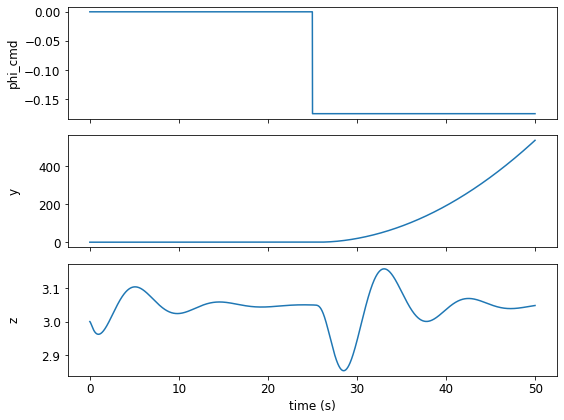

In [6]:
# "The_cmd", "Psi_cmd", "Alt_cmd",, "RPM1", "RPM2", "RPM3", "RPM4"
font = {'size'   : 12}
import matplotlib
from matplotlib import pyplot as plt
matplotlib.rc('font', **font)

keys = ["Phi_cmd", "Y", "Z"]
fig, axs = plt.subplots(len(keys), sharex=True, figsize=(8, len(keys) * 2 ), tight_layout=True)

for i,k in enumerate(keys):
    axs[i].set_ylabel(k.lower())
    axs[i].plot(results["time"], results[k])

# axs[-2].set_ylabel("RPM 1,4")
# axs[-2].plot(results["time"], results["RPM1"])
    
# axs[-1].set_ylabel("RPM 2,3")
# axs[-1].plot(results["time"], results["RPM2"])
fig.align_labels()
plt.xlabel('time (s)')
plt.savefig('line_plot.pdf') 
plt.show()

Plot the inputs

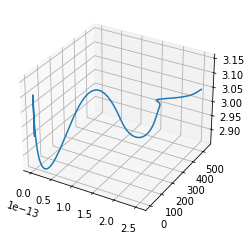

In [58]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(results["X"], results["Y"], results["Z"], zdir='z')

A log entry is written each time a ModelResponse object is received from the FMUModelHandler instance. Having a priori knowledge about how much the simulated time advances between two consecutive ModelResponses (in this case, approximately 0.001 seconds) allows to define the following:

t = simulated time elapsed since beginning of the experiment

tau = wall-clock time elapsed since beginning of the experiment

t/tau = real-time performance coefficient

Let's plot the t/tau metric for the current demo (slight preprocessing involved)

In [19]:
results['timestamp'] = pd.to_datetime(results['timestamp'])

In [20]:
results['elapsed_wallclock'] = pd.to_timedelta(results['timestamp']).dt.total_seconds() - \
pd.to_timedelta(results['timestamp']).dt.total_seconds().iloc[0]

c:\users\sajad20h\appdata\local\programs\python\python37\lib\site-packages\pandas\util\_decorators.py:208: FutureWarning: Passing datetime64-dtype data to TimedeltaIndex is deprecated, will raise a TypeError in a future version
  return func(*args, **kwargs)


In [21]:
results.head()

,timestamp,Phi_cmd,The_cmd,Psi_cmd,Alt_cmd,P,Q,R,Phi,The,Psi,X,Y,Z,RPM1,RPM2,RPM3,RPM4,time,elapsed_wallclock
0,2020-12-08 12:39:40.412692,0.00000,0.00000,0.00000,3.04800,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.99987,3912.63104,3912.63104,3912.63104,3912.63104,0.00000,0.00000
1,2020-12-08 12:39:40.435629,0.00000,0.00000,0.00000,3.04800,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.99941,3959.58653,3959.58653,3959.58653,3959.58653,0.02000,0.02294
2,2020-12-08 12:39:40.445603,0.00000,0.00000,0.00000,3.04800,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.99868,3996.63229,3996.63229,3996.63229,3996.63229,0.04000,0.03291
3,2020-12-08 12:39:40.453582,0.00000,0.00000,0.00000,3.04800,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.99773,4025.87311,4025.87311,4025.87311,4025.87311,0.06000,0.04089
4,2020-12-08 12:39:40.461561,0.00000,0.00000,0.00000,3.04800,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.99663,4048.94051,4048.94051,4048.94051,4048.94051,0.08000,0.04887


In [22]:
t_per_tau = results["time"].divide(results["elapsed_wallclock"])

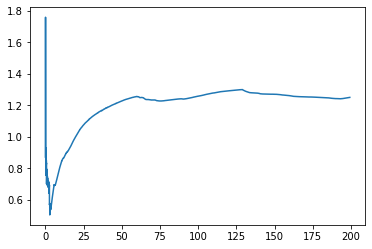

In [23]:
plt.plot(results["time"], t_per_tau)
plt.show()

## Discussion

Obviously the performance is very poor with the database operations as the bottleneck. Things could be improved substantially by introducing another means of accessing the input data, e.g., a TCP socket or similar.

See the original publication in [1] for further discussion